In [28]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import math
from scipy.stats import t
from scipy.stats import uniform
from scipy.stats import ttest_1samp # library for p-value estimation
import ruptures as rpt # library for change point detection
%matplotlib inline
%run ./master_experminet-functions.ipynb
# load functions for the creation of the different distributions

In [29]:
# define arms
def quick_sort(df):
    sorted_df = df.sort_values(kind="quicksort")
    return sorted_df
def merge_sort(df):
    sorted_df = df.sort_values(kind="mergesort")
    return sorted_df
def heap_sort(df):
    sorted_df = df.sort_values(kind="heapsort")
    return sorted_df

In [30]:
n_samples = 100000
choices = [quick_sort,merge_sort,heap_sort]
choices_names = ["quick_sort","merge_sort","heap_sort"]
dist_types = ["Uniform","Normal","Uniform_Sorted","Uniform_Reverse_Sorted","Uniform_Nearly_Sorted","Zipf"]

In [31]:
#list_distributions = 1000*["Uniform_Sorted"] + 1000*["Normal"] # at first quick sort -> then merge sort 
list_distributions = 500*["Uniform"] +  500*["Uniform_Sorted"] + 500*["Normal"] + 500*["Uniform_Reverse_Sorted"]
#list_distributions = 100*["Uniform"] +  100*["Uniform_Sorted"] + 100*["Normal"] + 100*["Uniform_Reverse_Sorted"]

In [32]:
def plot_history(rewards,cum_rewards,sample_count, sample_mean):

    q_values = {"quick_sort": sample_mean[0], "merge_sort": sample_mean[1], "heap_sort":sample_mean[2]} ## 
    arm_counts = {"quick_sort": sample_count[0], "merge_sort": sample_count[1], "heap_sort":sample_count[2]} ##
    print("Average rewards per algo", q_values)
    print("Count per chosen algo", arm_counts)
    
    fig = plt.figure(figsize=[30,8])
    ax2 = fig.add_subplot(121)
    ax2.plot(cum_rewards, label="avg rewards")
    ax2.set_title("Cummulative Rewards")
    labels = list(arm_counts.keys())
    ax3 = fig.add_subplot(122)
    ax3.bar([i for i in range(len(arm_counts.values()))], arm_counts.values(), label=[i for i in ((list(arm_counts.keys())))])
    ax3.set_title("Chosen Actions")
    plt.show() 

In [33]:
# help function to return the humber of consecutive elements in a list 
def count_consec(listrand):
    count=1
    consec_list=[]
    for i in range(len(listrand[:-1])):
        if listrand[i]+1 == listrand[i+1]:
            count+=1
        else:
            consec_list.append(count)
            count=1

    # Account for the last iteration
    consec_list.append(count)     

    return consec_list

In [34]:
def TS_stationary(list_distributions, n_samples, var_multiplier = 5): # initialize
    total_reward = 0
    num_choices = len(choices)
    sample_count = [0 for i in range(num_choices)]
    sample_rewards = [0 for i in range(num_choices)]
    sample_mean = [0.0 for i in range(num_choices)]
    sample_var = [0.0 for i in range(num_choices)]
    arm_rewards = {0: [], 1:[], 2:[]}
    rewards = []
    cum_rewards = []
    var_multiplier = 5
    list_iteration_results = []

    len_result = 1

    for n, elem in enumerate(list_distributions):
        dist_type = elem
        distribion = create_df_distribution(n_samples=n_samples, dist_type=dist_type)
        print("\n")
        print("Iteration:", n)
        theta = {}
        for i in range(len(choices)):
            if sample_count[i] >= 2:
                theta[i] = t.rvs(df=sample_count[i]-1,loc=sample_mean[i],scale=np.sqrt(sample_var[i]/sample_count[i])*var_multiplier)
                print(choices_names[i],"Theta", theta[i])

            else:
                print("Less than two values for",choices_names[i])
                theta[i] = uniform.rvs(loc=0, scale=1)
                print(choices_names[i],"Theta", theta[i])

        choice = np.argmin([theta[i] for i in range(len(choices))])
        alg = choices[choice]
        alg_name = choices_names[choice]
        start_time = time.perf_counter() #time.time()
        sorted_dist = alg(distribion[dist_type])
        reward = ((time.perf_counter() - start_time))*(1)
        print("\n")
        print("Chosen algorithm is: ", alg_name, "with reward:", reward)
        arm_rewards[choice].append(reward)
        sample_count[choice] += 1
        sample_rewards[choice] += reward
        sample_mean[choice] = np.mean(arm_rewards[choice])
        sample_var[choice] = np.var(arm_rewards[choice]).astype('float64')
        print("Sample mean is: ", sample_mean[choice], "Sample variance is:", sample_var[choice])
        total_reward += reward
        rewards.append(reward)
        cum_rewards.append(sum(rewards)/len(rewards))
        array_rewards = np.array(rewards)

    list_iteration_results.extend([sample_mean, sample_count,rewards,cum_rewards,n])
    return list_iteration_results, total_reward

In [35]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

In [36]:
def plot_rewards_distribution(arm_rewards, bins = 20):
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(14, 3))
    axes[0].hist(arm_rewards[0], bins, alpha = 0.5, label='quick sort')
    axes[0].set_title("rewards distribution for quick sort")
    axes[1].hist(arm_rewards[1], bins, alpha = 0.5, label='merge sort')
    axes[1].set_title("rewards distribution for merge sort")
    axes[2].hist(arm_rewards[2], bins, alpha = 0.5, label='heap sort')
    axes[2].set_title("rewards distribution for heap sort")
    plt.show()

In [37]:
def plot_rewards_distribution_together(arm_rewards, bins = 20):
    plt.hist(arm_rewards[0], bins, alpha = 0.5, label='quick sort')
    plt.hist(arm_rewards[1], bins, alpha = 0.5, label='merge sort')
    plt.hist(arm_rewards[2], bins, alpha = 0.5, label='heap sort')
    plt.legend(loc='upper right')
    plt.show()

In [38]:
import bayesian_changepoint_detection.online_changepoint_detection as oncd
from functools import partial
import matplotlib.cm as cm

## Thompson Sampling

In [39]:
def ts_quantile(list_distributions, n_samples, var_multiplier = 1, num_consec_elem=1):
    total_reward = 0
    num_choices = len(choices)
    sample_count = [0 for i in range(num_choices)]
    sample_rewards = [0 for i in range(num_choices)]
    sample_mean = [0.0 for i in range(num_choices)]
    sample_var = [0.0 for i in range(num_choices)]
    arm_rewards = {0: [], 1:[], 2:[]}
    arm_rewards_temp = {0: [], 1:[], 2:[]}
    rewards = []
    cum_rewards = []
    var_multiplier = var_multiplier
    n_consecutive_list = [] # this list is to check whether
    list_iteration_results = []
    num_consec_elem = num_consec_elem

    for n, elem in enumerate(list_distributions):
        dist_type = elem
        distribion = create_df_distribution(n_samples=n_samples, dist_type=dist_type)
        print("\n")
        print("Iteration:", n)
        theta = {}
        for i in range(len(choices)):
            if sample_count[i] >= 2:
                theta[i] = t.rvs(df=sample_count[i]-1,loc=sample_mean[i],scale=np.sqrt(sample_var[i]/sample_count[i])*var_multiplier)
                print(choices_names[i],"Theta", theta[i])

            else:
                print("Less than two values for",choices_names[i])
                theta[i] = uniform.rvs(loc=0, scale=0.1)
                print(choices_names[i],"Theta", theta[i])

        choice = np.argmin([theta[i] for i in range(len(choices))])
        alg = choices[choice]
        alg_name = choices_names[choice]
        start_time = time.perf_counter()
        sorted_dist = alg(distribion[dist_type])
        reward = ((time.perf_counter() - start_time))*(1)
        print("\n")
        print("Chosen algorithm is: ", alg_name, "with reward:", reward)
        arm_rewards[choice].append(reward)
        arm_rewards_temp[choice].append(reward)
        sample_count[choice] += 1
        sample_rewards[choice] += reward
        sample_mean[choice] = np.mean(arm_rewards_temp[choice])
        sample_var[choice] = np.var(arm_rewards_temp[choice]).astype('float64')
        print("Sample mean is: ", sample_mean[choice], "Sample variance is:", sample_var[choice])
        total_reward += reward
        rewards.append(reward)
        cum_rewards.append(sum(rewards)/len(rewards))
        if len(rewards)>10:
            if reward < np.quantile(rewards[:-1], 0.025) or reward > np.quantile(rewards[:-1], 0.975):
                n_consecutive_list.append(n)
                if any(i >= num_consec_elem for i in count_consec(n_consecutive_list)):
                    print("RESTART EXPERIMENT")
                    list_iteration_results.append([sample_mean, sample_count,rewards,cum_rewards,n])
                    sample_count = [0 for i in range(num_choices)]
                    sample_rewards = [0 for i in range(num_choices)]
                    sample_mean = [0.0 for i in range(num_choices)]
                    sample_var = [0.0 for i in range(num_choices)]
                    arm_rewards_temp = {0: [], 1:[], 2:[]}
                    rewards = []
                    cum_rewards = []
                    n_consecutive_list = []
    list_iteration_results.append([sample_mean, sample_count,rewards,cum_rewards,n])
    return list_iteration_results, total_reward, arm_rewards

## Single outlier restarts the expriment

In [40]:
list_iteration_results_1, total_reward_1, arm_rewards_1 = ts_quantile(list_distributions, n_samples)



Iteration: 0
Less than two values for quick_sort
quick_sort Theta 0.07284430921908143
Less than two values for merge_sort
merge_sort Theta 0.07938610064124688
Less than two values for heap_sort
heap_sort Theta 0.060834628770305633


Chosen algorithm is:  heap_sort with reward: 0.035531100002117455
Sample mean is:  0.035531100002117455 Sample variance is: 0.0


Iteration: 1
Less than two values for quick_sort
quick_sort Theta 0.04127855022275312
Less than two values for merge_sort
merge_sort Theta 0.029397380438022036
Less than two values for heap_sort
heap_sort Theta 0.0562206487462105


Chosen algorithm is:  merge_sort with reward: 0.023622100008651614
Sample mean is:  0.023622100008651614 Sample variance is: 0.0


Iteration: 2
Less than two values for quick_sort
quick_sort Theta 0.036703902084149476
Less than two values for merge_sort
merge_sort Theta 0.04238632096620246
Less than two values for heap_sort
heap_sort Theta 0.08183432737741723


Chosen algorithm is:  quick_sort with r

Iteration: 26
quick_sort Theta 0.016393993240416037
Less than two values for merge_sort
merge_sort Theta 0.025287745657088447
Less than two values for heap_sort
heap_sort Theta 0.04977953052258043


Chosen algorithm is:  quick_sort with reward: 0.023103800005628727
Sample mean is:  0.0200379444464084 Sample variance is: 6.401536805893555e-06


Iteration: 27
quick_sort Theta 0.019670777596831952
Less than two values for merge_sort
merge_sort Theta 0.07983577444605404
Less than two values for heap_sort
heap_sort Theta 0.04632647316675697


Chosen algorithm is:  quick_sort with reward: 0.018405599999823608
Sample mean is:  0.019874710001749916 Sample variance is: 6.001192480610858e-06


Iteration: 28
quick_sort Theta 0.01898362696928503
Less than two values for merge_sort
merge_sort Theta 0.07635434137957144
Less than two values for heap_sort
heap_sort Theta 0.009311855941128112


Chosen algorithm is:  heap_sort with reward: 0.028410099999746308
Sample mean is:  0.0278951500004041 Sample 


Chosen algorithm is:  quick_sort with reward: 0.0301298999984283
Sample mean is:  0.02231376000272576 Sample variance is: 1.927995831074458e-05


Iteration: 52
quick_sort Theta 0.021667750841486547
Less than two values for merge_sort
merge_sort Theta 0.042203575200229874
Less than two values for heap_sort
heap_sort Theta 0.07340878975924628


Chosen algorithm is:  quick_sort with reward: 0.025572300000931136
Sample mean is:  0.022856850002426654 Sample variance is: 1.754136566449608e-05


Iteration: 53
quick_sort Theta 0.022722938945298914
Less than two values for merge_sort
merge_sort Theta 0.09377652230264721
Less than two values for heap_sort
heap_sort Theta 0.05674002145636821


Chosen algorithm is:  quick_sort with reward: 0.02955219999421388
Sample mean is:  0.023813328572681973 Sample variance is: 2.0524563815999726e-05


Iteration: 54
quick_sort Theta 0.020254884970529644
Less than two values for merge_sort
merge_sort Theta 0.07295270364927779
Less than two values for heap_sor


Chosen algorithm is:  heap_sort with reward: 0.026174600003287196
Sample mean is:  0.026174600003287196 Sample variance is: 0.0


Iteration: 80
Less than two values for quick_sort
quick_sort Theta 0.06450258123953584
Less than two values for merge_sort
merge_sort Theta 0.07614092522578209
Less than two values for heap_sort
heap_sort Theta 0.0324314484371277


Chosen algorithm is:  heap_sort with reward: 0.028816200006986037
Sample mean is:  0.027495400005136617 Sample variance is: 1.7445126448854288e-06


Iteration: 81
Less than two values for quick_sort
quick_sort Theta 0.09911145955125897
Less than two values for merge_sort
merge_sort Theta 0.014685015316932271
heap_sort Theta 0.027464479399330815


Chosen algorithm is:  merge_sort with reward: 0.02016919999732636
Sample mean is:  0.02016919999732636 Sample variance is: 0.0


Iteration: 82
Less than two values for quick_sort
quick_sort Theta 0.006188106802584359
Less than two values for merge_sort
merge_sort Theta 0.0776021505855948


Iteration: 106
Less than two values for quick_sort
quick_sort Theta 0.061528939765988326
Less than two values for merge_sort
merge_sort Theta 0.028680485884499552
Less than two values for heap_sort
heap_sort Theta 0.009922581420543454


Chosen algorithm is:  heap_sort with reward: 0.03293259999190923
Sample mean is:  0.03293259999190923 Sample variance is: 0.0


Iteration: 107
Less than two values for quick_sort
quick_sort Theta 0.0548578287127674
Less than two values for merge_sort
merge_sort Theta 0.06168024952154996
Less than two values for heap_sort
heap_sort Theta 0.09049998190991791


Chosen algorithm is:  quick_sort with reward: 0.01596409999183379
Sample mean is:  0.01596409999183379 Sample variance is: 0.0


Iteration: 108
Less than two values for quick_sort
quick_sort Theta 0.010593616362611458
Less than two values for merge_sort
merge_sort Theta 0.06628722061998069
Less than two values for heap_sort
heap_sort Theta 0.04243181229131794


Chosen algorithm is:  quick_sort with


Iteration: 132
quick_sort Theta 0.026344260346726486
merge_sort Theta 0.058504755076015304
heap_sort Theta 0.035685272444658085


Chosen algorithm is:  quick_sort with reward: 0.019085599997197278
Sample mean is:  0.024928485712734982 Sample variance is: 3.854043206802046e-05


Iteration: 133
quick_sort Theta 0.024776391652151345
merge_sort Theta 0.032919650046767696
heap_sort Theta -0.015031220619644604


Chosen algorithm is:  heap_sort with reward: 0.03160409998963587
Sample mean is:  0.03576742499717511 Sample variance is: 3.6153764878030485e-05


Iteration: 134
quick_sort Theta 0.026993429520528446
merge_sort Theta 0.03504125823235664
heap_sort Theta 0.03837038543964865


Chosen algorithm is:  quick_sort with reward: 0.01911629999813158
Sample mean is:  0.024201962498409557 Sample variance is: 3.741772992619414e-05


Iteration: 135
quick_sort Theta 0.022684718649730335
merge_sort Theta 0.0367690434950446
heap_sort Theta 0.040974827233327224


Chosen algorithm is:  quick_sort with 


Iteration: 161
quick_sort Theta 0.017973770633613488
Less than two values for merge_sort
merge_sort Theta 0.013994387520016595
heap_sort Theta 0.02853319786788409


Chosen algorithm is:  merge_sort with reward: 0.02179519999481272
Sample mean is:  0.022409299992432352 Sample variance is: 3.771188070764328e-07


Iteration: 162
quick_sort Theta 0.017760026437233994
merge_sort Theta 0.021737102423409285
heap_sort Theta 0.028220547654571968


Chosen algorithm is:  quick_sort with reward: 0.016852999993716367
Sample mean is:  0.017400583332346287 Sample variance is: 4.846063870744924e-07


Iteration: 163
quick_sort Theta 0.01683432596194554
merge_sort Theta 0.022346118413958768
heap_sort Theta 0.028395790158824555


Chosen algorithm is:  quick_sort with reward: 0.01732579999952577
Sample mean is:  0.017389899999086213 Sample variance is: 4.160617048639826e-07


Iteration: 164
quick_sort Theta 0.017718013612998264
merge_sort Theta 0.02328576525712442
heap_sort Theta 0.028514107025723507


C


Iteration: 188
quick_sort Theta 0.019948535374682018
merge_sort Theta 0.019087953759545966
heap_sort Theta 0.0317949118704847


Chosen algorithm is:  merge_sort with reward: 0.020001199998660013
Sample mean is:  0.019356880002305843 Sample variance is: 9.242746152006935e-07


Iteration: 189
quick_sort Theta 0.01976531361667675
merge_sort Theta 0.01911366088005875
heap_sort Theta 0.03419823973613179


Chosen algorithm is:  merge_sort with reward: 0.01729160000104457
Sample mean is:  0.019012666668762297 Sample variance is: 1.3626429409463776e-06
RESTART EXPERIMENT


Iteration: 190
Less than two values for quick_sort
quick_sort Theta 0.06522690630618698
Less than two values for merge_sort
merge_sort Theta 0.05499777688333386
Less than two values for heap_sort
heap_sort Theta 0.07725618655456279


Chosen algorithm is:  merge_sort with reward: 0.022069899991038255
Sample mean is:  0.022069899991038255 Sample variance is: 0.0


Iteration: 191
Less than two values for quick_sort
quick_sort 


Iteration: 217
Less than two values for quick_sort
quick_sort Theta 0.019118562008867704
Less than two values for merge_sort
merge_sort Theta 0.025366463271728756
Less than two values for heap_sort
heap_sort Theta 0.07698815730175916


Chosen algorithm is:  quick_sort with reward: 0.017254899998079054
Sample mean is:  0.017254899998079054 Sample variance is: 0.0


Iteration: 218
Less than two values for quick_sort
quick_sort Theta 0.048208389083163286
Less than two values for merge_sort
merge_sort Theta 0.07631249025361925
Less than two values for heap_sort
heap_sort Theta 0.07529887811991043


Chosen algorithm is:  quick_sort with reward: 0.01642559999891091
Sample mean is:  0.016840249998494983 Sample variance is: 1.7193462215507036e-07


Iteration: 219
quick_sort Theta 0.01686097197044424
Less than two values for merge_sort
merge_sort Theta 0.010360427466175437
Less than two values for heap_sort
heap_sort Theta 0.03591391093766817


Chosen algorithm is:  merge_sort with reward: 0.0

quick_sort Theta 0.019352159320522373
Less than two values for merge_sort
merge_sort Theta 0.026220860044633545
heap_sort Theta 0.02410043477712007


Chosen algorithm is:  quick_sort with reward: 0.01949109999986831
Sample mean is:  0.018937010002264287 Sample variance is: 3.0959245123430037e-06


Iteration: 243
quick_sort Theta 0.018791811342512964
Less than two values for merge_sort
merge_sort Theta 0.06924382387317818
heap_sort Theta 0.02832483590817106


Chosen algorithm is:  quick_sort with reward: 0.01605839999683667
Sample mean is:  0.01867531818358905 Sample variance is: 3.4993029090182675e-06


Iteration: 244
quick_sort Theta 0.019400075451603046
Less than two values for merge_sort
merge_sort Theta 0.09213985524341878
heap_sort Theta 0.027920564565017958


Chosen algorithm is:  quick_sort with reward: 0.01569020000169985
Sample mean is:  0.01842655833509828 Sample variance is: 3.888390417699385e-06


Iteration: 245
quick_sort Theta 0.01833836876069647
Less than two values for 



Iteration: 270
quick_sort Theta 0.017548146597763926
merge_sort Theta 0.01914324202574263
heap_sort Theta 0.026239177211624592


Chosen algorithm is:  quick_sort with reward: 0.01823560000048019
Sample mean is:  0.017447175002113607 Sample variance is: 2.267961044119874e-06


Iteration: 271
quick_sort Theta 0.017886040019847966
merge_sort Theta 0.019048200048954477
heap_sort Theta 0.025898904618564405


Chosen algorithm is:  quick_sort with reward: 0.018303199991350994
Sample mean is:  0.01751302307820879 Sample variance is: 2.1455341317697444e-06


Iteration: 272
quick_sort Theta 0.01768990930078585
merge_sort Theta 0.019428112901850727
heap_sort Theta 0.028699554398594063


Chosen algorithm is:  quick_sort with reward: 0.019807499993476085
Sample mean is:  0.017676914286442167 Sample variance is: 2.3414659595567465e-06


Iteration: 273
quick_sort Theta 0.01669404289600344
merge_sort Theta 0.0197933827550767
heap_sort Theta 0.02804741483942541


Chosen algorithm is:  quick_sort with


Chosen algorithm is:  quick_sort with reward: 0.018761100000119768
Sample mean is:  0.01756884285610535 Sample variance is: 7.734802060945539e-07


Iteration: 303
quick_sort Theta 0.01765687183423083
merge_sort Theta 0.021098189139756373
heap_sort Theta 0.026301243695504236


Chosen algorithm is:  quick_sort with reward: 0.014677200000733137
Sample mean is:  0.017376066665747203 Sample variance is: 1.2421920929875939e-06
RESTART EXPERIMENT


Iteration: 304
Less than two values for quick_sort
quick_sort Theta 0.023251633706771347
Less than two values for merge_sort
merge_sort Theta 0.09087090090143059
Less than two values for heap_sort
heap_sort Theta 0.06735900602678947


Chosen algorithm is:  quick_sort with reward: 0.015420099996845238
Sample mean is:  0.015420099996845238 Sample variance is: 0.0


Iteration: 305
Less than two values for quick_sort
quick_sort Theta 0.06986753566994243
Less than two values for merge_sort
merge_sort Theta 0.07385482007785579
Less than two values for h



Chosen algorithm is:  merge_sort with reward: 0.023916499994811602
Sample mean is:  0.02268007999518886 Sample variance is: 3.0117038535311538e-05


Iteration: 331
Less than two values for quick_sort
quick_sort Theta 0.09875209005188307
merge_sort Theta 0.020693598474294268
heap_sort Theta 0.031935940969293454


Chosen algorithm is:  merge_sort with reward: 0.021932299991021864
Sample mean is:  0.022555449994494364 Sample variance is: 2.5175195298125178e-05


Iteration: 332
Less than two values for quick_sort
quick_sort Theta 0.0979789269144969
merge_sort Theta 0.02283551318790603
heap_sort Theta 0.03132717815223966


Chosen algorithm is:  merge_sort with reward: 0.021074000003864057
Sample mean is:  0.022343814281547174 Sample variance is: 2.1847476876932422e-05


Iteration: 333
Less than two values for quick_sort
quick_sort Theta 0.05828780942419914
merge_sort Theta 0.02088182174230707
heap_sort Theta 0.0290196758464944


Chosen algorithm is:  merge_sort with reward: 0.026486699993



Chosen algorithm is:  merge_sort with reward: 0.03169089999573771
Sample mean is:  0.023890466666974437 Sample variance is: 3.18284320900065e-05


Iteration: 356
Less than two values for quick_sort
quick_sort Theta 0.05278363542058328
merge_sort Theta 0.02383544325727077
heap_sort Theta 0.025219207070990735


Chosen algorithm is:  merge_sort with reward: 0.022031800006516278
Sample mean is:  0.023425800001859898 Sample variance is: 2.4519069396510877e-05


Iteration: 357
Less than two values for quick_sort
quick_sort Theta 0.09747162125011445
merge_sort Theta 0.021196469620300792
heap_sort Theta 0.030687881920460375


Chosen algorithm is:  merge_sort with reward: 0.018881199997849762
Sample mean is:  0.022516880001057872 Sample variance is: 2.291979778864053e-05


Iteration: 358
Less than two values for quick_sort
quick_sort Theta 0.04067939985902622
merge_sort Theta 0.022239725682398126
heap_sort Theta 0.02535619904274789


Chosen algorithm is:  merge_sort with reward: 0.01906750000



Iteration: 382
quick_sort Theta 0.01794587422477078
merge_sort Theta 0.019593008997529183
heap_sort Theta 0.030290464984159975


Chosen algorithm is:  quick_sort with reward: 0.018314100001589395
Sample mean is:  0.01809132142807357 Sample variance is: 1.5908966214029855e-06


Iteration: 383
quick_sort Theta 0.017779864566294525
merge_sort Theta 0.019708738749751747
heap_sort Theta 0.030191634629919806


Chosen algorithm is:  quick_sort with reward: 0.01706959999864921
Sample mean is:  0.018023206666111947 Sample variance is: 1.549791537802028e-06


Iteration: 384
quick_sort Theta 0.018077314136167928
merge_sort Theta 0.02000246903475052
heap_sort Theta 0.02618167221972108


Chosen algorithm is:  quick_sort with reward: 0.016724599990993738
Sample mean is:  0.017942043748917058 Sample variance is: 1.5517408536031651e-06


Iteration: 385
quick_sort Theta 0.017828517440722905
merge_sort Theta 0.017359644640002198
heap_sort Theta 0.029102832413949446


Chosen algorithm is:  merge_sort w


Chosen algorithm is:  merge_sort with reward: 0.01789909999934025
Sample mean is:  0.018599299997731578 Sample variance is: 4.902800377472136e-07


Iteration: 415
Less than two values for quick_sort
quick_sort Theta 0.07267177106656479
merge_sort Theta 0.024808937571395698
Less than two values for heap_sort
heap_sort Theta 0.006844001730721006


Chosen algorithm is:  heap_sort with reward: 0.026245699991704896
Sample mean is:  0.026245699991704896 Sample variance is: 0.0


Iteration: 416
Less than two values for quick_sort
quick_sort Theta 0.011846849328168109
merge_sort Theta 0.01855080927353049
Less than two values for heap_sort
heap_sort Theta 0.019906586980388143


Chosen algorithm is:  quick_sort with reward: 0.019557599996915087
Sample mean is:  0.019346850000147242 Sample variance is: 4.441556113764668e-08


Iteration: 417
quick_sort Theta 0.019332432549517865
merge_sort Theta 0.020147987518394632
Less than two values for heap_sort
heap_sort Theta 0.03498681595202751


Chosen a


Iteration: 440
quick_sort Theta 0.017095114447279413
Less than two values for merge_sort
merge_sort Theta 0.07245955794301881
heap_sort Theta 0.02664773356681918


Chosen algorithm is:  quick_sort with reward: 0.020102599999518134
Sample mean is:  0.01901689999795053 Sample variance is: 1.1787522883499313e-06


Iteration: 441
quick_sort Theta 0.01901317302259782
Less than two values for merge_sort
merge_sort Theta 0.006519492496128765
heap_sort Theta 0.025370183827761204


Chosen algorithm is:  merge_sort with reward: 0.020543700011330657
Sample mean is:  0.020543700011330657 Sample variance is: 0.0


Iteration: 442
quick_sort Theta 0.017604643367001453
Less than two values for merge_sort
merge_sort Theta 0.0492678889831166
heap_sort Theta 0.026619472526448633


Chosen algorithm is:  quick_sort with reward: 0.015717300004325807
Sample mean is:  0.01819199999954435 Sample variance is: 2.925444238374001e-06


Iteration: 443
quick_sort Theta 0.019027110760047775
Less than two values for 


Chosen algorithm is:  heap_sort with reward: 0.030486200004816055
Sample mean is:  0.030486200004816055 Sample variance is: 0.0


Iteration: 466
quick_sort Theta 0.018080941115851793
Less than two values for merge_sort
merge_sort Theta 0.04966005282525243
Less than two values for heap_sort
heap_sort Theta 0.07443153599647333


Chosen algorithm is:  quick_sort with reward: 0.01672040000266861
Sample mean is:  0.017643799998040777 Sample variance is: 4.886273816492755e-07


Iteration: 467
quick_sort Theta 0.016848623826155016
Less than two values for merge_sort
merge_sort Theta 0.08319809315684634
Less than two values for heap_sort
heap_sort Theta 0.09878433048105029


Chosen algorithm is:  quick_sort with reward: 0.018393000005744398
Sample mean is:  0.0177936399995815 Sample variance is: 4.807100095663173e-07


Iteration: 468
quick_sort Theta 0.017678033435523252
Less than two values for merge_sort
merge_sort Theta 0.07480703238175625
Less than two values for heap_sort
heap_sort Theta


Iteration: 494
Less than two values for quick_sort
quick_sort Theta 0.0005759379846508317
Less than two values for merge_sort
merge_sort Theta 0.014985616268445212
Less than two values for heap_sort
heap_sort Theta 0.006808111133303818


Chosen algorithm is:  quick_sort with reward: 0.02981359999103006
Sample mean is:  0.02981359999103006 Sample variance is: 0.0


Iteration: 495
Less than two values for quick_sort
quick_sort Theta 0.03556388546302263
Less than two values for merge_sort
merge_sort Theta 0.037515225852804784
Less than two values for heap_sort
heap_sort Theta 0.07990683729800856


Chosen algorithm is:  quick_sort with reward: 0.03139569998893421
Sample mean is:  0.030604649989982136 Sample variance is: 6.257601008420792e-07


Iteration: 496
quick_sort Theta 0.03023840361473468
Less than two values for merge_sort
merge_sort Theta 0.04467051444827385
Less than two values for heap_sort
heap_sort Theta 0.010529860054526241


Chosen algorithm is:  heap_sort with reward: 0.045


Iteration: 521
Less than two values for quick_sort
quick_sort Theta 0.08334671434406804
merge_sort Theta 0.005830376848377636
Less than two values for heap_sort
heap_sort Theta 0.09094395988661766


Chosen algorithm is:  merge_sort with reward: 0.01113420000183396
Sample mean is:  0.009063500001502689 Sample variance is: 2.173078811225575e-06


Iteration: 522
Less than two values for quick_sort
quick_sort Theta 0.0012681611289995232
merge_sort Theta 0.009693483465240935
Less than two values for heap_sort
heap_sort Theta 0.06927069001056511


Chosen algorithm is:  quick_sort with reward: 0.011022099992260337
Sample mean is:  0.01101349999953527 Sample variance is: 7.395987487120258e-11


Iteration: 523
quick_sort Theta 0.011050395978870612
merge_sort Theta 0.007197682643553408
Less than two values for heap_sort
heap_sort Theta 0.0027305968113976566


Chosen algorithm is:  heap_sort with reward: 0.01784649999171961
Sample mean is:  0.01782054999785032 Sample variance is: 6.7340218181617



Chosen algorithm is:  quick_sort with reward: 0.008943700013333
Sample mean is:  0.01038020000560209 Sample variance is: 1.5672141831346548e-06


Iteration: 548
quick_sort Theta 0.01085734459378379
Less than two values for merge_sort
merge_sort Theta 0.08076806624532887
Less than two values for heap_sort
heap_sort Theta 0.02651767451142281


Chosen algorithm is:  quick_sort with reward: 0.011362200006260537
Sample mean is:  0.010543866672378499 Sample variance is: 1.439945708347377e-06


Iteration: 549
quick_sort Theta 0.011190054410014808
Less than two values for merge_sort
merge_sort Theta 0.028607598998352135
Less than two values for heap_sort
heap_sort Theta 0.054107654489997395


Chosen algorithm is:  quick_sort with reward: 0.009293600000091828
Sample mean is:  0.010365257147766118 Sample variance is: 1.4256473522770314e-06


Iteration: 550
quick_sort Theta 0.010491496036534083
Less than two values for merge_sort
merge_sort Theta 0.04161038207492094
Less than two values for hea

Iteration: 574
Less than two values for quick_sort
quick_sort Theta 0.09322202539815691
merge_sort Theta 0.008005735212108407
heap_sort Theta 0.016215545155172654


Chosen algorithm is:  merge_sort with reward: 0.008190900000045076
Sample mean is:  0.007902350000222214 Sample variance is: 1.3824360868317176e-07


Iteration: 575
Less than two values for quick_sort
quick_sort Theta 0.07334105673148138
merge_sort Theta 0.00785664521415498
heap_sort Theta 0.022095406998525836


Chosen algorithm is:  merge_sort with reward: 0.01191199998720549
Sample mean is:  0.008475157141219825 Sample variance is: 2.0871426463955748e-06


Iteration: 576
Less than two values for quick_sort
quick_sort Theta 0.06173551271725907
merge_sort Theta 0.008030122257769109
heap_sort Theta 0.018622164680887343


Chosen algorithm is:  merge_sort with reward: 0.007175299993832596
Sample mean is:  0.008312674997796421 Sample variance is: 2.0110529441163727e-06
RESTART EXPERIMENT


Iteration: 577
Less than two values fo


Chosen algorithm is:  merge_sort with reward: 0.007927599988761358
Sample mean is:  0.00881154999951832 Sample variance is: 2.5386804379726823e-06


Iteration: 601
quick_sort Theta 0.010540829672986472
merge_sort Theta 0.011007555346655627
Less than two values for heap_sort
heap_sort Theta 0.012961169552688646


Chosen algorithm is:  quick_sort with reward: 0.01317370000469964
Sample mean is:  0.011460166667044783 Sample variance is: 1.4690307563448119e-06


Iteration: 602
quick_sort Theta 0.01125378270769722
merge_sort Theta 0.008845860172468748
Less than two values for heap_sort
heap_sort Theta 0.02555824814278115


Chosen algorithm is:  merge_sort with reward: 0.009645300000556745
Sample mean is:  0.008887345454158176 Sample variance is: 2.3653408166885186e-06


Iteration: 603
quick_sort Theta 0.011228558535202018
merge_sort Theta 0.00880244714837892
Less than two values for heap_sort
heap_sort Theta 0.03965137610211115


Chosen algorithm is:  merge_sort with reward: 0.006974699994



Chosen algorithm is:  quick_sort with reward: 0.01124990000971593
Sample mean is:  0.011638045456493273 Sample variance is: 7.042280115985012e-06


Iteration: 627
quick_sort Theta 0.012603464356610878
Less than two values for merge_sort
merge_sort Theta 0.059981254244930185
Less than two values for heap_sort
heap_sort Theta 0.05041037523138484


Chosen algorithm is:  quick_sort with reward: 0.009113000007346272
Sample mean is:  0.01142762500239769 Sample variance is: 6.942467882172635e-06


Iteration: 628
quick_sort Theta 0.010830895510248403
Less than two values for merge_sort
merge_sort Theta 0.014572430128823722
Less than two values for heap_sort
heap_sort Theta 0.0822070203696538


Chosen algorithm is:  quick_sort with reward: 0.010181399993598461
Sample mean is:  0.011331761540182365 Sample variance is: 6.518709531891189e-06


Iteration: 629
quick_sort Theta 0.010131017229416683
Less than two values for merge_sort
merge_sort Theta 0.03780265316627562
Less than two values for hea


Iteration: 652
Less than two values for quick_sort
quick_sort Theta 0.06820379828877178
merge_sort Theta 0.00729631204439825
Less than two values for heap_sort
heap_sort Theta 0.074840073559298


Chosen algorithm is:  merge_sort with reward: 0.008500500000081956
Sample mean is:  0.007537983333653149 Sample variance is: 1.0782718286359388e-06


Iteration: 653
Less than two values for quick_sort
quick_sort Theta 0.07421824963048355
merge_sort Theta 0.007503181781983915
Less than two values for heap_sort
heap_sort Theta 0.03474985121395141


Chosen algorithm is:  merge_sort with reward: 0.006162399993627332
Sample mean is:  0.007341471427935176 Sample variance is: 1.155934570507121e-06


Iteration: 654
Less than two values for quick_sort
quick_sort Theta 0.09570624280477909
merge_sort Theta 0.007369328189322236
Less than two values for heap_sort
heap_sort Theta 0.060454417981408895


Chosen algorithm is:  merge_sort with reward: 0.007577899988973513
Sample mean is:  0.007371024998064968 

Sample mean is:  0.009079949999431847 Sample variance is: 2.8945636192031656e-06


Iteration: 678
Less than two values for quick_sort
quick_sort Theta 0.07979404922498542
merge_sort Theta 0.00940114874880663
Less than two values for heap_sort
heap_sort Theta 0.08953003861614912


Chosen algorithm is:  merge_sort with reward: 0.010191400011535734
Sample mean is:  0.009302240001852624 Sample variance is: 2.5133022760674496e-06


Iteration: 679
Less than two values for quick_sort
quick_sort Theta 0.07640904978034947
merge_sort Theta 0.01014526133972595
Less than two values for heap_sort
heap_sort Theta 0.08571728058834681


Chosen algorithm is:  merge_sort with reward: 0.010332699996070005
Sample mean is:  0.009473983334222188 Sample variance is: 2.2418974244565534e-06


Iteration: 680
Less than two values for quick_sort
quick_sort Theta 0.0627529535555055
merge_sort Theta 0.008857804386218516
Less than two values for heap_sort
heap_sort Theta 0.005214916954365868


Chosen algorithm is:  


Iteration: 704
quick_sort Theta 0.009347005220918912
Less than two values for merge_sort
merge_sort Theta 0.09787195611821625
heap_sort Theta 0.014100859594887386


Chosen algorithm is:  quick_sort with reward: 0.008629699994344264
Sample mean is:  0.009109183338296134 Sample variance is: 1.1033579592288024e-06


Iteration: 705
quick_sort Theta 0.009605654131638124
Less than two values for merge_sort
merge_sort Theta 0.01750271936329899
heap_sort Theta 0.013867794715527713


Chosen algorithm is:  quick_sort with reward: 0.011271299998043105
Sample mean is:  0.009418057146831416 Sample variance is: 1.5181535712192263e-06


Iteration: 706
quick_sort Theta 0.009567687374986762
Less than two values for merge_sort
merge_sort Theta 0.04490184508455147
heap_sort Theta 0.013651724413422968


Chosen algorithm is:  quick_sort with reward: 0.009047999992617406
Sample mean is:  0.009371800002554664 Sample variance is: 1.3433624385933045e-06


Iteration: 707
quick_sort Theta 0.009246141499672237
L



Chosen algorithm is:  merge_sort with reward: 0.008929399991757236
Sample mean is:  0.008929399991757236 Sample variance is: 0.0


Iteration: 734
quick_sort Theta 0.01181632184209531
Less than two values for merge_sort
merge_sort Theta 0.008397970357499463
heap_sort Theta 0.019900374439251998


Chosen algorithm is:  merge_sort with reward: 0.010579499998129904
Sample mean is:  0.00975444999494357 Sample variance is: 6.807075077577696e-07


Iteration: 735
quick_sort Theta 0.00992945798181137
merge_sort Theta 0.00979431900080293
heap_sort Theta 0.021208412528605888


Chosen algorithm is:  merge_sort with reward: 0.008497299990267493
Sample mean is:  0.009335399993384877 Sample variance is: 8.050108127845267e-07


Iteration: 736
quick_sort Theta 0.010722787434566425
merge_sort Theta 0.009659933158821986
heap_sort Theta 0.02121994900039394


Chosen algorithm is:  merge_sort with reward: 0.009020999990752898
Sample mean is:  0.009256799992726883 Sample variance is: 6.222919898987055e-07




Iteration: 761
Less than two values for quick_sort
quick_sort Theta 0.06089885207122711
Less than two values for merge_sort
merge_sort Theta 0.0519466260766293
Less than two values for heap_sort
heap_sort Theta 0.06394783588349152


Chosen algorithm is:  merge_sort with reward: 0.0087059999932535
Sample mean is:  0.0087059999932535 Sample variance is: 0.0


Iteration: 762
Less than two values for quick_sort
quick_sort Theta 0.018309530590194245
Less than two values for merge_sort
merge_sort Theta 0.0020207803910603284
Less than two values for heap_sort
heap_sort Theta 0.025318825968921113


Chosen algorithm is:  merge_sort with reward: 0.007438900007400662
Sample mean is:  0.00807245000032708 Sample variance is: 4.013855935370653e-07


Iteration: 763
Less than two values for quick_sort
quick_sort Theta 0.02834558403890052
merge_sort Theta 0.006945311334640912
Less than two values for heap_sort
heap_sort Theta 0.09918673389243027


Chosen algorithm is:  merge_sort with reward: 0.008426


Chosen algorithm is:  merge_sort with reward: 0.008279799993033521
Sample mean is:  0.008712911763509242 Sample variance is: 2.5529335846873092e-06


Iteration: 789
Less than two values for quick_sort
quick_sort Theta 0.026432868660273057
merge_sort Theta 0.00844282052249241
Less than two values for heap_sort
heap_sort Theta 0.08918670159104589


Chosen algorithm is:  merge_sort with reward: 0.008651999989524484
Sample mean is:  0.008709527776065644 Sample variance is: 2.4112986144008837e-06


Iteration: 790
Less than two values for quick_sort
quick_sort Theta 0.07454394989595306
merge_sort Theta 0.009370656813704331
Less than two values for heap_sort
heap_sort Theta 0.05504087747923027


Chosen algorithm is:  merge_sort with reward: 0.008026499999687076
Sample mean is:  0.008673578945729931 Sample variance is: 2.30764989225647e-06


Iteration: 791
Less than two values for quick_sort
quick_sort Theta 0.020649366175788587
merge_sort Theta 0.008593044475978168
Less than two values for h


Iteration: 816
quick_sort Theta 0.010469492332972395
Less than two values for merge_sort
merge_sort Theta 0.04205101635489007
Less than two values for heap_sort
heap_sort Theta 0.011872077984050445


Chosen algorithm is:  quick_sort with reward: 0.010762799996882677
Sample mean is:  0.009862877776160732 Sample variance is: 1.0861525617633408e-06


Iteration: 817
quick_sort Theta 0.010476786072768944
Less than two values for merge_sort
merge_sort Theta 0.028767411297666468
Less than two values for heap_sort
heap_sort Theta 0.003748982564630221


Chosen algorithm is:  heap_sort with reward: 0.019419600008404814
Sample mean is:  0.019419600008404814 Sample variance is: 0.0
RESTART EXPERIMENT


Iteration: 818
Less than two values for quick_sort
quick_sort Theta 0.09247064293435359
Less than two values for merge_sort
merge_sort Theta 0.07966090427923649
Less than two values for heap_sort
heap_sort Theta 0.05850621283530619


Chosen algorithm is:  heap_sort with reward: 0.01863479999883566



Iteration: 842
Less than two values for quick_sort
quick_sort Theta 0.08237967669187914
merge_sort Theta 0.007180393610046213
Less than two values for heap_sort
heap_sort Theta 0.021616706561146826


Chosen algorithm is:  merge_sort with reward: 0.008802000011201017
Sample mean is:  0.00808237142960674 Sample variance is: 4.951331104633368e-07


Iteration: 843
Less than two values for quick_sort
quick_sort Theta 0.0405891773132568
merge_sort Theta 0.008552334617363178
Less than two values for heap_sort
heap_sort Theta 0.0625861133957159


Chosen algorithm is:  merge_sort with reward: 0.008049299998674542
Sample mean is:  0.008078237500740215 Sample variance is: 4.3336109723053417e-07


Iteration: 844
Less than two values for quick_sort
quick_sort Theta 0.09816576403984312
merge_sort Theta 0.00773683122618823
Less than two values for heap_sort
heap_sort Theta 0.07933670962815317


Chosen algorithm is:  merge_sort with reward: 0.007448500007740222
Sample mean is:  0.00800826666818466 Sa


Iteration: 868
Less than two values for quick_sort
quick_sort Theta 0.005504618550595664
merge_sort Theta 0.007974383295987614
Less than two values for heap_sort
heap_sort Theta 0.060319730431198884


Chosen algorithm is:  quick_sort with reward: 0.01175879999937024
Sample mean is:  0.011211749995709397 Sample variance is: 2.992637065053281e-07


Iteration: 869
quick_sort Theta 0.011256057133872061
merge_sort Theta 0.008747564700860183
Less than two values for heap_sort
heap_sort Theta 0.04707128501336264


Chosen algorithm is:  merge_sort with reward: 0.00942149999900721
Sample mean is:  0.00818594000156736 Sample variance is: 2.611890342424129e-06


Iteration: 870
quick_sort Theta 0.011612377946054395
merge_sort Theta 0.008862095903219892
Less than two values for heap_sort
heap_sort Theta 0.06023776509569815


Chosen algorithm is:  merge_sort with reward: 0.011359299998730421
Sample mean is:  0.008474427274036729 Sample variance is: 3.2066948296082784e-06


Iteration: 871
quick_sort


Iteration: 895
Less than two values for quick_sort
quick_sort Theta 0.05623435754315285
merge_sort Theta 0.007128046843271341
heap_sort Theta 0.01699067974768952


Chosen algorithm is:  merge_sort with reward: 0.006799399998271838
Sample mean is:  0.006894980001379736 Sample variance is: 2.023161182060557e-07


Iteration: 896
Less than two values for quick_sort
quick_sort Theta 0.09488908739882979
merge_sort Theta 0.007037041088098465
heap_sort Theta 0.018264362541980966


Chosen algorithm is:  merge_sort with reward: 0.007349199993768707
Sample mean is:  0.006970683333444565 Sample variance is: 1.9725173760030154e-07


Iteration: 897
Less than two values for quick_sort
quick_sort Theta 0.055565352510309744
merge_sort Theta 0.0070632515327802734
heap_sort Theta 0.017984012340629615


Chosen algorithm is:  merge_sort with reward: 0.006272099999478087
Sample mean is:  0.006870885714306496 Sample variance is: 2.288303066568771e-07
RESTART EXPERIMENT


Iteration: 898
Less than two values 


Iteration: 920
Less than two values for quick_sort
quick_sort Theta 0.05197132707566642
merge_sort Theta 0.007255524105813817
Less than two values for heap_sort
heap_sort Theta 0.05037643291494157


Chosen algorithm is:  merge_sort with reward: 0.0077455999999074265
Sample mean is:  0.007626627271582203 Sample variance is: 1.141864662628573e-06


Iteration: 921
Less than two values for quick_sort
quick_sort Theta 0.034095246445058756
merge_sort Theta 0.007730417153035743
Less than two values for heap_sort
heap_sort Theta 0.07981044514217348


Chosen algorithm is:  merge_sort with reward: 0.007806699999491684
Sample mean is:  0.007641633332241327 Sample variance is: 1.0491862744977498e-06


Iteration: 922
Less than two values for quick_sort
quick_sort Theta 0.007891166920351467
merge_sort Theta 0.007389082312375861
Less than two values for heap_sort
heap_sort Theta 0.07951178025941004


Chosen algorithm is:  merge_sort with reward: 0.007558500001323409
Sample mean is:  0.00763523846063


Iteration: 947
quick_sort Theta 0.007242807061891999
merge_sort Theta 0.008337051050697378
heap_sort Theta 0.01863133339766668


Chosen algorithm is:  quick_sort with reward: 0.01090900000417605
Sample mean is:  0.010579566665304204 Sample variance is: 1.3354418037494068e-07


Iteration: 948
quick_sort Theta 0.010509917464502807
merge_sort Theta 0.008196744230118428
heap_sort Theta 0.01862140091607011


Chosen algorithm is:  merge_sort with reward: 0.010092700002132915
Sample mean is:  0.008292294737705225 Sample variance is: 1.7561230086737847e-06


Iteration: 949
quick_sort Theta 0.010286374910192724
merge_sort Theta 0.008294442159936796
heap_sort Theta 0.018629617700189442


Chosen algorithm is:  merge_sort with reward: 0.008876499996404164
Sample mean is:  0.008321505000640172 Sample variance is: 1.6845284079939414e-06


Iteration: 950
quick_sort Theta 0.011186600524755345
merge_sort Theta 0.008208980082411924
heap_sort Theta 0.01861138949694507


Chosen algorithm is:  merge_sort 

Chosen algorithm is:  heap_sort with reward: 0.02005850001296494
Sample mean is:  0.02005850001296494 Sample variance is: 0.0


Iteration: 974
quick_sort Theta 0.01090585034935688
merge_sort Theta 0.008842591060231459
Less than two values for heap_sort
heap_sort Theta 0.028166030337861782


Chosen algorithm is:  merge_sort with reward: 0.008173800000804476
Sample mean is:  0.008176057142139013 Sample variance is: 1.3224051937434202e-06


Iteration: 975
quick_sort Theta 0.008347731977968969
merge_sort Theta 0.008601260138377809
Less than two values for heap_sort
heap_sort Theta 0.09618940543791371


Chosen algorithm is:  quick_sort with reward: 0.011599200006457977
Sample mean is:  0.010689533335001519 Sample variance is: 7.397603922578367e-07


Iteration: 976
quick_sort Theta 0.01072652889418059
merge_sort Theta 0.0081329804256872
Less than two values for heap_sort
heap_sort Theta 0.08221362208322724


Chosen algorithm is:  merge_sort with reward: 0.007260200000018813
Sample mean is:  


Iteration: 1001
Less than two values for quick_sort
quick_sort Theta 0.03941985861061388
merge_sort Theta 0.016795127502646768
Less than two values for heap_sort
heap_sort Theta 0.09220053928621585


Chosen algorithm is:  merge_sort with reward: 0.02219100001093466
Sample mean is:  0.01218180000432767 Sample variance is: 6.338026793959631e-05


Iteration: 1002
Less than two values for quick_sort
quick_sort Theta 0.019790221206891
merge_sort Theta 0.010787084459215895
Less than two values for heap_sort
heap_sort Theta 0.006054648589291567


Chosen algorithm is:  heap_sort with reward: 0.033821900011389516
Sample mean is:  0.033821900011389516 Sample variance is: 0.0


Iteration: 1003
Less than two values for quick_sort
quick_sort Theta 0.08255906091905851
merge_sort Theta 0.01827385132371078
Less than two values for heap_sort
heap_sort Theta 0.08233422364284168


Chosen algorithm is:  merge_sort with reward: 0.027806099998997524
Sample mean is:  0.014134837503661402 Sample variance is:


Chosen algorithm is:  merge_sort with reward: 0.027406799999880604
Sample mean is:  0.02594824999929794 Sample variance is: 1.1266451545772865e-05


Iteration: 1028
Less than two values for quick_sort
quick_sort Theta 0.036708690558487224
merge_sort Theta 0.025396550825776004
Less than two values for heap_sort
heap_sort Theta 0.011801275370200082


Chosen algorithm is:  heap_sort with reward: 0.03349519999756012
Sample mean is:  0.03219790000002831 Sample variance is: 1.6829872835960314e-06


Iteration: 1029
Less than two values for quick_sort
quick_sort Theta 0.052675582474257035
merge_sort Theta 0.026204021598257726
heap_sort Theta 0.029382592294381234


Chosen algorithm is:  merge_sort with reward: 0.024655300003360026
Sample mean is:  0.025763542857021093 Sample variance is: 9.861658838253784e-06


Iteration: 1030
Less than two values for quick_sort
quick_sort Theta 0.045529087237360655
merge_sort Theta 0.025831610378482035
heap_sort Theta 0.03137136566094387


Chosen algorithm is


Chosen algorithm is:  heap_sort with reward: 0.043598599993856624
Sample mean is:  0.0374061399983475 Sample variance is: 1.1382597503510562e-05


Iteration: 1053
Less than two values for quick_sort
quick_sort Theta 0.08780687460477804
Less than two values for merge_sort
merge_sort Theta 0.06824743742050852
heap_sort Theta 0.03613391110590882


Chosen algorithm is:  heap_sort with reward: 0.03969219999271445
Sample mean is:  0.037787149997408655 Sample variance is: 1.0211341016515056e-05


Iteration: 1054
Less than two values for quick_sort
quick_sort Theta 0.06493202449476682
Less than two values for merge_sort
merge_sort Theta 0.0013034953067797561
heap_sort Theta 0.03878827240644492


Chosen algorithm is:  merge_sort with reward: 0.02308929999708198
Sample mean is:  0.02308929999708198 Sample variance is: 0.0


Iteration: 1055
Less than two values for quick_sort
quick_sort Theta 0.0840534826033745
Less than two values for merge_sort
merge_sort Theta 0.040046030694845226
heap_sort T


Chosen algorithm is:  merge_sort with reward: 0.02400050000869669
Sample mean is:  0.02573530769530827 Sample variance is: 1.2629668094750879e-05


Iteration: 1079
Less than two values for quick_sort
quick_sort Theta 0.011225064811753449
merge_sort Theta 0.02716844600838465
heap_sort Theta 0.03680429115902421


Chosen algorithm is:  quick_sort with reward: 0.019887000002199784
Sample mean is:  0.019887000002199784 Sample variance is: 0.0
RESTART EXPERIMENT


Iteration: 1080
Less than two values for quick_sort
quick_sort Theta 0.06459721623669587
Less than two values for merge_sort
merge_sort Theta 0.03493336537291827
Less than two values for heap_sort
heap_sort Theta 0.030200513920994234


Chosen algorithm is:  heap_sort with reward: 0.03812110000581015
Sample mean is:  0.03812110000581015 Sample variance is: 0.0


Iteration: 1081
Less than two values for quick_sort
quick_sort Theta 0.06291476531436337
Less than two values for merge_sort
merge_sort Theta 0.08568802092798708
Less than 


Iteration: 1109
quick_sort Theta 0.02577171362223842
merge_sort Theta 0.03326544136652491
heap_sort Theta 0.04210109342754919


Chosen algorithm is:  quick_sort with reward: 0.019957099997554906
Sample mean is:  0.02598413333388245 Sample variance is: 3.597117034266931e-05


Iteration: 1110
quick_sort Theta 0.02548670781161389
merge_sort Theta 0.03674409848894096
heap_sort Theta 0.04473324740348932


Chosen algorithm is:  quick_sort with reward: 0.0170741000038106
Sample mean is:  0.025579131818879185 Sample variance is: 3.7780667915529004e-05
RESTART EXPERIMENT


Iteration: 1111
Less than two values for quick_sort
quick_sort Theta 0.08160938032842097
Less than two values for merge_sort
merge_sort Theta 0.06921356144431522
Less than two values for heap_sort
heap_sort Theta 0.03720856890842755


Chosen algorithm is:  heap_sort with reward: 0.03680770000210032
Sample mean is:  0.03680770000210032 Sample variance is: 0.0


Iteration: 1112
Less than two values for quick_sort
quick_sort Th



Chosen algorithm is:  heap_sort with reward: 0.034068199995090254
Sample mean is:  0.034068199995090254 Sample variance is: 0.0


Iteration: 1137
Less than two values for quick_sort
quick_sort Theta 0.09995665019103692
Less than two values for merge_sort
merge_sort Theta 0.07430879898490377
Less than two values for heap_sort
heap_sort Theta 0.0725266490298797


Chosen algorithm is:  heap_sort with reward: 0.036719399999128655
Sample mean is:  0.035393799997109454 Sample variance is: 1.7572153653533042e-06


Iteration: 1138
Less than two values for quick_sort
quick_sort Theta 0.059193888367558484
Less than two values for merge_sort
merge_sort Theta 0.017328329186463876
heap_sort Theta 0.043923809358220545


Chosen algorithm is:  merge_sort with reward: 0.021667200009687804
Sample mean is:  0.02207940000516828 Sample variance is: 1.6990883627410593e-07


Iteration: 1139
Less than two values for quick_sort
quick_sort Theta 0.078357952343666
merge_sort Theta 0.02215704197825747
heap_sort


Chosen algorithm is:  merge_sort with reward: 0.027570300007937476
Sample mean is:  0.02276329999828401 Sample variance is: 1.812250518418359e-05
RESTART EXPERIMENT


Iteration: 1163
Less than two values for quick_sort
quick_sort Theta 0.0005419936383894375
Less than two values for merge_sort
merge_sort Theta 0.09004688684976841
Less than two values for heap_sort
heap_sort Theta 0.07936973828263078


Chosen algorithm is:  quick_sort with reward: 0.019061900005908683
Sample mean is:  0.019061900005908683 Sample variance is: 0.0


Iteration: 1164
Less than two values for quick_sort
quick_sort Theta 0.08819419933959266
Less than two values for merge_sort
merge_sort Theta 0.05439644563104556
Less than two values for heap_sort
heap_sort Theta 0.09479516749572796


Chosen algorithm is:  merge_sort with reward: 0.02597690001130104
Sample mean is:  0.02597690001130104 Sample variance is: 0.0


Iteration: 1165
Less than two values for quick_sort
quick_sort Theta 0.08852653365270106
Less than t


Iteration: 1191
quick_sort Theta 0.022222054003960483
Less than two values for merge_sort
merge_sort Theta 0.09320042114386892
heap_sort Theta 0.03162140352613658


Chosen algorithm is:  quick_sort with reward: 0.018372000005911104
Sample mean is:  0.019882228574715555 Sample variance is: 7.688949168637271e-06


Iteration: 1192
quick_sort Theta 0.02130523958076381
Less than two values for merge_sort
merge_sort Theta 0.03158834460601078
heap_sort Theta 0.03127361408695596


Chosen algorithm is:  quick_sort with reward: 0.020317300004535355
Sample mean is:  0.01993661250344303 Sample variance is: 6.748533804484456e-06


Iteration: 1193
quick_sort Theta 0.01969449619830494
Less than two values for merge_sort
merge_sort Theta 0.07840038293674344
heap_sort Theta 0.03222057188961633


Chosen algorithm is:  quick_sort with reward: 0.02117349999025464
Sample mean is:  0.020074044446422096 Sample variance is: 6.14979702670531e-06


Iteration: 1194
quick_sort Theta 0.02056535814175513
Less than



Iteration: 1216
Less than two values for quick_sort
quick_sort Theta 0.08309532451611731
merge_sort Theta 0.023375079404555733
Less than two values for heap_sort
heap_sort Theta 0.0481601364649268


Chosen algorithm is:  merge_sort with reward: 0.02482849999796599
Sample mean is:  0.022624228573736867 Sample variance is: 4.968162987155713e-06


Iteration: 1217
Less than two values for quick_sort
quick_sort Theta 0.06354586579331702
merge_sort Theta 0.024475085521752295
Less than two values for heap_sort
heap_sort Theta 0.0713115507121204


Chosen algorithm is:  merge_sort with reward: 0.01938549999613315
Sample mean is:  0.022219387501536403 Sample variance is: 5.494416669944203e-06


Iteration: 1218
Less than two values for quick_sort
quick_sort Theta 0.04839911891682824
merge_sort Theta 0.022853634560094642
Less than two values for heap_sort
heap_sort Theta 0.09563682407743497


Chosen algorithm is:  merge_sort with reward: 0.021434000009321608
Sample mean is:  0.022132122224623647


Chosen algorithm is:  merge_sort with reward: 0.02838970000448171
Sample mean is:  0.02476806667497537 Sample variance is: 9.047431673205939e-06


Iteration: 1241
quick_sort Theta 0.024587746161990172
merge_sort Theta 0.029786424433452495
Less than two values for heap_sort
heap_sort Theta 0.0884491269159986


Chosen algorithm is:  quick_sort with reward: 0.01901699999871198
Sample mean is:  0.023663987498366623 Sample variance is: 1.2286099761012286e-05
RESTART EXPERIMENT


Iteration: 1242
Less than two values for quick_sort
quick_sort Theta 0.07402583941296294
Less than two values for merge_sort
merge_sort Theta 0.017348657182590887
Less than two values for heap_sort
heap_sort Theta 0.022019835448423633


Chosen algorithm is:  merge_sort with reward: 0.023627000002306886
Sample mean is:  0.023627000002306886 Sample variance is: 0.0


Iteration: 1243
Less than two values for quick_sort
quick_sort Theta 0.038176234962976674
Less than two values for merge_sort
merge_sort Theta 0.0715600


Iteration: 1265
quick_sort Theta 0.02191344048481749
merge_sort Theta 0.02329827764684256
Less than two values for heap_sort
heap_sort Theta 0.014200482900385192


Chosen algorithm is:  heap_sort with reward: 0.032446299999719486
Sample mean is:  0.03189974999986589 Sample variance is: 2.987169023399659e-07
RESTART EXPERIMENT


Iteration: 1266
Less than two values for quick_sort
quick_sort Theta 0.05416767600745756
Less than two values for merge_sort
merge_sort Theta 0.015708919577606173
Less than two values for heap_sort
heap_sort Theta 0.0035733119005717188


Chosen algorithm is:  heap_sort with reward: 0.03683489999093581
Sample mean is:  0.03683489999093581 Sample variance is: 0.0


Iteration: 1267
Less than two values for quick_sort
quick_sort Theta 0.09345781426548054
Less than two values for merge_sort
merge_sort Theta 0.09547744064790292
Less than two values for heap_sort
heap_sort Theta 0.08207699603809375


Chosen algorithm is:  heap_sort with reward: 0.035170400005881675
Sa


Chosen algorithm is:  quick_sort with reward: 0.01875800000561867
Sample mean is:  0.020711370000208264 Sample variance is: 4.299005374181886e-06


Iteration: 1293
quick_sort Theta 0.019725905727274253
merge_sort Theta 0.018487301738114657
heap_sort Theta 0.034460021550678614


Chosen algorithm is:  merge_sort with reward: 0.022233299998333678
Sample mean is:  0.022834724997665035 Sample variance is: 7.754319850907518e-06


Iteration: 1294
quick_sort Theta 0.021488997728890128
merge_sort Theta 0.02410959489080758
heap_sort Theta 0.03438633191467332


Chosen algorithm is:  quick_sort with reward: 0.02294209999672603
Sample mean is:  0.020914163636255333 Sample variance is: 4.319439292013627e-06


Iteration: 1295
quick_sort Theta 0.020412654635835383
merge_sort Theta 0.023072587867392923
heap_sort Theta 0.034397292245131286


Chosen algorithm is:  quick_sort with reward: 0.021245100011583418
Sample mean is:  0.02094174166753267 Sample variance is: 3.967852043579633e-06


Iteration: 1296


Iteration: 1321
Less than two values for quick_sort
quick_sort Theta 0.013685073956336126
merge_sort Theta 0.02171178607351997
Less than two values for heap_sort
heap_sort Theta 0.08824047662377271


Chosen algorithm is:  quick_sort with reward: 0.01815760000317823
Sample mean is:  0.020281199998862576 Sample variance is: 4.509676941670547e-06


Iteration: 1322
quick_sort Theta 0.021052509068056592
merge_sort Theta 0.023752105180805488
Less than two values for heap_sort
heap_sort Theta 0.06191025437447776


Chosen algorithm is:  quick_sort with reward: 0.017770100006600842
Sample mean is:  0.019444166668108664 Sample variance is: 4.407700888033005e-06


Iteration: 1323
quick_sort Theta 0.019240122547376566
merge_sort Theta 0.02307175323484499
Less than two values for heap_sort
heap_sort Theta 0.06338390207365785


Chosen algorithm is:  quick_sort with reward: 0.020222999999532476
Sample mean is:  0.019638875000964617 Sample variance is: 3.4195096706753874e-06


Iteration: 1324
quick_s


Iteration: 1347
Less than two values for quick_sort
quick_sort Theta 0.03451477565974055
Less than two values for merge_sort
merge_sort Theta 0.08120744228496013
heap_sort Theta 0.005777291411271129


Chosen algorithm is:  heap_sort with reward: 0.02925870000035502
Sample mean is:  0.031663333332592934 Sample variance is: 1.0447801119258891e-05


Iteration: 1348
Less than two values for quick_sort
quick_sort Theta 0.061890862903743994
Less than two values for merge_sort
merge_sort Theta 0.0047053842876605195
heap_sort Theta 0.03639661710041431


Chosen algorithm is:  merge_sort with reward: 0.020550300003378652
Sample mean is:  0.021437149996927474 Sample variance is: 7.86502911057545e-07


Iteration: 1349
Less than two values for quick_sort
quick_sort Theta 0.07221372161149052
merge_sort Theta 0.02023438043148829
heap_sort Theta 0.0318526675206527


Chosen algorithm is:  merge_sort with reward: 0.020323499993537553
Sample mean is:  0.021065933329130832 Sample variance is: 7.999389029


Chosen algorithm is:  heap_sort with reward: 0.03358210000442341
Sample mean is:  0.03070905000640778 Sample variance is: 8.254416291097618e-06


Iteration: 1375
Less than two values for quick_sort
quick_sort Theta 0.06183593055450407
Less than two values for merge_sort
merge_sort Theta 0.07677313403293147
heap_sort Theta 0.02918436443265262


Chosen algorithm is:  heap_sort with reward: 0.02605030000268016
Sample mean is:  0.029156133338498574 Sample variance is: 1.0326044549005541e-05


Iteration: 1376
Less than two values for quick_sort
quick_sort Theta 0.02697707035033762
Less than two values for merge_sort
merge_sort Theta 0.01049755676365246
heap_sort Theta 0.029296848180890105


Chosen algorithm is:  merge_sort with reward: 0.024674600004800595
Sample mean is:  0.024674600004800595 Sample variance is: 0.0


Iteration: 1377
Less than two values for quick_sort
quick_sort Theta 0.045138108798818445
Less than two values for merge_sort
merge_sort Theta 0.07875705030480096
heap_sort 


Chosen algorithm is:  quick_sort with reward: 0.021813200000906363
Sample mean is:  0.020213200001307996 Sample variance is: 4.213183693733266e-06


Iteration: 1400
quick_sort Theta 0.020878994023870022
Less than two values for merge_sort
merge_sort Theta 0.09216348470973401
heap_sort Theta 0.030508274645981465


Chosen algorithm is:  quick_sort with reward: 0.018009899999015033
Sample mean is:  0.019772540000849402 Sample variance is: 4.14727189900328e-06


Iteration: 1401
quick_sort Theta 0.01931718630436572
Less than two values for merge_sort
merge_sort Theta 0.09679542991862669
heap_sort Theta 0.03047547593116906


Chosen algorithm is:  quick_sort with reward: 0.019001000007847324
Sample mean is:  0.019643950002015725 Sample variance is: 3.538736854836296e-06


Iteration: 1402
quick_sort Theta 0.018803344826874485
Less than two values for merge_sort
merge_sort Theta 0.06253091147332955
heap_sort Theta 0.0336950113757189


Chosen algorithm is:  quick_sort with reward: 0.01915049999


Iteration: 1429
Less than two values for quick_sort
quick_sort Theta 0.09854834731535998
Less than two values for merge_sort
merge_sort Theta 0.043264234681486116
heap_sort Theta 0.030943666770816582


Chosen algorithm is:  heap_sort with reward: 0.029819900009897538
Sample mean is:  0.030846199998632074 Sample variance is: 6.800836282264748e-07


Iteration: 1430
Less than two values for quick_sort
quick_sort Theta 0.08533807900474052
Less than two values for merge_sort
merge_sort Theta 0.00814437805370013
heap_sort Theta 0.03108015136320135


Chosen algorithm is:  merge_sort with reward: 0.025570500001776963
Sample mean is:  0.024931149993790314 Sample variance is: 4.0876843271252925e-07


Iteration: 1431
Less than two values for quick_sort
quick_sort Theta 0.015418294656858357
merge_sort Theta 0.025731824746608834
heap_sort Theta 0.030242638416982468


Chosen algorithm is:  quick_sort with reward: 0.017431300002499484
Sample mean is:  0.02013874999829568 Sample variance is: 7.330285


Chosen algorithm is:  quick_sort with reward: 0.02133279999543447
Sample mean is:  0.02133279999543447 Sample variance is: 0.0


Iteration: 1460
Less than two values for quick_sort
quick_sort Theta 0.04471926231219506
Less than two values for merge_sort
merge_sort Theta 0.09957561099751303
Less than two values for heap_sort
heap_sort Theta 0.010678661496597297


Chosen algorithm is:  heap_sort with reward: 0.03220009998767637
Sample mean is:  0.03220009998767637 Sample variance is: 0.0


Iteration: 1461
Less than two values for quick_sort
quick_sort Theta 0.07354653785110495
Less than two values for merge_sort
merge_sort Theta 0.01905197804247745
Less than two values for heap_sort
heap_sort Theta 0.04004442167797006


Chosen algorithm is:  merge_sort with reward: 0.020386700009112246
Sample mean is:  0.02125855000485899 Sample variance is: 7.601224150835956e-07


Iteration: 1462
Less than two values for quick_sort
quick_sort Theta 0.04686444087237134
merge_sort Theta 0.021289714080746


Chosen algorithm is:  heap_sort with reward: 0.03049730000202544
Sample mean is:  0.03049730000202544 Sample variance is: 0.0


Iteration: 1487
Less than two values for quick_sort
quick_sort Theta 0.06897752173331133
Less than two values for merge_sort
merge_sort Theta 0.03703592461693063
Less than two values for heap_sort
heap_sort Theta 0.032072133196444995


Chosen algorithm is:  heap_sort with reward: 0.029192999994847924
Sample mean is:  0.029845149998436682 Sample variance is: 4.252996271808176e-07


Iteration: 1488
Less than two values for quick_sort
quick_sort Theta 0.0456719792500518
Less than two values for merge_sort
merge_sort Theta 0.08485620270895565
heap_sort Theta 0.030317933204687616


Chosen algorithm is:  heap_sort with reward: 0.0320691000088118
Sample mean is:  0.030586466668561723 Sample variance is: 1.3826338955977661e-06


Iteration: 1489
Less than two values for quick_sort
quick_sort Theta 0.06323970865390457
Less than two values for merge_sort
merge_sort Thet


Chosen algorithm is:  heap_sort with reward: 0.01468629999726545
Sample mean is:  0.01468629999726545 Sample variance is: 0.0


Iteration: 1515
Less than two values for quick_sort
quick_sort Theta 0.03971273251676514
Less than two values for merge_sort
merge_sort Theta 0.03950572587516722
Less than two values for heap_sort
heap_sort Theta 0.07790654286261028


Chosen algorithm is:  merge_sort with reward: 0.004341599997133017
Sample mean is:  0.004732399997010361 Sample variance is: 1.527246399041327e-07


Iteration: 1516
Less than two values for quick_sort
quick_sort Theta 0.0969024573843408
merge_sort Theta 0.004181265441771877
Less than two values for heap_sort
heap_sort Theta 0.08497503144044642


Chosen algorithm is:  merge_sort with reward: 0.006289600001764484
Sample mean is:  0.005251466665261735 Sample variance is: 6.406768387819192e-07


Iteration: 1517
Less than two values for quick_sort
quick_sort Theta 0.02204226117588344
merge_sort Theta 0.004994519955108618
Less than tw


Iteration: 1540
Less than two values for quick_sort
quick_sort Theta 0.006151723244878638
Less than two values for merge_sort
merge_sort Theta 0.06455996778477317
Less than two values for heap_sort
heap_sort Theta 0.04323478014821828


Chosen algorithm is:  quick_sort with reward: 0.009084899997105822
Sample mean is:  0.009084899997105822 Sample variance is: 0.0


Iteration: 1541
Less than two values for quick_sort
quick_sort Theta 0.07859631035014314
Less than two values for merge_sort
merge_sort Theta 0.09223543671348611
Less than two values for heap_sort
heap_sort Theta 0.04983729020039414


Chosen algorithm is:  heap_sort with reward: 0.01926469999307301
Sample mean is:  0.01897224999993341 Sample variance is: 8.552699848735122e-08


Iteration: 1542
Less than two values for quick_sort
quick_sort Theta 0.08172622604770961
Less than two values for merge_sort
merge_sort Theta 0.016517881658386715
heap_sort Theta 0.021454321924558605


Chosen algorithm is:  merge_sort with reward: 0.0


Chosen algorithm is:  quick_sort with reward: 0.008957899990491569
Sample mean is:  0.009237699997712574 Sample variance is: 1.6448691807540577e-06


Iteration: 1569
quick_sort Theta 0.008675442564978122
Less than two values for merge_sort
merge_sort Theta 0.04740951411123308
heap_sort Theta 0.01539077452874809


Chosen algorithm is:  quick_sort with reward: 0.007361299998592585
Sample mean is:  0.009159516664415909 Sample variance is: 1.7169235378129898e-06


Iteration: 1570
quick_sort Theta 0.008988614245039528
Less than two values for merge_sort
merge_sort Theta 0.07510826349357133
heap_sort Theta 0.019758667429881083


Chosen algorithm is:  quick_sort with reward: 0.00966760001028888
Sample mean is:  0.009179839998250828 Sample variance is: 1.6581595058564433e-06


Iteration: 1571
quick_sort Theta 0.009134080730596158
Less than two values for merge_sort
merge_sort Theta 0.03323427239190659
heap_sort Theta 0.01668989477375743


Chosen algorithm is:  quick_sort with reward: 0.006946


Iteration: 1598
quick_sort Theta 0.009215136517203364
merge_sort Theta 0.008254873527874277
heap_sort Theta 0.01316574721010915


Chosen algorithm is:  merge_sort with reward: 0.007974599997396581
Sample mean is:  0.008028949996514712 Sample variance is: 5.218101322427702e-07


Iteration: 1599
quick_sort Theta 0.009898568718745495
merge_sort Theta 0.00841358916653558
heap_sort Theta 0.012796239620368789


Chosen algorithm is:  merge_sort with reward: 0.008949800001573749
Sample mean is:  0.008112663633338261 Sample variance is: 5.444525773956777e-07


Iteration: 1600
quick_sort Theta 0.00981375797245396
merge_sort Theta 0.008122875358626694
heap_sort Theta 0.015164203847186166


Chosen algorithm is:  merge_sort with reward: 0.006224199998541735
Sample mean is:  0.007955291663771883 Sample variance is: 7.715068341365793e-07
RESTART EXPERIMENT


Iteration: 1601
Less than two values for quick_sort
quick_sort Theta 0.015064639089874932
Less than two values for merge_sort
merge_sort Theta 


Chosen algorithm is:  merge_sort with reward: 0.007572700007585809
Sample mean is:  0.008082166668221666 Sample variance is: 8.160968123682742e-08


Iteration: 1623
Less than two values for quick_sort
quick_sort Theta 0.005894843919654381
merge_sort Theta 0.008359694728156274
Less than two values for heap_sort
heap_sort Theta 0.0022099493734689226


Chosen algorithm is:  heap_sort with reward: 0.02005300000018906
Sample mean is:  0.0197450999985449 Sample variance is: 9.48024110124718e-08


Iteration: 1624
Less than two values for quick_sort
quick_sort Theta 0.012548081188343708
merge_sort Theta 0.008081918627818435
heap_sort Theta 0.02023926896233195


Chosen algorithm is:  merge_sort with reward: 0.007561499995063059
Sample mean is:  0.008007785714913293 Sample variance is: 1.0314631263622561e-07


Iteration: 1625
Less than two values for quick_sort
quick_sort Theta 0.09592733425199645
merge_sort Theta 0.007937625032202713
heap_sort Theta 0.020741222469381794


Chosen algorithm is: 

Less than two values for merge_sort
merge_sort Theta 0.04048234580110704
Less than two values for heap_sort
heap_sort Theta 0.014368138830899558


Chosen algorithm is:  quick_sort with reward: 0.008377299993298948
Sample mean is:  0.010303650000423659 Sample variance is: 1.4437792868050346e-06


Iteration: 1649
quick_sort Theta 0.010106935204215963
Less than two values for merge_sort
merge_sort Theta 0.04781512988541782
Less than two values for heap_sort
heap_sort Theta 0.06532026914778011


Chosen algorithm is:  quick_sort with reward: 0.012132399991969578
Sample mean is:  0.010669399998732843 Sample variance is: 1.6901156744966995e-06


Iteration: 1650
quick_sort Theta 0.01127302727881988
Less than two values for merge_sort
merge_sort Theta 0.0053570957426230525
Less than two values for heap_sort
heap_sort Theta 0.09174903979741361


Chosen algorithm is:  merge_sort with reward: 0.007969099999172613
Sample mean is:  0.007139249995816499 Sample variance is: 6.886510280701425e-07


Ite


Chosen algorithm is:  heap_sort with reward: 0.01676360001147259
Sample mean is:  0.023013975005596876 Sample variance is: 9.338463534956795e-05


Iteration: 1676
Less than two values for quick_sort
quick_sort Theta 0.04436331643610816
Less than two values for merge_sort
merge_sort Theta 0.05098792120807297
heap_sort Theta 0.01996072539408758


Chosen algorithm is:  heap_sort with reward: 0.020389600002090447
Sample mean is:  0.02248910000489559 Sample variance is: 7.580968334509906e-05


Iteration: 1677
Less than two values for quick_sort
quick_sort Theta 0.014491822355978635
Less than two values for merge_sort
merge_sort Theta 0.06452513695969694
heap_sort Theta 0.026389694164962712


Chosen algorithm is:  quick_sort with reward: 0.010176700001466088
Sample mean is:  0.010446500004036352 Sample variance is: 7.279204138691448e-08


Iteration: 1678
quick_sort Theta 0.010202018230789667
Less than two values for merge_sort
merge_sort Theta 0.07946850699563478
heap_sort Theta 0.018570000


Iteration: 1703
Less than two values for quick_sort
quick_sort Theta 0.09725378018702689
Less than two values for merge_sort
merge_sort Theta 0.03630873138926325
Less than two values for heap_sort
heap_sort Theta 0.015630161794815477


Chosen algorithm is:  heap_sort with reward: 0.019094900009804405
Sample mean is:  0.019094900009804405 Sample variance is: 0.0


Iteration: 1704
Less than two values for quick_sort
quick_sort Theta 0.08383113761005018
Less than two values for merge_sort
merge_sort Theta 0.012440271864872045
Less than two values for heap_sort
heap_sort Theta 0.010339349706406754


Chosen algorithm is:  heap_sort with reward: 0.019015999991097488
Sample mean is:  0.019055450000450946 Sample variance is: 1.5563032379879932e-09


Iteration: 1705
Less than two values for quick_sort
quick_sort Theta 0.02756884594561311
Less than two values for merge_sort
merge_sort Theta 0.07765833738246303
heap_sort Theta 0.019110517711616377


Chosen algorithm is:  heap_sort with reward: 0



Iteration: 1732
quick_sort Theta 0.01016467705973663
merge_sort Theta 0.009101916921736859
heap_sort Theta 0.021480532316317507


Chosen algorithm is:  merge_sort with reward: 0.007444500006386079
Sample mean is:  0.008602566672683073 Sample variance is: 3.297640531447422e-06


Iteration: 1733
quick_sort Theta 0.010450126571121078
merge_sort Theta 0.01236911846613921
heap_sort Theta 0.023369385251177415


Chosen algorithm is:  quick_sort with reward: 0.012339900000370108
Sample mean is:  0.010167328573256132 Sample variance is: 1.936103491022978e-06


Iteration: 1734
quick_sort Theta 0.010734985636464602
merge_sort Theta 0.00921855621463868
heap_sort Theta 0.018754033949919046


Chosen algorithm is:  merge_sort with reward: 0.007493300014175475
Sample mean is:  0.008325250008056173 Sample variance is: 2.7039439960249316e-06


Iteration: 1735
quick_sort Theta 0.009976206373369326
merge_sort Theta 0.007905514010166462
heap_sort Theta 0.021582325717438705


Chosen algorithm is:  merge_s


Iteration: 1759
quick_sort Theta 0.010950108739502279
Less than two values for merge_sort
merge_sort Theta 0.022532239139221623
Less than two values for heap_sort
heap_sort Theta 0.06971644010173922


Chosen algorithm is:  quick_sort with reward: 0.01163280000037048
Sample mean is:  0.010876587502934854 Sample variance is: 2.7205611177201054e-07


Iteration: 1760
quick_sort Theta 0.010624369003923802
Less than two values for merge_sort
merge_sort Theta 0.03892257208970186
Less than two values for heap_sort
heap_sort Theta 0.08260934820075892


Chosen algorithm is:  quick_sort with reward: 0.012528999999631196
Sample mean is:  0.01106018889145667 Sample variance is: 5.11503413845564e-07


Iteration: 1761
quick_sort Theta 0.011384241509034767
Less than two values for merge_sort
merge_sort Theta 0.037844804485778594
Less than two values for heap_sort
heap_sort Theta 0.05886352379274665


Chosen algorithm is:  quick_sort with reward: 0.009093300002859905
Sample mean is:  0.010863500002596


Iteration: 1785
quick_sort Theta 0.0096483279897934
merge_sort Theta 0.00793609432562448
Less than two values for heap_sort
heap_sort Theta 0.02557009641880972


Chosen algorithm is:  merge_sort with reward: 0.00882380000257399
Sample mean is:  0.008187074992747512 Sample variance is: 2.4059839238178847e-07


Iteration: 1786
quick_sort Theta 0.00943518066783894
merge_sort Theta 0.0077530527966252274
Less than two values for heap_sort
heap_sort Theta 0.08396978552946252


Chosen algorithm is:  merge_sort with reward: 0.008606100003817119
Sample mean is:  0.008270879994961433 Sample variance is: 2.2057182748973225e-07


Iteration: 1787
quick_sort Theta 0.009276966594666324
merge_sort Theta 0.008406347678647215
Less than two values for heap_sort
heap_sort Theta 0.07066776384435773


Chosen algorithm is:  merge_sort with reward: 0.00943189999088645
Sample mean is:  0.008464383327615602 Sample variance is: 3.710275549827944e-07


Iteration: 1788
quick_sort Theta 0.007807342748026738
merge_


Iteration: 1811
quick_sort Theta 0.011701382608830625
merge_sort Theta 0.008488757402307187
Less than two values for heap_sort
heap_sort Theta 0.07806371993991124


Chosen algorithm is:  merge_sort with reward: 0.006984699997701682
Sample mean is:  0.008548383333416294 Sample variance is: 3.0199330677885448e-06


Iteration: 1812
quick_sort Theta 0.009134869722123821
merge_sort Theta 0.009260087369274467
Less than two values for heap_sort
heap_sort Theta 0.06784364276832909


Chosen algorithm is:  quick_sort with reward: 0.009079000010387972
Sample mean is:  0.00972600000386592 Sample variance is: 3.184925578606041e-07


Iteration: 1813
quick_sort Theta 0.00933289895874092
merge_sort Theta 0.008827180327674695
Less than two values for heap_sort
heap_sort Theta 0.0279168974036952


Chosen algorithm is:  merge_sort with reward: 0.008206800004700199
Sample mean is:  0.008530405263483868 Sample variance is: 2.866807020088377e-06


Iteration: 1814
quick_sort Theta 0.009877657495948065
merge


Chosen algorithm is:  quick_sort with reward: 0.010775599992484786
Sample mean is:  0.010606300000896832 Sample variance is: 1.428011019649083e-06


Iteration: 1838
quick_sort Theta 0.010597474259508674
Less than two values for merge_sort
merge_sort Theta 0.08646775116815755
Less than two values for heap_sort
heap_sort Theta 0.06372129653813634


Chosen algorithm is:  quick_sort with reward: 0.010758200005511753
Sample mean is:  0.010628000001556106 Sample variance is: 1.2268347855851748e-06


Iteration: 1839
quick_sort Theta 0.010757029738643576
Less than two values for merge_sort
merge_sort Theta 0.07553146637276026
Less than two values for heap_sort
heap_sort Theta 0.01808245172575962


Chosen algorithm is:  quick_sort with reward: 0.01235590000578668
Sample mean is:  0.010843987502084929 Sample variance is: 1.4000346400798418e-06


Iteration: 1840
quick_sort Theta 0.01009741878084792
Less than two values for merge_sort
merge_sort Theta 0.08086895023291768
Less than two values for 


Chosen algorithm is:  quick_sort with reward: 0.010949200004688464
Sample mean is:  0.01002321111122405 Sample variance is: 6.0256665499971664e-06


Iteration: 1866
quick_sort Theta 0.009893454210789245
Less than two values for merge_sort
merge_sort Theta 0.050423677698232916
Less than two values for heap_sort
heap_sort Theta 0.0828083327060602


Chosen algorithm is:  quick_sort with reward: 0.010575500011327676
Sample mean is:  0.010078440001234413 Sample variance is: 5.4505519676234415e-06


Iteration: 1867
quick_sort Theta 0.009870057651912739
Less than two values for merge_sort
merge_sort Theta 0.06101934636951775
Less than two values for heap_sort
heap_sort Theta 0.050811321313899455


Chosen algorithm is:  quick_sort with reward: 0.008978700003353879
Sample mean is:  0.009978463637790728 Sample variance is: 5.0549999757682745e-06


Iteration: 1868
quick_sort Theta 0.009611532648524693
Less than two values for merge_sort
merge_sort Theta 0.02807088429909881
Less than two values f

heap_sort Theta 0.030386901542195158


Chosen algorithm is:  heap_sort with reward: 0.01800280000315979
Sample mean is:  0.01800280000315979 Sample variance is: 0.0


Iteration: 1891
Less than two values for quick_sort
quick_sort Theta 0.03280510808072915
Less than two values for merge_sort
merge_sort Theta 0.04304633347773699
Less than two values for heap_sort
heap_sort Theta 0.05170121977349001


Chosen algorithm is:  quick_sort with reward: 0.011171200007083826
Sample mean is:  0.011171200007083826 Sample variance is: 0.0


Iteration: 1892
Less than two values for quick_sort
quick_sort Theta 0.008532733310800645
Less than two values for merge_sort
merge_sort Theta 0.08830055070548175
Less than two values for heap_sort
heap_sort Theta 0.005066324970909053


Chosen algorithm is:  heap_sort with reward: 0.01573179999832064
Sample mean is:  0.016867300000740215 Sample variance is: 1.2893602554948572e-06


Iteration: 1893
Less than two values for quick_sort
quick_sort Theta 0.02825522492


Iteration: 1919
quick_sort Theta 0.008947432114774221
merge_sort Theta 0.00623967230467283
heap_sort Theta 0.016015510965878325


Chosen algorithm is:  merge_sort with reward: 0.006039899992174469
Sample mean is:  0.006607136000529863 Sample variance is: 8.059264711225571e-07


Iteration: 1920
quick_sort Theta 0.008780307824850356
merge_sort Theta 0.006594141173779621
heap_sort Theta 0.016312320275386955


Chosen algorithm is:  merge_sort with reward: 0.007079999995767139
Sample mean is:  0.006625323077269758 Sample variance is: 7.831985431648759e-07


Iteration: 1921
quick_sort Theta 0.007428227404260323
merge_sort Theta 0.006639883625041661
heap_sort Theta 0.016370001816879386


Chosen algorithm is:  merge_sort with reward: 0.006819200003519654
Sample mean is:  0.0066325037041679025 Sample variance is: 7.55531786183234e-07


Iteration: 1922
quick_sort Theta 0.00818126378451649
merge_sort Theta 0.006561411145550153
heap_sort Theta 0.015629403845834396


Chosen algorithm is:  merge_so


Iteration: 1944
Less than two values for quick_sort
quick_sort Theta 0.0897724352169586
merge_sort Theta 0.007104456596295049
Less than two values for heap_sort
heap_sort Theta 0.03632407011158897


Chosen algorithm is:  merge_sort with reward: 0.008488500010571443
Sample mean is:  0.0074233999999705706 Sample variance is: 5.428573066380666e-07


Iteration: 1945
Less than two values for quick_sort
quick_sort Theta 0.0855864859425856
merge_sort Theta 0.0075179828338015914
Less than two values for heap_sort
heap_sort Theta 0.00175115159565985


Chosen algorithm is:  heap_sort with reward: 0.017435899993870407
Sample mean is:  0.016985799993562978 Sample variance is: 2.025900102767481e-07


Iteration: 1946
Less than two values for quick_sort
quick_sort Theta 0.07133322160563224
merge_sort Theta 0.007499802636638505
heap_sort Theta 0.02113995197391146


Chosen algorithm is:  merge_sort with reward: 0.007115200001862831
Sample mean is:  0.007372033333619281 Sample variance is: 4.6557376092


Chosen algorithm is:  quick_sort with reward: 0.0105321000010008
Sample mean is:  0.009959474995412165 Sample variance is: 4.637203566403214e-06


Iteration: 1972
quick_sort Theta 0.010015125052030305
Less than two values for merge_sort
merge_sort Theta 0.06407911958420448
Less than two values for heap_sort
heap_sort Theta 0.05076411089964548


Chosen algorithm is:  quick_sort with reward: 0.009364899990032427
Sample mean is:  0.009840559994336218 Sample variance is: 3.7663259630461414e-06


Iteration: 1973
quick_sort Theta 0.009112008989081105
Less than two values for merge_sort
merge_sort Theta 0.02788597989234384
Less than two values for heap_sort
heap_sort Theta 0.013328394566687185


Chosen algorithm is:  quick_sort with reward: 0.010328700009267777
Sample mean is:  0.009921916663491478 Sample variance is: 3.1716995072853104e-06


Iteration: 1974
quick_sort Theta 0.010553906941260559
Less than two values for merge_sort
merge_sort Theta 0.009717328800008819
Less than two values fo


Iteration: 1999
Less than two values for quick_sort
quick_sort Theta 0.09930336562297999
merge_sort Theta 0.0070035613667619795
heap_sort Theta 0.021166388383788263


Chosen algorithm is:  merge_sort with reward: 0.007118300010915846
Sample mean is:  0.006896085717016831 Sample variance is: 3.7046643910959554e-07


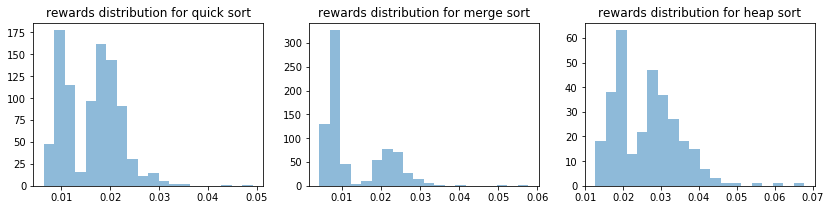

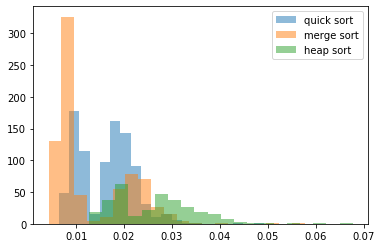

In [41]:
plot_rewards_distribution(arm_rewards_1)
plot_rewards_distribution_together(arm_rewards_1)

Restart at iteration: 15
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.021094008331904963, 'merge_sort': 0.023622100008651614, 'heap_sort': 0.03407643332805795}
Count per chosen algo {'quick_sort': 12, 'merge_sort': 1, 'heap_sort': 3}


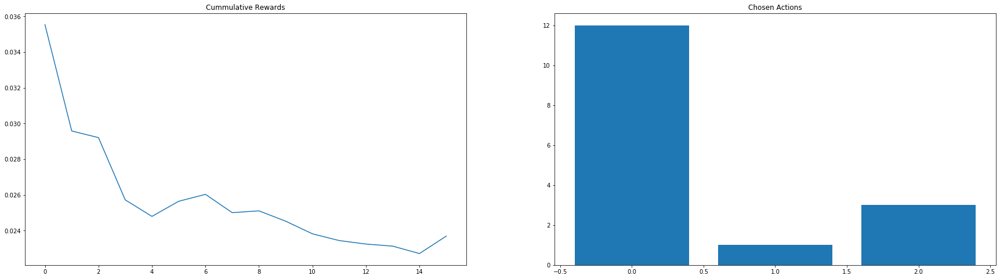

Restart at iteration: 28
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.019874710001749916, 'merge_sort': 0.01969950000056997, 'heap_sort': 0.0278951500004041}
Count per chosen algo {'quick_sort': 10, 'merge_sort': 1, 'heap_sort': 2}


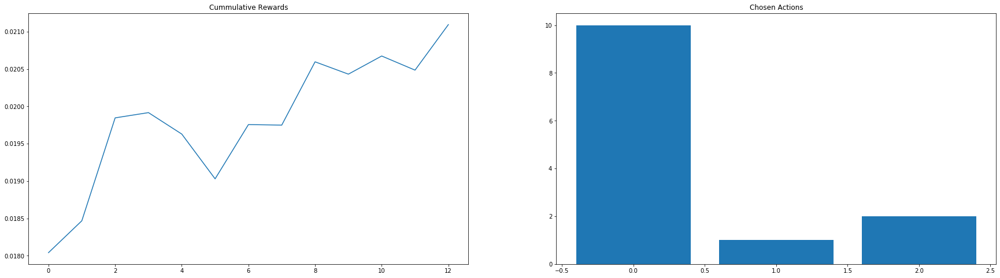

Restart at iteration: 44
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.01938899000233505, 'merge_sort': 0.021147399995243177, 'heap_sort': 0.03456659999937983}
Count per chosen algo {'quick_sort': 10, 'merge_sort': 4, 'heap_sort': 2}


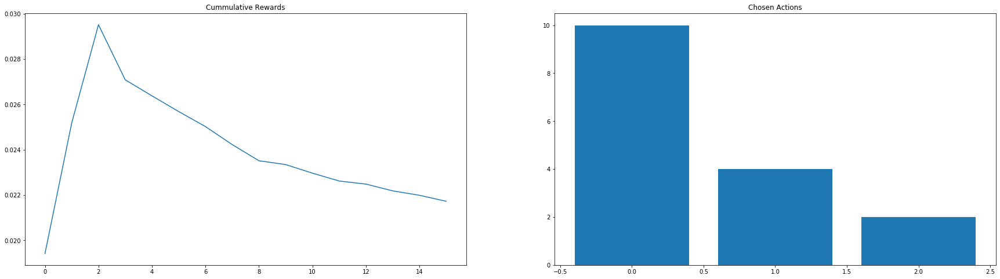

Restart at iteration: 65
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.020647900001495145, 'merge_sort': 0.024324300000444055, 'heap_sort': 0.06158720000530593}
Count per chosen algo {'quick_sort': 15, 'merge_sort': 5, 'heap_sort': 1}


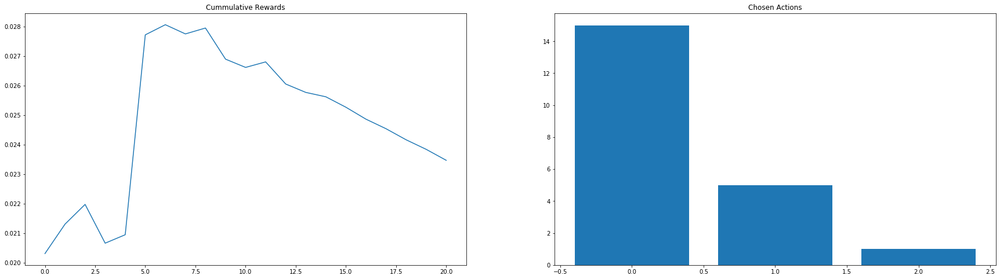

Restart at iteration: 78
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.018047600002319086, 'merge_sort': 0.02014094444651467, 'heap_sort': 0.03377324999746634}
Count per chosen algo {'quick_sort': 2, 'merge_sort': 9, 'heap_sort': 2}


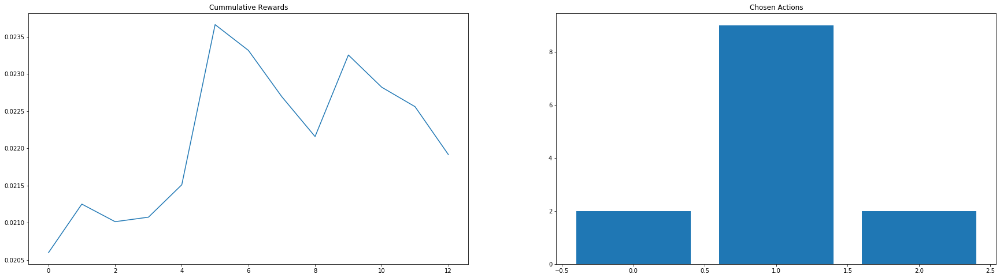

Restart at iteration: 93
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.017216512500453973, 'merge_sort': 0.019448649996775202, 'heap_sort': 0.02720684000523761}
Count per chosen algo {'quick_sort': 8, 'merge_sort': 2, 'heap_sort': 5}


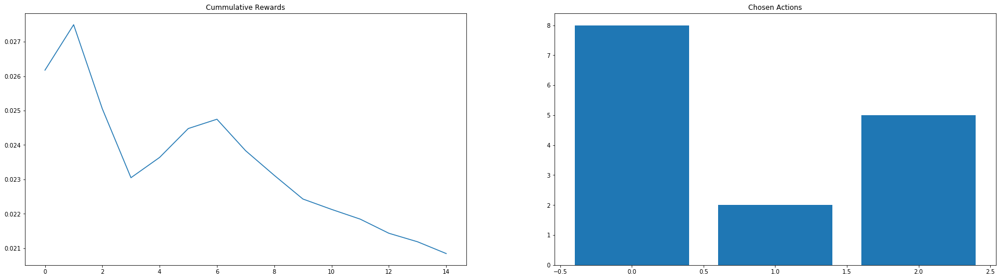

Restart at iteration: 105
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.019802557140272774, 'merge_sort': 0.022156600003654603, 'heap_sort': 0.038993499998468906}
Count per chosen algo {'quick_sort': 7, 'merge_sort': 2, 'heap_sort': 3}


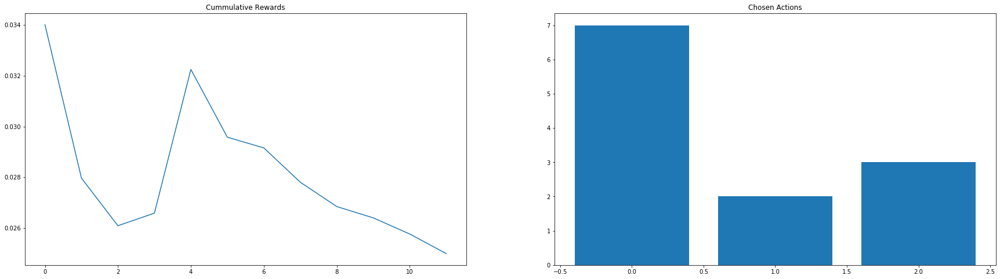

Restart at iteration: 119
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.022321670000383164, 'merge_sort': 0.028020600002491847, 'heap_sort': 0.03300426666586039}
Count per chosen algo {'quick_sort': 10, 'merge_sort': 1, 'heap_sort': 3}


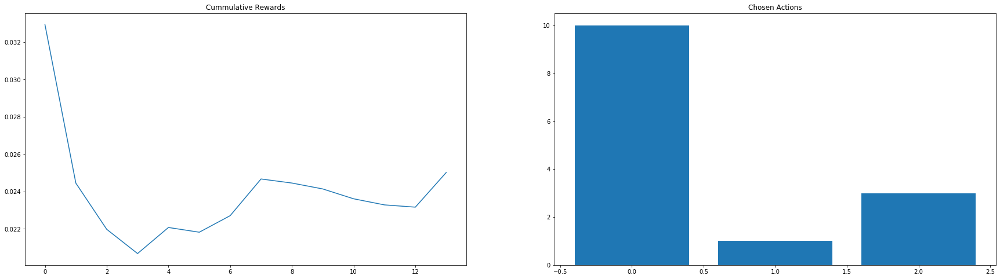

Restart at iteration: 135
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.0232198333332134, 'merge_sort': 0.033783566667504296, 'heap_sort': 0.03576742499717511}
Count per chosen algo {'quick_sort': 9, 'merge_sort': 3, 'heap_sort': 4}


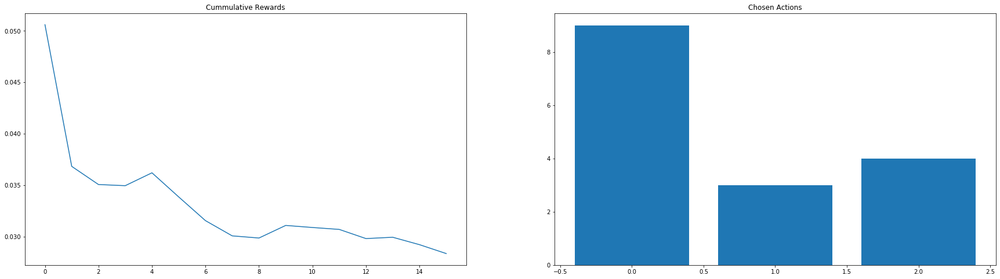

Restart at iteration: 151
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.017629800000577234, 'merge_sort': 0.020715550000507694, 'heap_sort': 0.027954316668910906}
Count per chosen algo {'quick_sort': 4, 'merge_sort': 6, 'heap_sort': 6}


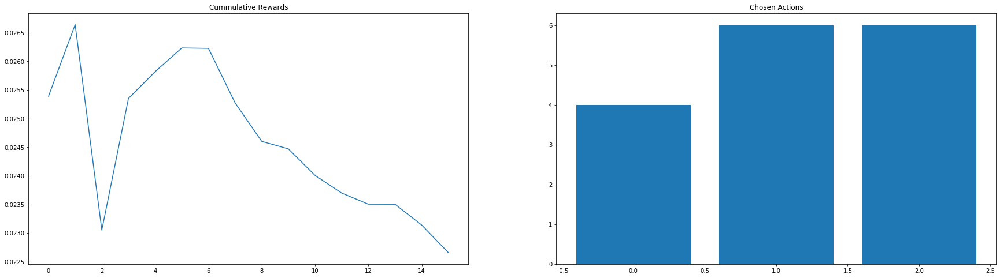

Restart at iteration: 175
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.0200759315791258, 'merge_sort': 0.022409299992432352, 'heap_sort': 0.028260966665887583}
Count per chosen algo {'quick_sort': 19, 'merge_sort': 2, 'heap_sort': 3}


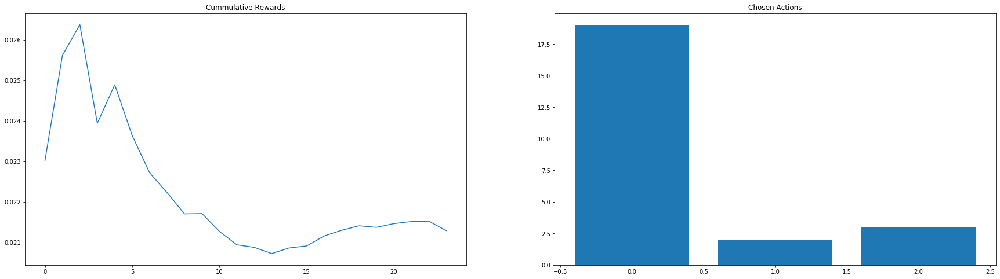

Restart at iteration: 189
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.01993836666709588, 'merge_sort': 0.019012666668762297, 'heap_sort': 0.03189592000271659}
Count per chosen algo {'quick_sort': 3, 'merge_sort': 6, 'heap_sort': 5}


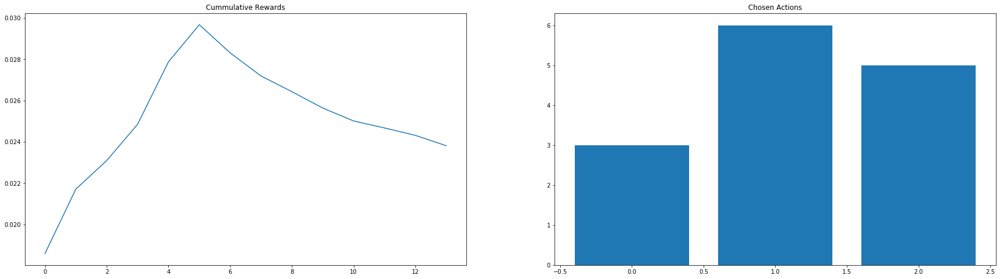

Restart at iteration: 201
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.021401525002147537, 'merge_sort': 0.0209731166663308, 'heap_sort': 0.02923975000885548}
Count per chosen algo {'quick_sort': 4, 'merge_sort': 6, 'heap_sort': 2}


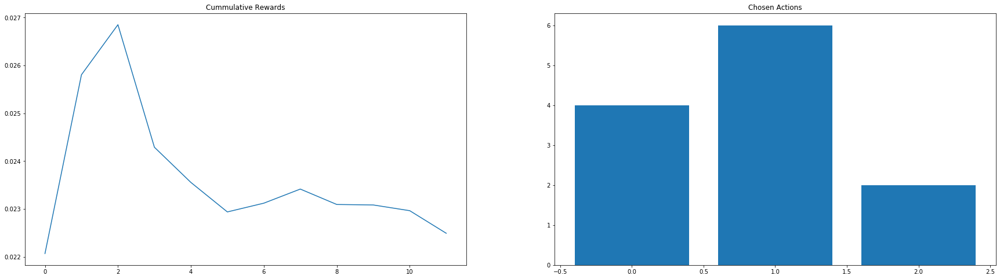

Restart at iteration: 216
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.018266642854931497, 'merge_sort': 0.02091571428588525, 'heap_sort': 0.027302699993015267}
Count per chosen algo {'quick_sort': 7, 'merge_sort': 7, 'heap_sort': 1}


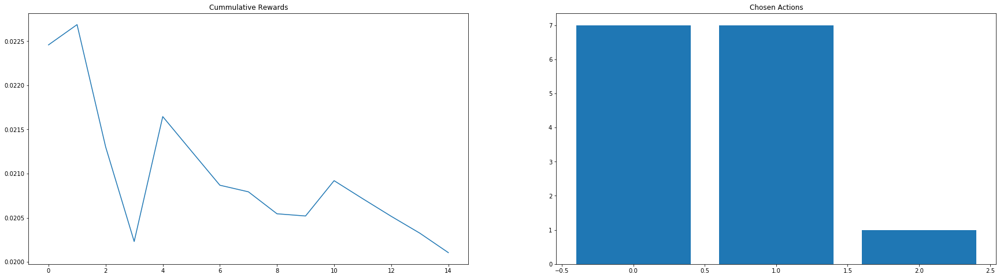

Restart at iteration: 230
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.019236919999821113, 'merge_sort': 0.02119045000290498, 'heap_sort': 0.028025799998431467}
Count per chosen algo {'quick_sort': 10, 'merge_sort': 2, 'heap_sort': 2}


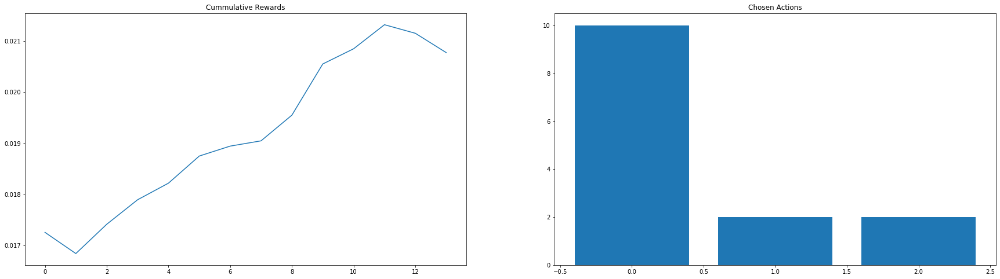

Restart at iteration: 253
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.018608610527926908, 'merge_sort': 0.02085439999063965, 'heap_sort': 0.02965309999611539}
Count per chosen algo {'quick_sort': 19, 'merge_sort': 1, 'heap_sort': 3}


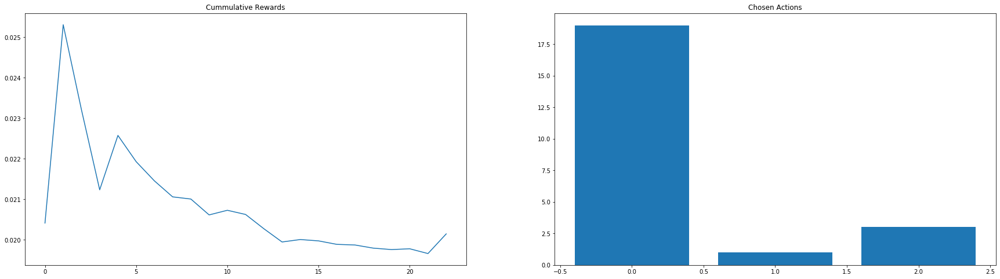

Restart at iteration: 284
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.017923643999965863, 'merge_sort': 0.019845133332031157, 'heap_sort': 0.027015200001187623}
Count per chosen algo {'quick_sort': 25, 'merge_sort': 3, 'heap_sort': 3}


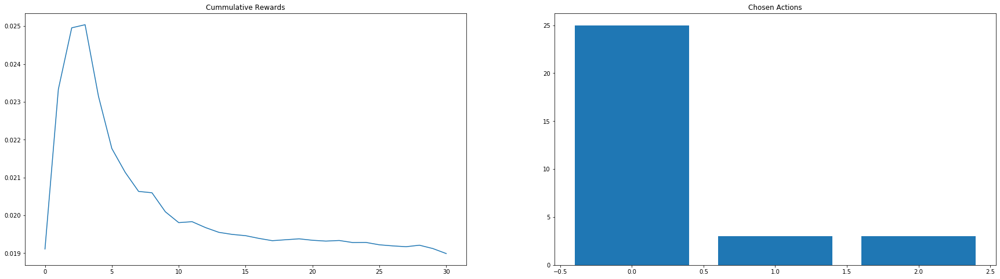

Restart at iteration: 303
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.017376066665747203, 'merge_sort': 0.021381999998993706, 'heap_sort': 0.027026299998397008}
Count per chosen algo {'quick_sort': 15, 'merge_sort': 2, 'heap_sort': 2}


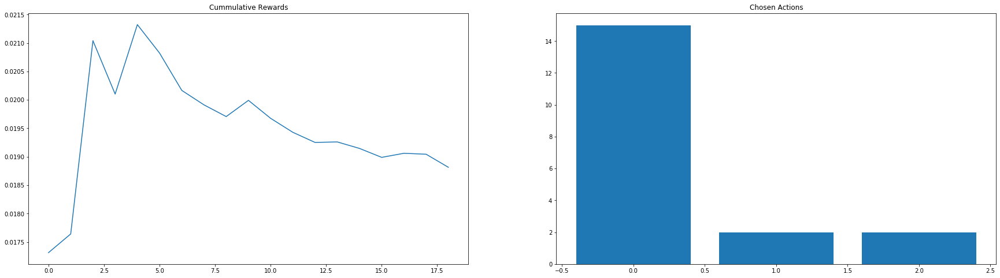

Restart at iteration: 320
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.019255773332164, 'merge_sort': 0.0, 'heap_sort': 0.02711914999963483}
Count per chosen algo {'quick_sort': 15, 'merge_sort': 0, 'heap_sort': 2}


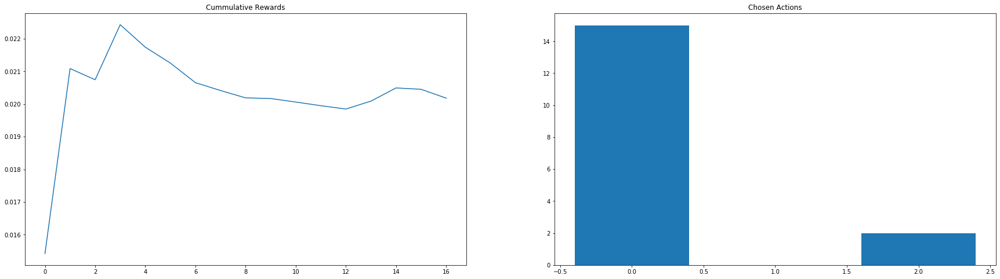

Restart at iteration: 338
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.0220705999963684, 'merge_sort': 0.021711824996600626, 'heap_sort': 0.03079665000041132}
Count per chosen algo {'quick_sort': 2, 'merge_sort': 12, 'heap_sort': 4}


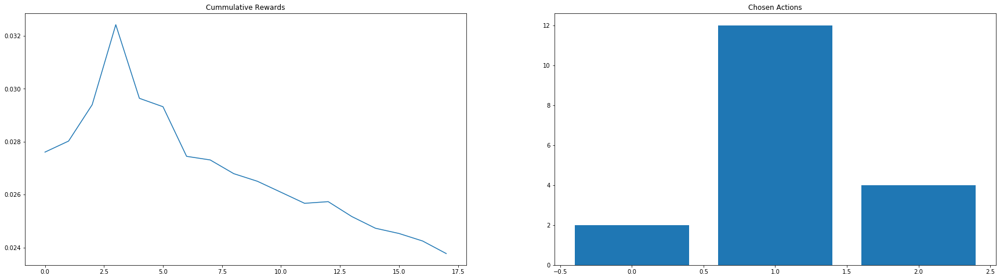

Restart at iteration: 349
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.016872871428079503, 'merge_sort': 0.020813833335220504, 'heap_sort': 0.02802890000748448}
Count per chosen algo {'quick_sort': 7, 'merge_sort': 3, 'heap_sort': 1}


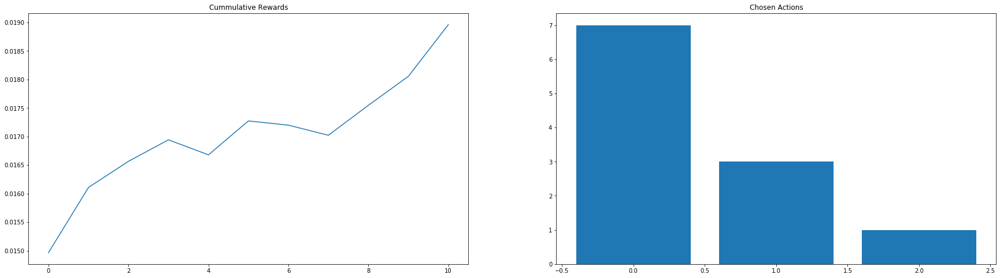

Restart at iteration: 362
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.01878677999775391, 'merge_sort': 0.021941983335030574, 'heap_sort': 0.025551699996867683}
Count per chosen algo {'quick_sort': 5, 'merge_sort': 6, 'heap_sort': 2}


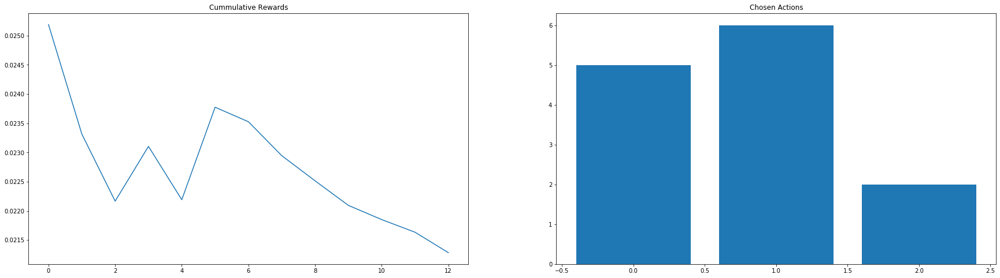

Restart at iteration: 399
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.018144172413579733, 'merge_sort': 0.019156825001118705, 'heap_sort': 0.02958405000026687}
Count per chosen algo {'quick_sort': 29, 'merge_sort': 4, 'heap_sort': 4}


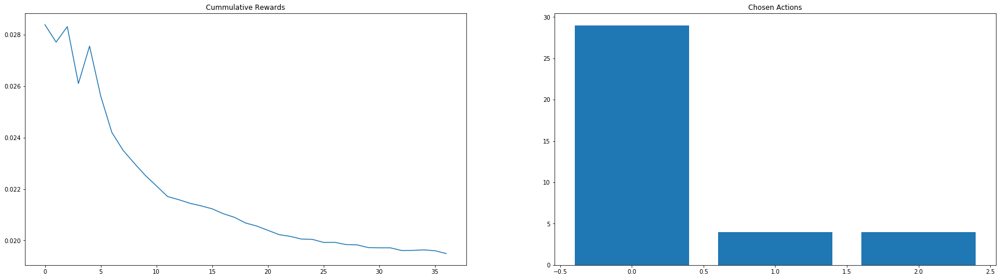

Restart at iteration: 411
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.015893900000567857, 'merge_sort': 0.019937100001698127, 'heap_sort': 0.027432799997041003}
Count per chosen algo {'quick_sort': 3, 'merge_sort': 4, 'heap_sort': 5}


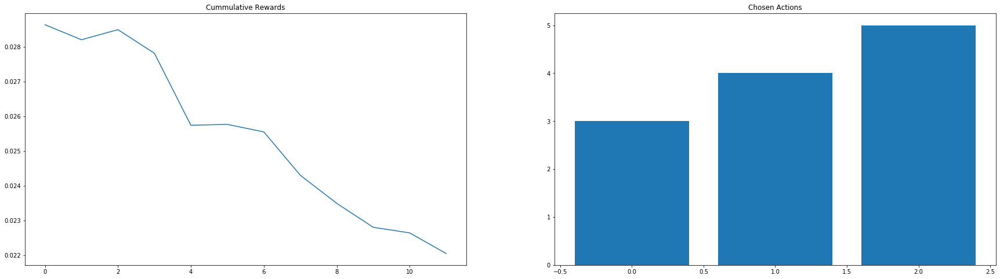

Restart at iteration: 424
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.01774762499917415, 'merge_sort': 0.01955646666465327, 'heap_sort': 0.027406799992604647}
Count per chosen algo {'quick_sort': 8, 'merge_sort': 3, 'heap_sort': 2}


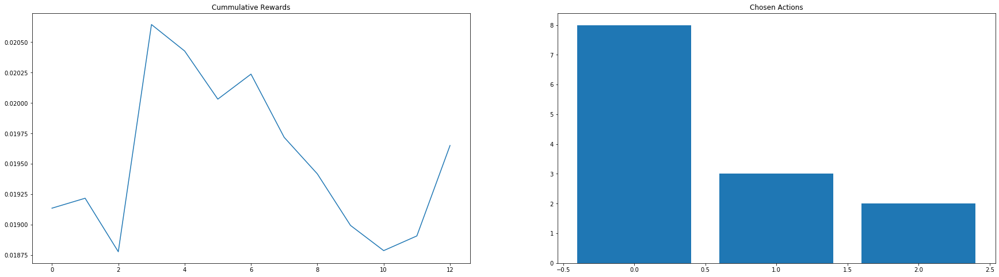

Restart at iteration: 435
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.017470187500293832, 'merge_sort': 0.02142676666941649, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 8, 'merge_sort': 3, 'heap_sort': 0}


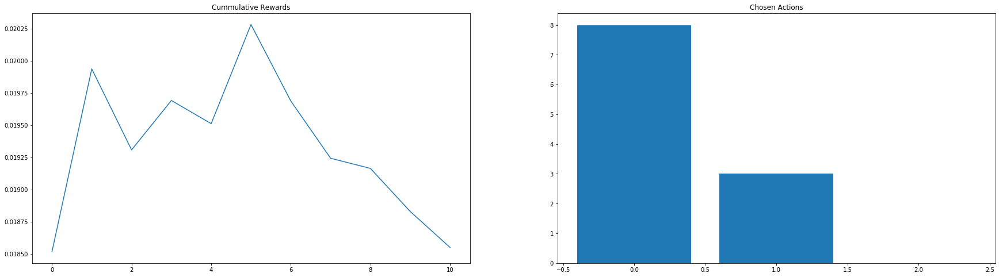

Restart at iteration: 448
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.017668111110752862, 'merge_sort': 0.02095720000943402, 'heap_sort': 0.026501100001041777}
Count per chosen algo {'quick_sort': 9, 'merge_sort': 2, 'heap_sort': 2}


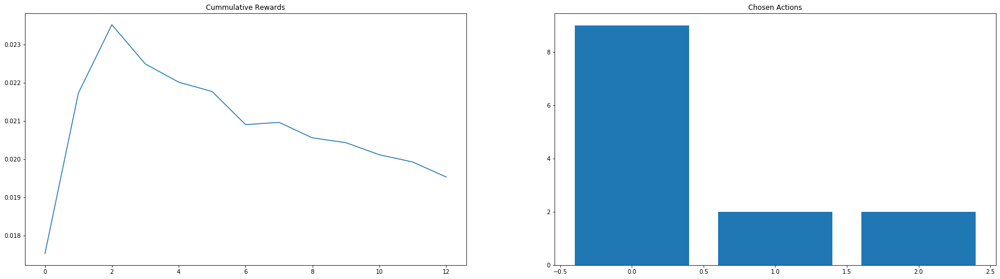

Restart at iteration: 460
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.019461612499071634, 'merge_sort': 0.018894699998782016, 'heap_sort': 0.02748799999244511}
Count per chosen algo {'quick_sort': 8, 'merge_sort': 1, 'heap_sort': 3}


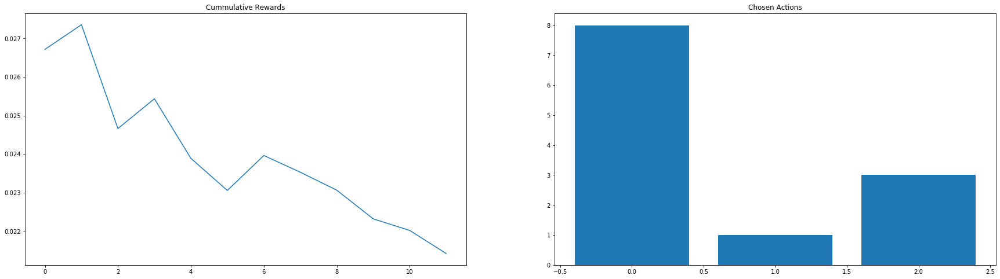

Restart at iteration: 478
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.020320609092860566, 'merge_sort': 0.022644900003797375, 'heap_sort': 0.029484799997590017}
Count per chosen algo {'quick_sort': 11, 'merge_sort': 5, 'heap_sort': 2}


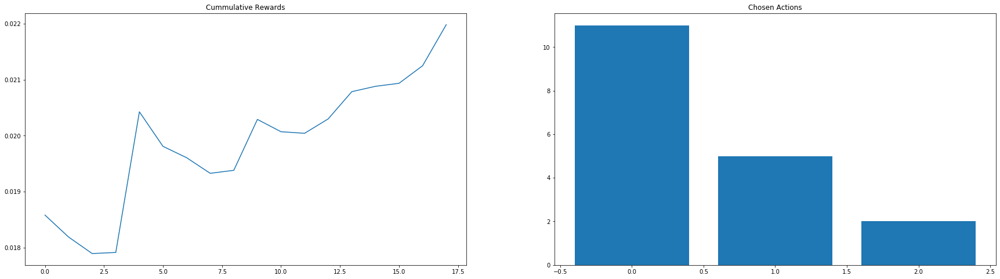

Restart at iteration: 491
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.02249892856967303, 'merge_sort': 0.02290082500257995, 'heap_sort': 0.033160850005515385}
Count per chosen algo {'quick_sort': 7, 'merge_sort': 4, 'heap_sort': 2}


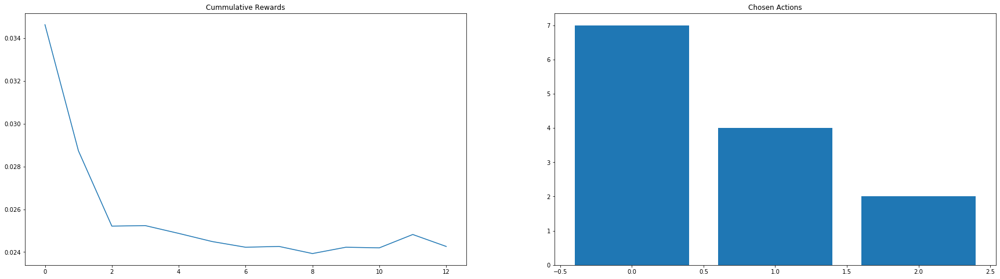

Restart at iteration: 502
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.028619859996251763, 'merge_sort': 0.010995499997079605, 'heap_sort': 0.048155999997106846}
Count per chosen algo {'quick_sort': 5, 'merge_sort': 4, 'heap_sort': 2}


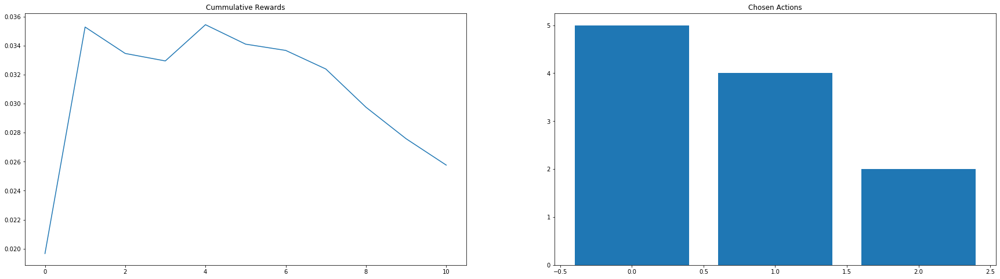

Restart at iteration: 515
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.011041227273050357, 'merge_sort': 0.008764099999098107, 'heap_sort': 0.01777130000118632}
Count per chosen algo {'quick_sort': 11, 'merge_sort': 1, 'heap_sort': 1}


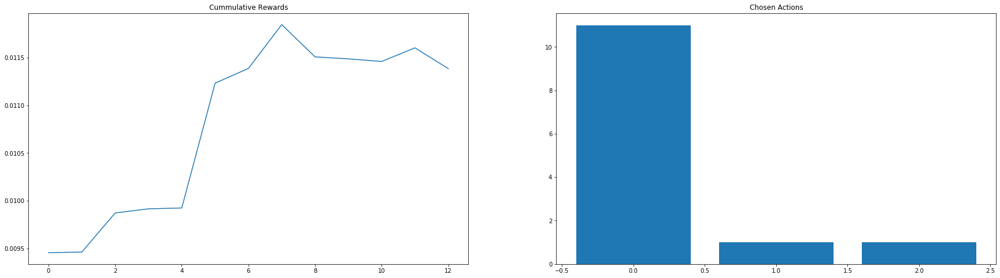

Restart at iteration: 527
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.01101349999953527, 'merge_sort': 0.009939125002347282, 'heap_sort': 0.01782054999785032}
Count per chosen algo {'quick_sort': 2, 'merge_sort': 8, 'heap_sort': 2}


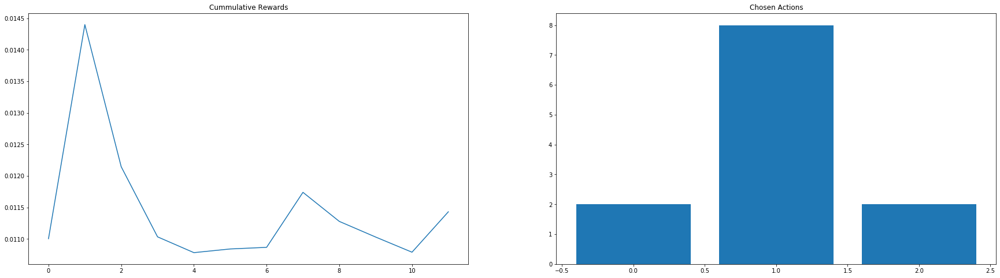

Restart at iteration: 541
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010314700004528277, 'merge_sort': 0.008547063637789424, 'heap_sort': 0.020130400007474236}
Count per chosen algo {'quick_sort': 2, 'merge_sort': 11, 'heap_sort': 1}


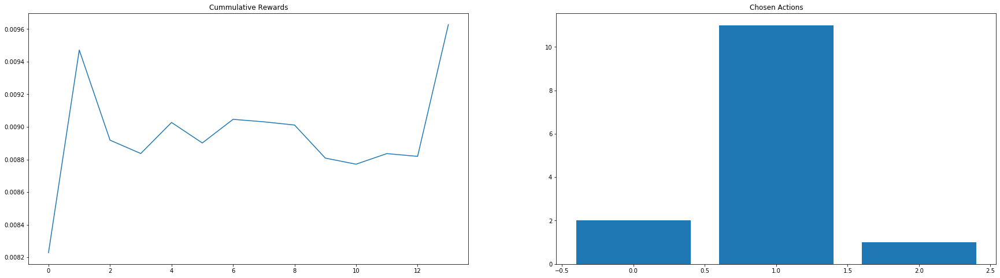

Restart at iteration: 553
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010032090914054688, 'merge_sort': 0.009570700000040233, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 11, 'merge_sort': 1, 'heap_sort': 0}


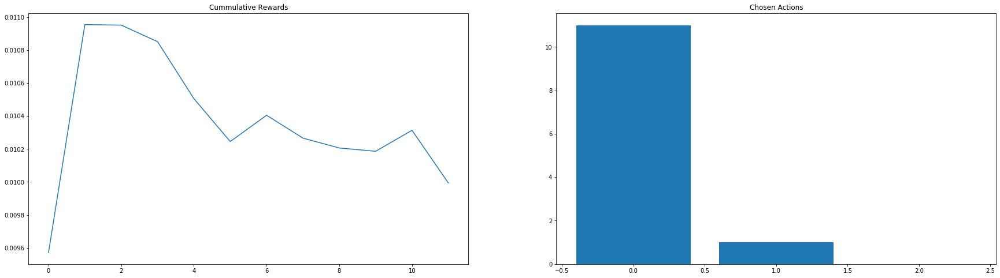

Restart at iteration: 564
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010123322219846563, 'merge_sort': 0.008261900002253242, 'heap_sort': 0.016008999999030493}
Count per chosen algo {'quick_sort': 9, 'merge_sort': 1, 'heap_sort': 1}


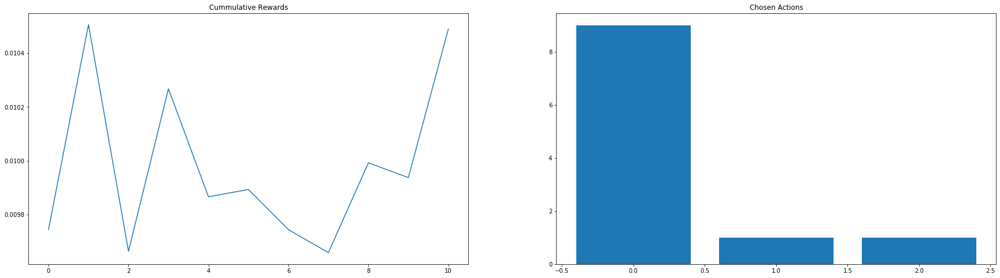

Restart at iteration: 576
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.009599999990314245, 'merge_sort': 0.008312674997796421, 'heap_sort': 0.018459699994612794}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 8, 'heap_sort': 3}


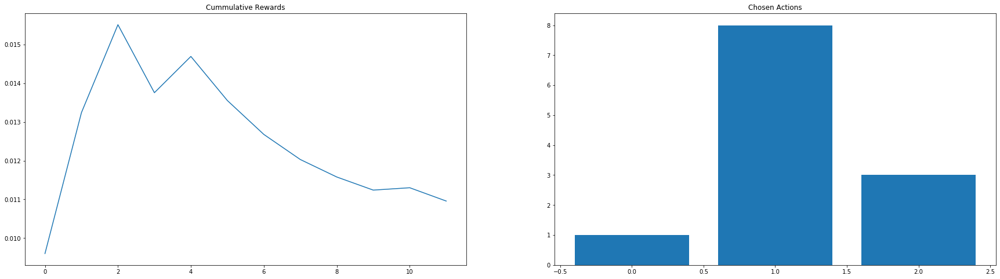

Restart at iteration: 587
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010102900007041171, 'merge_sort': 0.0, 'heap_sort': 0.020035649999044836}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 0, 'heap_sort': 10}


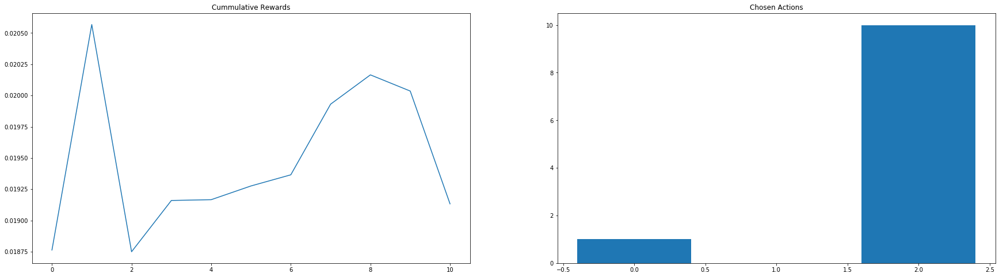

Restart at iteration: 603
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.011460166667044783, 'merge_sort': 0.00872795833250469, 'heap_sort': 0.02140119999239687}
Count per chosen algo {'quick_sort': 3, 'merge_sort': 12, 'heap_sort': 1}


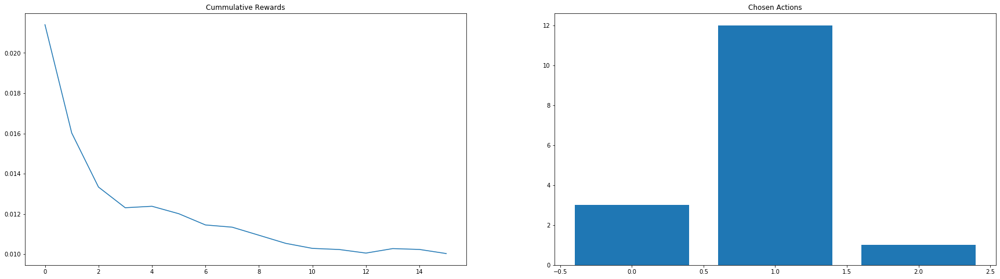

Restart at iteration: 614
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.011190622221976, 'merge_sort': 0.009967899997718632, 'heap_sort': 0.01957590000529308}
Count per chosen algo {'quick_sort': 9, 'merge_sort': 1, 'heap_sort': 1}


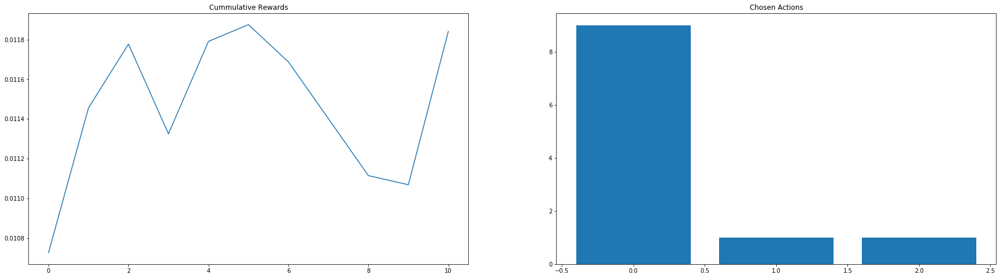

Restart at iteration: 631
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.011249213334910262, 'merge_sort': 0.007776100006594788, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 15, 'merge_sort': 2, 'heap_sort': 0}


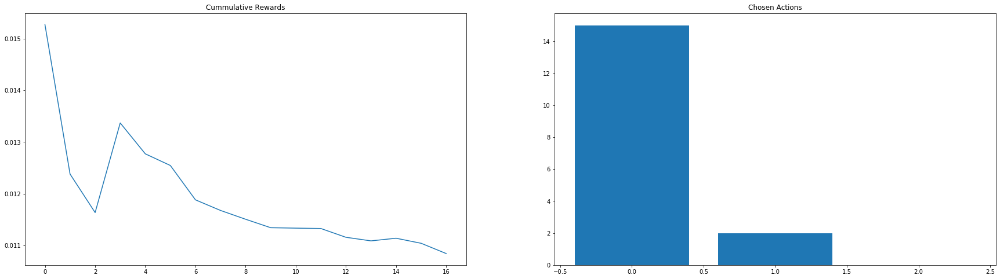

Restart at iteration: 646
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010503650002647191, 'merge_sort': 0.00835772499825301, 'heap_sort': 0.017731999992975034}
Count per chosen algo {'quick_sort': 2, 'merge_sort': 12, 'heap_sort': 1}


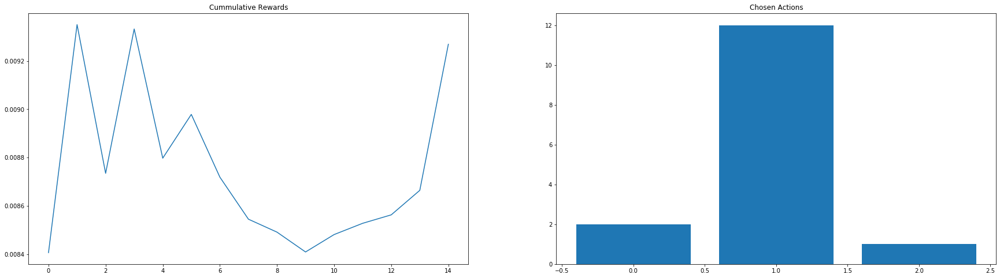

Restart at iteration: 658
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.01107199999387376, 'merge_sort': 0.008208809091063978, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 11, 'heap_sort': 0}


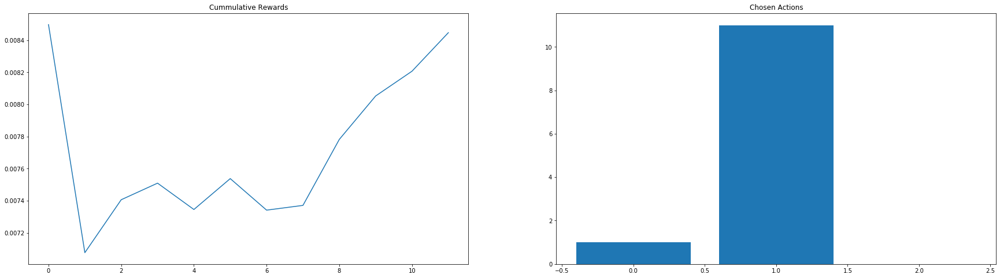

Restart at iteration: 671
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.011979281816324643, 'merge_sort': 0.007750700009637512, 'heap_sort': 0.022231099996133707}
Count per chosen algo {'quick_sort': 11, 'merge_sort': 1, 'heap_sort': 1}


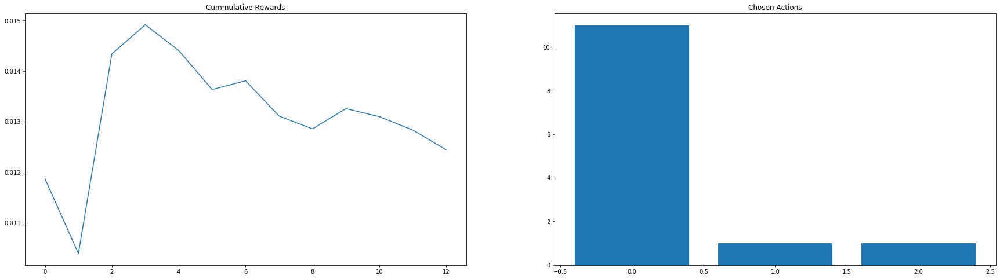

Restart at iteration: 683
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010303333333771056, 'merge_sort': 0.009130800001522792, 'heap_sort': 0.021869350006454624}
Count per chosen algo {'quick_sort': 3, 'merge_sort': 7, 'heap_sort': 2}


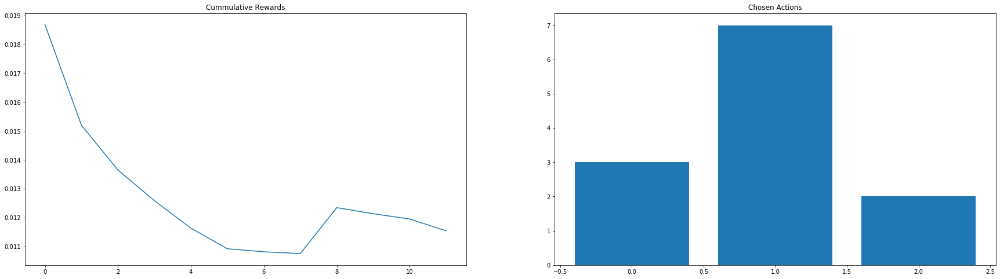

Restart at iteration: 695
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.01123139999981504, 'merge_sort': 0.008620859998336528, 'heap_sort': 0.015493799990508705}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 10, 'heap_sort': 1}


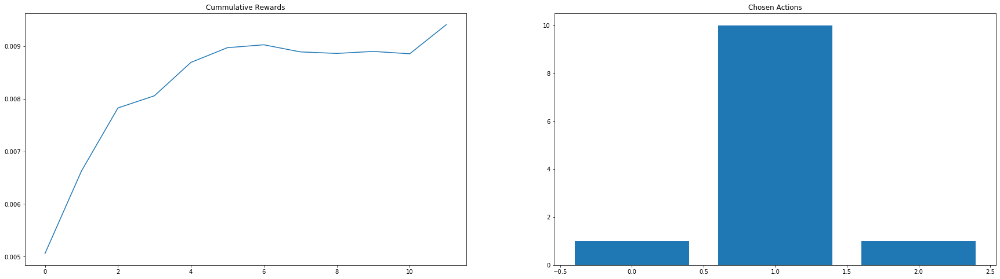

Restart at iteration: 724
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.009216435715123745, 'merge_sort': 0.008213246151661644, 'heap_sort': 0.014003599993884563}
Count per chosen algo {'quick_sort': 14, 'merge_sort': 13, 'heap_sort': 2}


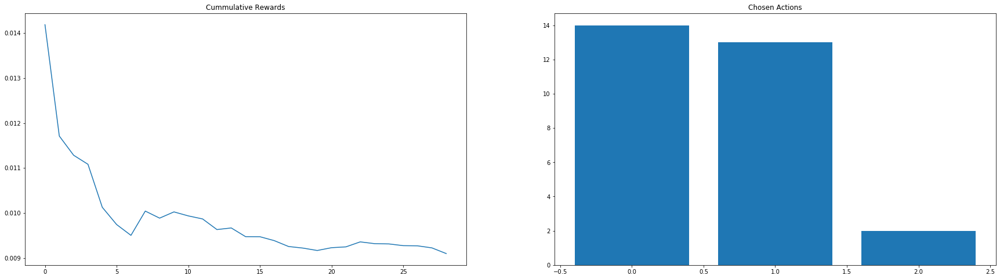

Restart at iteration: 747
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010404177776460225, 'merge_sort': 0.00846105454150926, 'heap_sort': 0.02094240000587888}
Count per chosen algo {'quick_sort': 9, 'merge_sort': 11, 'heap_sort': 3}


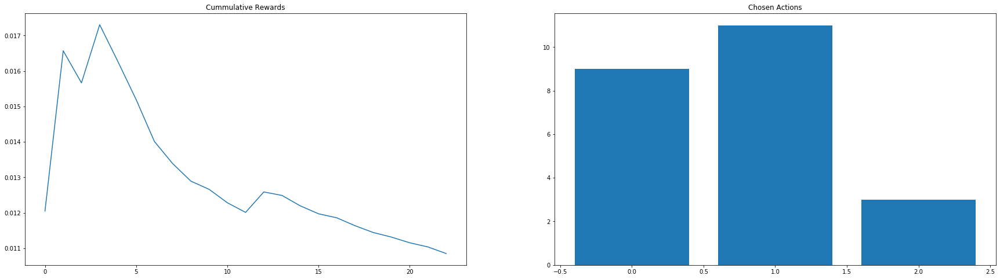

Restart at iteration: 759
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.009802724998735357, 'merge_sort': 0.008237099997738065, 'heap_sort': 0.014271399995777756}
Count per chosen algo {'quick_sort': 8, 'merge_sort': 3, 'heap_sort': 1}


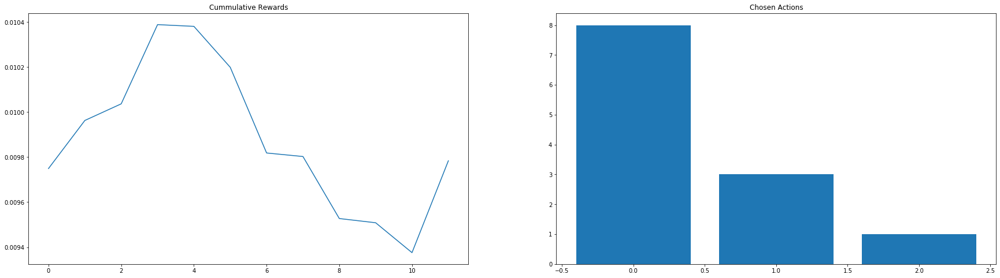

Restart at iteration: 770
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.009197299994411878, 'merge_sort': 0.008163062499079388, 'heap_sort': 0.01935869999579154}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 8, 'heap_sort': 2}


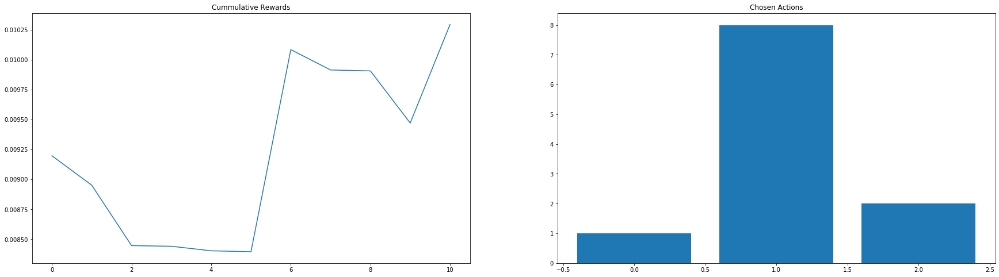

Restart at iteration: 794
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.008186200007912703, 'merge_sort': 0.008606736361715857, 'heap_sort': 0.0203551000013249}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 22, 'heap_sort': 1}


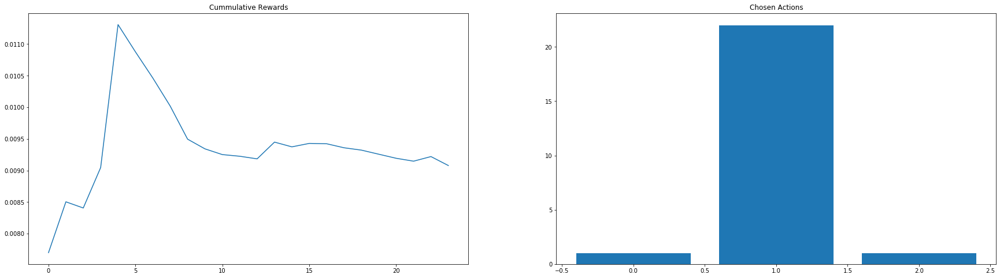

Restart at iteration: 806
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010043879997101612, 'merge_sort': 0.008012980004423298, 'heap_sort': 0.017976000002818182}
Count per chosen algo {'quick_sort': 5, 'merge_sort': 5, 'heap_sort': 2}


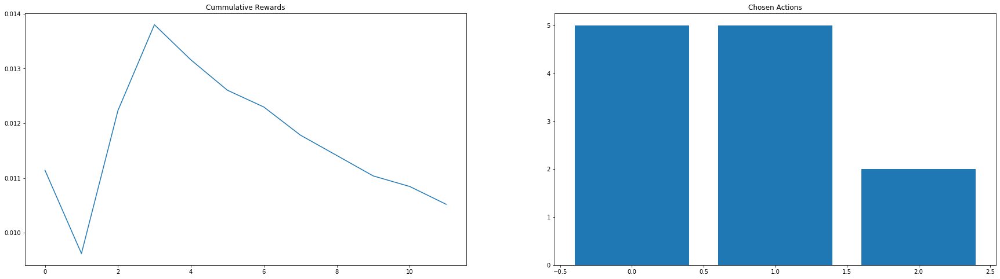

Restart at iteration: 817
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.009862877776160732, 'merge_sort': 0.006709799999953248, 'heap_sort': 0.019419600008404814}
Count per chosen algo {'quick_sort': 9, 'merge_sort': 1, 'heap_sort': 1}


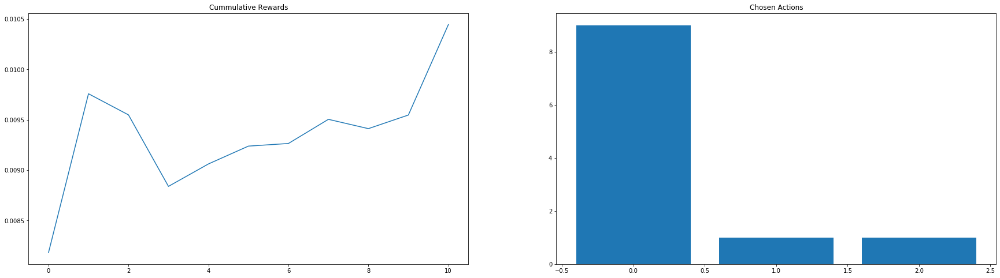

Restart at iteration: 834
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.009866707143373787, 'merge_sort': 0.009024949999002274, 'heap_sort': 0.01863479999883566}
Count per chosen algo {'quick_sort': 14, 'merge_sort': 2, 'heap_sort': 1}


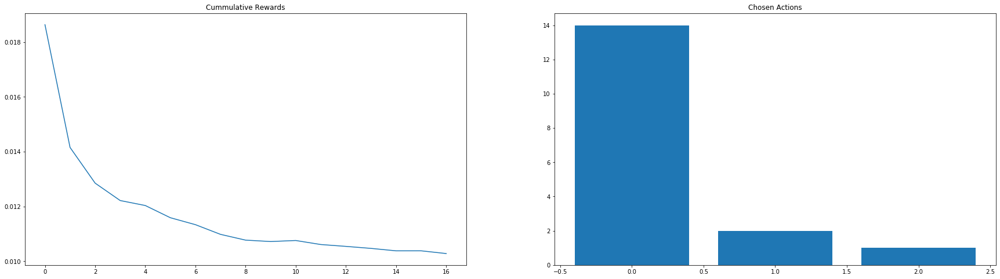

Restart at iteration: 845
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.00800826666818466, 'heap_sort': 0.018565300000773277}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 9, 'heap_sort': 2}


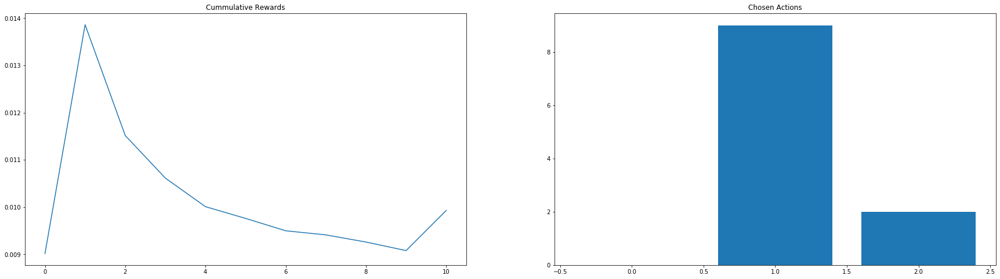

Restart at iteration: 856
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.011431199993239716, 'merge_sort': 0.00865620000695344, 'heap_sort': 0.01790725555717169}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 1, 'heap_sort': 9}


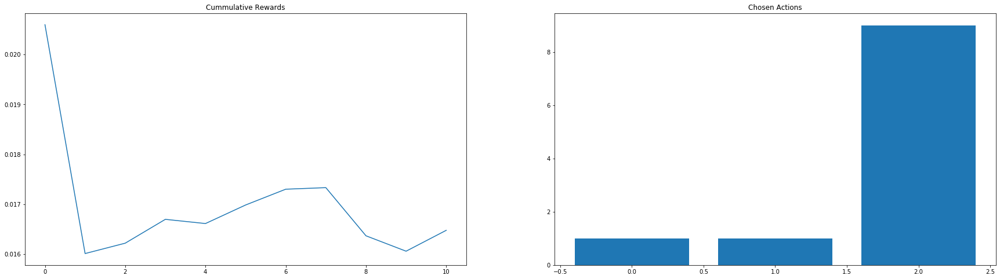

Restart at iteration: 871
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.011211749995709397, 'merge_sort': 0.008474427274036729, 'heap_sort': 0.0190777000025264}
Count per chosen algo {'quick_sort': 2, 'merge_sort': 11, 'heap_sort': 2}


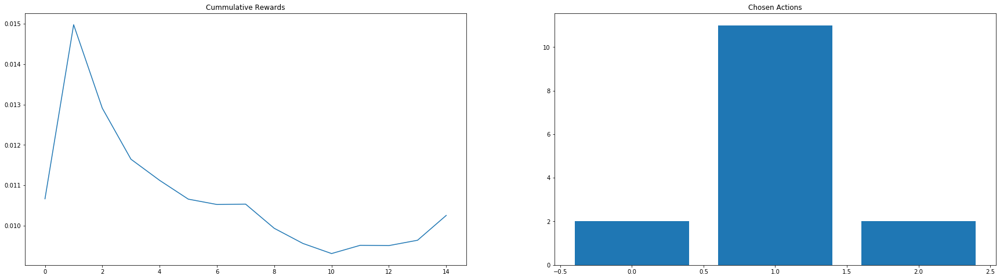

Restart at iteration: 884
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.009243080001033377, 'merge_sort': 0.006515200002468191, 'heap_sort': 0.017356199998175725}
Count per chosen algo {'quick_sort': 10, 'merge_sort': 2, 'heap_sort': 1}


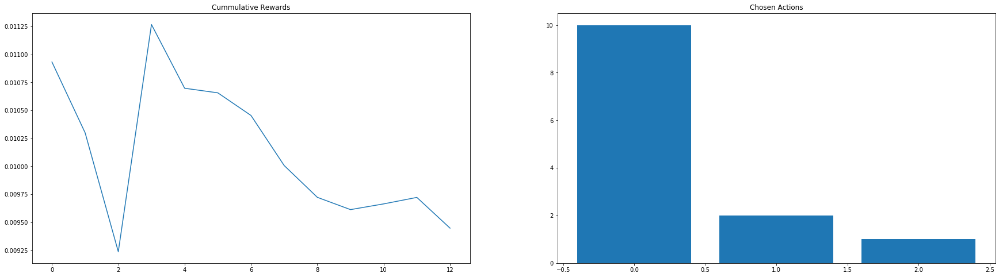

Restart at iteration: 897
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.006870885714306496, 'heap_sort': 0.017686816667264793}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 7, 'heap_sort': 6}


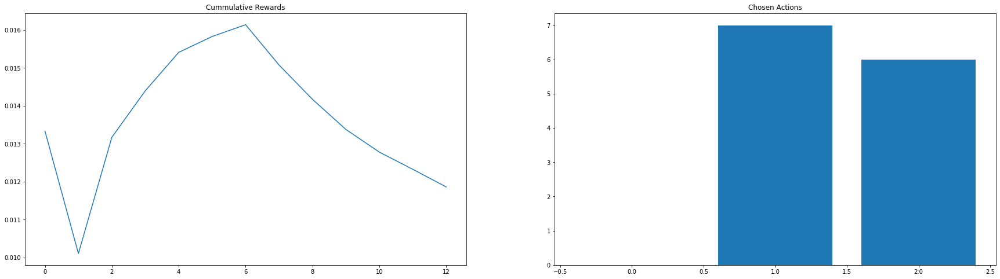

Restart at iteration: 908
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010459199998877011, 'merge_sort': 0.007166288885249135, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 2, 'merge_sort': 9, 'heap_sort': 0}


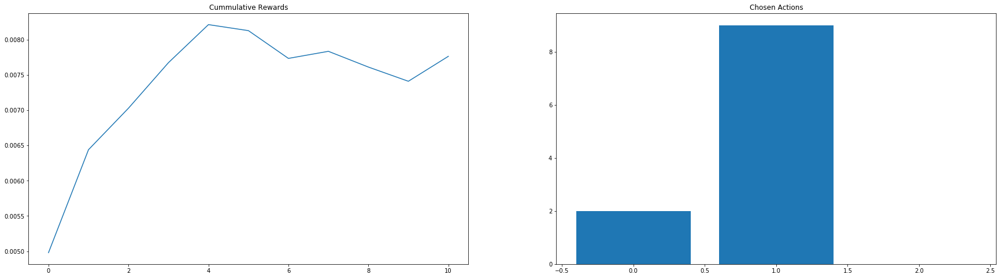

Restart at iteration: 924
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.00946829999156762, 'merge_sort': 0.007385779999700996, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 15, 'heap_sort': 0}


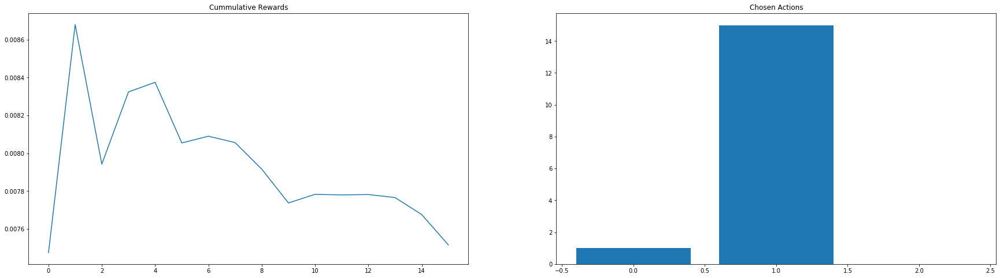

Restart at iteration: 953
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010579566665304204, 'merge_sort': 0.00825046666735337, 'heap_sort': 0.01862510000501061}
Count per chosen algo {'quick_sort': 3, 'merge_sort': 24, 'heap_sort': 2}


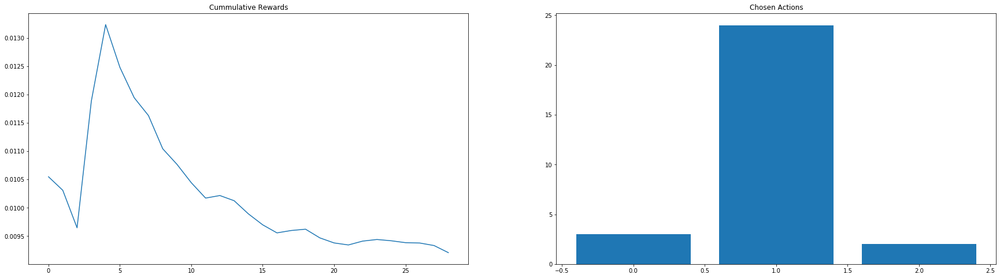

Restart at iteration: 964
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.009918910000124015, 'merge_sort': 0.008724699990125373, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 10, 'merge_sort': 1, 'heap_sort': 0}


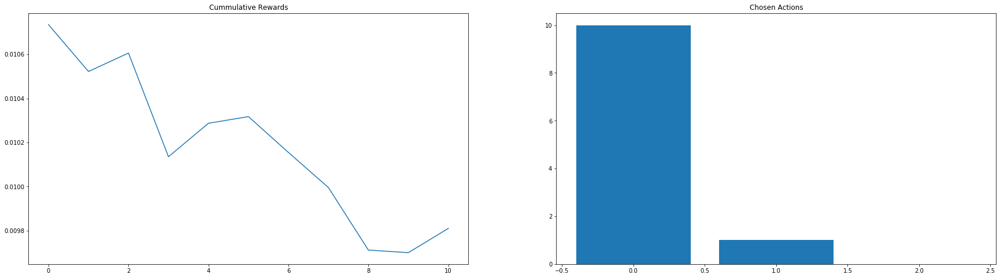

Restart at iteration: 994
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010689533335001519, 'merge_sort': 0.008265158333718622, 'heap_sort': 0.018675699999827582}
Count per chosen algo {'quick_sort': 3, 'merge_sort': 24, 'heap_sort': 3}


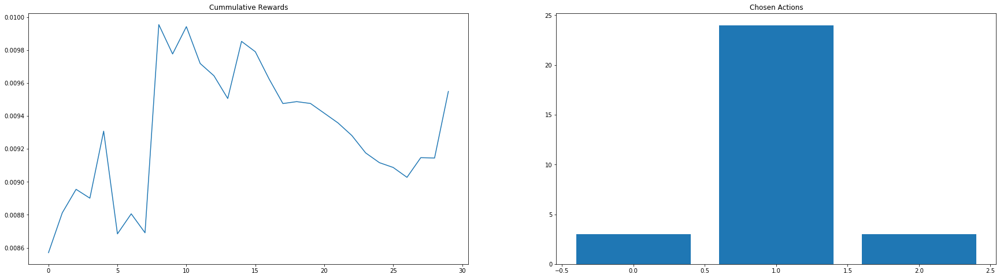

Restart at iteration: 1007
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.021303149995219428, 'merge_sort': 0.014857977780694556, 'heap_sort': 0.034550700009276625}
Count per chosen algo {'quick_sort': 2, 'merge_sort': 9, 'heap_sort': 2}


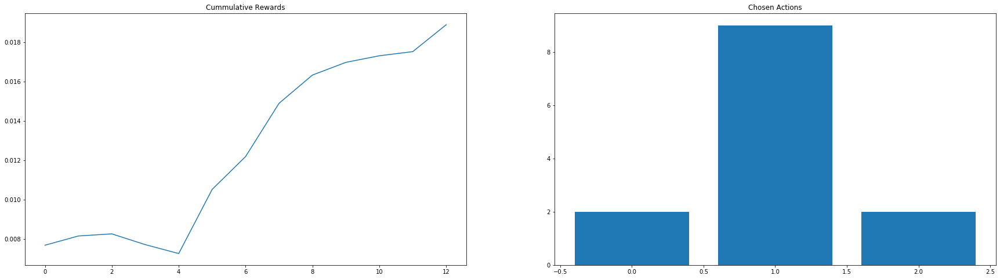

Restart at iteration: 1019
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.02482604444311518, 'merge_sort': 0.02543100000184495, 'heap_sort': 0.03780784999980824}
Count per chosen algo {'quick_sort': 9, 'merge_sort': 1, 'heap_sort': 2}


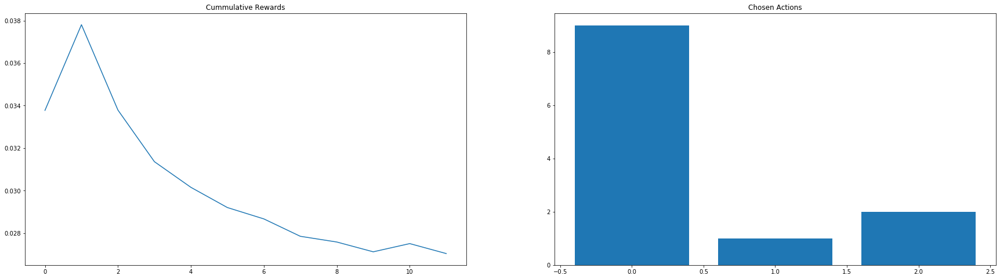

Restart at iteration: 1033
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.020326249992649537, 'merge_sort': 0.026196790000540204, 'heap_sort': 0.03219790000002831}
Count per chosen algo {'quick_sort': 2, 'merge_sort': 10, 'heap_sort': 2}


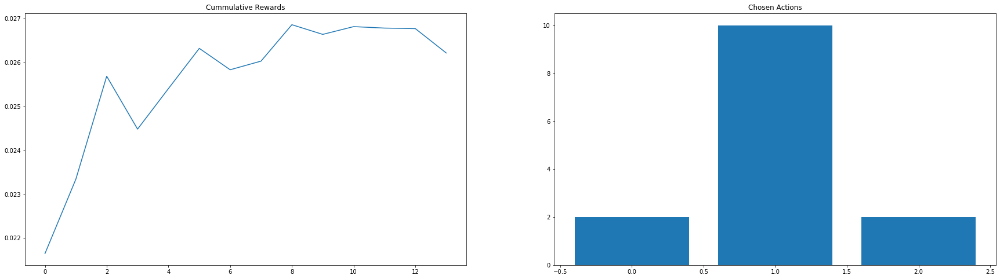

Restart at iteration: 1046
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.022723216670177255, 'merge_sort': 0.030421740000019782, 'heap_sort': 0.038429699998232536}
Count per chosen algo {'quick_sort': 6, 'merge_sort': 5, 'heap_sort': 2}


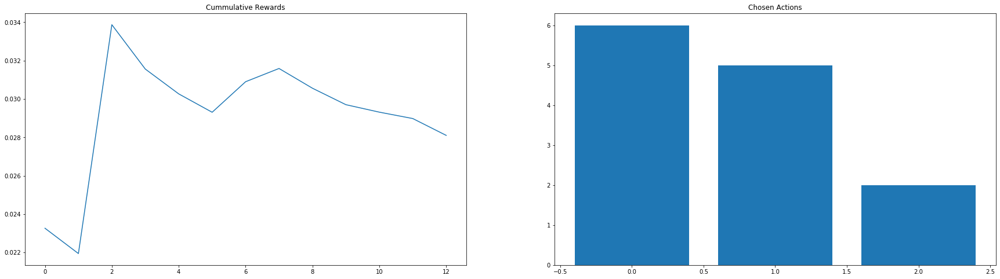

Restart at iteration: 1062
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.021902299995417707, 'merge_sort': 0.027487728570122272, 'heap_sort': 0.036851957141022594}
Count per chosen algo {'quick_sort': 2, 'merge_sort': 7, 'heap_sort': 7}


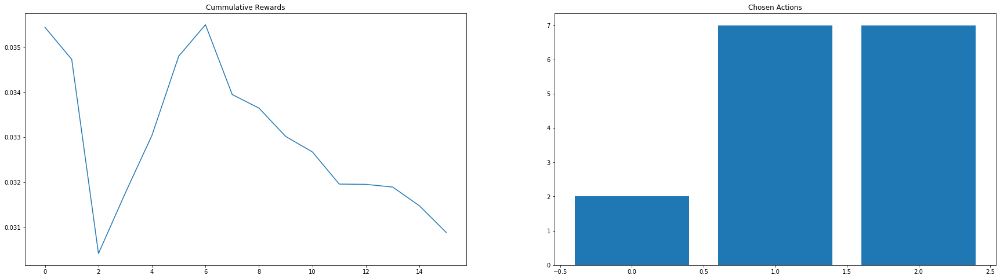

Restart at iteration: 1079
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.019887000002199784, 'merge_sort': 0.02573530769530827, 'heap_sort': 0.03740740000406125}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 13, 'heap_sort': 3}


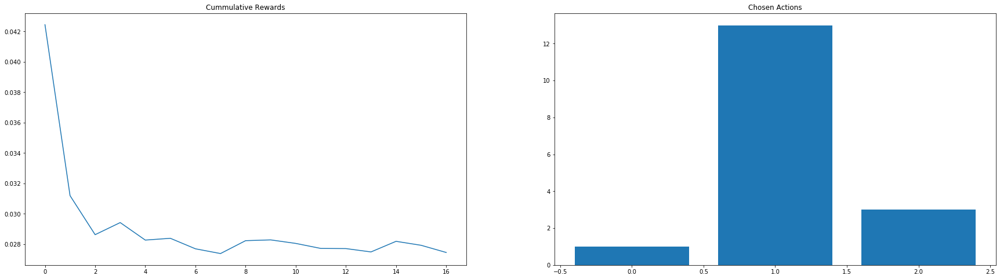

Restart at iteration: 1110
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.025579131818879185, 'merge_sort': 0.03600886666390579, 'heap_sort': 0.04242756666644709}
Count per chosen algo {'quick_sort': 22, 'merge_sort': 3, 'heap_sort': 6}


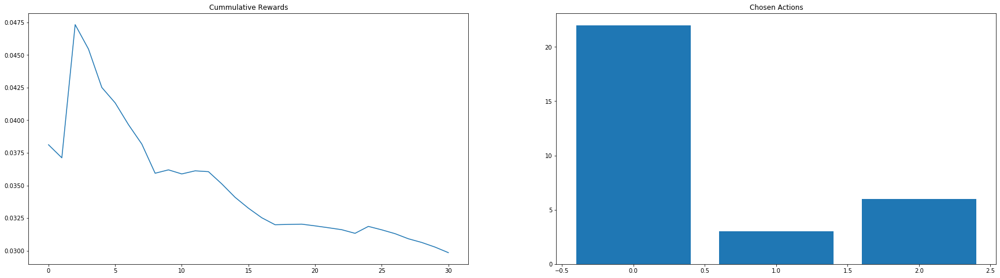

Restart at iteration: 1121
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.019757160005974585, 'merge_sort': 0.021860349996131845, 'heap_sort': 0.03775685000073281}
Count per chosen algo {'quick_sort': 5, 'merge_sort': 2, 'heap_sort': 4}


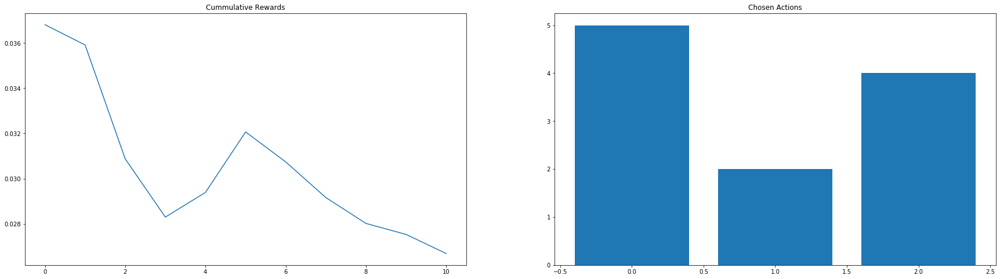

Restart at iteration: 1133
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.020883899996988475, 'merge_sort': 0.02271086000255309, 'heap_sort': 0.0313856249958917}
Count per chosen algo {'quick_sort': 3, 'merge_sort': 5, 'heap_sort': 4}


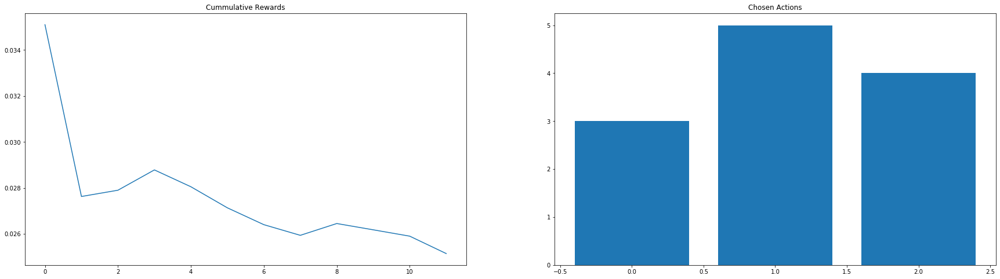

Restart at iteration: 1151
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.01922920000148364, 'merge_sort': 0.022144566668430343, 'heap_sort': 0.035393799997109454}
Count per chosen algo {'quick_sort': 13, 'merge_sort': 3, 'heap_sort': 2}


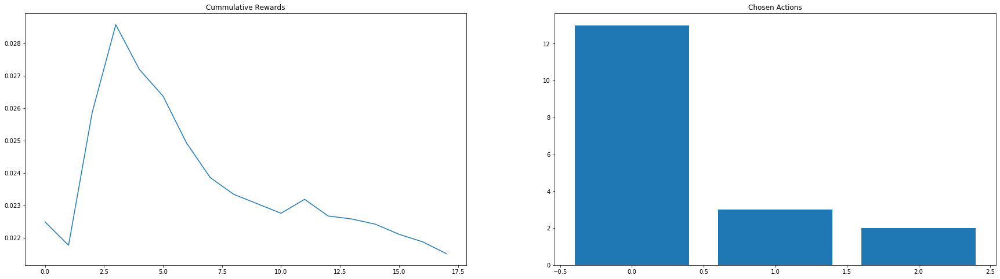

Restart at iteration: 1162
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.021579212498181732, 'merge_sort': 0.02276329999828401, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 8, 'merge_sort': 3, 'heap_sort': 0}


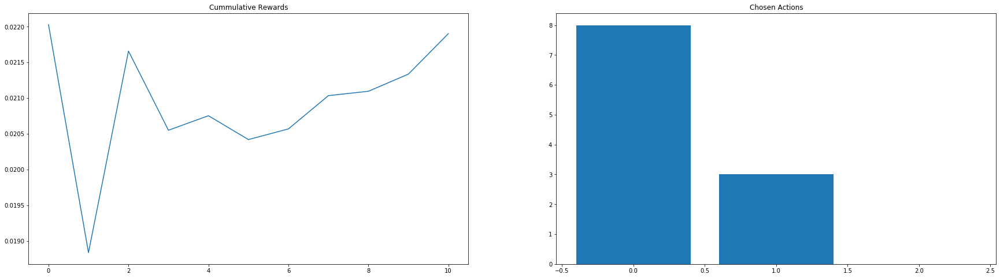

Restart at iteration: 1178
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.021131536363761617, 'merge_sort': 0.02360396666820937, 'heap_sort': 0.02936405000218656}
Count per chosen algo {'quick_sort': 11, 'merge_sort': 3, 'heap_sort': 2}


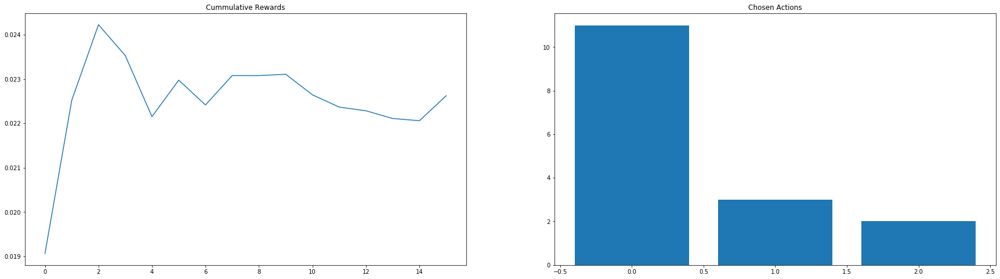

Restart at iteration: 1196
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.01987915833403046, 'merge_sort': 0.0235056999954395, 'heap_sort': 0.031632140005240214}
Count per chosen algo {'quick_sort': 12, 'merge_sort': 1, 'heap_sort': 5}


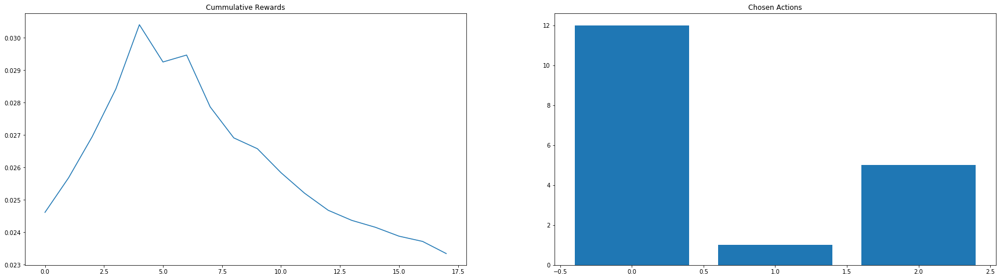

Restart at iteration: 1208
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.019227439997484906, 'merge_sort': 0.02199609999661334, 'heap_sort': 0.03180229999998119}
Count per chosen algo {'quick_sort': 5, 'merge_sort': 2, 'heap_sort': 5}


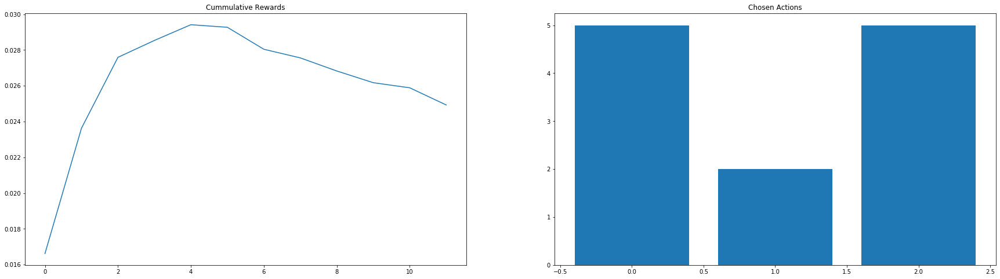

Restart at iteration: 1219
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.021237799999653362, 'merge_sort': 0.022132122224623647, 'heap_sort': 0.03553500000271015}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 9, 'heap_sort': 1}


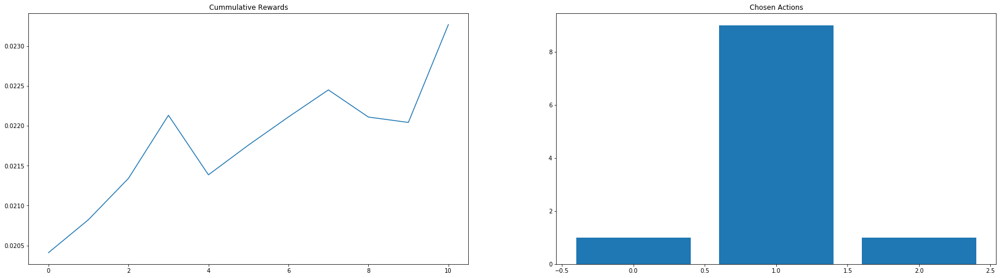

Restart at iteration: 1230
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.02204319999769463, 'merge_sort': 0.02593213333845294, 'heap_sort': 0.03341220000584144}
Count per chosen algo {'quick_sort': 7, 'merge_sort': 3, 'heap_sort': 1}


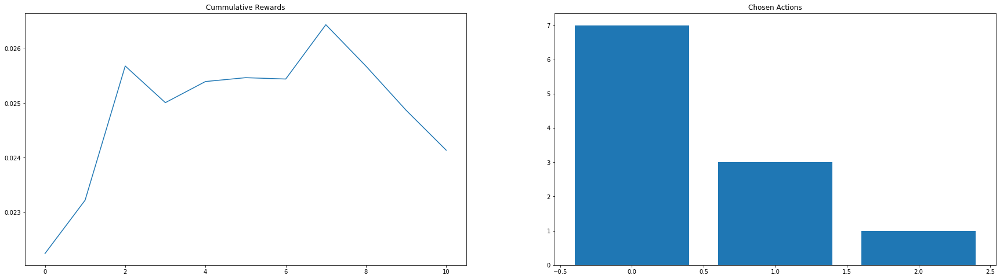

Restart at iteration: 1241
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.023663987498366623, 'merge_sort': 0.02476806667497537, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 8, 'merge_sort': 3, 'heap_sort': 0}


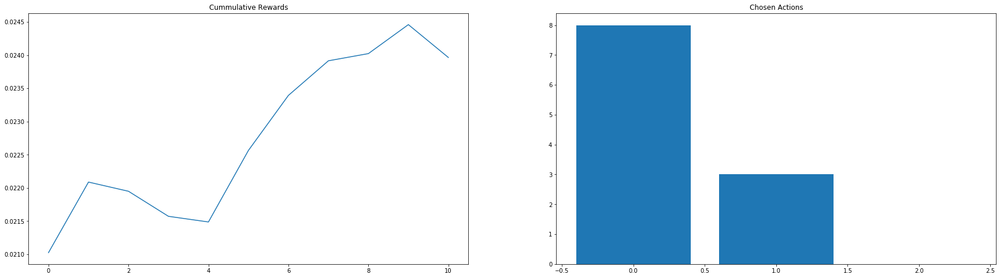

Restart at iteration: 1254
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.020130740001332015, 'merge_sort': 0.02292201428333231, 'heap_sort': 0.027793100001872517}
Count per chosen algo {'quick_sort': 5, 'merge_sort': 7, 'heap_sort': 1}


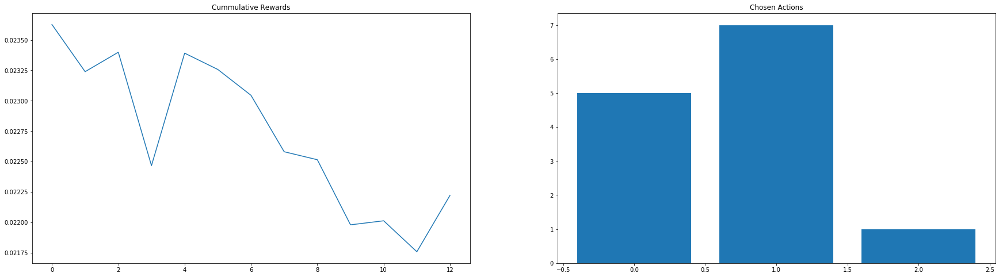

Restart at iteration: 1265
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.019736639998154715, 'merge_sort': 0.023617549995833542, 'heap_sort': 0.03189974999986589}
Count per chosen algo {'quick_sort': 5, 'merge_sort': 4, 'heap_sort': 2}


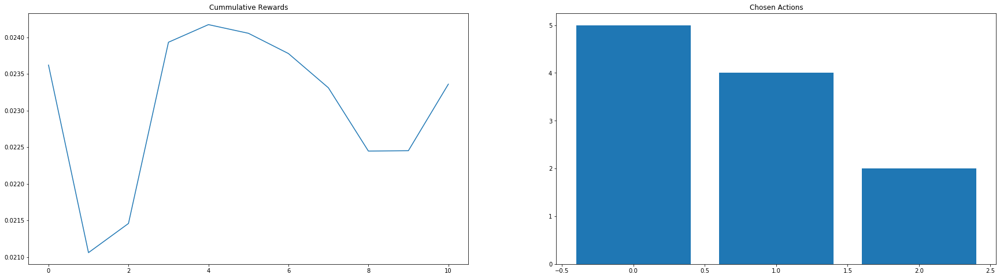

Restart at iteration: 1277
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.02040941666685588, 'merge_sort': 0.01722680000239052, 'heap_sort': 0.03724769999680575}
Count per chosen algo {'quick_sort': 6, 'merge_sort': 1, 'heap_sort': 5}


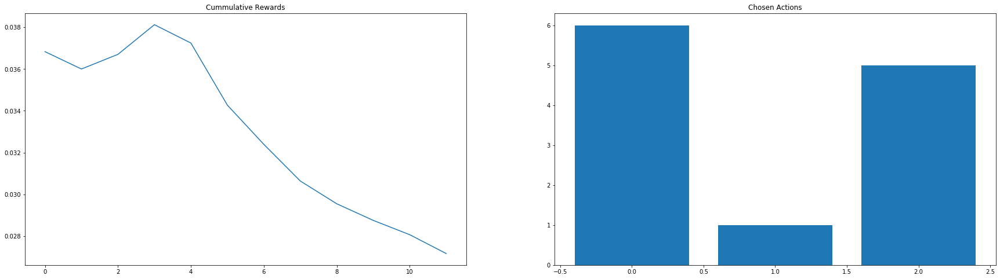

Restart at iteration: 1299
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.020600633332893872, 'merge_sort': 0.022593139996752144, 'heap_sort': 0.03439329999673646}
Count per chosen algo {'quick_sort': 15, 'merge_sort': 5, 'heap_sort': 2}


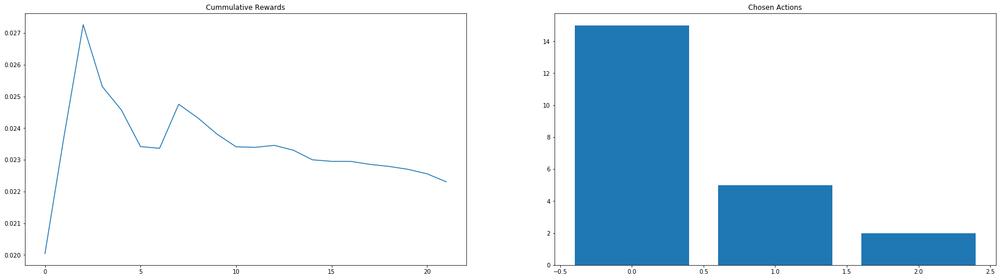

Restart at iteration: 1312
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.020823839999502526, 'merge_sort': 0.021302299996023066, 'heap_sort': 0.034852550001232885}
Count per chosen algo {'quick_sort': 10, 'merge_sort': 1, 'heap_sort': 2}


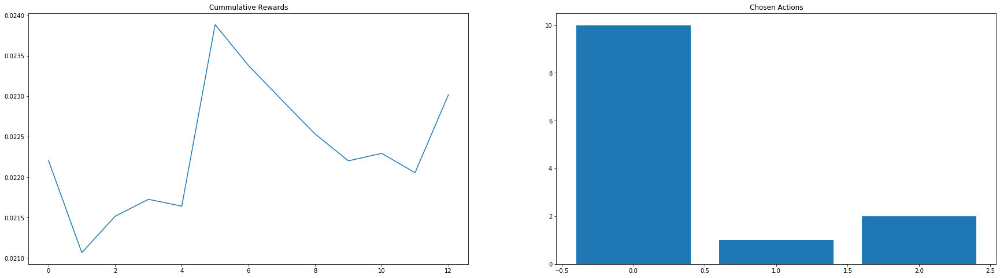

Restart at iteration: 1325
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.019909199999528938, 'merge_sort': 0.023072333334615298, 'heap_sort': 0.029311250000318978}
Count per chosen algo {'quick_sort': 5, 'merge_sort': 6, 'heap_sort': 2}


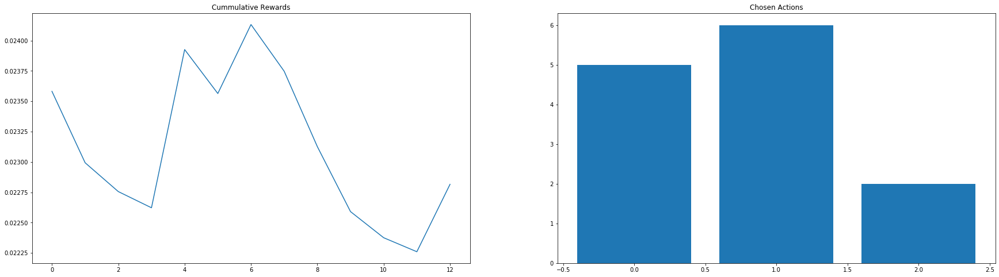

Restart at iteration: 1342
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.01951343636557629, 'merge_sort': 0.02293912500317674, 'heap_sort': 0.030815300007816404}
Count per chosen algo {'quick_sort': 11, 'merge_sort': 4, 'heap_sort': 2}


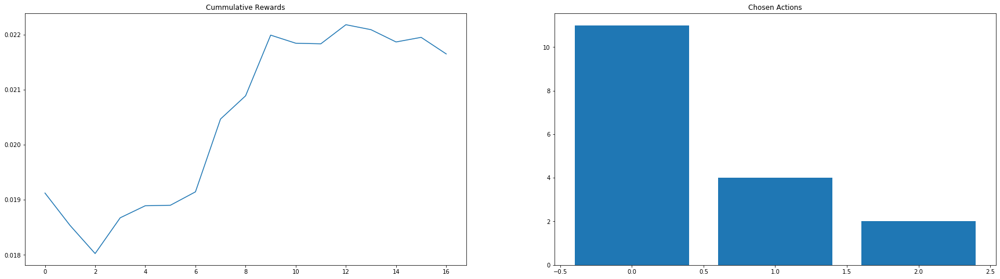

Restart at iteration: 1358
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.020861200013314374, 'merge_sort': 0.024249200000970934, 'heap_sort': 0.031663333332592934}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 12, 'heap_sort': 3}


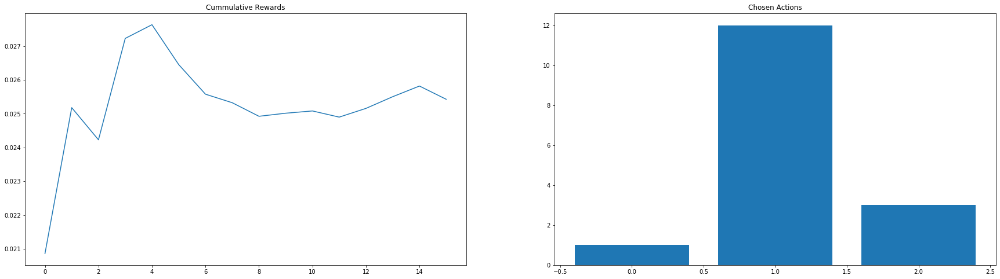

Restart at iteration: 1371
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.020604177782337904, 'merge_sort': 0.026605400002154056, 'heap_sort': 0.034804549999535084}
Count per chosen algo {'quick_sort': 9, 'merge_sort': 2, 'heap_sort': 2}


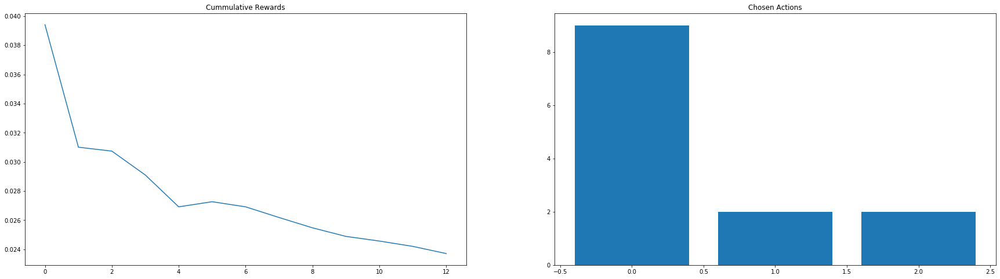

Restart at iteration: 1382
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.021259716668282636, 'merge_sort': 0.024674600004800595, 'heap_sort': 0.029240925003250595}
Count per chosen algo {'quick_sort': 6, 'merge_sort': 1, 'heap_sort': 4}


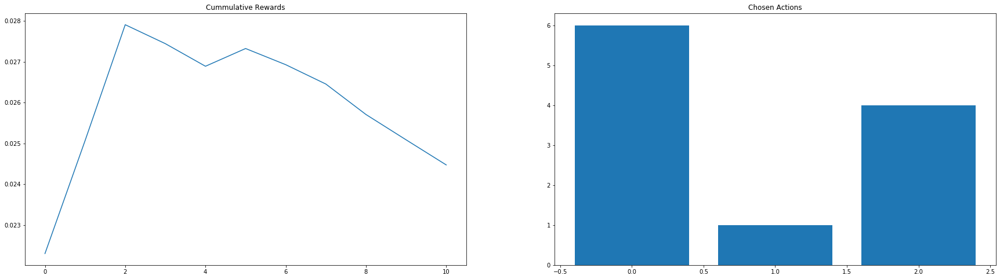

Restart at iteration: 1393
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.019520450002649643, 'merge_sort': 0.023822266671534937, 'heap_sort': 0.035335999993549194}
Count per chosen algo {'quick_sort': 6, 'merge_sort': 3, 'heap_sort': 2}


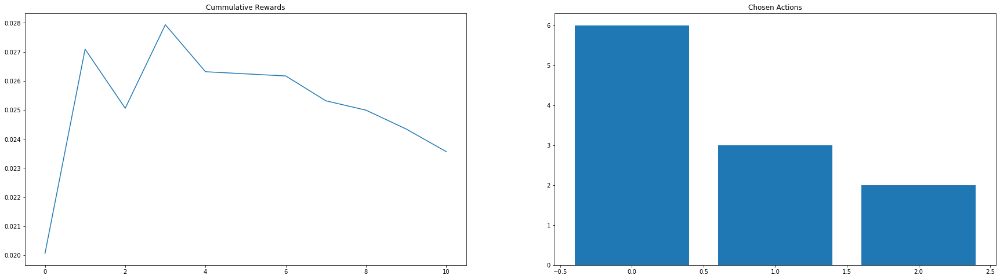

Restart at iteration: 1422
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.02054023200063966, 'merge_sort': 0.025121700004092418, 'heap_sort': 0.030341700003191363}
Count per chosen algo {'quick_sort': 25, 'merge_sort': 2, 'heap_sort': 2}


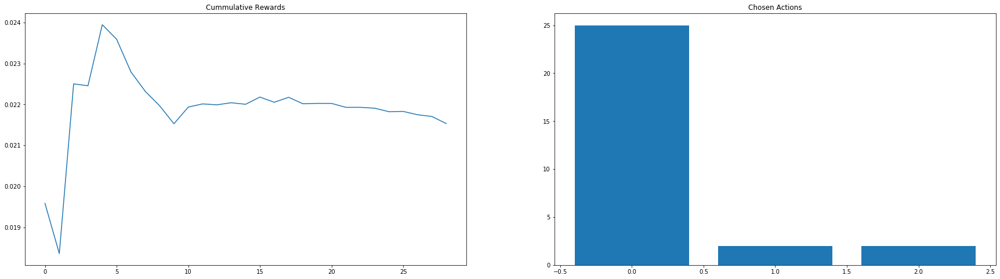

Restart at iteration: 1441
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.019121041666949168, 'merge_sort': 0.024931149993790314, 'heap_sort': 0.030846199998632074}
Count per chosen algo {'quick_sort': 12, 'merge_sort': 2, 'heap_sort': 5}


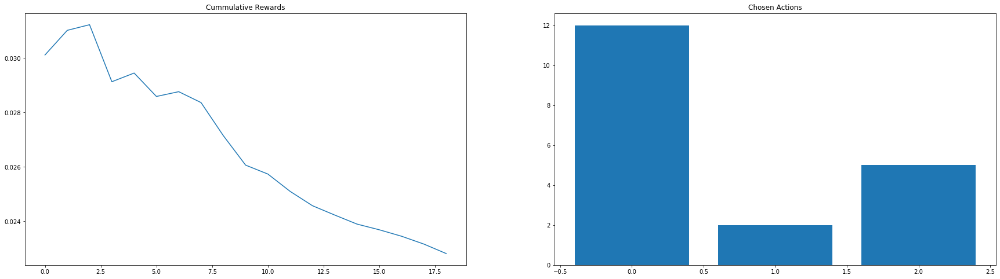

Restart at iteration: 1457
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.020777271432702298, 'merge_sort': 0.022082357139359892, 'heap_sort': 0.0294295499988948}
Count per chosen algo {'quick_sort': 7, 'merge_sort': 7, 'heap_sort': 2}


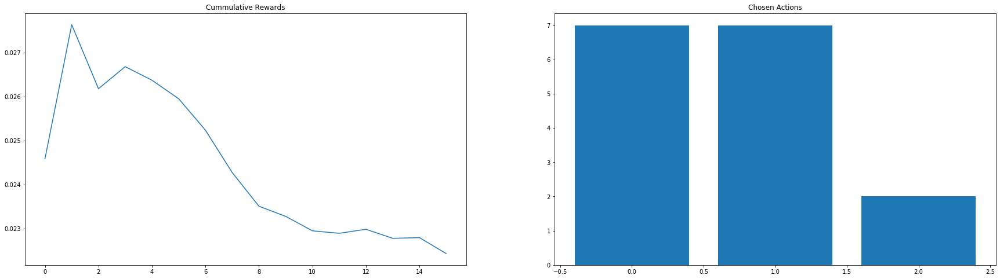

Restart at iteration: 1473
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.02278752000129316, 'merge_sort': 0.021956644444597058, 'heap_sort': 0.030084449994319584}
Count per chosen algo {'quick_sort': 5, 'merge_sort': 9, 'heap_sort': 2}


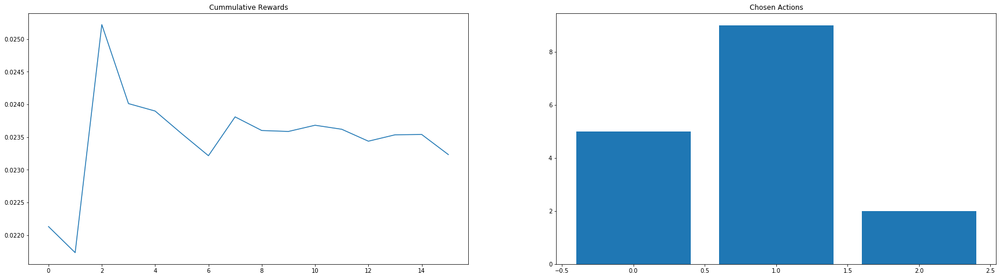

Restart at iteration: 1485
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.019514166667552974, 'merge_sort': 0.024824257143856294, 'heap_sort': 0.04063414999836823}
Count per chosen algo {'quick_sort': 3, 'merge_sort': 7, 'heap_sort': 2}


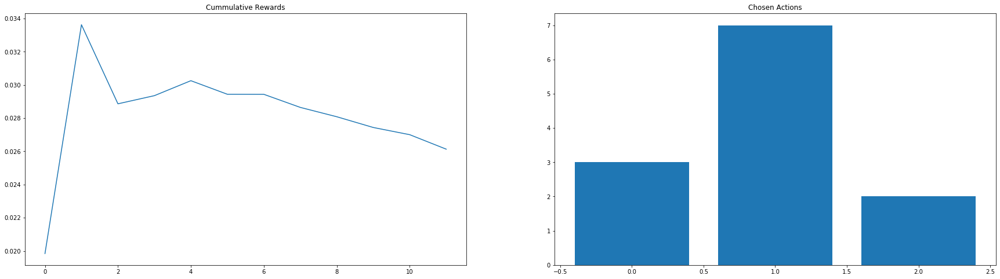

Restart at iteration: 1500
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.018948240000463558, 'merge_sort': 0.024197500002628658, 'heap_sort': 0.030586466668561723}
Count per chosen algo {'quick_sort': 10, 'merge_sort': 2, 'heap_sort': 3}


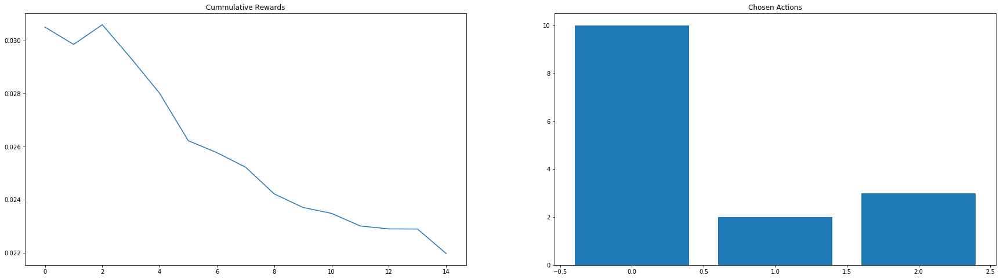

Restart at iteration: 1512
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.006749199994374067, 'merge_sort': 0.0068128222208340755, 'heap_sort': 0.01727934999507852}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 9, 'heap_sort': 2}


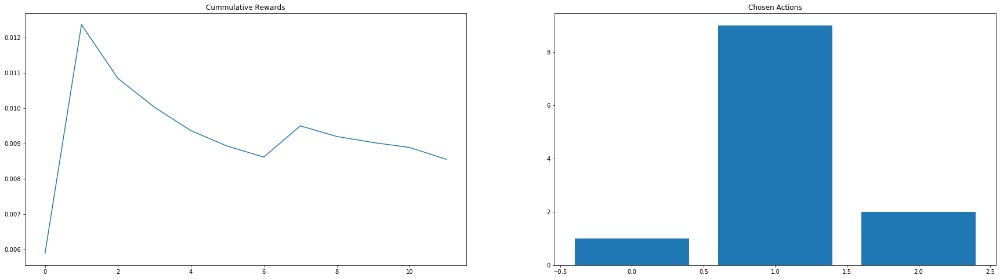

Restart at iteration: 1523
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.005777211109590199, 'heap_sort': 0.014613099992857315}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 9, 'heap_sort': 2}


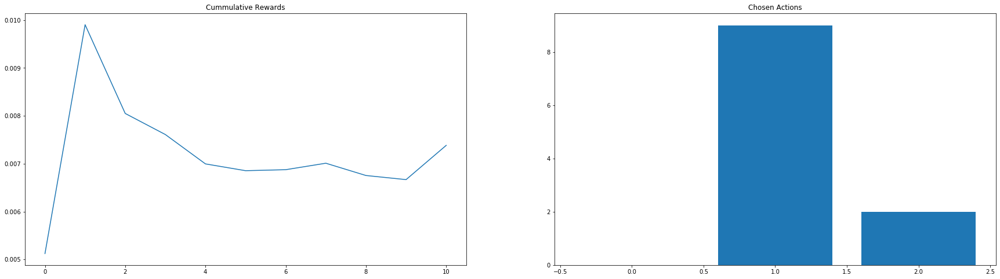

Restart at iteration: 1538
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.00799764999828767, 'merge_sort': 0.0065860083341249265, 'heap_sort': 0.015533600002527237}
Count per chosen algo {'quick_sort': 2, 'merge_sort': 12, 'heap_sort': 1}


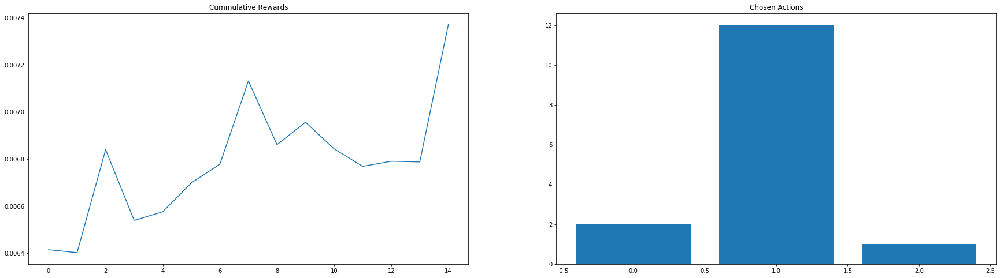

Restart at iteration: 1582
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.009190908821919412, 'merge_sort': 0.0062616249997518025, 'heap_sort': 0.017475016669777688}
Count per chosen algo {'quick_sort': 34, 'merge_sort': 4, 'heap_sort': 6}


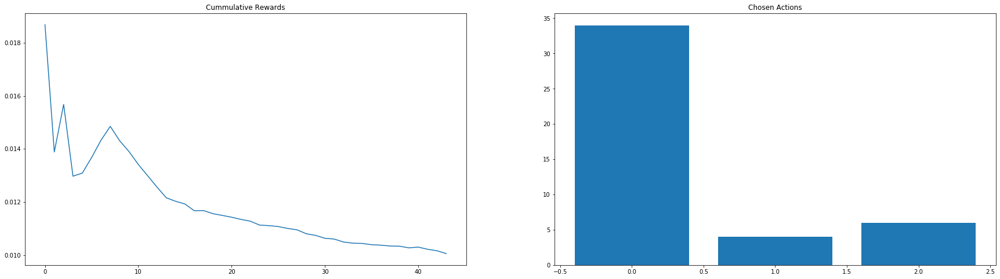

Restart at iteration: 1600
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.009801749998587184, 'merge_sort': 0.007955291663771883, 'heap_sort': 0.013357249990804121}
Count per chosen algo {'quick_sort': 4, 'merge_sort': 12, 'heap_sort': 2}


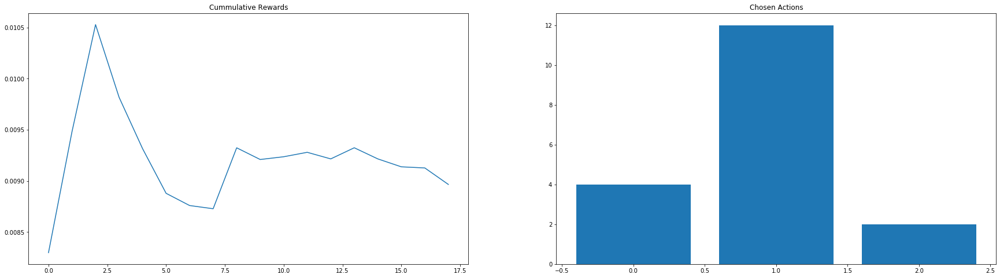

Restart at iteration: 1614
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.009355920006055386, 'merge_sort': 0.0067262571433924934, 'heap_sort': 0.01707515000452986}
Count per chosen algo {'quick_sort': 5, 'merge_sort': 7, 'heap_sort': 2}


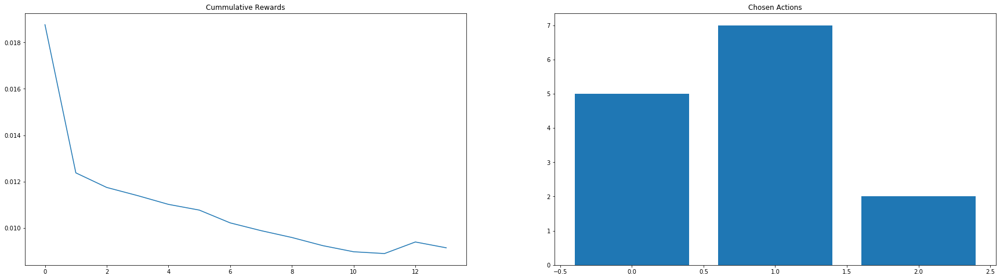

Restart at iteration: 1628
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010580500005744398, 'merge_sort': 0.008057636363611726, 'heap_sort': 0.0197450999985449}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 11, 'heap_sort': 2}


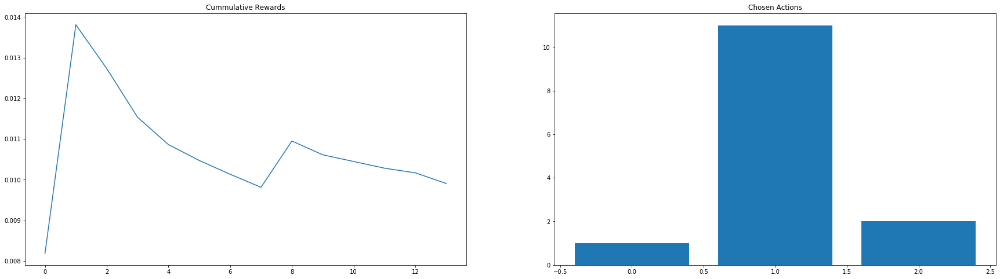

Restart at iteration: 1642
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.01212320000922773, 'merge_sort': 0.00831359999574488, 'heap_sort': 0.018800500001155095}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 2, 'heap_sort': 11}


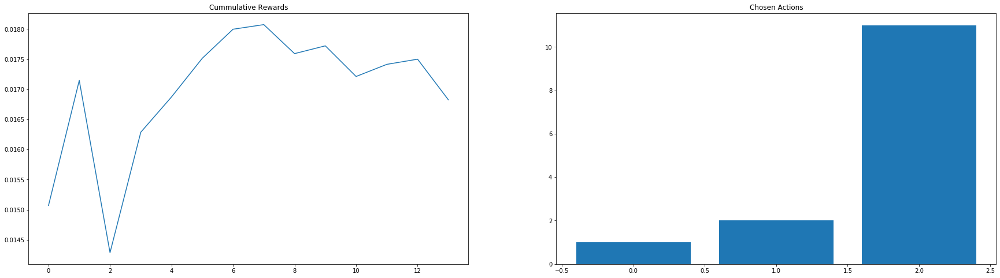

Restart at iteration: 1658
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010669399998732843, 'merge_sort': 0.007894837501225993, 'heap_sort': 0.0187043666713483}
Count per chosen algo {'quick_sort': 5, 'merge_sort': 8, 'heap_sort': 3}


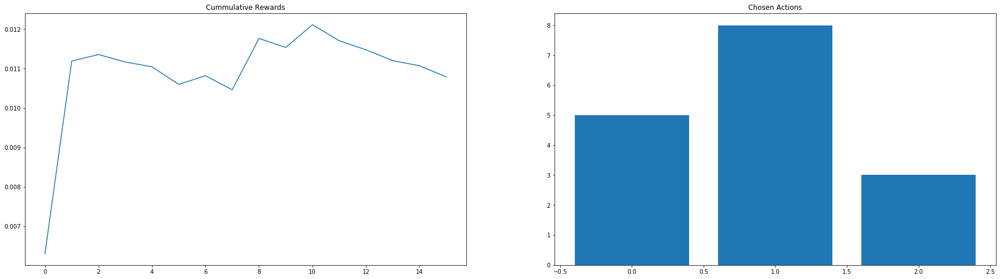

Restart at iteration: 1669
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.007414327271610752, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 11, 'heap_sort': 0}


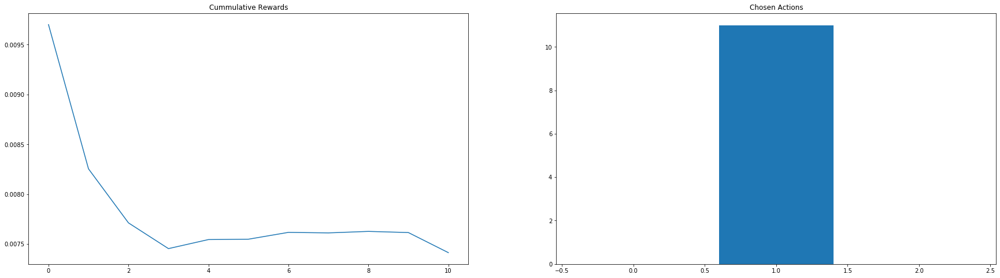

Restart at iteration: 1688
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010800616667741755, 'merge_sort': 0.008244750002631918, 'heap_sort': 0.02248910000489559}
Count per chosen algo {'quick_sort': 12, 'merge_sort': 2, 'heap_sort': 5}


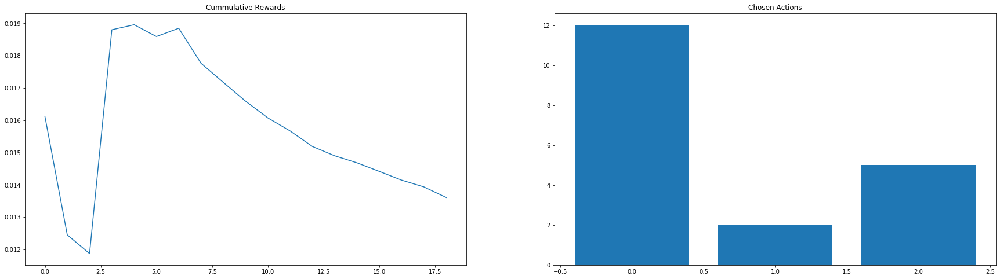

Restart at iteration: 1700
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010915500002738554, 'merge_sort': 0.009420722223391445, 'heap_sort': 0.023606700007803738}
Count per chosen algo {'quick_sort': 2, 'merge_sort': 9, 'heap_sort': 1}


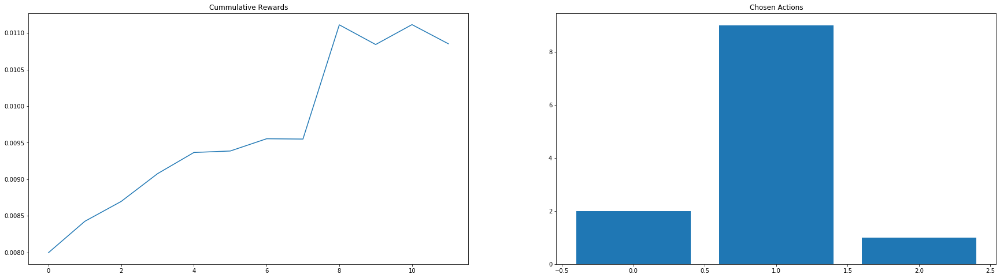

Restart at iteration: 1714
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010913666665146593, 'merge_sort': 0.009077400012756698, 'heap_sort': 0.019756114287052436}
Count per chosen algo {'quick_sort': 6, 'merge_sort': 1, 'heap_sort': 7}


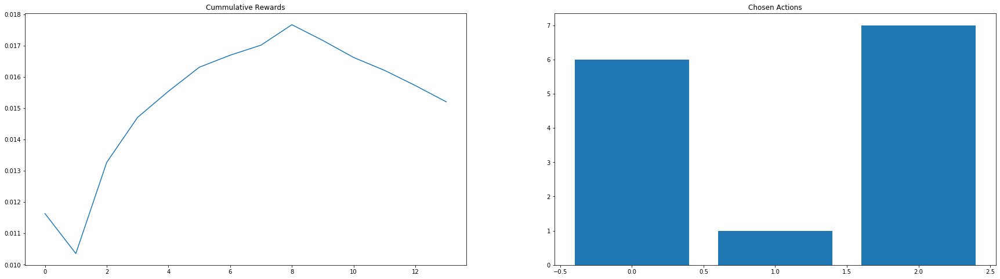

Restart at iteration: 1740
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010167328573256132, 'merge_sort': 0.008343050004623365, 'heap_sort': 0.020735549995151814}
Count per chosen algo {'quick_sort': 14, 'merge_sort': 10, 'heap_sort': 2}


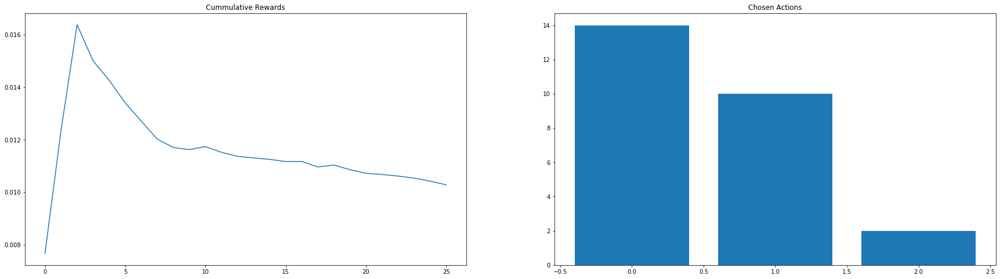

Restart at iteration: 1751
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.0103627666636991, 'merge_sort': 0.008131916666267594, 'heap_sort': 0.019580450003559235}
Count per chosen algo {'quick_sort': 3, 'merge_sort': 6, 'heap_sort': 2}


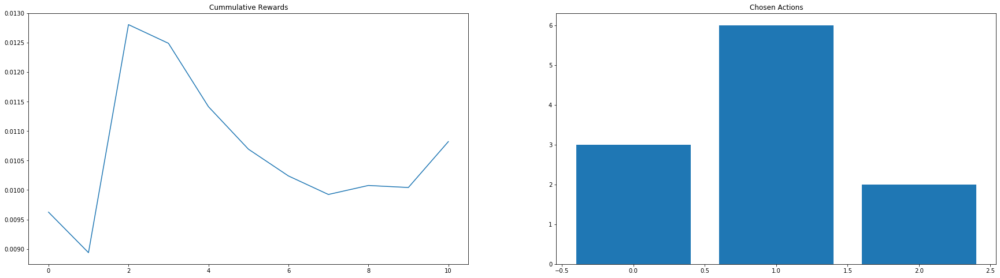

Restart at iteration: 1763
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010782483334575469, 'merge_sort': 0.0, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 12, 'merge_sort': 0, 'heap_sort': 0}


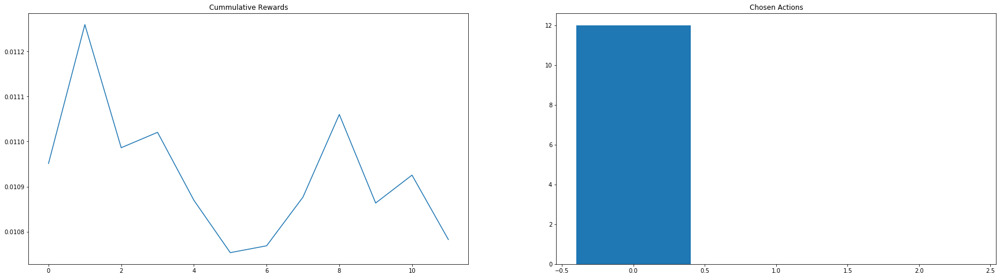

Restart at iteration: 1779
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010942359999171458, 'merge_sort': 0.00769672500246088, 'heap_sort': 0.024858600001607556}
Count per chosen algo {'quick_sort': 10, 'merge_sort': 4, 'heap_sort': 2}


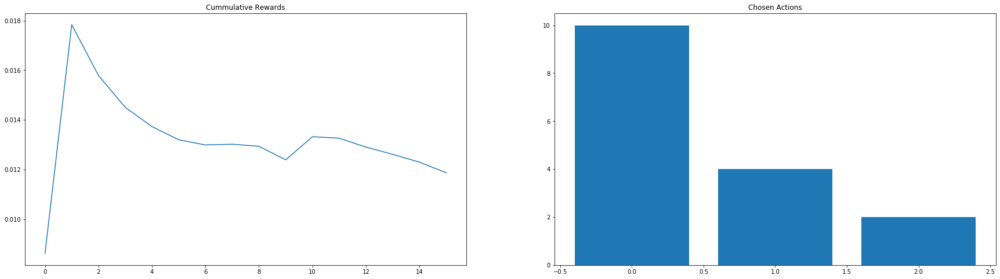

Restart at iteration: 1790
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010213433333168117, 'merge_sort': 0.008488042851760318, 'heap_sort': 0.016627700009848922}
Count per chosen algo {'quick_sort': 3, 'merge_sort': 7, 'heap_sort': 1}


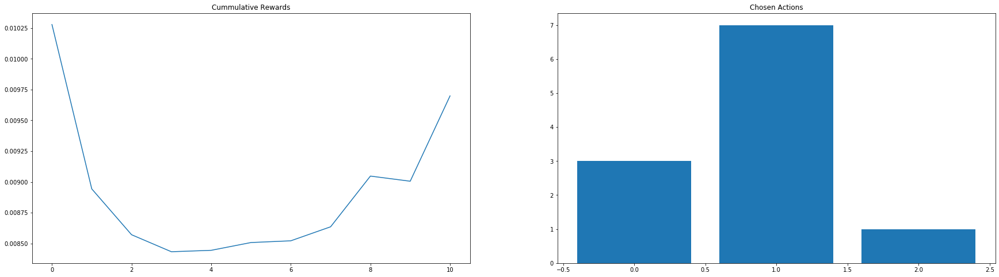

Restart at iteration: 1816
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.00972600000386592, 'merge_sort': 0.008496471428467581, 'heap_sort': 0.018172349999076687}
Count per chosen algo {'quick_sort': 3, 'merge_sort': 21, 'heap_sort': 2}


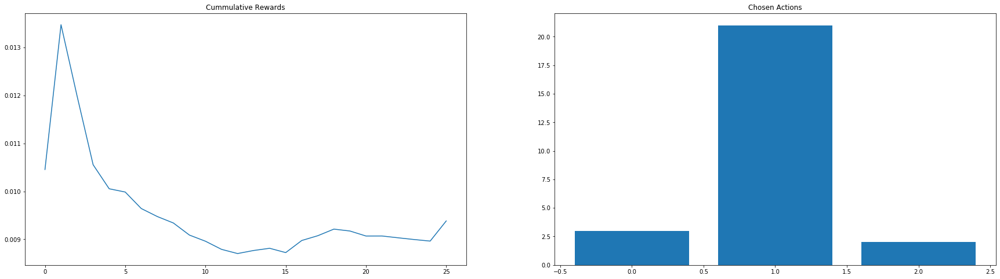

Restart at iteration: 1829
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.012625899995327927, 'merge_sort': 0.007436599999588604, 'heap_sort': 0.0207549833333663}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 6, 'heap_sort': 6}


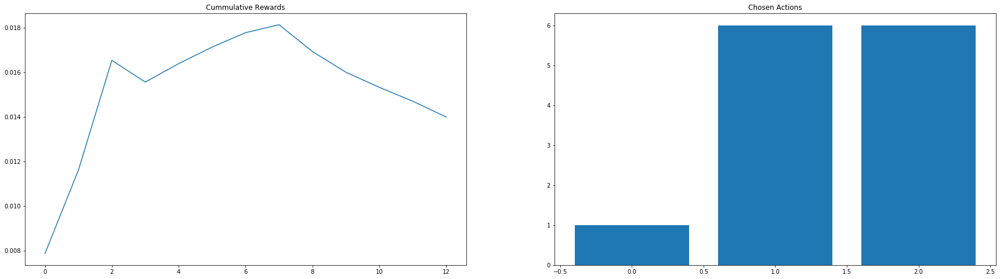

Restart at iteration: 1843
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010990890001994557, 'merge_sort': 0.0065217666706303135, 'heap_sort': 0.018045200005872175}
Count per chosen algo {'quick_sort': 10, 'merge_sort': 3, 'heap_sort': 1}


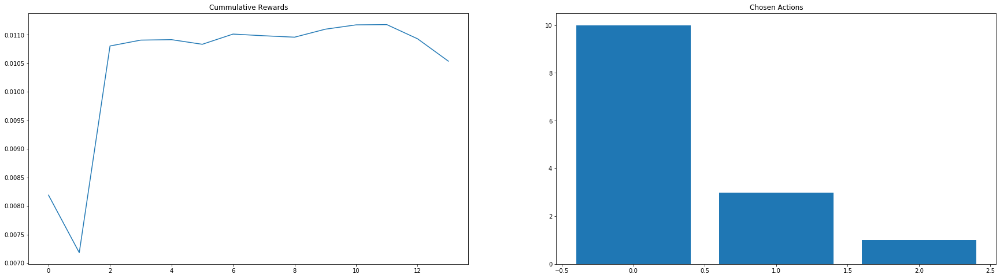

Restart at iteration: 1855
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.011435219997656532, 'merge_sort': 0.006906716669618618, 'heap_sort': 0.01623229999677278}
Count per chosen algo {'quick_sort': 5, 'merge_sort': 6, 'heap_sort': 1}


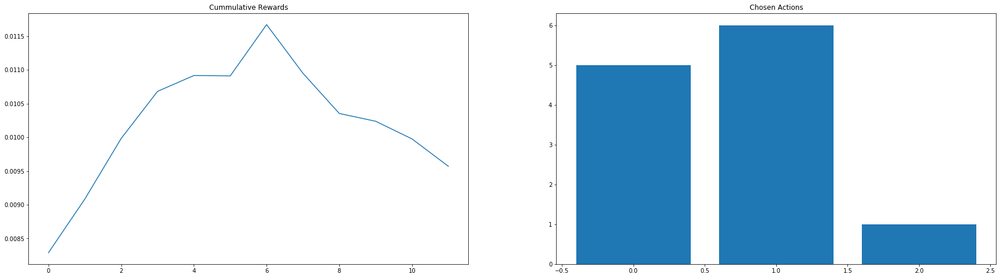

Restart at iteration: 1874
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010298188236500957, 'merge_sort': 0.006749949992808979, 'heap_sort': 0.0}
Count per chosen algo {'quick_sort': 17, 'merge_sort': 2, 'heap_sort': 0}


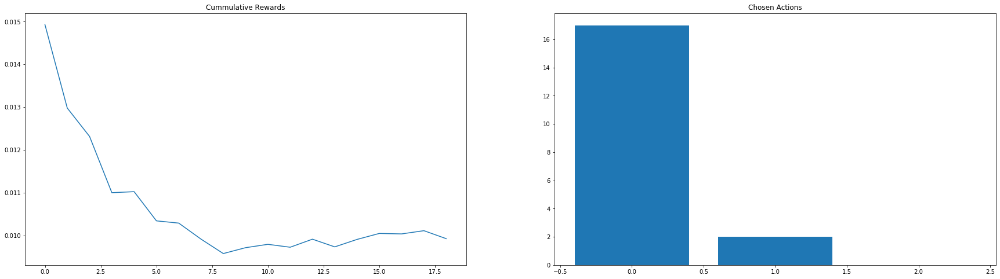

Restart at iteration: 1888
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.00993910000397591, 'merge_sort': 0.00612963636178227, 'heap_sort': 0.018104200004017912}
Count per chosen algo {'quick_sort': 2, 'merge_sort': 11, 'heap_sort': 1}


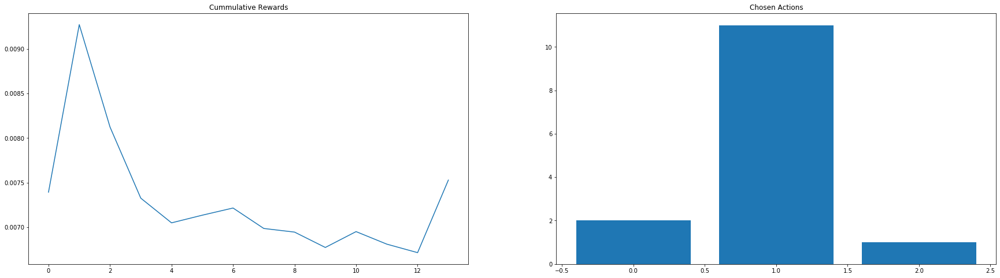

Restart at iteration: 1927
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.008761766667400176, 'merge_sort': 0.006545845454886809, 'heap_sort': 0.01641640000161715}
Count per chosen algo {'quick_sort': 3, 'merge_sort': 33, 'heap_sort': 3}


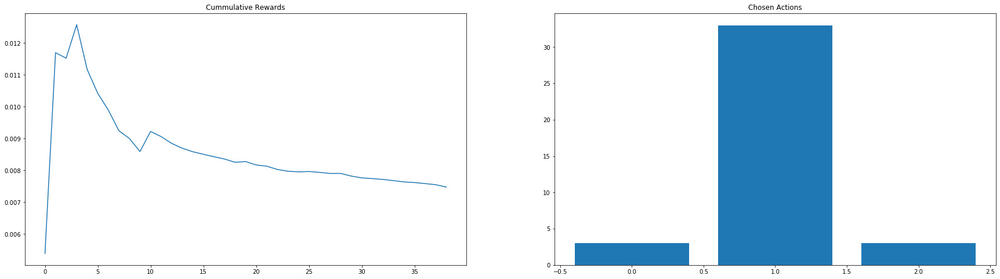

Restart at iteration: 1938
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010241399999358691, 'merge_sort': 0.0071030666666855626, 'heap_sort': 0.017369299996062182}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 9, 'heap_sort': 1}


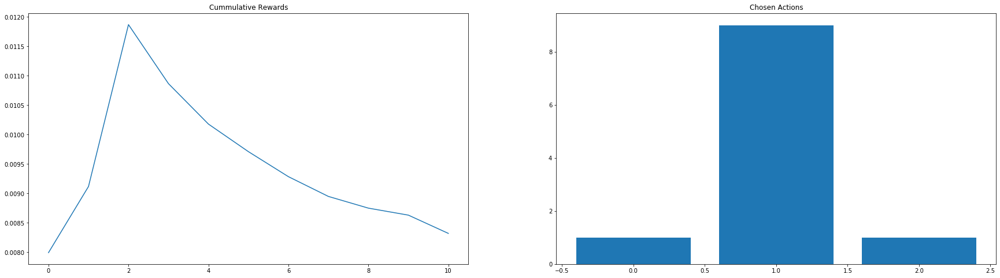

Restart at iteration: 1951
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.0, 'merge_sort': 0.0066948818196330894, 'heap_sort': 0.016985799993562978}
Count per chosen algo {'quick_sort': 0, 'merge_sort': 11, 'heap_sort': 2}


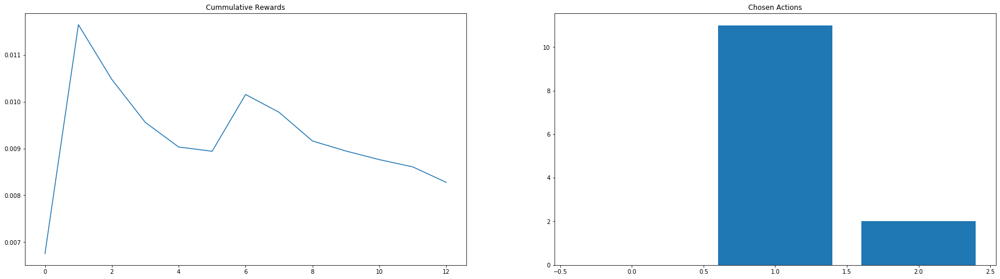

Restart at iteration: 1966
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.009723383335464556, 'merge_sort': 0.007196000005933456, 'heap_sort': 0.015362399994046427}
Count per chosen algo {'quick_sort': 12, 'merge_sort': 1, 'heap_sort': 2}


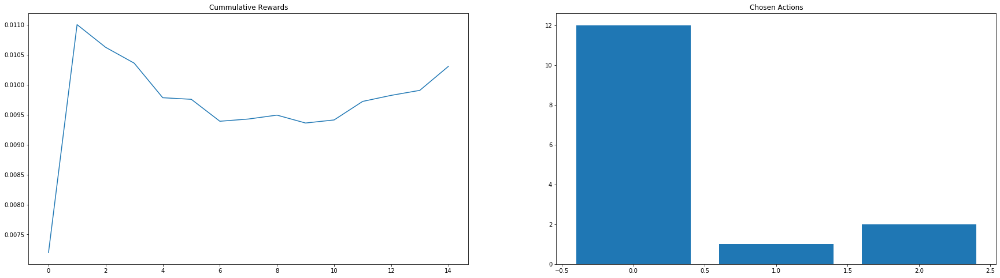

Restart at iteration: 1977
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.009921916663491478, 'merge_sort': 0.0077267499982554, 'heap_sort': 0.018980199994985014}
Count per chosen algo {'quick_sort': 6, 'merge_sort': 4, 'heap_sort': 1}


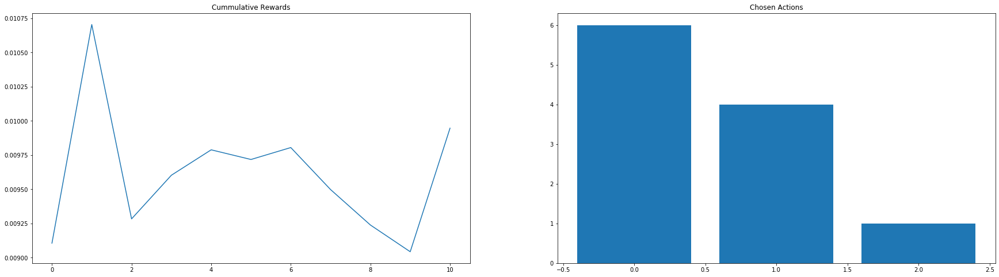

Restart at iteration: 1989
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.009205133324333778, 'merge_sort': 0.007058966669622653, 'heap_sort': 0.015226933338756984}
Count per chosen algo {'quick_sort': 3, 'merge_sort': 6, 'heap_sort': 3}


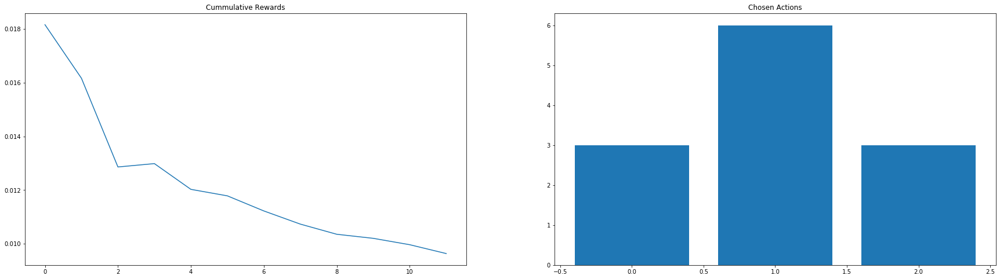

Restart at iteration: 1999
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.00973340000200551, 'merge_sort': 0.006896085717016831, 'heap_sort': 0.02115159999812022}
Count per chosen algo {'quick_sort': 1, 'merge_sort': 7, 'heap_sort': 2}


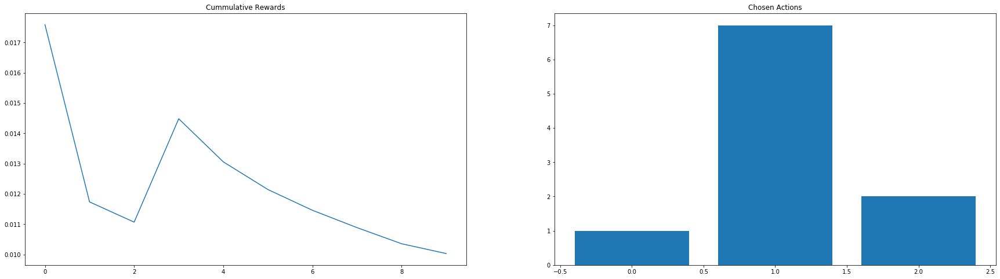

Total reward 33.274


In [42]:
for elem in list_iteration_results_1:
    sample_mean, sample_count,rewards,cum_rewards,n = elem
    print("Restart at iteration:", n)
    print("Results up to this iteration: ")
    plot_history(rewards,cum_rewards, sample_count, sample_mean)
print("Total reward", np.round(total_reward_1,4))

## Two outliers in a row restart the expriment

In [43]:
list_iteration_results_2, total_reward_2, arm_rewards_2 = ts_quantile(list_distributions, n_samples, num_consec_elem=2)



Iteration: 0
Less than two values for quick_sort
quick_sort Theta 0.06477523226441276
Less than two values for merge_sort
merge_sort Theta 0.019165739294759832
Less than two values for heap_sort
heap_sort Theta 0.09893733322706383


Chosen algorithm is:  merge_sort with reward: 0.024304100006702356
Sample mean is:  0.024304100006702356 Sample variance is: 0.0


Iteration: 1
Less than two values for quick_sort
quick_sort Theta 0.03512558827824163
Less than two values for merge_sort
merge_sort Theta 0.0012262416749369899
Less than two values for heap_sort
heap_sort Theta 0.02994075050929662


Chosen algorithm is:  merge_sort with reward: 0.026621099998010322
Sample mean is:  0.02546260000235634 Sample variance is: 1.342122239930279e-06


Iteration: 2
Less than two values for quick_sort
quick_sort Theta 0.09013376705564285
merge_sort Theta 0.030646867261828675
Less than two values for heap_sort
heap_sort Theta 0.06066636332896044


Chosen algorithm is:  merge_sort with reward: 0.0331483



Chosen algorithm is:  merge_sort with reward: 0.0454708000033861
Sample mean is:  0.02676906666723274 Sample variance is: 1.9571142746715584e-05


Iteration: 28
quick_sort Theta 0.04284212136971005
merge_sort Theta 0.026999940101940616
heap_sort Theta 0.06714862610774859


Chosen algorithm is:  merge_sort with reward: 0.023428899992723018
Sample mean is:  0.02663546000025235 Sample variance is: 1.9216714831925566e-05


Iteration: 29
quick_sort Theta 0.04366284121259437
merge_sort Theta 0.02797139065713083
heap_sort Theta 0.06727830486517808


Chosen algorithm is:  merge_sort with reward: 0.024122500006342307
Sample mean is:  0.02653880769279427 Sample variance is: 1.8711152128737316e-05


Iteration: 30
quick_sort Theta 0.04264403210873352
merge_sort Theta 0.027234008110732674
heap_sort Theta 0.05418748108262707


Chosen algorithm is:  merge_sort with reward: 0.023721899997326545
Sample mean is:  0.02643447777814732 Sample variance is: 1.8301149502685893e-05


Iteration: 31
quick_sort


Chosen algorithm is:  merge_sort with reward: 0.02983259999018628
Sample mean is:  0.026927672548267497 Sample variance is: 1.8699266129745633e-05


Iteration: 61
quick_sort Theta 0.03061968076529757
merge_sort Theta 0.02623004388621903
heap_sort Theta 0.06370282205236849


Chosen algorithm is:  merge_sort with reward: 0.027244199998676777
Sample mean is:  0.026933759614621522 Sample variance is: 1.834155452923647e-05


Iteration: 62
quick_sort Theta 0.03242940486346377
merge_sort Theta 0.027715789636013344
heap_sort Theta 0.057862958223756866


Chosen algorithm is:  merge_sort with reward: 0.0263412999920547
Sample mean is:  0.026922581131176865 Sample variance is: 1.8001985304237467e-05


Iteration: 63
quick_sort Theta 0.029217008923138995
merge_sort Theta 0.026395570886172885
heap_sort Theta 0.04541971266261864


Chosen algorithm is:  merge_sort with reward: 0.02401629999803845
Sample mean is:  0.02686876111019282 Sample variance is: 1.782213472292317e-05


Iteration: 64
quick_sort


Iteration: 89
quick_sort Theta 0.020723633041662692
merge_sort Theta 0.027899042470181774
heap_sort Theta 0.03607881454530363


Chosen algorithm is:  quick_sort with reward: 0.021532600003411062
Sample mean is:  0.020801199999469746 Sample variance is: 1.944765743187828e-06


Iteration: 90
quick_sort Theta 0.020925983358201873
merge_sort Theta 0.035061038578054475
heap_sort Theta 0.037888963944010874


Chosen algorithm is:  quick_sort with reward: 0.022071600003982894
Sample mean is:  0.02092823999992106 Sample variance is: 1.8955416243010759e-06


Iteration: 91
quick_sort Theta 0.020372954781473822
merge_sort Theta 0.03417288911672596
heap_sort Theta 0.036204991682019495


Chosen algorithm is:  quick_sort with reward: 0.019405800005188212
Sample mean is:  0.020789836364036255 Sample variance is: 1.9147753227168583e-06


Iteration: 92
quick_sort Theta 0.021211771210772182
merge_sort Theta 0.027184259034163202
heap_sort Theta 0.033351101848005965


Chosen algorithm is:  quick_sort with


Iteration: 120
quick_sort Theta 0.021695223374907202
merge_sort Theta 0.030346256842602358
heap_sort Theta 0.04205693766678776


Chosen algorithm is:  quick_sort with reward: 0.026222599990433082
Sample mean is:  0.022518956410259798 Sample variance is: 1.1164527241548641e-05


Iteration: 121
quick_sort Theta 0.02192460282998454
merge_sort Theta 0.0299249541675139
heap_sort Theta 0.04019300578995236


Chosen algorithm is:  quick_sort with reward: 0.017900400009239092
Sample mean is:  0.022403492500234278 Sample variance is: 1.1405358726726777e-05


Iteration: 122
quick_sort Theta 0.022182595808043482
merge_sort Theta 0.030360754224241268
heap_sort Theta 0.022899090022375532


Chosen algorithm is:  quick_sort with reward: 0.021313899997039698
Sample mean is:  0.022376917073327094 Sample variance is: 1.1155429378199067e-05


Iteration: 123
quick_sort Theta 0.022674897621502536
merge_sort Theta 0.030901204573618574
heap_sort Theta 0.039547698563476744


Chosen algorithm is:  quick_sort w


Chosen algorithm is:  merge_sort with reward: 0.0202075999986846
Sample mean is:  0.026292099998196743 Sample variance is: 2.5673160230944208e-05


Iteration: 152
quick_sort Theta 0.02296355013995334
merge_sort Theta 0.023304556558166427
heap_sort Theta 0.038190634620933646


Chosen algorithm is:  quick_sort with reward: 0.022353500011377037
Sample mean is:  0.02297389565206106 Sample variance is: 2.1220110118290168e-05


Iteration: 153
quick_sort Theta 0.022945028787919503
merge_sort Theta 0.02638430563191498
heap_sort Theta 0.04011728777746372


Chosen algorithm is:  quick_sort with reward: 0.021234200001345016
Sample mean is:  0.02294904285705083 Sample variance is: 2.0959584325996494e-05


Iteration: 154
quick_sort Theta 0.022481389044747505
merge_sort Theta 0.02505358684344422
heap_sort Theta 0.03940736247314802


Chosen algorithm is:  quick_sort with reward: 0.01984249999804888
Sample mean is:  0.022905288732276152 Sample variance is: 2.0798388553390136e-05


Iteration: 155
quic


Iteration: 184
quick_sort Theta 0.022758009650063544
merge_sort Theta 0.028353740547765138
heap_sort Theta 0.03303251541492427


Chosen algorithm is:  quick_sort with reward: 0.025652100011939183
Sample mean is:  0.022679073000326753 Sample variance is: 1.801438424628533e-05


Iteration: 185
quick_sort Theta 0.022995445470818644
merge_sort Theta 0.02950694928579412
heap_sort Theta 0.03660524112057919


Chosen algorithm is:  quick_sort with reward: 0.017902600011439063
Sample mean is:  0.022631781188555588 Sample variance is: 1.8059675552283033e-05


Iteration: 186
quick_sort Theta 0.022567392421040458
merge_sort Theta 0.028615530371279795
heap_sort Theta 0.03687262781207174


Chosen algorithm is:  quick_sort with reward: 0.021578200001385994
Sample mean is:  0.022621451961230395 Sample variance is: 1.7893395896264278e-05


Iteration: 187
quick_sort Theta 0.02347137941101268
merge_sort Theta 0.019272576328822257
heap_sort Theta 0.03990715330938254


Chosen algorithm is:  merge_sort wit



Chosen algorithm is:  quick_sort with reward: 0.02181959999143146
Sample mean is:  0.02181959999143146 Sample variance is: 0.0


Iteration: 218
Less than two values for quick_sort
quick_sort Theta 0.07722130204955079
Less than two values for merge_sort
merge_sort Theta 0.012479480043694192
Less than two values for heap_sort
heap_sort Theta 0.05987782034880615


Chosen algorithm is:  merge_sort with reward: 0.02559330000076443
Sample mean is:  0.02559330000076443 Sample variance is: 0.0


Iteration: 219
Less than two values for quick_sort
quick_sort Theta 0.06490962068312249
Less than two values for merge_sort
merge_sort Theta 0.04907358973992998
Less than two values for heap_sort
heap_sort Theta 0.03472337933246803


Chosen algorithm is:  heap_sort with reward: 0.029770000008284114
Sample mean is:  0.026743000009446405 Sample variance is: 9.162728992963493e-06


Iteration: 220
Less than two values for quick_sort
quick_sort Theta 0.0909946412062947
Less than two values for merge_sort




Chosen algorithm is:  quick_sort with reward: 0.025410200003534555
Sample mean is:  0.02103288260949067 Sample variance is: 1.5593433626156342e-05


Iteration: 249
quick_sort Theta 0.020415645542007088
merge_sort Theta 0.025154083635918846
heap_sort Theta 0.030501856312250174


Chosen algorithm is:  quick_sort with reward: 0.023751399989123456
Sample mean is:  0.021146154166975368 Sample variance is: 1.5238807476971713e-05


Iteration: 250
quick_sort Theta 0.0201770097705843
merge_sort Theta 0.02426010742856544
heap_sort Theta 0.02838050861011913


Chosen algorithm is:  quick_sort with reward: 0.02056179998908192
Sample mean is:  0.02112277999985963 Sample variance is: 1.4642367618413353e-05


Iteration: 251
quick_sort Theta 0.020553268842181557
merge_sort Theta 0.025133398477105603
heap_sort Theta 0.026397645795043105


Chosen algorithm is:  quick_sort with reward: 0.01754590000200551
Sample mean is:  0.020985207692249857 Sample variance is: 1.455235312861672e-05


Iteration: 252
qu


Chosen algorithm is:  quick_sort with reward: 0.01713500000187196
Sample mean is:  0.020656954716475908 Sample variance is: 1.1326690167418854e-05


Iteration: 280
quick_sort Theta 0.020513800824915187
merge_sort Theta 0.024145335808524813
heap_sort Theta 0.029139143923747696


Chosen algorithm is:  quick_sort with reward: 0.028391100000590086
Sample mean is:  0.02080017962914469 Sample variance is: 1.2204145553075926e-05


Iteration: 281
quick_sort Theta 0.020659759721391682
merge_sort Theta 0.02470452119609226
heap_sort Theta 0.027075186933688242


Chosen algorithm is:  quick_sort with reward: 0.02178309998998884
Sample mean is:  0.020818050908432764 Sample variance is: 1.1999498659228643e-05


Iteration: 282
quick_sort Theta 0.020671566739882973
merge_sort Theta 0.02351480226731041
heap_sort Theta 0.03074467747745233


Chosen algorithm is:  quick_sort with reward: 0.017512199992779642
Sample mean is:  0.02075901785636753 Sample variance is: 1.197689146544422e-05


Iteration: 283
qu


Iteration: 310
quick_sort Theta 0.020043608445184994
merge_sort Theta 0.023850742022089644
heap_sort Theta 0.026469351057615068


Chosen algorithm is:  quick_sort with reward: 0.023770500003593042
Sample mean is:  0.0207361809516442 Sample variance is: 1.0218254388570695e-05


Iteration: 311
quick_sort Theta 0.02064939699439724
merge_sort Theta 0.024828526420602532
heap_sort Theta 0.03131005796470817


Chosen algorithm is:  quick_sort with reward: 0.0204204000037862
Sample mean is:  0.0207324658816694 Sample variance is: 1.009919897763118e-05


Iteration: 312
quick_sort Theta 0.021286138149855183
merge_sort Theta 0.02472716086269651
heap_sort Theta 0.029412252807835697


Chosen algorithm is:  quick_sort with reward: 0.02024369999708142
Sample mean is:  0.020726782557430004 Sample variance is: 9.984511946204514e-06


Iteration: 313
quick_sort Theta 0.020804685406508285
merge_sort Theta 0.023585549749975683
heap_sort Theta 0.032320036321901134


Chosen algorithm is:  quick_sort with rew



Chosen algorithm is:  merge_sort with reward: 0.04468410000845324
Sample mean is:  0.04149520000646589 Sample variance is: 1.0169083222674917e-05


Iteration: 341
Less than two values for quick_sort
quick_sort Theta 0.0323053379686157
merge_sort Theta 0.041245766339404605
Less than two values for heap_sort
heap_sort Theta 0.08602576072429353


Chosen algorithm is:  quick_sort with reward: 0.05614800000330433
Sample mean is:  0.05614800000330433 Sample variance is: 0.0


Iteration: 342
Less than two values for quick_sort
quick_sort Theta 0.0655181557144592
merge_sort Theta 0.04017126475731284
Less than two values for heap_sort
heap_sort Theta 0.055506591437878776


Chosen algorithm is:  merge_sort with reward: 0.02764970000134781
Sample mean is:  0.0368800333380932 Sample variance is: 4.9378915568833246e-05


Iteration: 343
Less than two values for quick_sort
quick_sort Theta 0.024113375857830757
merge_sort Theta 0.03761023888461127
Less than two values for heap_sort
heap_sort Theta 0


Chosen algorithm is:  merge_sort with reward: 0.02270239999052137
Sample mean is:  0.02591827619055818 Sample variance is: 4.359199810157476e-05


Iteration: 369
quick_sort Theta 0.029290887430032643
merge_sort Theta 0.026478258056181175
heap_sort Theta 0.07717998056883588


Chosen algorithm is:  merge_sort with reward: 0.031028800003696233
Sample mean is:  0.026150572727519004 Sample variance is: 4.274373894517605e-05


Iteration: 370
quick_sort Theta 0.03500053304023095
merge_sort Theta 0.024202770119838974
heap_sort Theta 0.043571657661659755


Chosen algorithm is:  merge_sort with reward: 0.030912000001990236
Sample mean is:  0.026357591304669924 Sample variance is: 4.182816272106013e-05


Iteration: 371
quick_sort Theta 0.0035296930890749353
merge_sort Theta 0.027172676997068268
heap_sort Theta 0.040191920966873906


Chosen algorithm is:  quick_sort with reward: 0.021688500011805445
Sample mean is:  0.02433592857102797 Sample variance is: 0.0001813310281685128


Iteration: 372
qu


Chosen algorithm is:  quick_sort with reward: 0.01604329999827314
Sample mean is:  0.020174959376618062 Sample variance is: 4.6037734499546294e-05


Iteration: 402
quick_sort Theta 0.019336307841201685
merge_sort Theta 0.026262676256057618
heap_sort Theta 0.03940407937382779


Chosen algorithm is:  quick_sort with reward: 0.020980300003429875
Sample mean is:  0.0201993636380366 Sample variance is: 4.466170981113599e-05


Iteration: 403
quick_sort Theta 0.0194943574511026
merge_sort Theta 0.024671168460312993
heap_sort Theta 0.024581762859326797


Chosen algorithm is:  quick_sort with reward: 0.01589589999639429
Sample mean is:  0.020072791177988297 Sample variance is: 4.387680950301687e-05


Iteration: 404
quick_sort Theta 0.021237754224906178
merge_sort Theta 0.025792055405935523
heap_sort Theta 0.04414701457348711


Chosen algorithm is:  quick_sort with reward: 0.01763629999186378
Sample mean is:  0.02000317714409903 Sample variance is: 4.278795424064669e-05


Iteration: 405
quick_s


Iteration: 431
quick_sort Theta 0.018779898260196843
merge_sort Theta 0.023073643473376572
heap_sort Theta 0.037506354469709624


Chosen algorithm is:  quick_sort with reward: 0.022315000009257346
Sample mean is:  0.01966784354895466 Sample variance is: 2.6734628129291153e-05


Iteration: 432
quick_sort Theta 0.019015007779144364
merge_sort Theta 0.026184024567374554
heap_sort Theta 0.04345391700011253


Chosen algorithm is:  quick_sort with reward: 0.017182199997478165
Sample mean is:  0.019628388889407412 Sample variance is: 2.640678250255507e-05


Iteration: 433
quick_sort Theta 0.019661453947965278
merge_sort Theta 0.02762995099352334
heap_sort Theta 0.03998169287204287


Chosen algorithm is:  quick_sort with reward: 0.017033600001013838
Sample mean is:  0.019587845313026264 Sample variance is: 2.609773476585642e-05


Iteration: 434
quick_sort Theta 0.01937361424821951
merge_sort Theta 0.025756864854957963
heap_sort Theta 0.036629203989434214


Chosen algorithm is:  quick_sort wit


Chosen algorithm is:  quick_sort with reward: 0.021004100010031834
Sample mean is:  0.01998618043533339 Sample variance is: 2.1510949391546088e-05


Iteration: 462
quick_sort Theta 0.0206202482866309
merge_sort Theta 0.027024854742605908
heap_sort Theta 0.04106981267035515


Chosen algorithm is:  quick_sort with reward: 0.02141729999857489
Sample mean is:  0.020001568817733836 Sample variance is: 2.130143467324121e-05


Iteration: 463
quick_sort Theta 0.019836577020392647
merge_sort Theta 0.02353791983914138
heap_sort Theta 0.04788143399337907


Chosen algorithm is:  quick_sort with reward: 0.030400599993299693
Sample mean is:  0.02011219680896326 Sample variance is: 2.2213009043320616e-05


Iteration: 464
quick_sort Theta 0.019591844230856522
merge_sort Theta 0.023650840445841644
heap_sort Theta 0.04478072991819901


Chosen algorithm is:  quick_sort with reward: 0.029029700002865866
Sample mean is:  0.02020606526363592 Sample variance is: 2.2807448853063713e-05


Iteration: 465
quick


Chosen algorithm is:  quick_sort with reward: 0.03411249999771826
Sample mean is:  0.02146685365928201 Sample variance is: 5.171813806279887e-05


Iteration: 494
quick_sort Theta 0.022315956808223493
merge_sort Theta 0.02387092815501748
heap_sort Theta 0.03764683651083481


Chosen algorithm is:  quick_sort with reward: 0.03208679999806918
Sample mean is:  0.021552498387820612 Sample variance is: 5.220326370598146e-05


Iteration: 495
quick_sort Theta 0.02039885364047228
merge_sort Theta 0.024983462262650608
heap_sort Theta 0.04181583051367011


Chosen algorithm is:  quick_sort with reward: 0.019801900009042583
Sample mean is:  0.02153849360079039 Sample variance is: 5.1809958219744096e-05


Iteration: 496
quick_sort Theta 0.022083131880042527
merge_sort Theta 0.024397935477948066
heap_sort Theta 0.03959020265873096


Chosen algorithm is:  quick_sort with reward: 0.020834599999943748
Sample mean is:  0.02153290714364081 Sample variance is: 5.140266913807845e-05


Iteration: 497
quick_s


Iteration: 520
Less than two values for quick_sort
quick_sort Theta 0.030694724268432772
Less than two values for merge_sort
merge_sort Theta 0.018553736397247278
heap_sort Theta 0.01795474931487379


Chosen algorithm is:  heap_sort with reward: 0.018066300006466918
Sample mean is:  0.01801515882321195 Sample variance is: 9.469961541403591e-06


Iteration: 521
Less than two values for quick_sort
quick_sort Theta 0.06366760404772108
Less than two values for merge_sort
merge_sort Theta 0.05675899435075955
heap_sort Theta 0.01720992834149792


Chosen algorithm is:  heap_sort with reward: 0.016236399998888373
Sample mean is:  0.017916338888527308 Sample variance is: 9.109864018229481e-06


Iteration: 522
Less than two values for quick_sort
quick_sort Theta 0.0634880080096379
Less than two values for merge_sort
merge_sort Theta 0.06453123391348708
heap_sort Theta 0.01738185951323883


Chosen algorithm is:  heap_sort with reward: 0.019390500005101785
Sample mean is:  0.017993926315715437 Sa


Iteration: 545
quick_sort Theta 0.01050643316100409
merge_sort Theta 0.00725591536196077
Less than two values for heap_sort
heap_sort Theta 0.04806363031668978


Chosen algorithm is:  merge_sort with reward: 0.007205299989436753
Sample mean is:  0.007422533332525442 Sample variance is: 1.8573404231895092e-06


Iteration: 546
quick_sort Theta 0.00941251239251515
merge_sort Theta 0.0072341781406887375
Less than two values for heap_sort
heap_sort Theta 0.06260816684251602


Chosen algorithm is:  merge_sort with reward: 0.006677099998341873
Sample mean is:  0.007365192306819013 Sample variance is: 1.7539240016929458e-06


Iteration: 547
quick_sort Theta 0.008626697723564457
merge_sort Theta 0.007236306630264949
Less than two values for heap_sort
heap_sort Theta 0.08266177111167357


Chosen algorithm is:  merge_sort with reward: 0.00815189999411814
Sample mean is:  0.007421385713054666 Sample variance is: 1.6696938016144804e-06


Iteration: 548
quick_sort Theta 0.010641489263475376
merge_s


Iteration: 575
quick_sort Theta 0.009808125124614316
merge_sort Theta 0.007314777435285922
heap_sort Theta 0.01760473647771768


Chosen algorithm is:  merge_sort with reward: 0.007274200004758313
Sample mean is:  0.007675407692052734 Sample variance is: 4.872558760605929e-06


Iteration: 576
quick_sort Theta 0.009673165023930464
merge_sort Theta 0.0077672800083457985
heap_sort Theta 0.019850678768598837


Chosen algorithm is:  merge_sort with reward: 0.006812899999204092
Sample mean is:  0.007653844999731518 Sample variance is: 4.768877829896218e-06


Iteration: 577
quick_sort Theta 0.010107978807741141
merge_sort Theta 0.007618760104554825
heap_sort Theta 0.015797186961808173


Chosen algorithm is:  merge_sort with reward: 0.007005199993727729
Sample mean is:  0.007638024389828987 Sample variance is: 4.662575404391638e-06


Iteration: 578
quick_sort Theta 0.009795424499124225
merge_sort Theta 0.00790005897710101
heap_sort Theta 0.017201363748793


Chosen algorithm is:  merge_sort wit


Iteration: 609
quick_sort Theta 0.010057737426946675
merge_sort Theta 0.007370606583520234
heap_sort Theta 0.016202257172071785


Chosen algorithm is:  merge_sort with reward: 0.00675760000012815
Sample mean is:  0.0072630338030982055 Sample variance is: 3.7082522054375496e-06


Iteration: 610
quick_sort Theta 0.010192753834978596
merge_sort Theta 0.007111592150103626
heap_sort Theta 0.016161205724815032


Chosen algorithm is:  merge_sort with reward: 0.004787500001839362
Sample mean is:  0.007228651389191832 Sample variance is: 3.7406813799923185e-06


Iteration: 611
quick_sort Theta 0.008049773974243106
merge_sort Theta 0.007136650124662473
heap_sort Theta 0.016556512485691857


Chosen algorithm is:  merge_sort with reward: 0.006397699995432049
Sample mean is:  0.007217268493386904 Sample variance is: 3.698768232124715e-06


Iteration: 612
quick_sort Theta 0.009288968675794426
merge_sort Theta 0.007251497161283748
heap_sort Theta 0.014274891744598587


Chosen algorithm is:  merge_so


Iteration: 642
quick_sort Theta 0.009914125196825406
merge_sort Theta 0.007273007488453064
heap_sort Theta 0.01594631136771005


Chosen algorithm is:  merge_sort with reward: 0.007249500005855225
Sample mean is:  0.0070924307696819035 Sample variance is: 2.9768008458783393e-06


Iteration: 643
quick_sort Theta 0.009144087712730793
merge_sort Theta 0.0070283813195862665
heap_sort Theta 0.016638257630590802


Chosen algorithm is:  merge_sort with reward: 0.007756699997116812
Sample mean is:  0.0070987571432765215 Sample variance is: 2.9526127539291823e-06


Iteration: 644
quick_sort Theta 0.009952784823864146
merge_sort Theta 0.007031207485893763
heap_sort Theta 0.01630921621496016


Chosen algorithm is:  merge_sort with reward: 0.0065347000054316595
Sample mean is:  0.007093435849523268 Sample variance is: 2.9277311141848462e-06


Iteration: 645
quick_sort Theta 0.008973580677441443
merge_sort Theta 0.0073035909711387775
heap_sort Theta 0.015371306429890569


Chosen algorithm is:  merg



Chosen algorithm is:  merge_sort with reward: 0.007893400004832074
Sample mean is:  0.007062878832518443 Sample variance is: 2.7447883810326155e-06


Iteration: 676
quick_sort Theta 0.008765217508505717
merge_sort Theta 0.0070886606374470085
heap_sort Theta 0.016235873742879072


Chosen algorithm is:  merge_sort with reward: 0.004945699998643249
Sample mean is:  0.0070475369569106515 Sample variance is: 2.757144731317164e-06


Iteration: 677
quick_sort Theta 0.00925159684094052
merge_sort Theta 0.006974729938313898
heap_sort Theta 0.016458623513428756


Chosen algorithm is:  merge_sort with reward: 0.00867320000543259
Sample mean is:  0.007059232374525917 Sample variance is: 2.75618518317154e-06


Iteration: 678
quick_sort Theta 0.008571472048721343
merge_sort Theta 0.00704944712724792
heap_sort Theta 0.015112970696331156


Chosen algorithm is:  merge_sort with reward: 0.00804809998953715
Sample mean is:  0.00706629571463314 Sample variance is: 2.743432963661259e-06


Iteration: 679



Iteration: 708
quick_sort Theta 0.00935502464519513
merge_sort Theta 0.0069824985217663525
heap_sort Theta 0.016782134924781096


Chosen algorithm is:  merge_sort with reward: 0.00627899999381043
Sample mean is:  0.007049808235280901 Sample variance is: 2.5892721257369334e-06


Iteration: 709
quick_sort Theta 0.010788561511382855
merge_sort Theta 0.007024270182704088
heap_sort Theta 0.017917022429152024


Chosen algorithm is:  merge_sort with reward: 0.005786300011095591
Sample mean is:  0.007042419298297361 Sample variance is: 2.5834115697381046e-06


Iteration: 710
quick_sort Theta 0.009088987145527692
merge_sort Theta 0.0072122288876355824
heap_sort Theta 0.016473706412609278


Chosen algorithm is:  merge_sort with reward: 0.004618399994797073
Sample mean is:  0.007028326162811894 Sample variance is: 2.6023551510261287e-06


Iteration: 711
quick_sort Theta 0.009620788641228586
merge_sort Theta 0.007149541389364721
heap_sort Theta 0.016110094232153295


Chosen algorithm is:  merge_s



Iteration: 742
quick_sort Theta 0.0093483461228321
merge_sort Theta 0.0070108587935176
heap_sort Theta 0.015669414540509616


Chosen algorithm is:  merge_sort with reward: 0.004996899995603599
Sample mean is:  0.007033329411819531 Sample variance is: 2.4615291339013216e-06


Iteration: 743
quick_sort Theta 0.009773365879427958
merge_sort Theta 0.00690127327437537
heap_sort Theta 0.016429467773573233


Chosen algorithm is:  merge_sort with reward: 0.006402700004400685
Sample mean is:  0.007030253170807733 Sample variance is: 2.4514521794991455e-06


Iteration: 744
quick_sort Theta 0.00981520356935973
merge_sort Theta 0.006831029171663475
heap_sort Theta 0.016831464112452513


Chosen algorithm is:  merge_sort with reward: 0.006711299996823072
Sample mean is:  0.007028704854429166 Sample variance is: 2.440043369340274e-06


Iteration: 745
quick_sort Theta 0.010129343130354185
merge_sort Theta 0.007091090210672223
heap_sort Theta 0.01614736392665456


Chosen algorithm is:  merge_sort wit


Chosen algorithm is:  merge_sort with reward: 0.010479100004886277
Sample mean is:  0.0070417677966129995 Sample variance is: 2.3234447300780358e-06


Iteration: 775
quick_sort Theta 0.009862618878971252
merge_sort Theta 0.006985245514055057
heap_sort Theta 0.016062444831536238


Chosen algorithm is:  merge_sort with reward: 0.007000700003118254
Sample mean is:  0.007041594514783908 Sample variance is: 2.313648252091884e-06


Iteration: 776
quick_sort Theta 0.009964934131023506
merge_sort Theta 0.007082471116095777
heap_sort Theta 0.01679800855674685


Chosen algorithm is:  merge_sort with reward: 0.006084499997086823
Sample mean is:  0.007037573109247366 Sample variance is: 2.3077597344386127e-06


Iteration: 777
quick_sort Theta 0.009963978881154884
merge_sort Theta 0.007027530248646654
heap_sort Theta 0.01696806959905975


Chosen algorithm is:  merge_sort with reward: 0.007180100001278333
Sample mean is:  0.007038169456075947 Sample variance is: 2.2981884757986687e-06


Iteration: 


Iteration: 807
quick_sort Theta 0.010143797709632816
merge_sort Theta 0.007018302996346726
heap_sort Theta 0.01655910178426017


Chosen algorithm is:  merge_sort with reward: 0.007304099999601021
Sample mean is:  0.0070441197025110135 Sample variance is: 2.1952400747537336e-06


Iteration: 808
quick_sort Theta 0.009359098007739725
merge_sort Theta 0.0070912664994787706
heap_sort Theta 0.01629057315168564


Chosen algorithm is:  merge_sort with reward: 0.006698899989714846
Sample mean is:  0.007042841110982139 Sample variance is: 2.187549316162433e-06


Iteration: 809
quick_sort Theta 0.010108413223572676
merge_sort Theta 0.007063561239301362
heap_sort Theta 0.01661184456677421


Chosen algorithm is:  merge_sort with reward: 0.004620700012310408
Sample mean is:  0.00703390332095014 Sample variance is: 2.201045882941564e-06


Iteration: 810
quick_sort Theta 0.00836254645098712
merge_sort Theta 0.007068564447920902
heap_sort Theta 0.016591802814361255


Chosen algorithm is:  merge_sort w



Chosen algorithm is:  merge_sort with reward: 0.007490799995139241
Sample mean is:  0.006975168561557834 Sample variance is: 2.18701232255837e-06


Iteration: 838
quick_sort Theta 0.010386582952927229
merge_sort Theta 0.006800117280902343
heap_sort Theta 0.017204912893209127


Chosen algorithm is:  merge_sort with reward: 0.006364999993820675
Sample mean is:  0.006973134666332044 Sample variance is: 2.1809591636902338e-06


Iteration: 839
quick_sort Theta 0.009651461591521254
merge_sort Theta 0.007033940197034883
heap_sort Theta 0.01667028097081973


Chosen algorithm is:  merge_sort with reward: 0.007537000012234785
Sample mean is:  0.006975007973129063 Sample variance is: 2.1747662356896855e-06


Iteration: 840
quick_sort Theta 0.010459355928639101
merge_sort Theta 0.00701824308469884
heap_sort Theta 0.016465636448706265


Chosen algorithm is:  merge_sort with reward: 0.007616100003360771
Sample mean is:  0.0069771307944212204 Sample variance is: 2.168921440430496e-06


Iteration: 8


Iteration: 867
quick_sort Theta 0.008876859950762962
merge_sort Theta 0.007014800560801839
heap_sort Theta 0.016397437117057115


Chosen algorithm is:  merge_sort with reward: 0.007747700001345947
Sample mean is:  0.006932669300635523 Sample variance is: 2.0643203749558126e-06


Iteration: 868
quick_sort Theta 0.009206108234701452
merge_sort Theta 0.007006154428871897
heap_sort Theta 0.016039123427691655


Chosen algorithm is:  merge_sort with reward: 0.00674500000604894
Sample mean is:  0.006932100605803443 Sample variance is: 2.0581712618122274e-06


Iteration: 869
quick_sort Theta 0.009754750085572585
merge_sort Theta 0.007049480583086813
heap_sort Theta 0.016380706217323997


Chosen algorithm is:  merge_sort with reward: 0.005762000000686385
Sample mean is:  0.006928565558658074 Sample variance is: 2.056077085991922e-06


Iteration: 870
quick_sort Theta 0.01034558738470769
merge_sort Theta 0.006844787435119978
heap_sort Theta 0.01628462283681324


Chosen algorithm is:  merge_sort 


Chosen algorithm is:  merge_sort with reward: 0.006358600003295578
Sample mean is:  0.006904965180733104 Sample variance is: 1.9591319340984824e-06


Iteration: 898
quick_sort Theta 0.00878174338931479
merge_sort Theta 0.006921153822518707
heap_sort Theta 0.016438891063133322


Chosen algorithm is:  merge_sort with reward: 0.007576100004371256
Sample mean is:  0.006906829444132099 Sample variance is: 1.9549375975576874e-06


Iteration: 899
quick_sort Theta 0.008195443972520793
merge_sort Theta 0.006885720520621953
heap_sort Theta 0.01566725282053324


Chosen algorithm is:  merge_sort with reward: 0.00703240001166705
Sample mean is:  0.006907177285039398 Sample variance is: 1.9495658155391086e-06


Iteration: 900
quick_sort Theta 0.010012226795586785
merge_sort Theta 0.006926332935942151
heap_sort Theta 0.01629968897247896


Chosen algorithm is:  merge_sort with reward: 0.004170000000158325
Sample mean is:  0.006899616021821494 Sample variance is: 1.964819619835807e-06


Iteration: 901


Iteration: 928
quick_sort Theta 0.009560469957550603
merge_sort Theta 0.007003211604290848
heap_sort Theta 0.016000052443829568


Chosen algorithm is:  merge_sort with reward: 0.007334699999773875
Sample mean is:  0.006885737948491274 Sample variance is: 1.9097563945455243e-06


Iteration: 929
quick_sort Theta 0.010311771798993742
merge_sort Theta 0.006868668308198497
heap_sort Theta 0.01637428462380629


Chosen algorithm is:  merge_sort with reward: 0.006973299998207949
Sample mean is:  0.006885961892352442 Sample variance is: 1.904891665924096e-06


Iteration: 930
quick_sort Theta 0.008825681270655205
merge_sort Theta 0.006918912194699573
heap_sort Theta 0.01672531023377006


Chosen algorithm is:  merge_sort with reward: 0.006351200005155988
Sample mean is:  0.006884597703864696 Sample variance is: 1.9007599034089522e-06


Iteration: 931
quick_sort Theta 0.008800287542290484
merge_sort Theta 0.006801361835632431
heap_sort Theta 0.01588730143087397


Chosen algorithm is:  merge_sort 


Iteration: 959
quick_sort Theta 0.009143706098799243
merge_sort Theta 0.006869507316008946
heap_sort Theta 0.01673594586779641


Chosen algorithm is:  merge_sort with reward: 0.007485900001483969
Sample mean is:  0.006919879334671268 Sample variance is: 1.917388063027277e-06


Iteration: 960
quick_sort Theta 0.010198551358480891
merge_sort Theta 0.006875754432752156
heap_sort Theta 0.016207678543297927


Chosen algorithm is:  merge_sort with reward: 0.00631019999855198
Sample mean is:  0.006918434596907952 Sample variance is: 1.9137232289114083e-06


Iteration: 961
quick_sort Theta 0.008267382636011254
merge_sort Theta 0.006835078407011674
heap_sort Theta 0.016669954835962026


Chosen algorithm is:  merge_sort with reward: 0.006879000007756986
Sample mean is:  0.0069183413709288715 Sample variance is: 1.9092027281586463e-06


Iteration: 962
quick_sort Theta 0.008481493290303638
merge_sort Theta 0.006915732049345659
heap_sort Theta 0.01576252579959905


Chosen algorithm is:  merge_sort


Chosen algorithm is:  merge_sort with reward: 0.005310200009262189
Sample mean is:  0.006935002433415039 Sample variance is: 1.881818387809219e-06


Iteration: 991
quick_sort Theta 0.010581293048924564
merge_sort Theta 0.006936068528888695
heap_sort Theta 0.017204279675591145


Chosen algorithm is:  merge_sort with reward: 0.0065451999980723485
Sample mean is:  0.006934141942387792 Sample variance is: 1.8779989443860224e-06


Iteration: 992
quick_sort Theta 0.00903464876256901
merge_sort Theta 0.0069879420866459895
heap_sort Theta 0.016535036640622808


Chosen algorithm is:  merge_sort with reward: 0.005786900001112372
Sample mean is:  0.0069316149777594325 Sample variance is: 1.8767550370900523e-06


Iteration: 993
quick_sort Theta 0.009927155753635857
merge_sort Theta 0.00691698410176721
heap_sort Theta 0.01614262984792


Chosen algorithm is:  merge_sort with reward: 0.006975800002692267
Sample mean is:  0.00693171208770434 Sample variance is: 1.872634582119795e-06


Iteration: 994



Chosen algorithm is:  quick_sort with reward: 0.02037230000132695
Sample mean is:  0.020505277779496584 Sample variance is: 1.3405770967380993e-06


Iteration: 1021
quick_sort Theta 0.020788662698660008
merge_sort Theta 0.024446380331757882
heap_sort Theta 0.03226998691880222


Chosen algorithm is:  quick_sort with reward: 0.01751940000394825
Sample mean is:  0.02020669000194175 Sample variance is: 2.008911335210503e-06


Iteration: 1022
quick_sort Theta 0.02022288439915457
merge_sort Theta 0.02330655375560926
heap_sort Theta 0.01801214551158794


Chosen algorithm is:  heap_sort with reward: 0.0304420000029495
Sample mean is:  0.031620375004422385 Sample variance is: 4.185031835057114e-06


Iteration: 1023
quick_sort Theta 0.020421372694973957
merge_sort Theta 0.023789504531599486
heap_sort Theta 0.03225101062055686


Chosen algorithm is:  quick_sort with reward: 0.02475070000218693
Sample mean is:  0.020619781820145858 Sample variance is: 3.5327315346813e-06


Iteration: 1024
quick_s


Iteration: 1049
quick_sort Theta 0.018828664294324803
merge_sort Theta 0.029045917384699353
heap_sort Theta 0.03245378597676325


Chosen algorithm is:  quick_sort with reward: 0.021191199994063936
Sample mean is:  0.020838749995164108 Sample variance is: 7.334345636147021e-06


Iteration: 1050
quick_sort Theta 0.022149070679925623
merge_sort Theta 0.02369510201731468
heap_sort Theta 0.03119266573480409


Chosen algorithm is:  quick_sort with reward: 0.019250199999078177
Sample mean is:  0.020611814281437546 Sample variance is: 6.595580882827806e-06


Iteration: 1051
quick_sort Theta 0.019557206272207067
merge_sort Theta 0.02499565252481644
heap_sort Theta 0.031867388583000485


Chosen algorithm is:  quick_sort with reward: 0.017282600005273707
Sample mean is:  0.020195662496917066 Sample variance is: 6.98340942679139e-06


Iteration: 1052
quick_sort Theta 0.019628452874683972
merge_sort Theta 0.023390616070225845
heap_sort Theta 0.03314200080709133


Chosen algorithm is:  quick_sort w


Iteration: 1082
quick_sort Theta 0.020029474606736708
merge_sort Theta 0.03287472528028323
heap_sort Theta 0.03191462218126879


Chosen algorithm is:  quick_sort with reward: 0.02191359999414999
Sample mean is:  0.020361551350278378 Sample variance is: 5.967562346496541e-06


Iteration: 1083
quick_sort Theta 0.02063569373243545
merge_sort Theta 0.023084414176861332
heap_sort Theta 0.03064729692401221


Chosen algorithm is:  quick_sort with reward: 0.020213600000715815
Sample mean is:  0.02035765789371094 Sample variance is: 5.8110821152646255e-06


Iteration: 1084
quick_sort Theta 0.01999167152019933
merge_sort Theta 0.0293570904434503
heap_sort Theta 0.03146929976903817


Chosen algorithm is:  quick_sort with reward: 0.023884599999291822
Sample mean is:  0.020448092306674555 Sample variance is: 5.972858565571799e-06


Iteration: 1085
quick_sort Theta 0.02036551366264281
merge_sort Theta 0.03265131565281657
heap_sort Theta 0.03263923364688514


Chosen algorithm is:  quick_sort with re


Chosen algorithm is:  quick_sort with reward: 0.021073099997011013
Sample mean is:  0.02162546865618614 Sample variance is: 1.7941732302043793e-05


Iteration: 1115
quick_sort Theta 0.021408648031943867
merge_sort Theta 0.02352599890501595
heap_sort Theta 0.03071175537182478


Chosen algorithm is:  quick_sort with reward: 0.019074099996942095
Sample mean is:  0.021587948528844315 Sample variance is: 1.7772203214636997e-05


Iteration: 1116
quick_sort Theta 0.021618883725241993
merge_sort Theta 0.027297489143022352
heap_sort Theta 0.030916810193808028


Chosen algorithm is:  quick_sort with reward: 0.020832900001551025
Sample mean is:  0.021577005796564703 Sample variance is: 1.752277760260857e-05


Iteration: 1117
quick_sort Theta 0.02202469079331178
merge_sort Theta 0.027352698258575506
heap_sort Theta 0.03334964682147402


Chosen algorithm is:  quick_sort with reward: 0.019109999993816018
Sample mean is:  0.021541762856525436 Sample variance is: 1.7358154681045782e-05


Iteration: 1


Chosen algorithm is:  quick_sort with reward: 0.029520800002501346
Sample mean is:  0.021952834693662708 Sample variance is: 1.7324059790098984e-05


Iteration: 1146
quick_sort Theta 0.02142004685268869
merge_sort Theta 0.02762919981412443
heap_sort Theta 0.03248861384424744


Chosen algorithm is:  quick_sort with reward: 0.02859250000619795
Sample mean is:  0.022019902020051954 Sample variance is: 1.7589875861530835e-05


Iteration: 1147
quick_sort Theta 0.021223147170831406
merge_sort Theta 0.028769455411031052
heap_sort Theta 0.032024054655378345


Chosen algorithm is:  quick_sort with reward: 0.02229079999960959
Sample mean is:  0.02202261099984753 Sample variance is: 1.741470362149728e-05


Iteration: 1148
quick_sort Theta 0.02209883761235503
merge_sort Theta 0.031945669761114445
heap_sort Theta 0.033436433612250537


Chosen algorithm is:  quick_sort with reward: 0.01660999999148771
Sample mean is:  0.021969020791843968 Sample variance is: 1.7529471852750155e-05


Iteration: 1149


Iteration: 1178
quick_sort Theta 0.021622401693494823
merge_sort Theta 0.026501514653366965
heap_sort Theta 0.032766461938995725


Chosen algorithm is:  quick_sort with reward: 0.03366000000096392
Sample mean is:  0.022475594656012298 Sample variance is: 1.8210619352526185e-05


Iteration: 1179
quick_sort Theta 0.02271872917991479
merge_sort Theta 0.028958186399466204
heap_sort Theta 0.03328789554996867


Chosen algorithm is:  quick_sort with reward: 0.023096299992175773
Sample mean is:  0.02248029696916505 Sample variance is: 1.8075556754124292e-05


Iteration: 1180
quick_sort Theta 0.022947921163172222
merge_sort Theta 0.025683465983530964
heap_sort Theta 0.03250705245023382


Chosen algorithm is:  quick_sort with reward: 0.02238799999759067
Sample mean is:  0.022479603006972763 Sample variance is: 1.7939713881389165e-05


Iteration: 1181
quick_sort Theta 0.021907901105547894
merge_sort Theta 0.018687424566424797
heap_sort Theta 0.033182831360353195


Chosen algorithm is:  merge_sor


Iteration: 1206
Less than two values for quick_sort
quick_sort Theta 0.0637110673226806
merge_sort Theta 0.02758369727669127
heap_sort Theta 0.030217354008637655


Chosen algorithm is:  merge_sort with reward: 0.027897100007976405
Sample mean is:  0.028534228566318882 Sample variance is: 1.2446922479057601e-05


Iteration: 1207
Less than two values for quick_sort
quick_sort Theta 0.006086050830718271
merge_sort Theta 0.028025534732363685
heap_sort Theta 0.030194731075615835


Chosen algorithm is:  quick_sort with reward: 0.027253799999016337
Sample mean is:  0.023456350005290005 Sample variance is: 1.4420626454852117e-05


Iteration: 1208
quick_sort Theta 0.026399098764090294
merge_sort Theta 0.02779994368564276
heap_sort Theta 0.031070129081346026


Chosen algorithm is:  quick_sort with reward: 0.02117310000176076
Sample mean is:  0.022695266670780256 Sample variance is: 1.077224665403837e-05


Iteration: 1209
quick_sort Theta 0.019153788834755336
merge_sort Theta 0.02942379850896485


Chosen algorithm is:  quick_sort with reward: 0.021943699990515597
Sample mean is:  0.020195743331957297 Sample variance is: 5.818133493855036e-06


Iteration: 1237
quick_sort Theta 0.019922522657481224
merge_sort Theta 0.028674124819509542
heap_sort Theta 0.03276629149105968


Chosen algorithm is:  quick_sort with reward: 0.028405100005329587
Sample mean is:  0.020460561289162855 Sample variance is: 7.734308282002549e-06


Iteration: 1238
quick_sort Theta 0.019740722325668238
merge_sort Theta 0.030970083170796983
heap_sort Theta 0.03360909686938539


Chosen algorithm is:  quick_sort with reward: 0.0169945999950869
Sample mean is:  0.020352249998722982 Sample variance is: 7.856282552929239e-06


Iteration: 1239
quick_sort Theta 0.020580134482172458
merge_sort Theta 0.025004994832468132
heap_sort Theta 0.03027796440997617


Chosen algorithm is:  quick_sort with reward: 0.020016900001792237
Sample mean is:  0.02034208787760387 Sample variance is: 7.621517983239121e-06


Iteration: 1240



Chosen algorithm is:  quick_sort with reward: 0.025865499992505647
Sample mean is:  0.02112538166596399 Sample variance is: 9.022713084301086e-06


Iteration: 1268
quick_sort Theta 0.02148698963602165
merge_sort Theta 0.03243397548341699
heap_sort Theta 0.033376231008613866


Chosen algorithm is:  quick_sort with reward: 0.020499199992627837
Sample mean is:  0.021115116392630612 Sample variance is: 8.881122305246787e-06


Iteration: 1269
quick_sort Theta 0.021122963027726968
merge_sort Theta 0.029716386778339293
heap_sort Theta 0.03172924649082496


Chosen algorithm is:  quick_sort with reward: 0.025541599999996834
Sample mean is:  0.021186511289523615 Sample variance is: 9.048809506541764e-06


Iteration: 1270
quick_sort Theta 0.02140545453598005
merge_sort Theta 0.029332203186979967
heap_sort Theta 0.02992322469837729


Chosen algorithm is:  quick_sort with reward: 0.031488000007811934
Sample mean is:  0.0213500269834647 Sample variance is: 1.0562895303844662e-05


Iteration: 1271
q

quick_sort Theta 0.02259719404650563
merge_sort Theta 0.027675785806936373
heap_sort Theta 0.032753511974007644


Chosen algorithm is:  quick_sort with reward: 0.027311499987263232
Sample mean is:  0.022128077173439797 Sample variance is: 1.81850156949796e-05


Iteration: 1300
quick_sort Theta 0.021938871588181807
merge_sort Theta 0.02852457720599239
heap_sort Theta 0.03380284319848737


Chosen algorithm is:  quick_sort with reward: 0.02838839999458287
Sample mean is:  0.022195392472591873 Sample variance is: 1.840636204580166e-05


Iteration: 1301
quick_sort Theta 0.021645332740208613
merge_sort Theta 0.028717907809650625
heap_sort Theta 0.0347834681798662


Chosen algorithm is:  quick_sort with reward: 0.025557900007697754
Sample mean is:  0.022231163829348317 Sample variance is: 1.8329551550282592e-05


Iteration: 1302
quick_sort Theta 0.022687812417212582
merge_sort Theta 0.029361709163736094
heap_sort Theta 0.03199943296533625


Chosen algorithm is:  quick_sort with reward: 0.0293


Iteration: 1331
quick_sort Theta 0.021840090382773496
merge_sort Theta 0.030159901441504534
heap_sort Theta 0.03216299938865089


Chosen algorithm is:  quick_sort with reward: 0.02008190000196919
Sample mean is:  0.021991373170276052 Sample variance is: 1.634004360207319e-05


Iteration: 1332
quick_sort Theta 0.02186549595377927
merge_sort Theta 0.027468690494874905
heap_sort Theta 0.03307061254956215


Chosen algorithm is:  quick_sort with reward: 0.02189370000269264
Sample mean is:  0.0219905854834407 Sample variance is: 1.620834537231291e-05


Iteration: 1333
quick_sort Theta 0.022344045034940238
merge_sort Theta 0.029612662649514027
heap_sort Theta 0.03322400369524179


Chosen algorithm is:  quick_sort with reward: 0.015546800001175143
Sample mean is:  0.021939035199582575 Sample variance is: 1.6408200148300205e-05


Iteration: 1334
quick_sort Theta 0.021712733781210674
merge_sort Theta 0.030100329295122883
heap_sort Theta 0.03177345604205151


Chosen algorithm is:  quick_sort wit


Iteration: 1360
quick_sort Theta 0.020775812245784765
merge_sort Theta 0.022116792301797465
heap_sort Theta 0.03398066177008115


Chosen algorithm is:  quick_sort with reward: 0.021549899989622645
Sample mean is:  0.021129858820452627 Sample variance is: 6.295465143314196e-06


Iteration: 1361
quick_sort Theta 0.02038599536436306
merge_sort Theta 0.022618498659999115
heap_sort Theta 0.03904419289085178


Chosen algorithm is:  quick_sort with reward: 0.019142000004649162
Sample mean is:  0.02101942221957466 Sample variance is: 6.153053207625904e-06


Iteration: 1362
quick_sort Theta 0.02240854622854461
merge_sort Theta 0.02343186082120455
heap_sort Theta 0.03684363407010012


Chosen algorithm is:  quick_sort with reward: 0.020373399995150976
Sample mean is:  0.02098542104986815 Sample variance is: 5.8500177337067784e-06


Iteration: 1363
quick_sort Theta 0.02155347253643068
merge_sort Theta 0.022512802023984303
heap_sort Theta 0.039798556524923784


Chosen algorithm is:  quick_sort wit


Chosen algorithm is:  quick_sort with reward: 0.021239099995000288
Sample mean is:  0.020832425999105907 Sample variance is: 5.726537736916204e-06


Iteration: 1394
quick_sort Theta 0.0208668716421812
merge_sort Theta 0.022570336267280548
heap_sort Theta 0.0389557396208228


Chosen algorithm is:  quick_sort with reward: 0.02435959999274928
Sample mean is:  0.020901586273491073 Sample variance is: 5.853409860902741e-06


Iteration: 1395
quick_sort Theta 0.021177979395496416
merge_sort Theta 0.021841404612807154
heap_sort Theta 0.03795078632788712


Chosen algorithm is:  quick_sort with reward: 0.017103700010920875
Sample mean is:  0.020828549999210876 Sample variance is: 6.012893452051944e-06


Iteration: 1396
quick_sort Theta 0.020875975388124624
merge_sort Theta 0.022886911122333993
heap_sort Theta 0.03855815241333029


Chosen algorithm is:  quick_sort with reward: 0.01592700000037439
Sample mean is:  0.02073606792376113 Sample variance is: 6.344195214735508e-06


Iteration: 1397
qui



Chosen algorithm is:  quick_sort with reward: 0.021172599997953512
Sample mean is:  0.02066683874963928 Sample variance is: 5.7350937777481166e-06


Iteration: 1424
quick_sort Theta 0.021112886341412663
merge_sort Theta 0.02218110455098589
heap_sort Theta 0.033621615652534


Chosen algorithm is:  quick_sort with reward: 0.018342800001846626
Sample mean is:  0.02063814691324678 Sample variance is: 5.730147868908266e-06


Iteration: 1425
quick_sort Theta 0.020675459429465828
merge_sort Theta 0.022020418121112623
heap_sort Theta 0.030147992771439723


Chosen algorithm is:  quick_sort with reward: 0.018974000005982816
Sample mean is:  0.02061785243876795 Sample variance is: 5.693629138092528e-06


Iteration: 1426
quick_sort Theta 0.020276060543230556
merge_sort Theta 0.021805889692146377
heap_sort Theta 0.031819922728166194


Chosen algorithm is:  quick_sort with reward: 0.024139600005582906
Sample mean is:  0.020660283132344037 Sample variance is: 5.772661024772222e-06


Iteration: 1427


Chosen algorithm is:  quick_sort with reward: 0.02341290000185836
Sample mean is:  0.020958341071361377 Sample variance is: 6.9357704281557495e-06


Iteration: 1456
quick_sort Theta 0.020875004474296875
merge_sort Theta 0.02296868626669108
heap_sort Theta 0.03482526506361611


Chosen algorithm is:  quick_sort with reward: 0.026757900006487034
Sample mean is:  0.02100966460176072 Sample variance is: 7.169411663328584e-06


Iteration: 1457
quick_sort Theta 0.021001170898977056
merge_sort Theta 0.022031729716073263
heap_sort Theta 0.035725525613183255


Chosen algorithm is:  quick_sort with reward: 0.02124119999643881
Sample mean is:  0.021011695613994737 Sample variance is: 7.106988213542979e-06


Iteration: 1458
quick_sort Theta 0.020848170273755275
merge_sort Theta 0.023066423533190696
heap_sort Theta 0.03641874858531455


Chosen algorithm is:  quick_sort with reward: 0.022470100011560135
Sample mean is:  0.02102437739136487 Sample variance is: 7.063522648442192e-06


Iteration: 1459



Iteration: 1488
quick_sort Theta 0.0207854026382977
merge_sort Theta 0.02258454404330152
heap_sort Theta 0.037245896476589914


Chosen algorithm is:  quick_sort with reward: 0.022211200004676357
Sample mean is:  0.021020311034677934 Sample variance is: 6.9848644996176055e-06


Iteration: 1489
quick_sort Theta 0.020814012512627583
merge_sort Theta 0.022416993649330242
heap_sort Theta 0.03583931210725212


Chosen algorithm is:  quick_sort with reward: 0.023043500012136064
Sample mean is:  0.02103416849342765 Sample variance is: 6.964867190583992e-06


Iteration: 1490
quick_sort Theta 0.021142654611083805
merge_sort Theta 0.0229106346370563
heap_sort Theta 0.04168137685703983


Chosen algorithm is:  quick_sort with reward: 0.023320799999055453
Sample mean is:  0.021049723809792465 Sample variance is: 6.952814450281039e-06


Iteration: 1491
quick_sort Theta 0.020798616170590308
merge_sort Theta 0.022774695509929013
heap_sort Theta 0.03768821628272008


Chosen algorithm is:  quick_sort wit



Chosen algorithm is:  quick_sort with reward: 0.012435199998435564
Sample mean is:  0.01173331818162379 Sample variance is: 2.583481171179136e-06


Iteration: 1518
quick_sort Theta 0.011858932622197274
Less than two values for merge_sort
merge_sort Theta 0.06930129665427244
heap_sort Theta 0.013526375583645766


Chosen algorithm is:  quick_sort with reward: 0.012621799993212335
Sample mean is:  0.011807358332589502 Sample variance is: 2.4284924570861544e-06


Iteration: 1519
quick_sort Theta 0.012083739015603868
Less than two values for merge_sort
merge_sort Theta 0.03589955162332641
heap_sort Theta 0.01747808459762233


Chosen algorithm is:  quick_sort with reward: 0.007983899995451793
Sample mean is:  0.011513246152809678 Sample variance is: 3.2797090365406762e-06


Iteration: 1520
quick_sort Theta 0.011674574658846153
Less than two values for merge_sort
merge_sort Theta 0.06855980512467529
heap_sort Theta 0.016484754283744216


Chosen algorithm is:  quick_sort with reward: 0.01158



Iteration: 1548
quick_sort Theta 0.011643832871038097
merge_sort Theta 0.00849025761417104
heap_sort Theta 0.018355416574300808


Chosen algorithm is:  merge_sort with reward: 0.009976400004234165
Sample mean is:  0.008505888000945561 Sample variance is: 1.4290611601334623e-06


Iteration: 1549
quick_sort Theta 0.011217555741053264
merge_sort Theta 0.008347380785070507
heap_sort Theta 0.02095812930753392


Chosen algorithm is:  merge_sort with reward: 0.010788099985802546
Sample mean is:  0.008593665384978522 Sample variance is: 1.566718998050846e-06


Iteration: 1550
quick_sort Theta 0.011590994738173882
merge_sort Theta 0.008065479289296814
heap_sort Theta 0.01665738019798837


Chosen algorithm is:  merge_sort with reward: 0.008623199988505803
Sample mean is:  0.008594759259183236 Sample variance is: 1.5087234790735765e-06


Iteration: 1551
quick_sort Theta 0.010352497147831902
merge_sort Theta 0.008100934384096335
heap_sort Theta 0.01577670862723441


Chosen algorithm is:  merge_s


Iteration: 1582
quick_sort Theta 0.011765399014602104
merge_sort Theta 0.008094625044495507
heap_sort Theta 0.01768963134129871


Chosen algorithm is:  merge_sort with reward: 0.009688100006314926
Sample mean is:  0.008209145761842809 Sample variance is: 1.4371033788631106e-06


Iteration: 1583
quick_sort Theta 0.011785003087157315
merge_sort Theta 0.00788925366909446
heap_sort Theta 0.01676176235081727


Chosen algorithm is:  merge_sort with reward: 0.008380399987800047
Sample mean is:  0.008211999998942095 Sample variance is: 1.4136323093777768e-06


Iteration: 1584
quick_sort Theta 0.011064571608833696
merge_sort Theta 0.008327269453369616
heap_sort Theta 0.018368914039800677


Chosen algorithm is:  merge_sort with reward: 0.006059599996660836
Sample mean is:  0.008176714753003057 Sample variance is: 1.4651609240827425e-06


Iteration: 1585
quick_sort Theta 0.011250876822684476
merge_sort Theta 0.008275019975153109
heap_sort Theta 0.01364273963097912


Chosen algorithm is:  merge_s


Iteration: 1611
quick_sort Theta 0.011269958742787968
merge_sort Theta 0.00913860158833641
heap_sort Theta 0.020652457120035658


Chosen algorithm is:  merge_sort with reward: 0.008372700001928024
Sample mean is:  0.008823336363341448 Sample variance is: 1.3646033122609687e-06


Iteration: 1612
quick_sort Theta 0.011677937808905858
merge_sort Theta 0.008864763585849113
heap_sort Theta 0.017428877970232053


Chosen algorithm is:  merge_sort with reward: 0.009834299999056384
Sample mean is:  0.008867291304024706 Sample variance is: 1.347777543297326e-06


Iteration: 1613
quick_sort Theta 0.011548700349721433
merge_sort Theta 0.008714150079638685
heap_sort Theta 0.0218034198541153


Chosen algorithm is:  merge_sort with reward: 0.007870799992815591
Sample mean is:  0.008825770832724325 Sample variance is: 1.3312709850110675e-06


Iteration: 1614
quick_sort Theta 0.011446578886534256
merge_sort Theta 0.009156861979639304
heap_sort Theta 0.022219398861185367


Chosen algorithm is:  merge_s


Iteration: 1644
quick_sort Theta 0.011177665866047282
merge_sort Theta 0.008675556551125797
heap_sort Theta 0.02082403495896963


Chosen algorithm is:  merge_sort with reward: 0.008690200003911741
Sample mean is:  0.008913926924063932 Sample variance is: 2.2539500739176734e-06


Iteration: 1645
quick_sort Theta 0.009824713688115806
merge_sort Theta 0.008612084687488383
heap_sort Theta 0.021104016473377073


Chosen algorithm is:  merge_sort with reward: 0.008506699989084154
Sample mean is:  0.008906243396988842 Sample variance is: 2.214492616624743e-06


Iteration: 1646
quick_sort Theta 0.01152907752526353
merge_sort Theta 0.00888904691967006
heap_sort Theta 0.021380151355224454


Chosen algorithm is:  merge_sort with reward: 0.008681599996634759
Sample mean is:  0.00890208333401932 Sample variance is: 2.174400718661905e-06


Iteration: 1647
quick_sort Theta 0.010400179932255161
merge_sort Theta 0.009205451525932112
heap_sort Theta 0.021328090913070103


Chosen algorithm is:  merge_sor



Iteration: 1674
quick_sort Theta 0.011641585528267958
merge_sort Theta 0.008707158048115868
heap_sort Theta 0.016830108823429425


Chosen algorithm is:  merge_sort with reward: 0.01137130000279285
Sample mean is:  0.009028121519390246 Sample variance is: 2.452959964593607e-06


Iteration: 1675
quick_sort Theta 0.01506196802657727
merge_sort Theta 0.009152778936743154
heap_sort Theta 0.01817809618329087


Chosen algorithm is:  merge_sort with reward: 0.01789689999714028
Sample mean is:  0.00913898125036212 Sample variance is: 3.3931984811775583e-06


Iteration: 1676
quick_sort Theta 0.012103191371817574
merge_sort Theta 0.009368216566575056
heap_sort Theta 0.01978208481311483


Chosen algorithm is:  merge_sort with reward: 0.007952899992233142
Sample mean is:  0.009124338271866702 Sample variance is: 3.368460487441147e-06


Iteration: 1677
quick_sort Theta 0.013213194149615106
merge_sort Theta 0.009294406158323559
heap_sort Theta 0.019870716629821043


Chosen algorithm is:  merge_sort



Iteration: 1705
quick_sort Theta 0.011079876293277387
merge_sort Theta 0.009145560734307407
heap_sort Theta 0.020600479854883898


Chosen algorithm is:  merge_sort with reward: 0.010012400001869537
Sample mean is:  0.008926958715732193 Sample variance is: 2.9808843581016955e-06


Iteration: 1706
quick_sort Theta 0.010451040315868979
merge_sort Theta 0.008925939590646813
heap_sort Theta 0.019411928388932687


Chosen algorithm is:  merge_sort with reward: 0.01069719999213703
Sample mean is:  0.008943051818244964 Sample variance is: 2.982015095776716e-06


Iteration: 1707
quick_sort Theta 0.011905322020114148
merge_sort Theta 0.008756625275490702
heap_sort Theta 0.01979026803230315


Chosen algorithm is:  merge_sort with reward: 0.00987040001200512
Sample mean is:  0.008951406306477037 Sample variance is: 2.962827817012046e-06


Iteration: 1708
quick_sort Theta 0.011668845783944438
merge_sort Theta 0.008776683784887373
heap_sort Theta 0.020698969265400283


Chosen algorithm is:  merge_s

quick_sort Theta 0.010985500230230691
Less than two values for merge_sort
merge_sort Theta 0.013598593461305097
heap_sort Theta 0.017919431039930038


Chosen algorithm is:  quick_sort with reward: 0.011372499997378327
Sample mean is:  0.010360487500292948 Sample variance is: 9.490489472243339e-07


Iteration: 1735
quick_sort Theta 0.010753643620694966
Less than two values for merge_sort
merge_sort Theta 0.059042587253615636
heap_sort Theta 0.01892140986368815


Chosen algorithm is:  quick_sort with reward: 0.01025570000638254
Sample mean is:  0.010348844445414014 Sample variance is: 8.446835500147189e-07


Iteration: 1736
quick_sort Theta 0.010533601364528808
Less than two values for merge_sort
merge_sort Theta 0.07730048700045968
heap_sort Theta 0.017356662117450745


Chosen algorithm is:  quick_sort with reward: 0.010589199999230914
Sample mean is:  0.010372880000795703 Sample variance is: 7.654145663158038e-07


Iteration: 1737
quick_sort Theta 0.010370078822058851
Less than two val


Iteration: 1762
quick_sort Theta 0.011032711586431047
merge_sort Theta 0.008543680495058825
heap_sort Theta 0.01820040893944653


Chosen algorithm is:  merge_sort with reward: 0.00851100000727456
Sample mean is:  0.008271025002613897 Sample variance is: 2.2854588225226455e-06


Iteration: 1763
quick_sort Theta 0.010802329859349855
merge_sort Theta 0.007657595927906915
heap_sort Theta 0.01774014199087407


Chosen algorithm is:  merge_sort with reward: 0.008226200006902218
Sample mean is:  0.008267576926020691 Sample variance is: 2.1097969684995226e-06


Iteration: 1764
quick_sort Theta 0.010467632485222755
merge_sort Theta 0.008084890435197898
heap_sort Theta 0.01783184570865004


Chosen algorithm is:  merge_sort with reward: 0.007067700003972277
Sample mean is:  0.008181871431588661 Sample variance is: 2.0545877981211733e-06


Iteration: 1765
quick_sort Theta 0.010563355577500981
merge_sort Theta 0.008704585304134562
heap_sort Theta 0.017254783608370086


Chosen algorithm is:  merge_s

merge_sort Theta 0.007919259186394249
heap_sort Theta 0.017285531055131337


Chosen algorithm is:  merge_sort with reward: 0.00966669998888392
Sample mean is:  0.007978338636762188 Sample variance is: 1.2515716222124604e-06


Iteration: 1795
quick_sort Theta 0.01111353966350769
merge_sort Theta 0.007954845056941556
heap_sort Theta 0.018101218581237782


Chosen algorithm is:  merge_sort with reward: 0.008240999988629483
Sample mean is:  0.007984175555692571 Sample variance is: 1.2252579828910227e-06


Iteration: 1796
quick_sort Theta 0.010966189082131133
merge_sort Theta 0.008078532037041853
heap_sort Theta 0.018987896212189236


Chosen algorithm is:  merge_sort with reward: 0.006343300003209151
Sample mean is:  0.007948504348029888 Sample variance is: 1.255881517309838e-06


Iteration: 1797
quick_sort Theta 0.01053439235283125
merge_sort Theta 0.007913898760172943
heap_sort Theta 0.018461674928267533


Chosen algorithm is:  merge_sort with reward: 0.008270500009530224
Sample mean is:  


Iteration: 1823
Less than two values for quick_sort
quick_sort Theta 0.015233751892870817
Less than two values for merge_sort
merge_sort Theta 0.07226625258518858
heap_sort Theta 0.022674715946195488


Chosen algorithm is:  quick_sort with reward: 0.009355999995023012
Sample mean is:  0.009889699991617817 Sample variance is: 2.8483568636529516e-07


Iteration: 1824
quick_sort Theta 0.008232486967474235
Less than two values for merge_sort
merge_sort Theta 0.014137466331668304
heap_sort Theta 0.018343818043658543


Chosen algorithm is:  quick_sort with reward: 0.011784300004364923
Sample mean is:  0.010521233329200186 Sample variance is: 9.875591705327149e-07


Iteration: 1825
quick_sort Theta 0.011448888023711308
Less than two values for merge_sort
merge_sort Theta 0.09577929329709506
heap_sort Theta 0.019675619074298923


Chosen algorithm is:  quick_sort with reward: 0.010999099991749972
Sample mean is:  0.010640699994837632 Sample variance is: 7.834862304951246e-07


Iteration: 1826



Iteration: 1851
quick_sort Theta 0.011196604653699243
merge_sort Theta 0.008356181960213259
Less than two values for heap_sort
heap_sort Theta 0.0002448225869318366


Chosen algorithm is:  heap_sort with reward: 0.0212003999913577
Sample mean is:  0.021295200000167824 Sample variance is: 8.987041670399833e-09


Iteration: 1852
quick_sort Theta 0.011337426229889643
merge_sort Theta 0.008272105277668067
heap_sort Theta 0.021240076555018868


Chosen algorithm is:  merge_sort with reward: 0.010175999996135943
Sample mean is:  0.00867531428645764 Sample variance is: 5.525192381662616e-07


Iteration: 1853
quick_sort Theta 0.01123115296661743
merge_sort Theta 0.008425055195302344
heap_sort Theta 0.021243632471728644


Chosen algorithm is:  merge_sort with reward: 0.007999100009328686
Sample mean is:  0.008590787501816521 Sample variance is: 5.334677746478421e-07


Iteration: 1854
quick_sort Theta 0.014370552804630767
merge_sort Theta 0.008791378038469333
heap_sort Theta 0.021264859533465904


Iteration: 1882
quick_sort Theta 0.010744982883999462
merge_sort Theta 0.0077208625703492125
Less than two values for heap_sort
heap_sort Theta 0.05220662128744368


Chosen algorithm is:  merge_sort with reward: 0.008330500000738539
Sample mean is:  0.00758851538613761 Sample variance is: 2.3520752376111624e-06


Iteration: 1883
quick_sort Theta 0.00751520678217669
merge_sort Theta 0.007677446159371114
Less than two values for heap_sort
heap_sort Theta 0.022210967269031403


Chosen algorithm is:  quick_sort with reward: 0.009798900005989708
Sample mean is:  0.010034899998572655 Sample variance is: 2.4488169212971104e-06


Iteration: 1884
quick_sort Theta 0.010748238685184949
merge_sort Theta 0.007864561452462351
Less than two values for heap_sort
heap_sort Theta 0.08589723170163388


Chosen algorithm is:  merge_sort with reward: 0.00561750000633765
Sample mean is:  0.007447728573294755 Sample variance is: 2.4417419102119146e-06


Iteration: 1885
quick_sort Theta 0.010154131636030473
m


Chosen algorithm is:  merge_sort with reward: 0.004878100007772446
Sample mean is:  0.007120531580432343 Sample variance is: 1.4327255310719256e-06


Iteration: 1913
quick_sort Theta 0.009591092071574095
merge_sort Theta 0.006872252334491354
heap_sort Theta 0.016047897170376118


Chosen algorithm is:  merge_sort with reward: 0.00490630000422243
Sample mean is:  0.007063756411811575 Sample variance is: 1.518478930325986e-06


Iteration: 1914
quick_sort Theta 0.012698340280953815
merge_sort Theta 0.007095765837188923
heap_sort Theta 0.019890186447216903


Chosen algorithm is:  merge_sort with reward: 0.007484900008421391
Sample mean is:  0.007074285001726821 Sample variance is: 1.4848401540863693e-06


Iteration: 1915
quick_sort Theta 0.00946511222930545
merge_sort Theta 0.006742512048375603
heap_sort Theta 0.022736805545585076


Chosen algorithm is:  merge_sort with reward: 0.007378900001640432
Sample mean is:  0.007081714635871056 Sample variance is: 1.4508325191127548e-06


Iteration


Iteration: 1943
quick_sort Theta 0.01074916701381164
merge_sort Theta 0.0071880850393410585
heap_sort Theta 0.02225977338756484


Chosen algorithm is:  merge_sort with reward: 0.008024499999010004
Sample mean is:  0.007042991305132856 Sample variance is: 1.179727109035081e-06


Iteration: 1944
quick_sort Theta 0.01056197525704394
merge_sort Theta 0.007224775739737045
heap_sort Theta 0.01868300885020296


Chosen algorithm is:  merge_sort with reward: 0.0072065999993355945
Sample mean is:  0.007045328572192895 Sample variance is: 1.16325079901468e-06


Iteration: 1945
quick_sort Theta 0.010984454209995973
merge_sort Theta 0.006900643953249866
heap_sort Theta 0.0228416680541738


Chosen algorithm is:  merge_sort with reward: 0.00664870000036899
Sample mean is:  0.007039742254279882 Sample variance is: 1.149051471291818e-06


Iteration: 1946
quick_sort Theta 0.010239128035803183
merge_sort Theta 0.006997094941435358
heap_sort Theta 0.020552755527773213


Chosen algorithm is:  merge_sort w


Iteration: 1976
quick_sort Theta 0.010316654837157853
merge_sort Theta 0.006876822607031348
heap_sort Theta 0.021091280119014025


Chosen algorithm is:  merge_sort with reward: 0.006971399998292327
Sample mean is:  0.007053012871483138 Sample variance is: 1.1991893690717682e-06


Iteration: 1977
quick_sort Theta 0.009548510302776193
merge_sort Theta 0.0070282925966531325
heap_sort Theta 0.02202924825493013


Chosen algorithm is:  merge_sort with reward: 0.007876100004068576
Sample mean is:  0.007061082353175152 Sample variance is: 1.19400938056401e-06


Iteration: 1978
quick_sort Theta 0.011051682496307134
merge_sort Theta 0.007154131935892607
heap_sort Theta 0.022381660961447968


Chosen algorithm is:  merge_sort with reward: 0.0071244000137085095
Sample mean is:  0.007061697087743437 Sample variance is: 1.1824556021369877e-06


Iteration: 1979
quick_sort Theta 0.009782190569388784
merge_sort Theta 0.007024152638223983
heap_sort Theta 0.028825949781104268


Chosen algorithm is:  merg

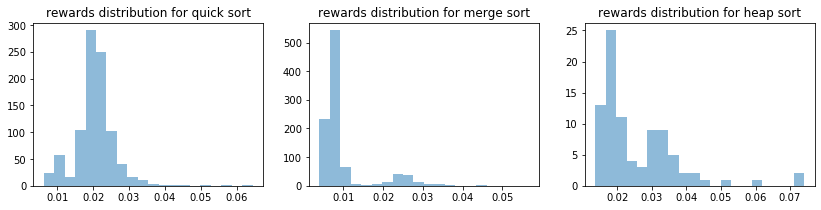

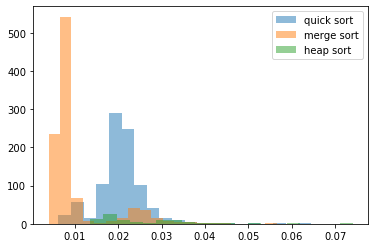

In [44]:
plot_rewards_distribution(arm_rewards_2)
plot_rewards_distribution_together(arm_rewards_2)

Restart at iteration: 74
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.030685725001603714, 'merge_sort': 0.027473046773182783, 'heap_sort': 0.056384680001065134}
Count per chosen algo {'quick_sort': 8, 'merge_sort': 62, 'heap_sort': 5}


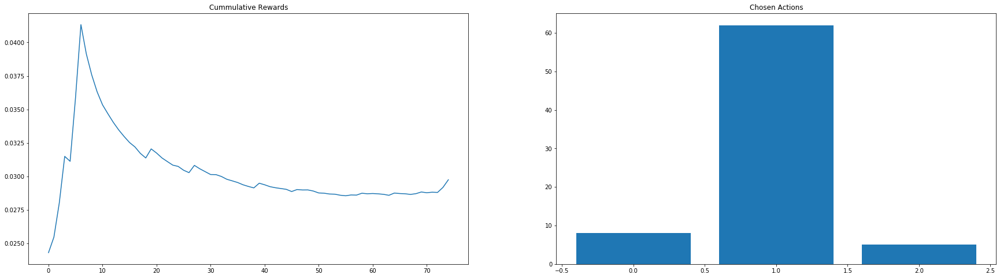

Restart at iteration: 215
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.022564177952961645, 'merge_sort': 0.024171154541280968, 'heap_sort': 0.03847489999801231}
Count per chosen algo {'quick_sort': 127, 'merge_sort': 11, 'heap_sort': 3}


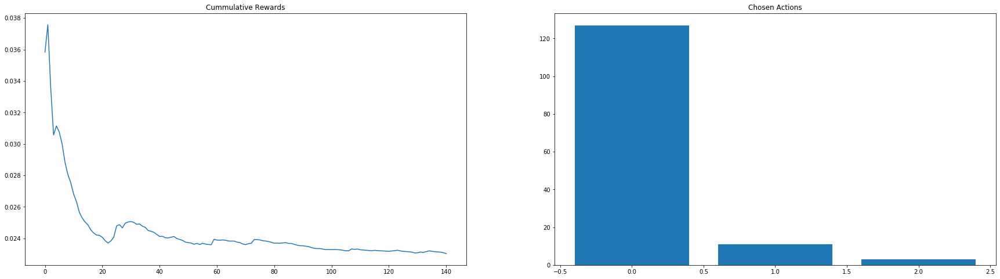

Restart at iteration: 338
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.020621263392318463, 'merge_sort': 0.024219333337290056, 'heap_sort': 0.029744000005302952}
Count per chosen algo {'quick_sort': 112, 'merge_sort': 6, 'heap_sort': 5}


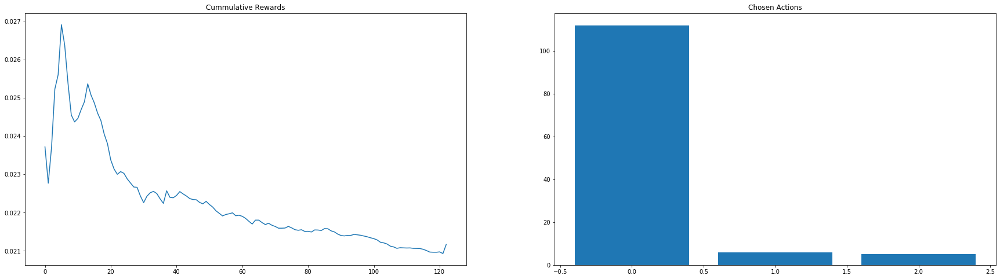

Restart at iteration: 501
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.021299455725994024, 'merge_sort': 0.02516716666664083, 'heap_sort': 0.03934284000424668}
Count per chosen algo {'quick_sort': 131, 'merge_sort': 27, 'heap_sort': 5}


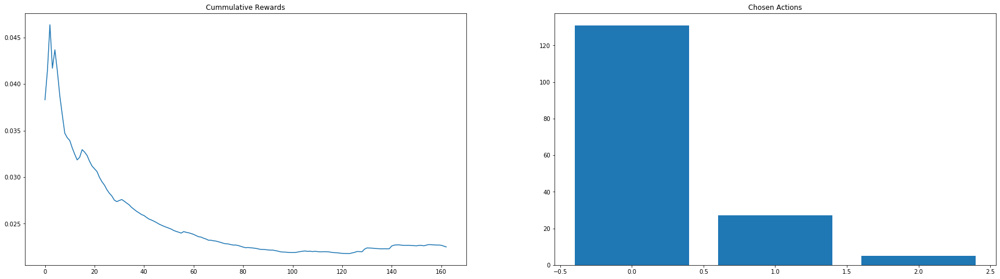

Restart at iteration: 526
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010645766669767909, 'merge_sort': 0.006554999999934807, 'heap_sort': 0.018116571428392837}
Count per chosen algo {'quick_sort': 3, 'merge_sort': 1, 'heap_sort': 21}


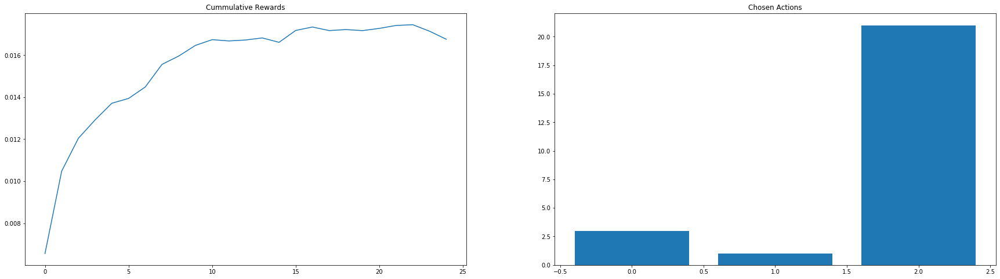

Restart at iteration: 1001
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.009550544442997003, 'merge_sort': 0.007004083585091887, 'heap_sort': 0.016436266669188626}
Count per chosen algo {'quick_sort': 9, 'merge_sort': 463, 'heap_sort': 3}


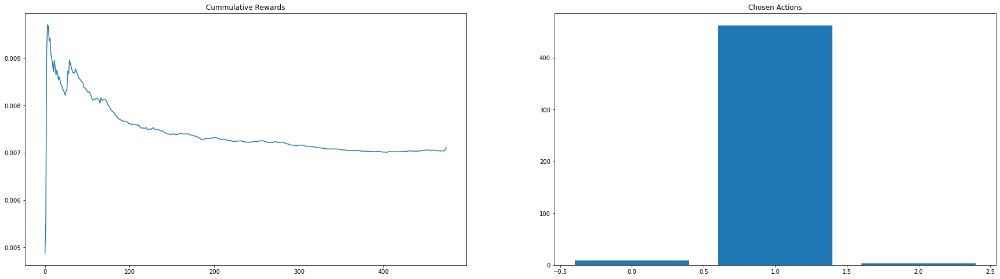

Restart at iteration: 1035
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.02016096086868935, 'merge_sort': 0.02392259999968311, 'heap_sort': 0.031620375004422385}
Count per chosen algo {'quick_sort': 23, 'merge_sort': 7, 'heap_sort': 4}


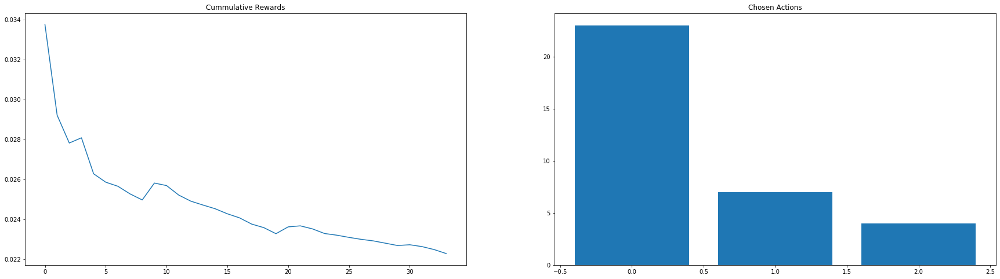

Restart at iteration: 1196
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.022720931972266923, 'merge_sort': 0.02774963749834569, 'heap_sort': 0.031949150004948024}
Count per chosen algo {'quick_sort': 147, 'merge_sort': 8, 'heap_sort': 6}


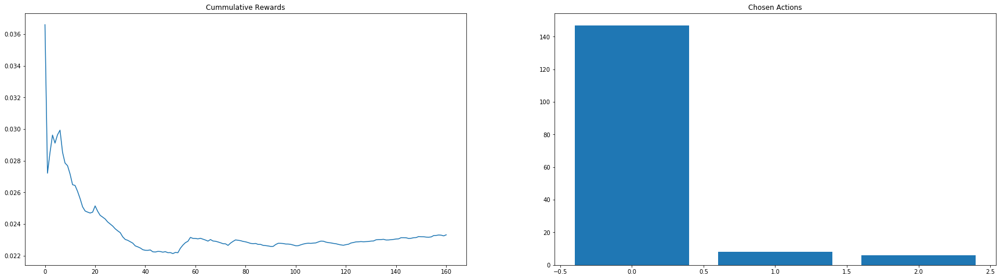

Restart at iteration: 1334
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.02189654682505144, 'merge_sort': 0.028507799996077665, 'heap_sort': 0.03325112500533578}
Count per chosen algo {'quick_sort': 126, 'merge_sort': 8, 'heap_sort': 4}


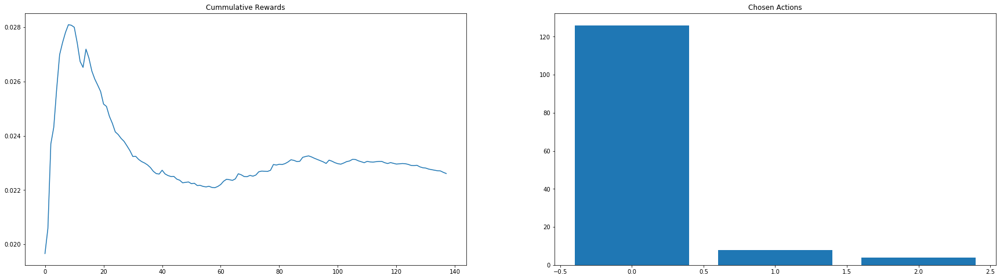

Restart at iteration: 1501
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.020882473417846603, 'merge_sort': 0.02249823333598518, 'heap_sort': 0.03517300000142617}
Count per chosen algo {'quick_sort': 158, 'merge_sort': 6, 'heap_sort': 3}


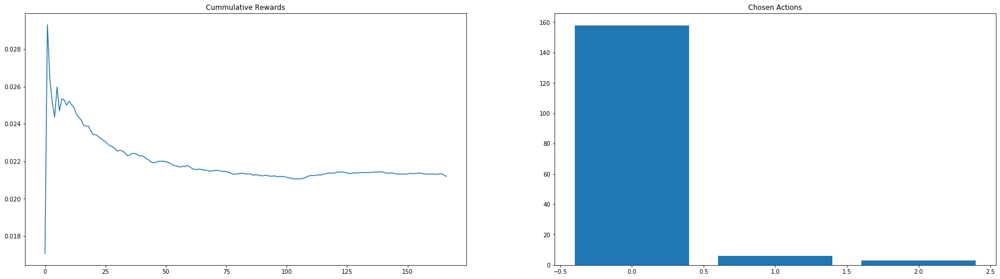

Restart at iteration: 1585
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.0115908499986593, 'merge_sort': 0.008140874192430337, 'heap_sort': 0.017298624996328726}
Count per chosen algo {'quick_sort': 18, 'merge_sort': 62, 'heap_sort': 4}


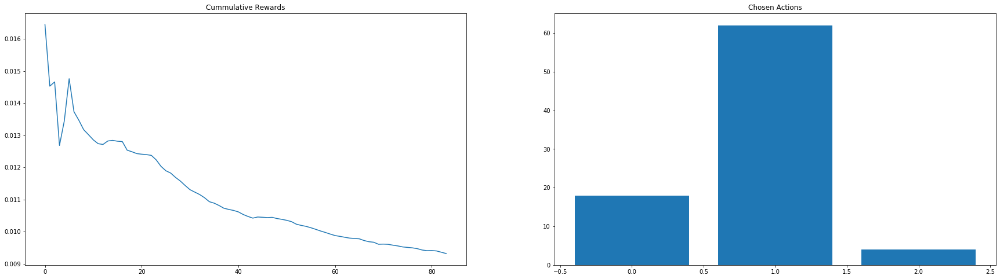

Restart at iteration: 1712
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.011398662496503675, 'merge_sort': 0.008846107759068375, 'heap_sort': 0.02012799999405009}
Count per chosen algo {'quick_sort': 8, 'merge_sort': 116, 'heap_sort': 3}


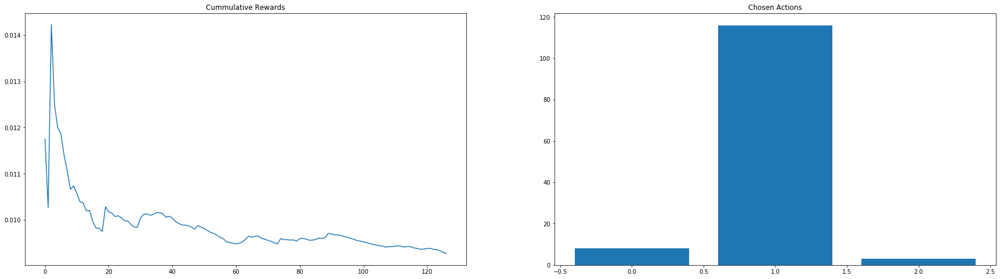

Restart at iteration: 1817
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010736079999478534, 'merge_sort': 0.007840010447865491, 'heap_sort': 0.0180241538462444}
Count per chosen algo {'quick_sort': 25, 'merge_sort': 67, 'heap_sort': 13}


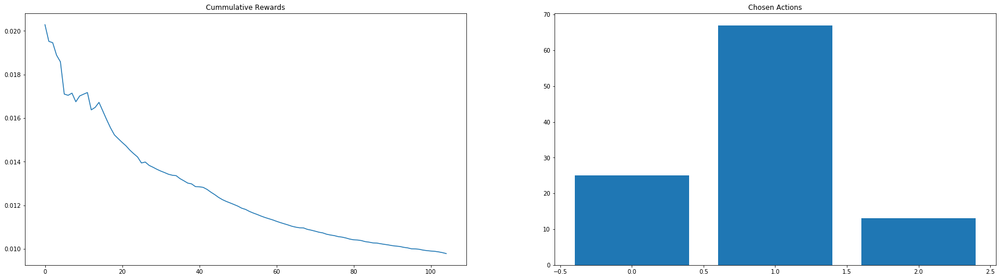

Restart at iteration: 1841
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.009700934998545564, 'merge_sort': 0.009351399989100173, 'heap_sort': 0.0190364666680883}
Count per chosen algo {'quick_sort': 20, 'merge_sort': 1, 'heap_sort': 3}


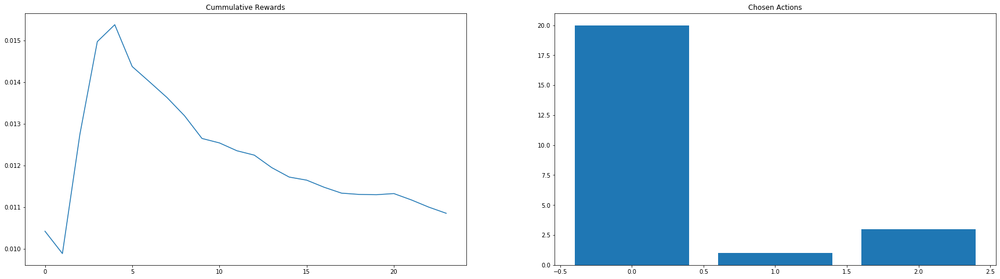

Restart at iteration: 1865
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.011281799997959752, 'merge_sort': 0.00839282499946421, 'heap_sort': 0.021295200000167824}
Count per chosen algo {'quick_sort': 2, 'merge_sort': 20, 'heap_sort': 2}


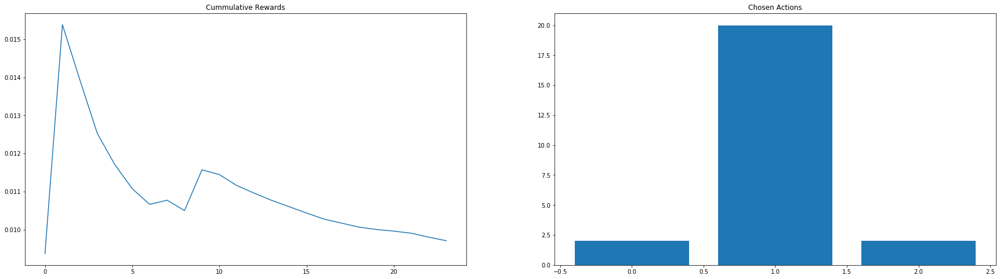

Restart at iteration: 1999
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.010483283333693786, 'merge_sort': 0.006941979032666084, 'heap_sort': 0.021739674997661496}
Count per chosen algo {'quick_sort': 6, 'merge_sort': 124, 'heap_sort': 4}


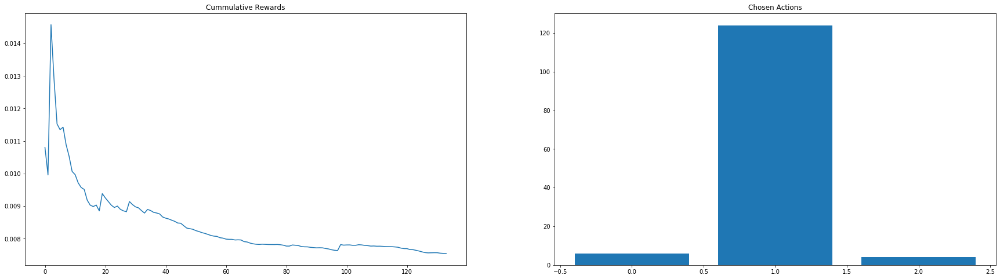

Total reward 31.2086


In [45]:
for elem in list_iteration_results_2:
    sample_mean, sample_count,rewards,cum_rewards,n = elem
    print("Restart at iteration:", n)
    print("Results up to this iteration: ")
    plot_history(rewards,cum_rewards, sample_count, sample_mean)
print("Total reward", np.round(total_reward_2,4))

## Three outliers in a row restart the expriment

In [46]:
list_iteration_results_3, total_reward_3, arm_rewards_3 = ts_quantile(list_distributions, n_samples, num_consec_elem=3)



Iteration: 0
Less than two values for quick_sort
quick_sort Theta 0.046648936445419675
Less than two values for merge_sort
merge_sort Theta 0.0646511138567971
Less than two values for heap_sort
heap_sort Theta 0.010833140160940703


Chosen algorithm is:  heap_sort with reward: 0.050159699996584095
Sample mean is:  0.050159699996584095 Sample variance is: 0.0


Iteration: 1
Less than two values for quick_sort
quick_sort Theta 0.04541861073856253
Less than two values for merge_sort
merge_sort Theta 0.07335109400317927
Less than two values for heap_sort
heap_sort Theta 0.03312022007821763


Chosen algorithm is:  heap_sort with reward: 0.04213670000899583
Sample mean is:  0.04614820000278996 Sample variance is: 1.609213220021032e-05


Iteration: 2
Less than two values for quick_sort
quick_sort Theta 0.03850637073092911
Less than two values for merge_sort
merge_sort Theta 0.09705556898130167
heap_sort Theta 0.05398727818599894


Chosen algorithm is:  quick_sort with reward: 0.021048700000


Chosen algorithm is:  merge_sort with reward: 0.02235500000824686
Sample mean is:  0.026113608334223198 Sample variance is: 7.965466363978707e-05


Iteration: 28
quick_sort Theta 0.02652602897324226
merge_sort Theta 0.020656818323178495
heap_sort Theta 0.04719839665724143


Chosen algorithm is:  merge_sort with reward: 0.023038900006213225
Sample mean is:  0.02587709230899166 Sample variance is: 7.41986597836378e-05


Iteration: 29
quick_sort Theta 0.032635587165847676
merge_sort Theta 0.029592400948799648
heap_sort Theta 0.04066314981817316


Chosen algorithm is:  merge_sort with reward: 0.033236099989153445
Sample mean is:  0.0264027357147175 Sample variance is: 7.249066838315776e-05


Iteration: 30
quick_sort Theta 0.035605857555995046
merge_sort Theta 0.02704221974271782
heap_sort Theta 0.049726669052441275


Chosen algorithm is:  merge_sort with reward: 0.026937200003885664
Sample mean is:  0.026438366667328714 Sample variance is: 6.767573106458966e-05


Iteration: 31
quick_sort 


Chosen algorithm is:  merge_sort with reward: 0.02459300000919029
Sample mean is:  0.026630088235405684 Sample variance is: 4.6942558187213206e-05


Iteration: 61
quick_sort Theta 0.0331752474578362
merge_sort Theta 0.027843218053704964
heap_sort Theta 0.03845153761845314


Chosen algorithm is:  merge_sort with reward: 0.028277599994908087
Sample mean is:  0.026677159999962896 Sample variance is: 4.567667777363712e-05


Iteration: 62
quick_sort Theta 0.037202278097609
merge_sort Theta 0.024993058075421456
heap_sort Theta 0.04494977670444617


Chosen algorithm is:  merge_sort with reward: 0.025522099997033365
Sample mean is:  0.02664507499988152 Sample variance is: 4.444391182187164e-05


Iteration: 63
quick_sort Theta 0.03388791744526494
merge_sort Theta 0.025734369668318862
heap_sort Theta 0.04556706261119961


Chosen algorithm is:  merge_sort with reward: 0.033721200001309626
Sample mean is:  0.026836321621541738 Sample variance is: 4.455943474654719e-05


Iteration: 64
quick_sort T



Iteration: 93
quick_sort Theta 0.020560046941703682
merge_sort Theta 0.028701753552316925
heap_sort Theta 0.038930304019715894


Chosen algorithm is:  quick_sort with reward: 0.020315799993113615
Sample mean is:  0.028258283870884277 Sample variance is: 0.00038889937529176864


Iteration: 94
quick_sort Theta 0.025338183860361647
merge_sort Theta 0.026148962074467038
heap_sort Theta 0.05046127712773848


Chosen algorithm is:  quick_sort with reward: 0.01714460000221152
Sample mean is:  0.027910981249988254 Sample variance is: 0.00038048546223881955


Iteration: 95
quick_sort Theta 0.027680225753910558
merge_sort Theta 0.027854802989158812
heap_sort Theta 0.04454742088075648


Chosen algorithm is:  quick_sort with reward: 0.025645200003054924
Sample mean is:  0.027842321212202394 Sample variance is: 0.00036910645417197424


Iteration: 96
quick_sort Theta 0.029849149694735063
merge_sort Theta 0.029558302671038865
heap_sort Theta 0.05528912694404627


Chosen algorithm is:  merge_sort wit


Iteration: 124
quick_sort Theta 0.02547176420036357
merge_sort Theta 0.028720076797651248
heap_sort Theta 0.039649668422947155


Chosen algorithm is:  quick_sort with reward: 0.02260769999702461
Sample mean is:  0.02666243653836248 Sample variance is: 0.00023948313895064547


Iteration: 125
quick_sort Theta 0.023197525214905604
merge_sort Theta 0.027700688586812502
heap_sort Theta 0.04479267225463358


Chosen algorithm is:  quick_sort with reward: 0.0199239000066882
Sample mean is:  0.026535294339651645 Sample variance is: 0.00023580517637116126


Iteration: 126
quick_sort Theta 0.026805228226472147
merge_sort Theta 0.027319893895496015
heap_sort Theta 0.05222875675457858


Chosen algorithm is:  quick_sort with reward: 0.022913999986485578
Sample mean is:  0.026468233333111532 Sample variance is: 0.0002316767643114725


Iteration: 127
quick_sort Theta 0.02601852088926768
merge_sort Theta 0.028521062738616685
heap_sort Theta 0.0434871012549764


Chosen algorithm is:  quick_sort with re


Chosen algorithm is:  merge_sort with reward: 0.024076600006083027
Sample mean is:  0.027672351999984433 Sample variance is: 3.69553680717797e-05


Iteration: 158
quick_sort Theta 0.026466651266214614
merge_sort Theta 0.02732675918205173
heap_sort Theta 0.044665703561739496


Chosen algorithm is:  quick_sort with reward: 0.01662959999521263
Sample mean is:  0.02529815844144497 Sample variance is: 0.00017317543225437644


Iteration: 159
quick_sort Theta 0.025709069343574226
merge_sort Theta 0.02821284309663401
heap_sort Theta 0.047847107842564754


Chosen algorithm is:  quick_sort with reward: 0.021093500006827526
Sample mean is:  0.025244252564078078 Sample variance is: 0.00017117898436329277


Iteration: 160
quick_sort Theta 0.022451900341084206
merge_sort Theta 0.027042656983223754
heap_sort Theta 0.042944536894132516


Chosen algorithm is:  quick_sort with reward: 0.017498199988040142
Sample mean is:  0.025146201265647216 Sample variance is: 0.0001697620582320859


Iteration: 161
q


Chosen algorithm is:  quick_sort with reward: 0.024699000001419336
Sample mean is:  0.02398218301974373 Sample variance is: 0.0001323235706515397


Iteration: 190
quick_sort Theta 0.021679534398410708
merge_sort Theta 0.026302257462356312
heap_sort Theta 0.04880012811430363


Chosen algorithm is:  quick_sort with reward: 0.02103779999015387
Sample mean is:  0.02395466542133635 Sample variance is: 0.00013116716689848945


Iteration: 191
quick_sort Theta 0.024364747558231654
merge_sort Theta 0.025790987513837092
heap_sort Theta 0.04878249879640199


Chosen algorithm is:  quick_sort with reward: 0.024325500009581447
Sample mean is:  0.02395809907493121 Sample variance is: 0.00012995391762141387


Iteration: 192
quick_sort Theta 0.0221552287540219
merge_sort Theta 0.02708069099005227
heap_sort Theta 0.04708040301612036


Chosen algorithm is:  quick_sort with reward: 0.01946029999817256
Sample mean is:  0.02391683486321783 Sample variance is: 0.00012894557524324992


Iteration: 193
quick_s


Chosen algorithm is:  quick_sort with reward: 0.016656599997077137
Sample mean is:  0.023307694891109947 Sample variance is: 0.00010630909585225997


Iteration: 221
quick_sort Theta 0.02348901203158907
merge_sort Theta 0.028180211518684065
heap_sort Theta 0.05389954652420528


Chosen algorithm is:  quick_sort with reward: 0.024469999989378266
Sample mean is:  0.023316117391822037 Sample variance is: 0.00010554845866221422


Iteration: 222
quick_sort Theta 0.02450190313284976
merge_sort Theta 0.02735543037701963
heap_sort Theta 0.04279164624640282


Chosen algorithm is:  quick_sort with reward: 0.023508400001446716
Sample mean is:  0.02331750071994883 Sample variance is: 0.00010478938130933513


Iteration: 223
quick_sort Theta 0.02408270372246434
merge_sort Theta 0.027087527736541887
heap_sort Theta 0.04862688836610939


Chosen algorithm is:  quick_sort with reward: 0.021128399996086955
Sample mean is:  0.023301864286206963 Sample variance is: 0.00010407487095891695


Iteration: 224
qu


Chosen algorithm is:  quick_sort with reward: 0.020264499995391816
Sample mean is:  0.022877010651061604 Sample variance is: 8.896217441638816e-05


Iteration: 253
quick_sort Theta 0.023268931427173144
merge_sort Theta 0.027777612160691263
heap_sort Theta 0.04191890598692234


Chosen algorithm is:  quick_sort with reward: 0.023415299991029315
Sample mean is:  0.022880177058943768 Sample variance is: 8.844056192552656e-05


Iteration: 254
quick_sort Theta 0.02431042238031684
merge_sort Theta 0.028723019233424248
heap_sort Theta 0.04002652799307598


Chosen algorithm is:  quick_sort with reward: 0.0159367000014754
Sample mean is:  0.022839571929952722 Sample variance is: 8.820365766202069e-05


Iteration: 255
quick_sort Theta 0.023139707531363404
merge_sort Theta 0.027731629423472196
heap_sort Theta 0.04553358753360034


Chosen algorithm is:  quick_sort with reward: 0.020668700002715923
Sample mean is:  0.022826950581538556 Sample variance is: 8.77180857313898e-05


Iteration: 256
quick

Chosen algorithm is:  quick_sort with reward: 0.017078199991374277
Sample mean is:  0.022590144278785092 Sample variance is: 7.67324915537884e-05


Iteration: 285
quick_sort Theta 0.020904436973155333
merge_sort Theta 0.027513467209749794
heap_sort Theta 0.04654004895237139


Chosen algorithm is:  quick_sort with reward: 0.019781299997703172
Sample mean is:  0.022576239109076766 Sample variance is: 7.639149183688327e-05


Iteration: 286
quick_sort Theta 0.02270822072128263
merge_sort Theta 0.027859242574073583
heap_sort Theta 0.04885124983132884


Chosen algorithm is:  quick_sort with reward: 0.02184119999583345
Sample mean is:  0.02257261822674552 Sample variance is: 7.601782744856297e-05


Iteration: 287
quick_sort Theta 0.021642542725370258
merge_sort Theta 0.027179672776834633
heap_sort Theta 0.03712444153612459


Chosen algorithm is:  quick_sort with reward: 0.023743300000205636
Sample mean is:  0.02257835686288993 Sample variance is: 7.565187622429538e-05


Iteration: 288
quick_s


Iteration: 316
quick_sort Theta 0.022493917221659738
merge_sort Theta 0.02853597930236686
heap_sort Theta 0.044261679192320234


Chosen algorithm is:  quick_sort with reward: 0.023635700010345317
Sample mean is:  0.02242892360514082 Sample variance is: 6.712780449839026e-05


Iteration: 317
quick_sort Theta 0.022368725500803113
merge_sort Theta 0.027830311592995552
heap_sort Theta 0.045048552999146695


Chosen algorithm is:  quick_sort with reward: 0.020268799999030307
Sample mean is:  0.022419692307678808 Sample variance is: 6.686078906570532e-05


Iteration: 318
quick_sort Theta 0.021833820698666514
merge_sort Theta 0.026347883329668993
heap_sort Theta 0.05027952564382687


Chosen algorithm is:  quick_sort with reward: 0.019412299996474758
Sample mean is:  0.022406894893588578 Sample variance is: 6.661459814061189e-05


Iteration: 319
quick_sort Theta 0.02244814529265502
merge_sort Theta 0.0283308036118886
heap_sort Theta 0.04171535812055873


Chosen algorithm is:  quick_sort with r


Chosen algorithm is:  quick_sort with reward: 0.019876999998814426
Sample mean is:  0.022205445282973947 Sample variance is: 6.020352553198174e-05


Iteration: 349
quick_sort Theta 0.022278230420579734
merge_sort Theta 0.02710450133033602
heap_sort Theta 0.04896491956500827


Chosen algorithm is:  quick_sort with reward: 0.021633299998939037
Sample mean is:  0.022203294360853516 Sample variance is: 5.997842250210998e-05


Iteration: 350
quick_sort Theta 0.022467303088749273
merge_sort Theta 0.026940817849598536
heap_sort Theta 0.04691091426061682


Chosen algorithm is:  quick_sort with reward: 0.01706739999644924
Sample mean is:  0.02218405880143627 Sample variance is: 5.9852206010046304e-05


Iteration: 351
quick_sort Theta 0.022502308677114558
merge_sort Theta 0.028107846181882817
heap_sort Theta 0.04230748146665084


Chosen algorithm is:  quick_sort with reward: 0.024675399996340275
Sample mean is:  0.022193354850670987 Sample variance is: 5.965195009702009e-05


Iteration: 352
qui

quick_sort Theta 0.02185839422660691
merge_sort Theta 0.02722572906593463
heap_sort Theta 0.03962762367288185


Chosen algorithm is:  quick_sort with reward: 0.0277083999972092
Sample mean is:  0.022214096621462738 Sample variance is: 5.5077837135126174e-05


Iteration: 380
quick_sort Theta 0.022140029555049026
merge_sort Theta 0.02739520944880707
heap_sort Theta 0.03935755142580601


Chosen algorithm is:  quick_sort with reward: 0.01984259999881033
Sample mean is:  0.02220611178434943 Sample variance is: 5.491126212866785e-05


Iteration: 381
quick_sort Theta 0.022777057485971593
merge_sort Theta 0.02772071308832152
heap_sort Theta 0.04268679565403296


Chosen algorithm is:  quick_sort with reward: 0.021924000000581145
Sample mean is:  0.022205165100511282 Sample variance is: 5.4727262322826255e-05


Iteration: 382
quick_sort Theta 0.022754531604615148
merge_sort Theta 0.026913018140827118
heap_sort Theta 0.03801175425608528


Chosen algorithm is:  quick_sort with reward: 0.0186880999


Iteration: 411
quick_sort Theta 0.022268830413672606
merge_sort Theta 0.028846976073132507
heap_sort Theta 0.04862740237907267


Chosen algorithm is:  quick_sort with reward: 0.022983000002568588
Sample mean is:  0.022090747255965763 Sample variance is: 5.0209670843429336e-05


Iteration: 412
quick_sort Theta 0.02229599286510721
merge_sort Theta 0.028280562907223264
heap_sort Theta 0.04911084216273668


Chosen algorithm is:  quick_sort with reward: 0.017682999998214655
Sample mean is:  0.022077349847887492 Sample variance is: 5.0115930760317076e-05


Iteration: 413
quick_sort Theta 0.02231689871822215
merge_sort Theta 0.0281836934533853
heap_sort Theta 0.04160709757672071


Chosen algorithm is:  quick_sort with reward: 0.024338000002899207
Sample mean is:  0.02208420030290268 Sample variance is: 4.997950385692571e-05


Iteration: 414
quick_sort Theta 0.02224925401131893
merge_sort Theta 0.028193708110223883
heap_sort Theta 0.04278937763358938


Chosen algorithm is:  quick_sort with re


Chosen algorithm is:  quick_sort with reward: 0.02430889999959618
Sample mean is:  0.02197835416659978 Sample variance is: 4.6487285572609726e-05


Iteration: 444
quick_sort Theta 0.022253549423071135
merge_sort Theta 0.027371176593536817
heap_sort Theta 0.03904329925866969


Chosen algorithm is:  quick_sort with reward: 0.02274780000152532
Sample mean is:  0.02198048559550539 Sample variance is: 4.636014740446895e-05


Iteration: 445
quick_sort Theta 0.022383151190879937
merge_sort Theta 0.0287124106243688
heap_sort Theta 0.05307097647781893


Chosen algorithm is:  quick_sort with reward: 0.019579300002078526
Sample mean is:  0.021973852486131283 Sample variance is: 4.62479640274605e-05


Iteration: 446
quick_sort Theta 0.02211508563461383
merge_sort Theta 0.028084610712651708
heap_sort Theta 0.04617333155823455


Chosen algorithm is:  quick_sort with reward: 0.01944509999884758
Sample mean is:  0.021966886225835737 Sample variance is: 4.6138126587147656e-05


Iteration: 447
quick_so


Chosen algorithm is:  quick_sort with reward: 0.023078499987605028
Sample mean is:  0.022069094884742284 Sample variance is: 4.380880131496584e-05


Iteration: 475
quick_sort Theta 0.021195874940731847
merge_sort Theta 0.027543378899985375
heap_sort Theta 0.04158905744429168


Chosen algorithm is:  quick_sort with reward: 0.023620399995706975
Sample mean is:  0.022073052295739644 Sample variance is: 4.370316765955881e-05


Iteration: 476
quick_sort Theta 0.02169406166275294
merge_sort Theta 0.026375984778385653
heap_sort Theta 0.042434167093987875


Chosen algorithm is:  quick_sort with reward: 0.02302719998988323
Sample mean is:  0.022075480152467745 Sample variance is: 4.3594274310013706e-05


Iteration: 477
quick_sort Theta 0.022359665359294487
merge_sort Theta 0.02798241461762818
heap_sort Theta 0.04669939504948503


Chosen algorithm is:  quick_sort with reward: 0.025708100001793355
Sample mean is:  0.022084699999801057 Sample variance is: 4.351703613859054e-05


Iteration: 478
qu


Iteration: 506
quick_sort Theta 0.008555910528169071
Less than two values for merge_sort
merge_sort Theta 0.006868822552678478
Less than two values for heap_sort
heap_sort Theta 0.004488289660652056


Chosen algorithm is:  heap_sort with reward: 0.01853580000170041
Sample mean is:  0.01853580000170041 Sample variance is: 0.0


Iteration: 507
quick_sort Theta 0.008743108831133556
Less than two values for merge_sort
merge_sort Theta 0.04143672433306692
Less than two values for heap_sort
heap_sort Theta 0.007362461013353839


Chosen algorithm is:  heap_sort with reward: 0.017786399999749847
Sample mean is:  0.018161100000725128 Sample variance is: 1.4040009073087558e-07


Iteration: 508
quick_sort Theta 0.007869744976615342
Less than two values for merge_sort
merge_sort Theta 0.0773985656820186
heap_sort Theta 0.018442717042662145


Chosen algorithm is:  quick_sort with reward: 0.009247800000593998
Sample mean is:  0.008817033337739607 Sample variance is: 3.0987424169388853e-07


Iterati

merge_sort Theta 0.006961462103824816
heap_sort Theta 0.018166134999635927


Chosen algorithm is:  merge_sort with reward: 0.007059199997456744
Sample mean is:  0.006660003703911099 Sample variance is: 1.1203986269966677e-06


Iteration: 537
quick_sort Theta 0.00812776732220885
merge_sort Theta 0.006204185318155517
heap_sort Theta 0.018527598570808053


Chosen algorithm is:  merge_sort with reward: 0.006272999991779216
Sample mean is:  0.0066461821427635315 Sample variance is: 1.085542350237226e-06


Iteration: 538
quick_sort Theta 0.008470961339846362
merge_sort Theta 0.006892778654322934
heap_sort Theta 0.01837893708903354


Chosen algorithm is:  merge_sort with reward: 0.008700300008058548
Sample mean is:  0.006717013793290946 Sample variance is: 1.1885892914617165e-06


Iteration: 539
quick_sort Theta 0.008207595449164334
merge_sort Theta 0.006777159089586956
heap_sort Theta 0.018245453493206387


Chosen algorithm is:  merge_sort with reward: 0.007601599994814023
Sample mean is:  0


Iteration: 566
quick_sort Theta 0.00784734112407042
merge_sort Theta 0.00684657567874967
heap_sort Theta 0.01822736338439729


Chosen algorithm is:  merge_sort with reward: 0.007038099996862002
Sample mean is:  0.006800685964551297 Sample variance is: 9.305724387161506e-07


Iteration: 567
quick_sort Theta 0.007909477883208177
merge_sort Theta 0.006576989511220752
heap_sort Theta 0.018010361763901035


Chosen algorithm is:  merge_sort with reward: 0.004904400004306808
Sample mean is:  0.00676799137902984 Sample variance is: 9.75457433902424e-07


Iteration: 568
quick_sort Theta 0.008160524622046592
merge_sort Theta 0.006673003189927543
heap_sort Theta 0.01818114094538946


Chosen algorithm is:  merge_sort with reward: 0.005165900001884438
Sample mean is:  0.006740837287891783 Sample variance is: 1.001690247657589e-06


Iteration: 569
quick_sort Theta 0.007541872407432191
merge_sort Theta 0.006683330591586155
heap_sort Theta 0.017872054546473816


Chosen algorithm is:  merge_sort with 


Chosen algorithm is:  merge_sort with reward: 0.006959999998798594
Sample mean is:  0.006815832941655946 Sample variance is: 9.380516085516205e-07


Iteration: 597
quick_sort Theta 0.00839900985486814
merge_sort Theta 0.006690004184317914
heap_sort Theta 0.017794800571297453


Chosen algorithm is:  merge_sort with reward: 0.007463900008588098
Sample mean is:  0.006823368605224925 Sample variance is: 9.319708608691074e-07


Iteration: 598
quick_sort Theta 0.008326582837466179
merge_sort Theta 0.006805820854378095
heap_sort Theta 0.01754756745319393


Chosen algorithm is:  merge_sort with reward: 0.006887699986691587
Sample mean is:  0.006824108046391208 Sample variance is: 9.213055746219877e-07


Iteration: 599
quick_sort Theta 0.007761956825708375
merge_sort Theta 0.006921138864737806
heap_sort Theta 0.01894316516480604


Chosen algorithm is:  merge_sort with reward: 0.0068577000056393445
Sample mean is:  0.006824489773200846 Sample variance is: 9.108488703282683e-07


Iteration: 600


heap_sort Theta 0.017882386269325562


Chosen algorithm is:  merge_sort with reward: 0.007237400001031347
Sample mean is:  0.006749414782920528 Sample variance is: 9.211738269262371e-07


Iteration: 627
quick_sort Theta 0.007867000035245243
merge_sort Theta 0.00672020682627136
heap_sort Theta 0.01684947622821997


Chosen algorithm is:  merge_sort with reward: 0.005264599996735342
Sample mean is:  0.006736614655453415 Sample variance is: 9.320746485108898e-07


Iteration: 628
quick_sort Theta 0.009270955504119981
merge_sort Theta 0.0067249578766091925
heap_sort Theta 0.017344031867285253


Chosen algorithm is:  merge_sort with reward: 0.0073673000006238
Sample mean is:  0.006742005128489059 Sample variance is: 9.274788336711863e-07


Iteration: 629
quick_sort Theta 0.008180926156066665
merge_sort Theta 0.006844492987523259
heap_sort Theta 0.018065738596018274


Chosen algorithm is:  merge_sort with reward: 0.007545999993453734
Sample mean is:  0.006748818644293844 Sample variance is: 9.



Iteration: 656
quick_sort Theta 0.008180873538404259
merge_sort Theta 0.006825824744893982
heap_sort Theta 0.017219790241060406


Chosen algorithm is:  merge_sort with reward: 0.006187499995576218
Sample mean is:  0.006795486896941117 Sample variance is: 9.582481286990784e-07


Iteration: 657
quick_sort Theta 0.006875112712692727
merge_sort Theta 0.006735364965758911
heap_sort Theta 0.01824749823001178


Chosen algorithm is:  merge_sort with reward: 0.006602299996302463
Sample mean is:  0.006794163698991537 Sample variance is: 9.519386590098212e-07


Iteration: 658
quick_sort Theta 0.007247559836946991
merge_sort Theta 0.006746963544547108
heap_sort Theta 0.017520655485847


Chosen algorithm is:  merge_sort with reward: 0.006131000001914799
Sample mean is:  0.006789652381324349 Sample variance is: 9.484342759350446e-07


Iteration: 659
quick_sort Theta 0.008018536384910152
merge_sort Theta 0.006820542299030409
heap_sort Theta 0.017982067089509165


Chosen algorithm is:  merge_sort wi


Iteration: 686
quick_sort Theta 0.008475558722882586
merge_sort Theta 0.0069192251991934345
heap_sort Theta 0.017128764642333778


Chosen algorithm is:  merge_sort with reward: 0.008581300004152581
Sample mean is:  0.006755091954790719 Sample variance is: 1.008727331010954e-06


Iteration: 687
quick_sort Theta 0.007577035707736543
merge_sort Theta 0.006804254995923565
heap_sort Theta 0.01746123494206409


Chosen algorithm is:  merge_sort with reward: 0.007678499998291954
Sample mean is:  0.006760368572182155 Sample variance is: 1.0078078030843826e-06


Iteration: 688
quick_sort Theta 0.008231673413405829
merge_sort Theta 0.006662973270361823
heap_sort Theta 0.01720294453028726


Chosen algorithm is:  merge_sort with reward: 0.006961200007935986
Sample mean is:  0.0067615096598853015 Sample variance is: 1.0023094865856375e-06


Iteration: 689
quick_sort Theta 0.007899220764378719
merge_sort Theta 0.006750810850076583
heap_sort Theta 0.018577583951901313


Chosen algorithm is:  merge_so


Chosen algorithm is:  merge_sort with reward: 0.006565300005604513
Sample mean is:  0.006733728922400213 Sample variance is: 1.0687199524669405e-06


Iteration: 717
quick_sort Theta 0.007409465558837343
merge_sort Theta 0.006659674944487754
heap_sort Theta 0.017902613976378934


Chosen algorithm is:  merge_sort with reward: 0.005702499998733401
Sample mean is:  0.006728698537406716 Sample variance is: 1.0686688581354168e-06


Iteration: 718
quick_sort Theta 0.0077404319890591175
merge_sort Theta 0.006692213267597297
heap_sort Theta 0.017937410402419567


Chosen algorithm is:  merge_sort with reward: 0.0062507999973604456
Sample mean is:  0.006726378641581249 Sample variance is: 1.0645844381432562e-06


Iteration: 719
quick_sort Theta 0.008364414206907827
merge_sort Theta 0.006671969097798517
heap_sort Theta 0.016861346702981592


Chosen algorithm is:  merge_sort with reward: 0.007352899992838502
Sample mean is:  0.006729405314775728 Sample variance is: 1.061328632781219e-06


Iteratio


Iteration: 748
quick_sort Theta 0.008301873220205203
merge_sort Theta 0.0065488473188199834
heap_sort Theta 0.01789328687390231


Chosen algorithm is:  merge_sort with reward: 0.007453199999872595
Sample mean is:  0.006718305932674596 Sample variance is: 1.0634390604285583e-06


Iteration: 749
quick_sort Theta 0.007568021254273981
merge_sort Theta 0.006831989601351706
heap_sort Theta 0.01778065323763647


Chosen algorithm is:  merge_sort with reward: 0.006901900007505901
Sample mean is:  0.006719080591218189 Sample variance is: 1.059093598408162e-06


Iteration: 750
quick_sort Theta 0.007745200140006828
merge_sort Theta 0.00671871026640054
heap_sort Theta 0.01737281091619929


Chosen algorithm is:  merge_sort with reward: 0.006971599999815226
Sample mean is:  0.006720141597136664 Sample variance is: 1.0549104241590988e-06


Iteration: 751
quick_sort Theta 0.007311742716206988
merge_sort Theta 0.006783698032245717
heap_sort Theta 0.019096267641119845


Chosen algorithm is:  merge_sort 



Chosen algorithm is:  merge_sort with reward: 0.007768199997371994
Sample mean is:  0.006721788764541467 Sample variance is: 1.031052409216716e-06


Iteration: 780
quick_sort Theta 0.007818415767995074
merge_sort Theta 0.00667020224884155
heap_sort Theta 0.017785767870304788


Chosen algorithm is:  merge_sort with reward: 0.006695199990645051
Sample mean is:  0.0067216895526985695 Sample variance is: 1.0272078268128328e-06


Iteration: 781
quick_sort Theta 0.00832979321426672
merge_sort Theta 0.006703798450977144
heap_sort Theta 0.017706295147626526


Chosen algorithm is:  merge_sort with reward: 0.007252900002640672
Sample mean is:  0.006723664312735529 Sample variance is: 1.0244343238468368e-06


Iteration: 782
quick_sort Theta 0.00769313022016552
merge_sort Theta 0.006788823857718098
heap_sort Theta 0.018007878869539123


Chosen algorithm is:  merge_sort with reward: 0.007493500001146458
Sample mean is:  0.0067265155560259395 Sample variance is: 1.0228269819004036e-06


Iteration:


Iteration: 809
quick_sort Theta 0.008114758519347768
merge_sort Theta 0.0066280909283598696
heap_sort Theta 0.017429323655220274


Chosen algorithm is:  merge_sort with reward: 0.007293899994692765
Sample mean is:  0.006727792593193482 Sample variance is: 1.04735057688233e-06


Iteration: 810
quick_sort Theta 0.008386020893146339
merge_sort Theta 0.006679211781239894
heap_sort Theta 0.01773600427319267


Chosen algorithm is:  merge_sort with reward: 0.004671400005463511
Sample mean is:  0.0067208919469259314 Sample variance is: 1.0579787965472742e-06


Iteration: 811
quick_sort Theta 0.008173792470722974
merge_sort Theta 0.006714207338346292
heap_sort Theta 0.01847710208882816


Chosen algorithm is:  merge_sort with reward: 0.006604599999263883
Sample mean is:  0.0067205030106461255 Sample variance is: 1.0544854848094356e-06


Iteration: 812
quick_sort Theta 0.0077621395176982804
merge_sort Theta 0.006694588053338315
heap_sort Theta 0.017941334029443947


Chosen algorithm is:  merge_s


Iteration: 840
quick_sort Theta 0.008062734784891204
merge_sort Theta 0.0067902892531319274
heap_sort Theta 0.0171206608969179


Chosen algorithm is:  merge_sort with reward: 0.0077671000035479665
Sample mean is:  0.006714956098088495 Sample variance is: 1.097577871390777e-06


Iteration: 841
quick_sort Theta 0.008202324429106346
merge_sort Theta 0.0067692803481233296
heap_sort Theta 0.01775996709232298


Chosen algorithm is:  merge_sort with reward: 0.006698500001220964
Sample mean is:  0.006714906079556983 Sample variance is: 1.0942425890461674e-06


Iteration: 842
quick_sort Theta 0.008333544588982994
merge_sort Theta 0.006712784008855366
heap_sort Theta 0.01677726269974253


Chosen algorithm is:  merge_sort with reward: 0.007681300005060621
Sample mean is:  0.006717834545997903 Sample variance is: 1.0937481786765452e-06


Iteration: 843
quick_sort Theta 0.007904483704540343
merge_sort Theta 0.006673087342222444
heap_sort Theta 0.017590865483835167


Chosen algorithm is:  merge_sor



Chosen algorithm is:  merge_sort with reward: 0.008378699989407323
Sample mean is:  0.006717546927702337 Sample variance is: 1.1145056697332629e-06


Iteration: 871
quick_sort Theta 0.007562515098404967
merge_sort Theta 0.006665561070847222
heap_sort Theta 0.020973132296979134


Chosen algorithm is:  merge_sort with reward: 0.004901099993730895
Sample mean is:  0.006712487186939186 Sample variance is: 1.1205663467349483e-06


Iteration: 872
quick_sort Theta 0.007865222194107239
merge_sort Theta 0.006596835596413283
heap_sort Theta 0.01764320540643834


Chosen algorithm is:  merge_sort with reward: 0.004537100001471117
Sample mean is:  0.00670644444475733 Sample variance is: 1.1305624516128822e-06


Iteration: 873
quick_sort Theta 0.008376156812258471
merge_sort Theta 0.006693725499338587
heap_sort Theta 0.017803450211580647


Chosen algorithm is:  merge_sort with reward: 0.004455300004337914
Sample mean is:  0.006700208587581653 Sample variance is: 1.1414296289669157e-06


Iteration:


Iteration: 900
quick_sort Theta 0.007926242222530574
merge_sort Theta 0.006709671973715024
heap_sort Theta 0.017737489866302605


Chosen algorithm is:  merge_sort with reward: 0.007467200004612096
Sample mean is:  0.006686934020819404 Sample variance is: 1.1574132886404571e-06


Iteration: 901
quick_sort Theta 0.008217606936228122
merge_sort Theta 0.006741294208013785
heap_sort Theta 0.017652634381643724


Chosen algorithm is:  merge_sort with reward: 0.005565100000239909
Sample mean is:  0.006684050128735652 Sample variance is: 1.1576648645603487e-06


Iteration: 902
quick_sort Theta 0.007855061944614756
merge_sort Theta 0.006739446108947105
heap_sort Theta 0.017549644836377196


Chosen algorithm is:  merge_sort with reward: 0.005266399995889515
Sample mean is:  0.0066804151283950215 Sample variance is: 1.1598364386010731e-06


Iteration: 903
quick_sort Theta 0.007404726798189298
merge_sort Theta 0.006669963700472794
heap_sort Theta 0.018073727574379247


Chosen algorithm is:  merge_

merge_sort Theta 0.0066100049151672675
heap_sort Theta 0.01756399300631228


Chosen algorithm is:  merge_sort with reward: 0.007532300005550496
Sample mean is:  0.006687499045457987 Sample variance is: 1.1437690846172196e-06


Iteration: 932
quick_sort Theta 0.007888760127007828
merge_sort Theta 0.006652218054087689
heap_sort Theta 0.01807956350235416


Chosen algorithm is:  merge_sort with reward: 0.006334300007438287
Sample mean is:  0.006686658095367464 Sample variance is: 1.1413421404578812e-06


Iteration: 933
quick_sort Theta 0.007753985513614994
merge_sort Theta 0.006565791849346044
heap_sort Theta 0.01679804928251624


Chosen algorithm is:  merge_sort with reward: 0.004955099997459911
Sample mean is:  0.0066825451307643575 Sample variance is: 1.1457360346830746e-06


Iteration: 934
quick_sort Theta 0.007238115173561497
merge_sort Theta 0.006720267649437973
heap_sort Theta 0.0179649819024106


Chosen algorithm is:  merge_sort with reward: 0.005424500006483868
Sample mean is:  0.


Iteration: 962
quick_sort Theta 0.007381485486161934
merge_sort Theta 0.006683618141535829
heap_sort Theta 0.018442607058288384


Chosen algorithm is:  merge_sort with reward: 0.007832100003724918
Sample mean is:  0.006671948000213079 Sample variance is: 1.1426762345756913e-06


Iteration: 963
quick_sort Theta 0.008139627996958217
merge_sort Theta 0.006735372930802892
heap_sort Theta 0.01796218019774758


Chosen algorithm is:  merge_sort with reward: 0.00415509998856578
Sample mean is:  0.006666367405952221 Sample variance is: 1.1541569489251107e-06


Iteration: 964
quick_sort Theta 0.008717145301556546
merge_sort Theta 0.006586255885262987
heap_sort Theta 0.01817569121609469


Chosen algorithm is:  merge_sort with reward: 0.004309800002374686
Sample mean is:  0.00666115376125404 Sample variance is: 1.1638626274063705e-06


Iteration: 965
quick_sort Theta 0.008744210266832173
merge_sort Theta 0.006698010484951446
heap_sort Theta 0.01742553904553348


Chosen algorithm is:  merge_sort w


Iteration: 992
quick_sort Theta 0.008381034243396542
merge_sort Theta 0.00666341972263867
heap_sort Theta 0.018242657001160036


Chosen algorithm is:  merge_sort with reward: 0.006793699998524971
Sample mean is:  0.006666187916835042 Sample variance is: 1.1534305403756433e-06


Iteration: 993
quick_sort Theta 0.008247421567343127
merge_sort Theta 0.006613251380003299
heap_sort Theta 0.017276267481768064


Chosen algorithm is:  merge_sort with reward: 0.007419599991408177
Sample mean is:  0.0066677542621044255 Sample variance is: 1.1522102058856185e-06


Iteration: 994
quick_sort Theta 0.008048045507836193
merge_sort Theta 0.006677547528455502
heap_sort Theta 0.018228722892062826


Chosen algorithm is:  merge_sort with reward: 0.006563999995705672
Sample mean is:  0.00666753900429032 Sample variance is: 1.1498420158607094e-06


Iteration: 995
quick_sort Theta 0.00841988397102307
merge_sort Theta 0.006711574915655104
heap_sort Theta 0.016889665126392794


Chosen algorithm is:  merge_sor



Iteration: 1022
quick_sort Theta 0.028335209362872753
merge_sort Theta 0.025109914116026238
heap_sort Theta 0.0643466032868749


Chosen algorithm is:  merge_sort with reward: 0.023218700007419102
Sample mean is:  0.025019550001161406 Sample variance is: 7.012844724175001e-06


Iteration: 1023
quick_sort Theta 0.016864390465107574
merge_sort Theta 0.025955967415106543
heap_sort Theta 0.053549672845600214


Chosen algorithm is:  quick_sort with reward: 0.019080900005064905
Sample mean is:  0.024566120000963566 Sample variance is: 0.00015431786662586998


Iteration: 1024
quick_sort Theta 0.026659732221591934
merge_sort Theta 0.026098006025797562
heap_sort Theta 0.05949248407296934


Chosen algorithm is:  merge_sort with reward: 0.02462480000394862
Sample mean is:  0.024975688890359986 Sample variance is: 6.249030131148099e-06


Iteration: 1025
quick_sort Theta 0.02174351573024623
merge_sort Theta 0.023298272506193603
heap_sort Theta 0.042249495076597754


Chosen algorithm is:  quick_sor


Iteration: 1054
quick_sort Theta 0.022765991612012242
merge_sort Theta 0.025756040851886524
heap_sort Theta 0.07501004146621663


Chosen algorithm is:  quick_sort with reward: 0.027871099999174476
Sample mean is:  0.023772276666325826 Sample variance is: 5.639940447441307e-05


Iteration: 1055
quick_sort Theta 0.02113278842891902
merge_sort Theta 0.02481001606702686
heap_sort Theta 0.05975405058397626


Chosen algorithm is:  quick_sort with reward: 0.020697300002211705
Sample mean is:  0.023673083870709242 Sample variance is: 5.4875245167273194e-05


Iteration: 1056
quick_sort Theta 0.025266052506334558
merge_sort Theta 0.024827153164991872
heap_sort Theta 0.05297545207291691


Chosen algorithm is:  merge_sort with reward: 0.02228309999918565
Sample mean is:  0.024309490001178345 Sample variance is: 7.658392698718331e-06


Iteration: 1057
quick_sort Theta 0.023098416495015095
merge_sort Theta 0.024187323310910235
heap_sort Theta 0.047959860136840574


Chosen algorithm is:  quick_sort 


Iteration: 1084
quick_sort Theta 0.024429401882231177
merge_sort Theta 0.02360119045243577
heap_sort Theta 0.08144325163024614


Chosen algorithm is:  merge_sort with reward: 0.02675279999675695
Sample mean is:  0.02418484814956577 Sample variance is: 7.343711299952405e-06


Iteration: 1085
quick_sort Theta 0.022919490048289897
merge_sort Theta 0.023873045899408078
heap_sort Theta 0.0705258050835955


Chosen algorithm is:  quick_sort with reward: 0.01986689999466762
Sample mean is:  0.0224601773579192 Sample variance is: 3.597200566989905e-05


Iteration: 1086
quick_sort Theta 0.022153439556993237
merge_sort Theta 0.025291959233747822
heap_sort Theta 0.07982970094071563


Chosen algorithm is:  quick_sort with reward: 0.020687700001872145
Sample mean is:  0.022427353703177586 Sample variance is: 3.536295920921439e-05


Iteration: 1087
quick_sort Theta 0.020944720467797023
merge_sort Theta 0.02443813517896446
heap_sort Theta 0.0523492123362303


Chosen algorithm is:  quick_sort with rew

Sample mean is:  0.022023662499668716 Sample variance is: 2.9414343335900885e-05


Iteration: 1114
quick_sort Theta 0.021338809238035397
merge_sort Theta 0.024126104844081536
heap_sort Theta 0.046327699819633125


Chosen algorithm is:  quick_sort with reward: 0.015940900004352443
Sample mean is:  0.021948566666393207 Sample variance is: 2.950235402874437e-05


Iteration: 1115
quick_sort Theta 0.02213796503480005
merge_sort Theta 0.024015074053667398
heap_sort Theta 0.023510581812379725


Chosen algorithm is:  quick_sort with reward: 0.019718299998203292
Sample mean is:  0.021921368292390893 Sample variance is: 2.9202489098933736e-05


Iteration: 1116
quick_sort Theta 0.021163070712542517
merge_sort Theta 0.02395621666069686
heap_sort Theta 0.0787687915741172


Chosen algorithm is:  quick_sort with reward: 0.023048400005791336
Sample mean is:  0.021934946987733066 Sample variance is: 2.8865771120184337e-05


Iteration: 1117
quick_sort Theta 0.021816636237001263
merge_sort Theta 0.024110

Chosen algorithm is:  quick_sort with reward: 0.021054700002423488
Sample mean is:  0.021693830088345516 Sample variance is: 2.2617847794598786e-05


Iteration: 1148
quick_sort Theta 0.021229593806629924
merge_sort Theta 0.023705864189291537
heap_sort Theta 0.0005106619840468812


Chosen algorithm is:  heap_sort with reward: 0.028353199988487177
Sample mean is:  0.042742083331783455 Sample variance is: 0.00032437230060886177


Iteration: 1149
quick_sort Theta 0.021396248613779905
merge_sort Theta 0.02379087427349642
heap_sort Theta 0.030818536928271925


Chosen algorithm is:  quick_sort with reward: 0.019528000004356727
Sample mean is:  0.02167483157883684 Sample variance is: 2.2460232221043236e-05


Iteration: 1150
quick_sort Theta 0.021943177843681067
merge_sort Theta 0.02356969302253701
heap_sort Theta 0.04558712505687146


Chosen algorithm is:  quick_sort with reward: 0.016467900000861846
Sample mean is:  0.021629553912941406 Sample variance is: 2.2498633495202734e-05


Iteration: 


Chosen algorithm is:  quick_sort with reward: 0.017399200005456805
Sample mean is:  0.02135471888104294 Sample variance is: 2.0642542899474427e-05


Iteration: 1179
quick_sort Theta 0.021397022094356115
merge_sort Theta 0.024635886848843953
heap_sort Theta 0.04361994323292377


Chosen algorithm is:  quick_sort with reward: 0.020371499995235354
Sample mean is:  0.02134789097211372 Sample variance is: 2.05058586157864e-05


Iteration: 1180
quick_sort Theta 0.021591013411946993
merge_sort Theta 0.023235355019335574
heap_sort Theta 0.03328333908654456


Chosen algorithm is:  quick_sort with reward: 0.01656889999867417
Sample mean is:  0.021314932413676206 Sample variance is: 2.052086128789095e-05


Iteration: 1181
quick_sort Theta 0.021556043271295493
merge_sort Theta 0.02396381318888589
heap_sort Theta 0.042926952637325114


Chosen algorithm is:  quick_sort with reward: 0.02235359999758657
Sample mean is:  0.02132204657520984 Sample variance is: 2.0387646081130703e-05


Iteration: 1182
q


Chosen algorithm is:  quick_sort with reward: 0.016031199993449263
Sample mean is:  0.02164019597669188 Sample variance is: 2.813027929637489e-05


Iteration: 1210
quick_sort Theta 0.021394424684327243
merge_sort Theta 0.025134174199032924
heap_sort Theta 0.041709719753926434


Chosen algorithm is:  quick_sort with reward: 0.022359599999617785
Sample mean is:  0.02164430685682289 Sample variance is: 2.7972475327621307e-05


Iteration: 1211
quick_sort Theta 0.021228714713822233
merge_sort Theta 0.024031668007082032
heap_sort Theta 0.039658157725466985


Chosen algorithm is:  quick_sort with reward: 0.01565820000541862
Sample mean is:  0.021610294886076273 Sample variance is: 2.8015983285676377e-05


Iteration: 1212
quick_sort Theta 0.021925485440173993
merge_sort Theta 0.025115768833302694
heap_sort Theta 0.03935545852060178


Chosen algorithm is:  quick_sort with reward: 0.019376199998077936
Sample mean is:  0.02159767288105933 Sample variance is: 2.788574033610586e-05


Iteration: 12

merge_sort Theta 0.02361696383545719
heap_sort Theta 0.03947891354021394


Chosen algorithm is:  quick_sort with reward: 0.024627599996165372
Sample mean is:  0.021342802940732025 Sample variance is: 2.536522161937172e-05


Iteration: 1241
quick_sort Theta 0.020652001479753056
merge_sort Theta 0.024335286864037554
heap_sort Theta 0.04636227755444158


Chosen algorithm is:  quick_sort with reward: 0.018529199995100498
Sample mean is:  0.02132907804831431 Sample variance is: 2.527991685604763e-05


Iteration: 1242
quick_sort Theta 0.02101182924774204
merge_sort Theta 0.02357129234559369
heap_sort Theta 0.06166164179064814


Chosen algorithm is:  quick_sort with reward: 0.02087059999757912
Sample mean is:  0.021326852426708797 Sample variance is: 2.5158214258320943e-05


Iteration: 1243
quick_sort Theta 0.02161470043742178
merge_sort Theta 0.02349610350797484
heap_sort Theta 0.026740623431656126


Chosen algorithm is:  quick_sort with reward: 0.021800799993798137
Sample mean is:  0.021329


Iteration: 1270
quick_sort Theta 0.020975953342544977
merge_sort Theta 0.02383265301970666
heap_sort Theta 0.033739867708737215


Chosen algorithm is:  quick_sort with reward: 0.02668650000123307
Sample mean is:  0.021209321458748535 Sample variance is: 2.3071497491006466e-05


Iteration: 1271
quick_sort Theta 0.0210152008817424
merge_sort Theta 0.02431068308667063
heap_sort Theta 0.03416024801243113


Chosen algorithm is:  quick_sort with reward: 0.01717530000314582
Sample mean is:  0.021192082050818607 Sample variance is: 2.304214829216794e-05


Iteration: 1272
quick_sort Theta 0.021266440731265657
merge_sort Theta 0.023263848230750065
heap_sort Theta 0.04804505197597332


Chosen algorithm is:  quick_sort with reward: 0.02007440000306815
Sample mean is:  0.021187325956998394 Sample variance is: 2.2949389777559502e-05


Iteration: 1273
quick_sort Theta 0.020780203825138763
merge_sort Theta 0.024564560278667092
heap_sort Theta 0.04217277722715346


Chosen algorithm is:  quick_sort wit


Iteration: 1300
quick_sort Theta 0.021456804426394496
merge_sort Theta 0.024657069963235318
heap_sort Theta 0.0322135063194352


Chosen algorithm is:  quick_sort with reward: 0.024704299998120405
Sample mean is:  0.021132131558703523 Sample variance is: 2.1300130145938523e-05


Iteration: 1301
quick_sort Theta 0.021176196164179577
merge_sort Theta 0.02359133778639767
heap_sort Theta 0.03898928115982884


Chosen algorithm is:  quick_sort with reward: 0.018507500004488975
Sample mean is:  0.021122189772513317 Sample variance is: 2.1245442521407082e-05


Iteration: 1302
quick_sort Theta 0.02128372336983014
merge_sort Theta 0.024565270256439446
heap_sort Theta 0.042293276705203026


Chosen algorithm is:  quick_sort with reward: 0.018232000002171844
Sample mean is:  0.021111283396021464 Sample variance is: 2.1196673588914296e-05


Iteration: 1303
quick_sort Theta 0.02098994388309804
merge_sort Theta 0.02305922775204962
heap_sort Theta 0.03386655679414456


Chosen algorithm is:  quick_sort 



Chosen algorithm is:  quick_sort with reward: 0.02535419999912847
Sample mean is:  0.021023104081299 Sample variance is: 1.975989839574507e-05


Iteration: 1332
quick_sort Theta 0.02101302871269578
merge_sort Theta 0.024233143387147608
heap_sort Theta 0.04653224374412421


Chosen algorithm is:  quick_sort with reward: 0.02015419999952428
Sample mean is:  0.021020158643733664 Sample variance is: 1.9695466316439503e-05


Iteration: 1333
quick_sort Theta 0.020908501312502385
merge_sort Theta 0.023723995784693534
heap_sort Theta 0.0508461698722141


Chosen algorithm is:  quick_sort with reward: 0.02091880000079982
Sample mean is:  0.021019816215885914 Sample variance is: 1.962896216964908e-05


Iteration: 1334
quick_sort Theta 0.021031844422394037
merge_sort Theta 0.024419311811332185
heap_sort Theta 0.048372482675979614


Chosen algorithm is:  quick_sort with reward: 0.019584499998018146
Sample mean is:  0.021014983501347638 Sample variance is: 1.9569784506356394e-05


Iteration: 1335
q


Chosen algorithm is:  quick_sort with reward: 0.0195635999989463
Sample mean is:  0.02096165417919358 Sample variance is: 1.8567852722611682e-05


Iteration: 1362
quick_sort Theta 0.021183477162491793
merge_sort Theta 0.02395997941611055
heap_sort Theta 0.03523820620351054


Chosen algorithm is:  quick_sort with reward: 0.02257149999786634
Sample mean is:  0.020966622839127754 Sample variance is: 1.8518518624034114e-05


Iteration: 1363
quick_sort Theta 0.0209887642418257
merge_sort Theta 0.02365662868987412
heap_sort Theta 0.04055494852885253


Chosen algorithm is:  quick_sort with reward: 0.021880699991015717
Sample mean is:  0.020969435384210484 Sample variance is: 1.8464101539518328e-05


Iteration: 1364
quick_sort Theta 0.021219805556177335
merge_sort Theta 0.02404253295470232
heap_sort Theta 0.04409085455820575


Chosen algorithm is:  quick_sort with reward: 0.016305700002703816
Sample mean is:  0.020955129447457397 Sample variance is: 1.847397763481219e-05


Iteration: 1365
qui



Chosen algorithm is:  quick_sort with reward: 0.024988999997731298
Sample mean is:  0.020913917182749597 Sample variance is: 1.7548721655057945e-05


Iteration: 1394
quick_sort Theta 0.021191625697502332
merge_sort Theta 0.0247791564797689
heap_sort Theta 0.0264304765093653


Chosen algorithm is:  quick_sort with reward: 0.018869099993025884
Sample mean is:  0.020908173314239137 Sample variance is: 1.751113966214577e-05


Iteration: 1395
quick_sort Theta 0.021196725690805187
merge_sort Theta 0.02378418188125215
heap_sort Theta 0.037516037630537354


Chosen algorithm is:  quick_sort with reward: 0.02297069999622181
Sample mean is:  0.020913950699902952 Sample variance is: 1.7473971484665828e-05


Iteration: 1396
quick_sort Theta 0.020986898149866696
merge_sort Theta 0.024554317367466157
heap_sort Theta 0.035054192114218376


Chosen algorithm is:  quick_sort with reward: 0.023407599990605377
Sample mean is:  0.02092091620071497 Sample variance is: 1.744248250640939e-05


Iteration: 139


Chosen algorithm is:  quick_sort with reward: 0.023330500000156462
Sample mean is:  0.02091113619765868 Sample variance is: 1.661993639979156e-05


Iteration: 1424
quick_sort Theta 0.02075428944147747
merge_sort Theta 0.024863736102441362
heap_sort Theta 0.026817774359820162


Chosen algorithm is:  quick_sort with reward: 0.019425499995122664
Sample mean is:  0.02090727740232742 Sample variance is: 1.6582485609558968e-05


Iteration: 1425
quick_sort Theta 0.02072241997766585
merge_sort Theta 0.0235812199943705
heap_sort Theta 0.03469177666503386


Chosen algorithm is:  quick_sort with reward: 0.01903189999575261
Sample mean is:  0.02090241891163681 Sample variance is: 1.654861370101975e-05


Iteration: 1426
quick_sort Theta 0.020990342477021966
merge_sort Theta 0.024185687342205324
heap_sort Theta 0.036072030583937986


Chosen algorithm is:  quick_sort with reward: 0.019289799995021895
Sample mean is:  0.02089825193769207 Sample variance is: 1.6512554802642992e-05


Iteration: 1427
qu

Iteration: 1453
quick_sort Theta 0.021058106249438015
merge_sort Theta 0.024868433840568718
heap_sort Theta 0.03656034012487927


Chosen algorithm is:  quick_sort with reward: 0.02701119999983348
Sample mean is:  0.0209160572461163 Sample variance is: 1.5978277381521596e-05


Iteration: 1454
quick_sort Theta 0.020906043469829234
merge_sort Theta 0.023589272793769604
heap_sort Theta 0.03580108173118566


Chosen algorithm is:  quick_sort with reward: 0.02221090000239201
Sample mean is:  0.02091917734914347 Sample variance is: 1.5943805816073776e-05


Iteration: 1455
quick_sort Theta 0.021100623083331146
merge_sort Theta 0.024506154356154955
heap_sort Theta 0.03519343288884887


Chosen algorithm is:  quick_sort with reward: 0.01914740000211168
Sample mean is:  0.020914918268982337 Sample variance is: 1.591300736177001e-05


Iteration: 1456
quick_sort Theta 0.02072280647247531
merge_sort Theta 0.024003056397505267
heap_sort Theta 0.04209519658532503


Chosen algorithm is:  quick_sort with 


Iteration: 1486
quick_sort Theta 0.02110820995312639
merge_sort Theta 0.023004319179285006
heap_sort Theta 0.03918065077250899


Chosen algorithm is:  quick_sort with reward: 0.02526219999708701
Sample mean is:  0.021007434004213 Sample variance is: 1.5701067322596812e-05


Iteration: 1487
quick_sort Theta 0.02056691607493218
merge_sort Theta 0.024135929641033994
heap_sort Theta 0.039843050588461354


Chosen algorithm is:  quick_sort with reward: 0.017735100002028048
Sample mean is:  0.021000129687243834 Sample variance is: 1.56898691090577e-05


Iteration: 1488
quick_sort Theta 0.020946275269271366
merge_sort Theta 0.02339116247802443
heap_sort Theta 0.03865996065214322


Chosen algorithm is:  quick_sort with reward: 0.019603100008680485
Sample mean is:  0.020997018262569975 Sample variance is: 1.5659262151510078e-05


Iteration: 1489
quick_sort Theta 0.020788624662935285
merge_sort Theta 0.02378390663785292
heap_sort Theta 0.037993483949879635


Chosen algorithm is:  quick_sort with


Iteration: 1513
Less than two values for quick_sort
quick_sort Theta 0.08771494920023283
merge_sort Theta 0.006926407095291586
Less than two values for heap_sort
heap_sort Theta 0.01966926532978679


Chosen algorithm is:  merge_sort with reward: 0.008217499998863786
Sample mean is:  0.00700571111519821 Sample variance is: 2.988976167696461e-07


Iteration: 1514
Less than two values for quick_sort
quick_sort Theta 0.04793904789327581
merge_sort Theta 0.006903404877107708
Less than two values for heap_sort
heap_sort Theta 0.018269120057552792


Chosen algorithm is:  merge_sort with reward: 0.009427200013305992
Sample mean is:  0.007247860005008988 Sample variance is: 7.967326186220131e-07


Iteration: 1515
Less than two values for quick_sort
quick_sort Theta 0.00782308194883723
merge_sort Theta 0.007197479387765094
Less than two values for heap_sort
heap_sort Theta 0.030463981519954355


Chosen algorithm is:  merge_sort with reward: 0.00660950000747107
Sample mean is:  0.007189827277960



Chosen algorithm is:  merge_sort with reward: 0.008475199996610172
Sample mean is:  0.007035145162878889 Sample variance is: 1.0769030178465585e-06


Iteration: 1539
quick_sort Theta 0.009709925038223837
merge_sort Theta 0.0069214169015743635
Less than two values for heap_sort
heap_sort Theta 0.07885578943192012


Chosen algorithm is:  merge_sort with reward: 0.0062612000037916005
Sample mean is:  0.007010959376657411 Sample variance is: 1.0613833184485352e-06


Iteration: 1540
quick_sort Theta 0.009849952251867635
merge_sort Theta 0.0070509270578454466
Less than two values for heap_sort
heap_sort Theta 0.03315706980658508


Chosen algorithm is:  merge_sort with reward: 0.006666100001893938
Sample mean is:  0.0070005090925736695 Sample variance is: 1.0327148575842472e-06


Iteration: 1541
quick_sort Theta 0.010108464670579832
merge_sort Theta 0.00692632146821661
Less than two values for heap_sort
heap_sort Theta 0.07944150434004477


Chosen algorithm is:  merge_sort with reward: 0.00


Iteration: 1568
quick_sort Theta 0.007203617575245507
merge_sort Theta 0.0071356400906848185
heap_sort Theta 0.019730362348404695


Chosen algorithm is:  merge_sort with reward: 0.007159300002967939
Sample mean is:  0.007163326667553823 Sample variance is: 1.0737015755521548e-06


Iteration: 1569
quick_sort Theta 0.00939598001548633
merge_sort Theta 0.0070912037851606985
heap_sort Theta 0.020509434869140267


Chosen algorithm is:  merge_sort with reward: 0.008354099991265684
Sample mean is:  0.007182847541713034 Sample variance is: 1.078963782055553e-06


Iteration: 1570
quick_sort Theta 0.008428985411811042
merge_sort Theta 0.00701751958915287
heap_sort Theta 0.020687146749945196


Chosen algorithm is:  merge_sort with reward: 0.006031099997926503
Sample mean is:  0.007164270968426154 Sample variance is: 1.0826115739895473e-06


Iteration: 1571
quick_sort Theta 0.008835629991701172
merge_sort Theta 0.0070235216786452385
heap_sort Theta 0.019377247494512667


Chosen algorithm is:  mer


Chosen algorithm is:  merge_sort with reward: 0.006296199993812479
Sample mean is:  0.007029976667318907 Sample variance is: 9.964190952602674e-07


Iteration: 1600
quick_sort Theta 0.009904002937011911
merge_sort Theta 0.007065981024715425
heap_sort Theta 0.021721033179975847


Chosen algorithm is:  merge_sort with reward: 0.007584000006318092
Sample mean is:  0.007036064835879338 Sample variance is: 9.888053565506113e-07


Iteration: 1601
quick_sort Theta 0.009247527706771064
merge_sort Theta 0.006977201703447359
heap_sort Theta 0.022082788325623527


Chosen algorithm is:  merge_sort with reward: 0.006605300004594028
Sample mean is:  0.007031382609452324 Sample variance is: 9.800524874728374e-07


Iteration: 1602
quick_sort Theta 0.010657535316707763
merge_sort Theta 0.0071712846454964905
heap_sort Theta 0.02021018560557443


Chosen algorithm is:  merge_sort with reward: 0.006408100001863204
Sample mean is:  0.00702468064592986 Sample variance is: 9.736465896679986e-07


Iteration: 


Chosen algorithm is:  merge_sort with reward: 0.008093200012808666
Sample mean is:  0.0069632347113229645 Sample variance is: 8.960154724600621e-07


Iteration: 1631
quick_sort Theta 0.009618043880404402
merge_sort Theta 0.007064701653945445
heap_sort Theta 0.02065500294379469


Chosen algorithm is:  merge_sort with reward: 0.006393799994839355
Sample mean is:  0.006958567213646869 Sample variance is: 8.913071330228559e-07


Iteration: 1632
quick_sort Theta 0.009547010707843114
merge_sort Theta 0.006906359922794683
heap_sort Theta 0.02156809734278533


Chosen algorithm is:  merge_sort with reward: 0.00698799999372568
Sample mean is:  0.006958806504541819 Sample variance is: 8.84067719303539e-07


Iteration: 1633
quick_sort Theta 0.009510343069799464
merge_sort Theta 0.006859609737047595
heap_sort Theta 0.023641814201482796


Chosen algorithm is:  merge_sort with reward: 0.007761500004562549
Sample mean is:  0.006965279839219405 Sample variance is: 8.820923405293682e-07


Iteration: 16


Iteration: 1660
quick_sort Theta 0.009066608794970852
merge_sort Theta 0.006965272180533904
heap_sort Theta 0.01931202100244213


Chosen algorithm is:  merge_sort with reward: 0.00793100000009872
Sample mean is:  0.0069439880798928535 Sample variance is: 9.686072161187871e-07


Iteration: 1661
quick_sort Theta 0.010376361765919419
merge_sort Theta 0.0069152720458805
heap_sort Theta 0.02016016533981847


Chosen algorithm is:  merge_sort with reward: 0.008272699997178279
Sample mean is:  0.006952729605664469 Sample variance is: 9.73773355418455e-07


Iteration: 1662
quick_sort Theta 0.009136374337078985
merge_sort Theta 0.0070014137037175735
heap_sort Theta 0.02248205204254211


Chosen algorithm is:  merge_sort with reward: 0.007686299999477342
Sample mean is:  0.006957524183401807 Sample variance is: 9.709029959869605e-07


Iteration: 1663
quick_sort Theta 0.010123038810360866
merge_sort Theta 0.006869697659636299
heap_sort Theta 0.02121509549155811


Chosen algorithm is:  merge_sort w



Chosen algorithm is:  merge_sort with reward: 0.007402999995974824
Sample mean is:  0.006976652778151523 Sample variance is: 9.819887611166338e-07


Iteration: 1690
quick_sort Theta 0.008506777821597292
merge_sort Theta 0.006797394589005183
heap_sort Theta 0.017858768958142937


Chosen algorithm is:  merge_sort with reward: 0.007129299992811866
Sample mean is:  0.006977496132928651 Sample variance is: 9.766914333556906e-07


Iteration: 1691
quick_sort Theta 0.009270832820836034
merge_sort Theta 0.007033077595889435
heap_sort Theta 0.02053425589376882


Chosen algorithm is:  merge_sort with reward: 0.006681500002741814
Sample mean is:  0.006975869780564988 Sample variance is: 9.71803745892635e-07


Iteration: 1692
quick_sort Theta 0.010213479608953744
merge_sort Theta 0.006818777647047178
heap_sort Theta 0.020326919478789923


Chosen algorithm is:  merge_sort with reward: 0.005905099998926744
Sample mean is:  0.006970018579572429 Sample variance is: 9.727243955656834e-07


Iteration: 


Iteration: 1723
quick_sort Theta 0.009294872711020573
merge_sort Theta 0.0068383750270859635
heap_sort Theta 0.019575355333419937


Chosen algorithm is:  merge_sort with reward: 0.004541900008916855
Sample mean is:  0.006930496262195498 Sample variance is: 9.827856804095788e-07


Iteration: 1724
quick_sort Theta 0.00949113378101972
merge_sort Theta 0.007093440878651026
heap_sort Theta -0.03768577450979565


Chosen algorithm is:  heap_sort with reward: 0.020062900002812967
Sample mean is:  0.02034273333265446 Sample variance is: 4.0249539220389457e-07


Iteration: 1725
quick_sort Theta 0.00905378228029474
merge_sort Theta 0.006831657920384005
heap_sort Theta 0.019988460020563665


Chosen algorithm is:  merge_sort with reward: 0.005263800005195662
Sample mean is:  0.006922744186581546 Sample variance is: 9.910748449550575e-07


Iteration: 1726
quick_sort Theta 0.010707659078327582
merge_sort Theta 0.006954293662373531
heap_sort Theta 0.02069201383562652


Chosen algorithm is:  merge_sor


Iteration: 1753
quick_sort Theta 0.010453323596341326
merge_sort Theta 0.006981776299853059
heap_sort Theta 0.01990040099430979


Chosen algorithm is:  merge_sort with reward: 0.0074425999919185415
Sample mean is:  0.0069826320991056125 Sample variance is: 1.2491998769367253e-06


Iteration: 1754
quick_sort Theta 0.009373291970190406
merge_sort Theta 0.007021774795117937
heap_sort Theta 0.020618048216531345


Chosen algorithm is:  merge_sort with reward: 0.0073564000049373135
Sample mean is:  0.006984163934785251 Sample variance is: 1.2446504098034426e-06


Iteration: 1755
quick_sort Theta 0.009329107368363902
merge_sort Theta 0.007091737697395946
heap_sort Theta 0.020159583751320476


Chosen algorithm is:  merge_sort with reward: 0.007910700005595572
Sample mean is:  0.006987945714666109 Sample variance is: 1.2430598576615556e-06


Iteration: 1756
quick_sort Theta 0.00982276301430054
merge_sort Theta 0.0071184782252642605
heap_sort Theta 0.0211285845950837


Chosen algorithm is:  mer

Sample mean is:  0.007032754379959801 Sample variance is: 1.3968619651808937e-06


Iteration: 1785
quick_sort Theta 0.00968789282749474
merge_sort Theta 0.007034442802310561
heap_sort Theta 0.02032427038163198


Chosen algorithm is:  merge_sort with reward: 0.009890300003462471
Sample mean is:  0.007043145454954356 Sample variance is: 1.4213674635603272e-06


Iteration: 1786
quick_sort Theta 0.009906601830000986
merge_sort Theta 0.007075725111734734
heap_sort Theta 0.02046935443494209


Chosen algorithm is:  merge_sort with reward: 0.010428000008687377
Sample mean is:  0.007055409420728751 Sample variance is: 1.4575789169877495e-06


Iteration: 1787
quick_sort Theta 0.009516576117523922
merge_sort Theta 0.007073127357213589
heap_sort Theta 0.020858900474011705


Chosen algorithm is:  merge_sort with reward: 0.008244299999205396
Sample mean is:  0.007059701444477764 Sample variance is: 1.4574012243668288e-06


Iteration: 1788
quick_sort Theta 0.008730758470137824
merge_sort Theta 0.0071


Iteration: 1816
quick_sort Theta 0.009970912772709851
merge_sort Theta 0.007047547561420525
heap_sort Theta 0.021024735671931125


Chosen algorithm is:  merge_sort with reward: 0.006341100001009181
Sample mean is:  0.007064619935037769 Sample variance is: 1.57099060657633e-06


Iteration: 1817
quick_sort Theta 0.010527734480149029
merge_sort Theta 0.007045089920685067
heap_sort Theta 0.021228184568261532


Chosen algorithm is:  merge_sort with reward: 0.0075827999971807
Sample mean is:  0.0070663078179763455 Sample variance is: 1.5667451516673402e-06


Iteration: 1818
quick_sort Theta 0.00874049993378072
merge_sort Theta 0.007110835126516739
heap_sort Theta 0.020076178893585626


Chosen algorithm is:  merge_sort with reward: 0.006962500003282912
Sample mean is:  0.007065970779616951 Sample variance is: 1.5616931903800305e-06


Iteration: 1819
quick_sort Theta 0.010025716770367323
merge_sort Theta 0.006977960270945621
heap_sort Theta 0.020967893138747834


Chosen algorithm is:  merge_s



Chosen algorithm is:  merge_sort with reward: 0.007590799999888986
Sample mean is:  0.00709983086079091 Sample variance is: 1.534042585475509e-06


Iteration: 1849
quick_sort Theta 0.00884335963126411
merge_sort Theta 0.007214264414145778
heap_sort Theta 0.020114121021881107


Chosen algorithm is:  merge_sort with reward: 0.006598799998755567
Sample mean is:  0.0070983485209624025 Sample variance is: 1.5302444986152555e-06


Iteration: 1850
quick_sort Theta 0.010788843160817912
merge_sort Theta 0.007109974497020831
heap_sort Theta 0.0197033753173632


Chosen algorithm is:  merge_sort with reward: 0.007660700008273125
Sample mean is:  0.007100007374907272 Sample variance is: 1.526660610230837e-06


Iteration: 1851
quick_sort Theta 0.009110434965257139
merge_sort Theta 0.007102465835827805
heap_sort Theta 0.020802052138407617


Chosen algorithm is:  merge_sort with reward: 0.007224900007713586
Sample mean is:  0.007100374706180232 Sample variance is: 1.5222161740029803e-06


Iteration:


Chosen algorithm is:  merge_sort with reward: 0.007012699992628768
Sample mean is:  0.007140306250142242 Sample variance is: 1.7129906012620759e-06


Iteration: 1880
quick_sort Theta 0.009340821455217944
merge_sort Theta 0.007185871729739934
heap_sort Theta 0.020365117574092123


Chosen algorithm is:  merge_sort with reward: 0.006428100008633919
Sample mean is:  0.0071383761519267725 Sample variance is: 1.7097192530268067e-06


Iteration: 1881
quick_sort Theta 0.009695855705122129
merge_sort Theta 0.00703442703923333
heap_sort Theta 0.02034117987639803


Chosen algorithm is:  merge_sort with reward: 0.0074373000097693875
Sample mean is:  0.007139184054245266 Sample variance is: 1.7053392387524361e-06


Iteration: 1882
quick_sort Theta 0.009614492856672952
merge_sort Theta 0.007160428296247912
heap_sort Theta 0.02096788775124778


Chosen algorithm is:  merge_sort with reward: 0.005679299996700138
Sample mean is:  0.007135249056785576 Sample variance is: 1.706471792883606e-06


Iteratio


Iteration: 1913
quick_sort Theta 0.009560473566205202
merge_sort Theta 0.007073550582776761
heap_sort Theta 0.020532529481275826


Chosen algorithm is:  merge_sort with reward: 0.007180100001278333
Sample mean is:  0.007120911691720662 Sample variance is: 1.7202516984550492e-06


Iteration: 1914
quick_sort Theta 0.008870639815874647
merge_sort Theta 0.007185286690143648
heap_sort Theta 0.024200596874095127


Chosen algorithm is:  merge_sort with reward: 0.004502399999182671
Sample mean is:  0.007114414144096499 Sample variance is: 1.7329547701202512e-06


Iteration: 1915
quick_sort Theta 0.009619041153536532
merge_sort Theta 0.007150540369296333
heap_sort Theta 0.021850870243818894


Chosen algorithm is:  merge_sort with reward: 0.005509499998879619
Sample mean is:  0.00711044158433111 Sample variance is: 1.7350251142441045e-06


Iteration: 1916
quick_sort Theta 0.009847476528766459
merge_sort Theta 0.007207170851942316
heap_sort Theta 0.020549198180888524


Chosen algorithm is:  merg


Iteration: 1945
quick_sort Theta 0.009980854331816204
merge_sort Theta 0.007095620970327145
heap_sort Theta 0.01996769534255764


Chosen algorithm is:  merge_sort with reward: 0.007943800010252744
Sample mean is:  0.007118117281242192 Sample variance is: 1.7359530139130957e-06


Iteration: 1946
quick_sort Theta 0.00894268010606452
merge_sort Theta 0.007099490801309763
heap_sort Theta 0.020239280214915112


Chosen algorithm is:  merge_sort with reward: 0.007388300000457093
Sample mean is:  0.007118738390941536 Sample variance is: 1.7321297446596286e-06


Iteration: 1947
quick_sort Theta 0.009704971272150203
merge_sort Theta 0.007132890989356439
heap_sort Theta 0.01990232017308276


Chosen algorithm is:  merge_sort with reward: 0.007020699995337054
Sample mean is:  0.007118513532236022 Sample variance is: 1.7281789642412028e-06


Iteration: 1948
quick_sort Theta 0.00879677659547288
merge_sort Theta 0.0071425442437397435
heap_sort Theta 0.021293873575039455


Chosen algorithm is:  merge_


Iteration: 1978
quick_sort Theta 0.010314223585791043
merge_sort Theta 0.007035511126396103
heap_sort Theta 0.020022658106244345


Chosen algorithm is:  merge_sort with reward: 0.008426599990343675
Sample mean is:  0.007142173019335037 Sample variance is: 1.7633703717454997e-06


Iteration: 1979
quick_sort Theta 0.009221292413191676
merge_sort Theta 0.007144906949254766
heap_sort Theta 0.020663159505979432


Chosen algorithm is:  merge_sort with reward: 0.008593699996708892
Sample mean is:  0.007145274572705494 Sample variance is: 1.7640948550914601e-06


Iteration: 1980
quick_sort Theta 0.009923004606812417
merge_sort Theta 0.007214092511793429
heap_sort Theta 0.020582179458430258


Chosen algorithm is:  merge_sort with reward: 0.01004609999654349
Sample mean is:  0.007151459701540969 Sample variance is: 1.7782371819688967e-06


Iteration: 1981
quick_sort Theta 0.009126803209347438
merge_sort Theta 0.0072172380891547105
heap_sort Theta 0.02010819985499377


Chosen algorithm is:  merg

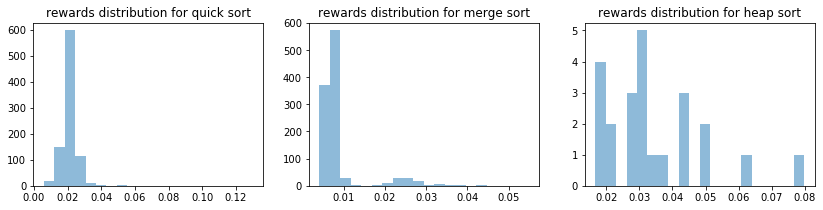

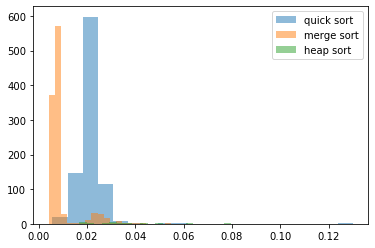

In [47]:
plot_rewards_distribution(arm_rewards_3)
plot_rewards_distribution_together(arm_rewards_3)

Restart at iteration: 502
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.021925720763514997, 'merge_sort': 0.027459509091114612, 'heap_sort': 0.04425120000295075}
Count per chosen algo {'quick_sort': 419, 'merge_sort': 77, 'heap_sort': 7}


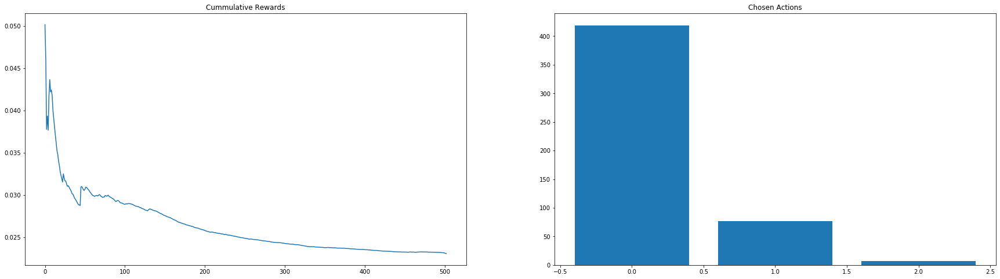

Restart at iteration: 1002
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.00803329999741566, 'merge_sort': 0.006770435918499098, 'heap_sort': 0.01767706666820838}
Count per chosen algo {'quick_sort': 7, 'merge_sort': 490, 'heap_sort': 3}


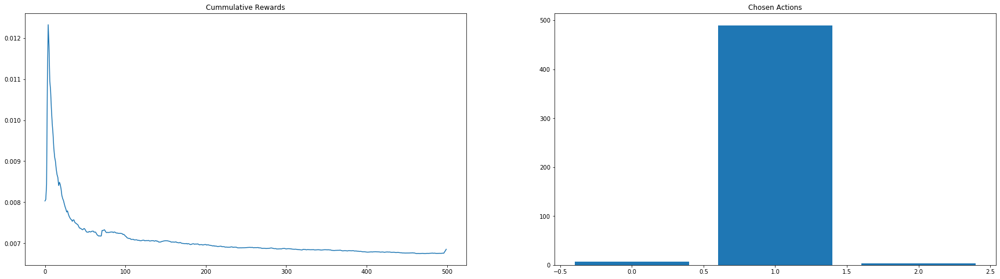

Restart at iteration: 1502
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.020908002159683955, 'merge_sort': 0.02418484814956577, 'heap_sort': 0.03751674999948591}
Count per chosen algo {'quick_sort': 463, 'merge_sort': 27, 'heap_sort': 10}


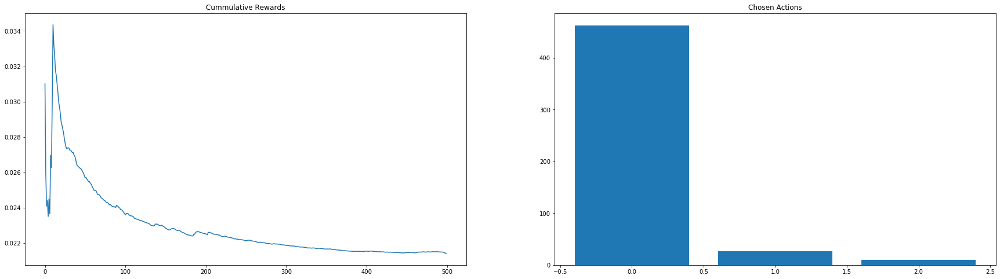

Restart at iteration: 1999
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.009663514285680972, 'merge_sort': 0.007166686037065771, 'heap_sort': 0.02034273333265446}
Count per chosen algo {'quick_sort': 7, 'merge_sort': 487, 'heap_sort': 3}


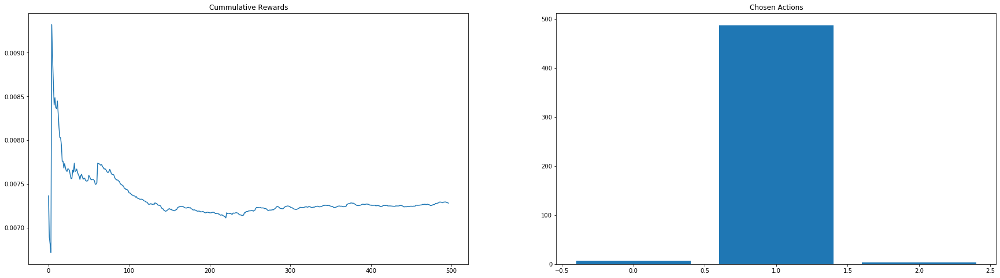

Total reward 29.3652


In [48]:
for elem in list_iteration_results_3:
    sample_mean, sample_count,rewards,cum_rewards,n = elem
    print("Restart at iteration:", n)
    print("Results up to this iteration: ")
    plot_history(rewards,cum_rewards, sample_count, sample_mean)
print("Total reward", np.round(total_reward_3,4))

## Four outliers in a row restart the expriment

In [49]:
list_iteration_results_4, total_reward_4, arm_rewards_4 = ts_quantile(list_distributions, n_samples, num_consec_elem=4)



Iteration: 0
Less than two values for quick_sort
quick_sort Theta 0.03285081452002333
Less than two values for merge_sort
merge_sort Theta 0.09782582781019844
Less than two values for heap_sort
heap_sort Theta 0.032854617164934485


Chosen algorithm is:  quick_sort with reward: 0.021243499999400228
Sample mean is:  0.021243499999400228 Sample variance is: 0.0


Iteration: 1
Less than two values for quick_sort
quick_sort Theta 0.09164289012056631
Less than two values for merge_sort
merge_sort Theta 0.0761532400682029
Less than two values for heap_sort
heap_sort Theta 0.07486401340108488


Chosen algorithm is:  heap_sort with reward: 0.03246909999870695
Sample mean is:  0.03246909999870695 Sample variance is: 0.0


Iteration: 2
Less than two values for quick_sort
quick_sort Theta 0.060906917014786156
Less than two values for merge_sort
merge_sort Theta 0.05025107536926224
Less than two values for heap_sort
heap_sort Theta 0.03919226574969012


Chosen algorithm is:  heap_sort with rewar


Chosen algorithm is:  quick_sort with reward: 0.02702950000821147
Sample mean is:  0.023676095651867596 Sample variance is: 1.6426341350551986e-05


Iteration: 30
quick_sort Theta 0.023617543291274235
merge_sort Theta 0.023034518326223316
heap_sort Theta 0.012200986632589061


Chosen algorithm is:  heap_sort with reward: 0.03423140000086278
Sample mean is:  0.03321825000239187 Sample variance is: 1.538934319100519e-05


Iteration: 31
quick_sort Theta 0.023834731622975204
merge_sort Theta 0.03272952752475166
heap_sort Theta 0.031413172135929264


Chosen algorithm is:  quick_sort with reward: 0.019700499993632548
Sample mean is:  0.02351044583277447 Sample variance is: 1.6373027299954127e-05


Iteration: 32
quick_sort Theta 0.02246953071108572
merge_sort Theta 0.02663374031568376
heap_sort Theta 0.03196245136327694


Chosen algorithm is:  quick_sort with reward: 0.017208699995535426
Sample mean is:  0.02325837599928491 Sample variance is: 1.7243047030886896e-05


Iteration: 33
quick_sor

merge_sort Theta 0.03022689051011084
heap_sort Theta 0.033975939444181216


Chosen algorithm is:  quick_sort with reward: 0.020689700002549216
Sample mean is:  0.024240687499514024 Sample variance is: 2.545752789624138e-05


Iteration: 60
quick_sort Theta 0.022732345654860202
merge_sort Theta 0.02918077753134523
heap_sort Theta 0.02759868801957881


Chosen algorithm is:  quick_sort with reward: 0.01693100000557024
Sample mean is:  0.024091510203719253 Sample variance is: 2.6006172058474555e-05


Iteration: 61
quick_sort Theta 0.023999064775492043
merge_sort Theta 0.03112587981141415
heap_sort Theta 0.03506387045596426


Chosen algorithm is:  quick_sort with reward: 0.02753419999498874
Sample mean is:  0.024160363999544642 Sample variance is: 2.571835003208372e-05


Iteration: 62
quick_sort Theta 0.024907416079780836
merge_sort Theta 0.029767009391274035
heap_sort Theta 0.032828262989211


Chosen algorithm is:  quick_sort with reward: 0.02666540000063833
Sample mean is:  0.0242094823525


Iteration: 90
quick_sort Theta 0.022788978325204934
merge_sort Theta 0.027288594587503358
heap_sort Theta 0.03277650346600614


Chosen algorithm is:  quick_sort with reward: 0.022729100004653446
Sample mean is:  0.023606115384422876 Sample variance is: 2.7861947370640015e-05


Iteration: 91
quick_sort Theta 0.023353454174410693
merge_sort Theta 0.02876500621547542
heap_sort Theta 0.04686603358037424


Chosen algorithm is:  quick_sort with reward: 0.027602200003457256
Sample mean is:  0.023656698734030906 Sample variance is: 2.7708841162620975e-05


Iteration: 92
quick_sort Theta 0.023630164112420634
merge_sort Theta 0.02921132737405874
heap_sort Theta 0.03335815358866324


Chosen algorithm is:  quick_sort with reward: 0.025334999998449348
Sample mean is:  0.023677677499836135 Sample variance is: 2.739724922865036e-05


Iteration: 93
quick_sort Theta 0.02300428852123639
merge_sort Theta 0.026550897131345827
heap_sort Theta 0.030223045597628884


Chosen algorithm is:  quick_sort with re


Chosen algorithm is:  quick_sort with reward: 0.01754320001055021
Sample mean is:  0.023760137736043928 Sample variance is: 2.495917243173912e-05


Iteration: 122
quick_sort Theta 0.023918830576842146
merge_sort Theta 0.02884665257100356
heap_sort Theta 0.03495342869876196


Chosen algorithm is:  quick_sort with reward: 0.02287349999824073
Sample mean is:  0.023751851402045766 Sample variance is: 2.4733187451084228e-05


Iteration: 123
quick_sort Theta 0.023970878762824756
merge_sort Theta 0.029635904916223647
heap_sort Theta 0.03924285318570468


Chosen algorithm is:  quick_sort with reward: 0.0188579999958165
Sample mean is:  0.0237065379630992 Sample variance is: 2.472388038532736e-05


Iteration: 124
quick_sort Theta 0.023917077199862823
merge_sort Theta 0.02855725355185742
heap_sort Theta 0.03214287448789041


Chosen algorithm is:  quick_sort with reward: 0.02173749999201391
Sample mean is:  0.02368847339455713 Sample variance is: 2.4532299287390272e-05


Iteration: 125
quick_sor


Chosen algorithm is:  merge_sort with reward: 0.022439399996073917
Sample mean is:  0.02706216923028338 Sample variance is: 5.4267159190379405e-05


Iteration: 152
quick_sort Theta 0.02370228410963429
merge_sort Theta 0.023866332289061713
heap_sort Theta 0.03172198215349937


Chosen algorithm is:  quick_sort with reward: 0.01838569999381434
Sample mean is:  0.023408652205997735 Sample variance is: 2.397377998688823e-05


Iteration: 153
quick_sort Theta 0.023377820771059342
merge_sort Theta 0.024260542785362268
heap_sort Theta 0.025534212819076266


Chosen algorithm is:  quick_sort with reward: 0.021483799995621666
Sample mean is:  0.023394602189863604 Sample variance is: 2.382563569375166e-05


Iteration: 154
quick_sort Theta 0.022884018142716133
merge_sort Theta 0.027779255863955035
heap_sort Theta 0.030619199563252965


Chosen algorithm is:  quick_sort with reward: 0.017787399992812425
Sample mean is:  0.023353970289884972 Sample variance is: 2.3879166487273643e-05


Iteration: 155



Chosen algorithm is:  quick_sort with reward: 0.019257200008723885
Sample mean is:  0.022894353658513153 Sample variance is: 2.2766428235613926e-05


Iteration: 184
quick_sort Theta 0.022966417704185275
merge_sort Theta 0.027512350640452862
heap_sort Theta 0.025498242816437616


Chosen algorithm is:  quick_sort with reward: 0.02078110000002198
Sample mean is:  0.022881546060582906 Sample variance is: 2.2655351551288645e-05


Iteration: 185
quick_sort Theta 0.022512779071128874
merge_sort Theta 0.0247093258087095
heap_sort Theta 0.03136417983814486


Chosen algorithm is:  quick_sort with reward: 0.021917100006248802
Sample mean is:  0.02287573614459294 Sample variance is: 2.2524443125324066e-05


Iteration: 186
quick_sort Theta 0.023032517324326075
merge_sort Theta 0.02590256528270242
heap_sort Theta 0.03492770724764961


Chosen algorithm is:  quick_sort with reward: 0.023252400002093054
Sample mean is:  0.02287799161679354 Sample variance is: 2.239041068808672e-05


Iteration: 187
qui

Iteration: 215
quick_sort Theta 0.023099048671478987
merge_sort Theta 0.027384336344604788
heap_sort Theta 0.03201851648406145


Chosen algorithm is:  quick_sort with reward: 0.022555200004717335
Sample mean is:  0.023199172448845014 Sample variance is: 2.4429288341001415e-05


Iteration: 216
quick_sort Theta 0.0229382680125966
merge_sort Theta 0.022491161702066973
heap_sort Theta 0.037186936826581474


Chosen algorithm is:  merge_sort with reward: 0.024590999993961304
Sample mean is:  0.026024582352393362 Sample variance is: 4.588706990293e-05


Iteration: 217
quick_sort Theta 0.023216143011533567
merge_sort Theta 0.024305647782191606
heap_sort Theta 0.03244357469757839


Chosen algorithm is:  quick_sort with reward: 0.022885900005348958
Sample mean is:  0.023197582233395797 Sample variance is: 2.4305777443093666e-05


Iteration: 218
quick_sort Theta 0.022562503754154733
merge_sort Theta 0.022776341978888483
heap_sort Theta 0.03392902768303356


Chosen algorithm is:  quick_sort with r


Iteration: 246
quick_sort Theta 0.023524887970756404
merge_sort Theta 0.0247373767162758
heap_sort Theta 0.03210084046154778


Chosen algorithm is:  quick_sort with reward: 0.024180199994589202
Sample mean is:  0.023364846428453996 Sample variance is: 2.392059044512913e-05


Iteration: 247
quick_sort Theta 0.022974066414012246
merge_sort Theta 0.02652431240658059
heap_sort Theta 0.03188009054309407


Chosen algorithm is:  quick_sort with reward: 0.020994000005885027
Sample mean is:  0.02335430933324258 Sample variance is: 2.3839147513928207e-05


Iteration: 248
quick_sort Theta 0.02328265572994239
merge_sort Theta 0.028598013898457283
heap_sort Theta 0.03550881249594496


Chosen algorithm is:  quick_sort with reward: 0.02264860000286717
Sample mean is:  0.023351186725586053 Sample variance is: 2.3735858463006494e-05


Iteration: 249
quick_sort Theta 0.02379106063003442
merge_sort Theta 0.026175393015865855
heap_sort Theta 0.033592697139668524


Chosen algorithm is:  quick_sort with re



Chosen algorithm is:  quick_sort with reward: 0.020898000002489425
Sample mean is:  0.023364473333383692 Sample variance is: 2.4183575640264244e-05


Iteration: 278
quick_sort Theta 0.023625938403548364
merge_sort Theta 0.029162521055242273
heap_sort Theta 0.03333457567524786


Chosen algorithm is:  quick_sort with reward: 0.02502200000162702
Sample mean is:  0.023370948046931517 Sample variance is: 2.409979863637869e-05


Iteration: 279
quick_sort Theta 0.023486518008614798
merge_sort Theta 0.027795003178753348
heap_sort Theta 0.03278425920054627


Chosen algorithm is:  quick_sort with reward: 0.015828700008569285
Sample mean is:  0.02334160077829976 Sample variance is: 2.4226508217921616e-05


Iteration: 280
quick_sort Theta 0.023372648185967168
merge_sort Theta 0.024127146415964345
heap_sort Theta 0.03357536416469538


Chosen algorithm is:  quick_sort with reward: 0.02138350000313949
Sample mean is:  0.02333401124041154 Sample variance is: 2.414741050221518e-05


Iteration: 281
qu


Chosen algorithm is:  quick_sort with reward: 0.028399000002536923
Sample mean is:  0.023154239649189997 Sample variance is: 2.348169568667588e-05


Iteration: 309
quick_sort Theta 0.023094352998763248
merge_sort Theta 0.025046354405560724
heap_sort Theta 0.03415584143502373


Chosen algorithm is:  quick_sort with reward: 0.03333570000540931
Sample mean is:  0.023189839160925027 Sample variance is: 2.3760779547798813e-05


Iteration: 310
quick_sort Theta 0.02356771292800547
merge_sort Theta 0.022583312472628927
heap_sort Theta 0.041829356214879265


Chosen algorithm is:  merge_sort with reward: 0.03218409999681171
Sample mean is:  0.026093019047125597 Sample variance is: 3.999361047663758e-05


Iteration: 311
quick_sort Theta 0.022697309114240696
merge_sort Theta 0.025840439011872163
heap_sort Theta 0.035736024778609425


Chosen algorithm is:  quick_sort with reward: 0.027166600004420616
Sample mean is:  0.023203695470484245 Sample variance is: 2.373290060713425e-05


Iteration: 312
q


Iteration: 338
quick_sort Theta 0.023157609548735802
merge_sort Theta 0.026899521309703814
heap_sort Theta 0.03416135554787883


Chosen algorithm is:  quick_sort with reward: 0.020874099995126016
Sample mean is:  0.023006027707144928 Sample variance is: 2.3544386164949397e-05


Iteration: 339
quick_sort Theta 0.0230420556252778
merge_sort Theta 0.02683112398650026
heap_sort Theta 0.026817595361580092


Chosen algorithm is:  quick_sort with reward: 0.022720099994330667
Sample mean is:  0.02300512000012012 Sample variance is: 2.3469900796547527e-05


Iteration: 340
quick_sort Theta 0.022446731754284237
merge_sort Theta 0.028665520392100022
heap_sort Theta 0.03479492588341789


Chosen algorithm is:  quick_sort with reward: 0.019854700003634207
Sample mean is:  0.022995150316586936 Sample variance is: 2.3426938254355596e-05


Iteration: 341
quick_sort Theta 0.023019083342205288
merge_sort Theta 0.02485061464426037
heap_sort Theta 0.033744063330162465


Chosen algorithm is:  quick_sort wit


Chosen algorithm is:  quick_sort with reward: 0.016416500002378598
Sample mean is:  0.023148950290877025 Sample variance is: 3.086691881077764e-05


Iteration: 370
quick_sort Theta 0.023207440398652756
merge_sort Theta 0.03027077275931679
heap_sort Theta 0.03559598167663466


Chosen algorithm is:  quick_sort with reward: 0.023781900003086776
Sample mean is:  0.02315078492772401 Sample variance is: 3.077860734786328e-05


Iteration: 371
quick_sort Theta 0.02318399662176343
merge_sort Theta 0.02638339596981152
heap_sort Theta 0.030640296846667553


Chosen algorithm is:  quick_sort with reward: 0.02075719999265857
Sample mean is:  0.02314386705218914 Sample variance is: 3.0706162500958206e-05


Iteration: 372
quick_sort Theta 0.023719168559248317
merge_sort Theta 0.02626710732581451
heap_sort Theta 0.03037524837641095


Chosen algorithm is:  quick_sort with reward: 0.018021500000031665
Sample mean is:  0.023129105187485514 Sample variance is: 3.069306989584778e-05


Iteration: 373
quick_


Iteration: 401
quick_sort Theta 0.023116423511346445
merge_sort Theta 0.025695276520619145
heap_sort Theta 0.03655994884607931


Chosen algorithm is:  quick_sort with reward: 0.031379799998831004
Sample mean is:  0.022982386170468168 Sample variance is: 2.9441683020847707e-05


Iteration: 402
quick_sort Theta 0.022962704328654406
merge_sort Theta 0.028126453466680072
heap_sort Theta 0.031472250211280035


Chosen algorithm is:  quick_sort with reward: 0.03918599999451544
Sample mean is:  0.023025366578489512 Sample variance is: 3.005817898902922e-05


Iteration: 403
quick_sort Theta 0.02330875962955447
merge_sort Theta 0.02822231818399451
heap_sort Theta 0.034570486410948335


Chosen algorithm is:  quick_sort with reward: 0.0323808000102872
Sample mean is:  0.023050116402383157 Sample variance is: 3.0209592773097695e-05


Iteration: 404
quick_sort Theta 0.023297726606618767
merge_sort Theta 0.02727104529466994
heap_sort Theta 0.031231854825458906


Chosen algorithm is:  quick_sort with



Iteration: 431
quick_sort Theta 0.02363622368487279
merge_sort Theta 0.025911815386757193
heap_sort Theta 0.02975656150577753


Chosen algorithm is:  quick_sort with reward: 0.024921000003814697
Sample mean is:  0.02326061773428457 Sample variance is: 3.1165400859250034e-05


Iteration: 432
quick_sort Theta 0.023112772559806732
merge_sort Theta 0.026462341018011076
heap_sort Theta 0.03605963002491673


Chosen algorithm is:  quick_sort with reward: 0.0238546999898972
Sample mean is:  0.02326207739584627 Sample variance is: 3.1089692421186516e-05


Iteration: 433
quick_sort Theta 0.023172206781876217
merge_sort Theta 0.027013538863503866
heap_sort Theta 0.03172786038174569


Chosen algorithm is:  quick_sort with reward: 0.02201220000279136
Sample mean is:  0.023259013970863295 Sample variance is: 3.101731171572292e-05


Iteration: 434
quick_sort Theta 0.022996940576532465
merge_sort Theta 0.024243410080782325
heap_sort Theta 0.03644811995471493


Chosen algorithm is:  quick_sort with r


Chosen algorithm is:  quick_sort with reward: 0.019560899992939085
Sample mean is:  0.02331297609211754 Sample variance is: 3.050828286670413e-05


Iteration: 462
quick_sort Theta 0.023234570815994712
merge_sort Theta 0.026028921415886853
heap_sort Theta 0.03117131168043592


Chosen algorithm is:  quick_sort with reward: 0.02423179999459535
Sample mean is:  0.023315083486389276 Sample variance is: 3.044024162398127e-05


Iteration: 463
quick_sort Theta 0.02360519853255379
merge_sort Theta 0.02760756229199136
heap_sort Theta 0.03398701912000749


Chosen algorithm is:  quick_sort with reward: 0.021784199998364784
Sample mean is:  0.023311580320512792 Sample variance is: 3.0375934987118866e-05


Iteration: 464
quick_sort Theta 0.02365728203773347
merge_sort Theta 0.02606612860630882
heap_sort Theta 0.031108781903445237


Chosen algorithm is:  quick_sort with reward: 0.022542800012161024
Sample mean is:  0.02330982511432934 Sample variance is: 3.030792982457877e-05


Iteration: 465
quick_


Iteration: 493
quick_sort Theta 0.02361385860441547
merge_sort Theta 0.02512790042166285
heap_sort Theta 0.03504423392768569


Chosen algorithm is:  quick_sort with reward: 0.026605699997162446
Sample mean is:  0.023338925696023725 Sample variance is: 3.2781790873574594e-05


Iteration: 494
quick_sort Theta 0.023298614521703922
merge_sort Theta 0.02605330547774833
heap_sort Theta 0.03388737304683224


Chosen algorithm is:  quick_sort with reward: 0.0412207000044873
Sample mean is:  0.023377134615486253 Sample variance is: 3.339352766475163e-05


Iteration: 495
quick_sort Theta 0.02308579838869459
merge_sort Theta 0.027348807582210456
heap_sort Theta 0.030265145484237123


Chosen algorithm is:  quick_sort with reward: 0.02220859999943059
Sample mean is:  0.02337464307046268 Sample variance is: 3.332523136203854e-05


Iteration: 496
quick_sort Theta 0.02367398397316259
merge_sort Theta 0.028977359976673868
heap_sort Theta 0.034627784610217066


Chosen algorithm is:  quick_sort with rewa


Iteration: 519
quick_sort Theta 0.010189774516917261
Less than two values for merge_sort
merge_sort Theta 0.0075820733159002954
Less than two values for heap_sort
heap_sort Theta 0.03806065374736847


Chosen algorithm is:  merge_sort with reward: 0.007135799998650327
Sample mean is:  0.006947399997443426 Sample variance is: 3.549456045476027e-08


Iteration: 520
quick_sort Theta 0.009323082304020435
merge_sort Theta 0.006767712683387818
Less than two values for heap_sort
heap_sort Theta 0.05545055131179891


Chosen algorithm is:  merge_sort with reward: 0.006912700002430938
Sample mean is:  0.006935833332439263 Sample variance is: 2.3930615781810557e-08


Iteration: 521
quick_sort Theta 0.009894386692155121
merge_sort Theta 0.006959638173035297
Less than two values for heap_sort
heap_sort Theta 0.022316105636560057


Chosen algorithm is:  merge_sort with reward: 0.0065821000025607646
Sample mean is:  0.006847399999969639 Sample variance is: 4.1409324711407495e-08


Iteration: 522
quic


Iteration: 547
quick_sort Theta 0.009747110446652992
merge_sort Theta 0.007914782337810643
heap_sort Theta 0.020488641602332446


Chosen algorithm is:  merge_sort with reward: 0.007901499993749894
Sample mean is:  0.007926148274644471 Sample variance is: 3.3859225377295118e-06


Iteration: 548
quick_sort Theta 0.009343116594412027
merge_sort Theta 0.0076884683127370805
heap_sort Theta 0.01799655688070784


Chosen algorithm is:  merge_sort with reward: 0.01008170000568498
Sample mean is:  0.007997999999012488 Sample variance is: 3.4227758916835945e-06


Iteration: 549
quick_sort Theta 0.009687609242675976
merge_sort Theta 0.0074937196973401295
heap_sort Theta 0.01834879010689091


Chosen algorithm is:  merge_sort with reward: 0.008502700002281927
Sample mean is:  0.008014280644279243 Sample variance is: 3.320315548454472e-06


Iteration: 550
quick_sort Theta 0.009761192064242969
merge_sort Theta 0.007954200485535828
heap_sort Theta 0.020215473741460457


Chosen algorithm is:  merge_sor


Iteration: 580
quick_sort Theta 0.009017047839972741
merge_sort Theta 0.007717834776489901
heap_sort Theta 0.019257115894718388


Chosen algorithm is:  merge_sort with reward: 0.006817300003604032
Sample mean is:  0.007544993442487063 Sample variance is: 2.5451822460796016e-06


Iteration: 581
quick_sort Theta 0.009862425906658643
merge_sort Theta 0.007659706883664131
heap_sort Theta 0.019536351016213857


Chosen algorithm is:  merge_sort with reward: 0.00708729999314528
Sample mean is:  0.007537611290078325 Sample variance is: 2.5074551861552675e-06


Iteration: 582
quick_sort Theta 0.009543091052437086
merge_sort Theta 0.007560709426088407
heap_sort Theta 0.021982364494563013


Chosen algorithm is:  merge_sort with reward: 0.004788700010976754
Sample mean is:  0.0074939777777116336 Sample variance is: 2.5856950810747108e-06


Iteration: 583
quick_sort Theta 0.009400899757609663
merge_sort Theta 0.0077672696824939765
heap_sort Theta 0.020016635082535764


Chosen algorithm is:  merge_

Iteration: 610
quick_sort Theta 0.008951412180649133
merge_sort Theta 0.007258782689757714
heap_sort Theta 0.019419472135287635


Chosen algorithm is:  merge_sort with reward: 0.005655000000842847
Sample mean is:  0.0072854351646338515 Sample variance is: 2.1976503186973962e-06


Iteration: 611
quick_sort Theta 0.009020916475824946
merge_sort Theta 0.007301608558915254
heap_sort Theta 0.016767337202141668


Chosen algorithm is:  merge_sort with reward: 0.0060508000024128705
Sample mean is:  0.007272015217218406 Sample variance is: 2.190151459198926e-06


Iteration: 612
quick_sort Theta 0.009014707484694247
merge_sort Theta 0.007217359213948313
heap_sort Theta 0.019122017100664267


Chosen algorithm is:  merge_sort with reward: 0.004572799996822141
Sample mean is:  0.007242991397644253 Sample variance is: 2.2441005969545323e-06


Iteration: 613
quick_sort Theta 0.010364945134976815
merge_sort Theta 0.00707254911198015
heap_sort Theta 0.019113021819914845


Chosen algorithm is:  merge_so



Iteration: 640
quick_sort Theta 0.009478489800302907
merge_sort Theta 0.006941100352218586
heap_sort Theta 0.018449211876706315


Chosen algorithm is:  merge_sort with reward: 0.006608700001379475
Sample mean is:  0.007093158677799535 Sample variance is: 2.1164131084648477e-06


Iteration: 641
quick_sort Theta 0.009267367347173207
merge_sort Theta 0.007134862823482803
heap_sort Theta 0.018893117726875797


Chosen algorithm is:  merge_sort with reward: 0.010185799997998402
Sample mean is:  0.007118508196817559 Sample variance is: 2.176819831882669e-06


Iteration: 642
quick_sort Theta 0.00856744945647322
merge_sort Theta 0.006897643892431744
heap_sort Theta 0.01585859801557396


Chosen algorithm is:  merge_sort with reward: 0.010854499996639788
Sample mean is:  0.007148882113889284 Sample variance is: 2.2716762399424073e-06


Iteration: 643
quick_sort Theta 0.009705751430636508
merge_sort Theta 0.0070528347632510206
heap_sort Theta 0.019164944094127164


Chosen algorithm is:  merge_so


Iteration: 673
quick_sort Theta 0.009381983410232633
merge_sort Theta 0.006953530509297361
heap_sort Theta 0.01913133987308336


Chosen algorithm is:  merge_sort with reward: 0.0071413999976357445
Sample mean is:  0.007071153896421575 Sample variance is: 2.1266030845517774e-06


Iteration: 674
quick_sort Theta 0.009764583925637369
merge_sort Theta 0.007093223269356766
heap_sort Theta 0.01851886348334064


Chosen algorithm is:  merge_sort with reward: 0.0056764000037219375
Sample mean is:  0.00706215548421061 Sample variance is: 2.1253526636884852e-06


Iteration: 675
quick_sort Theta 0.009531450210636408
merge_sort Theta 0.007204663518514007
heap_sort Theta 0.019168209543763498


Chosen algorithm is:  merge_sort with reward: 0.006855300001916476
Sample mean is:  0.007060829487529237 Sample variance is: 2.1120011395678673e-06


Iteration: 676
quick_sort Theta 0.008932957975027472
merge_sort Theta 0.0069839901447301365
heap_sort Theta 0.018887721969122945


Chosen algorithm is:  merge_s


Iteration: 707
quick_sort Theta 0.008986576569504365
merge_sort Theta 0.006992116685400747
heap_sort Theta 0.020314228721115744


Chosen algorithm is:  merge_sort with reward: 0.008812400003080256
Sample mean is:  0.007085689893853108 Sample variance is: 1.901075363637728e-06


Iteration: 708
quick_sort Theta 0.009960811272288716
merge_sort Theta 0.007082642322058332
heap_sort Theta 0.019448604323559136


Chosen algorithm is:  merge_sort with reward: 0.004625400004442781
Sample mean is:  0.007072672487030831 Sample variance is: 1.9228739053409332e-06


Iteration: 709
quick_sort Theta 0.009225163329306351
merge_sort Theta 0.007103906153598055
heap_sort Theta 0.018874017393272123


Chosen algorithm is:  merge_sort with reward: 0.006278699991526082
Sample mean is:  0.007068493684422911 Sample variance is: 1.9160539083090504e-06


Iteration: 710
quick_sort Theta 0.009498883721335987
merge_sort Theta 0.007044145711311472
heap_sort Theta 0.01906976560861626


Chosen algorithm is:  merge_sor

quick_sort Theta 0.009351135228692787
merge_sort Theta 0.007006978340713677
heap_sort Theta 0.07627692554095905


Chosen algorithm is:  merge_sort with reward: 0.007047000006423332
Sample mean is:  0.00706237511348761 Sample variance is: 1.7851590968432373e-06


Iteration: 741
quick_sort Theta 0.009387139837359152
merge_sort Theta 0.007123470266851556
heap_sort Theta 0.019463205910879442


Chosen algorithm is:  merge_sort with reward: 0.00768439999956172
Sample mean is:  0.007065177027388845 Sample variance is: 1.7788528491039445e-06


Iteration: 742
quick_sort Theta 0.009127410685326257
merge_sort Theta 0.007008250896549832
heap_sort Theta 0.018705809042269924


Chosen algorithm is:  merge_sort with reward: 0.00705759999982547
Sample mean is:  0.007065143049686767 Sample variance is: 1.7708761867935984e-06


Iteration: 743
quick_sort Theta 0.009160807400128621
merge_sort Theta 0.007010487912923353
heap_sort Theta 0.01954933460239937


Chosen algorithm is:  merge_sort with reward: 0.00



Iteration: 774
quick_sort Theta 0.009425798947868366
merge_sort Theta 0.006888192513570072
heap_sort Theta 0.01950157624740271


Chosen algorithm is:  merge_sort with reward: 0.00629309999931138
Sample mean is:  0.0070494580395889525 Sample variance is: 1.6688286844283544e-06


Iteration: 775
quick_sort Theta 0.009406410010139008
merge_sort Theta 0.006912097525070498
heap_sort Theta 0.017409769717836594


Chosen algorithm is:  merge_sort with reward: 0.006640799998422153
Sample mean is:  0.0070478617191156445 Sample variance is: 1.6629596233384491e-06


Iteration: 776
quick_sort Theta 0.0093025457638486
merge_sort Theta 0.006941153971323443
heap_sort Theta 0.01806458687089448


Chosen algorithm is:  merge_sort with reward: 0.006720599994878285
Sample mean is:  0.007046588327192542 Sample variance is: 1.6569040742348536e-06


Iteration: 777
quick_sort Theta 0.008838489275394587
merge_sort Theta 0.0070633879300302975
heap_sort Theta 0.018991818202526968


Chosen algorithm is:  merge_so


Chosen algorithm is:  merge_sort with reward: 0.007874300004914403
Sample mean is:  0.007067405965215968 Sample variance is: 1.56830250045269e-06


Iteration: 805
quick_sort Theta 0.008872409840879001
merge_sort Theta 0.007034957409733363
heap_sort Theta 0.019371716355174273


Chosen algorithm is:  merge_sort with reward: 0.004417899996042252
Sample mean is:  0.007058141958330745 Sample variance is: 1.5872781449935766e-06


Iteration: 806
quick_sort Theta 0.009238205876913425
merge_sort Theta 0.006901962547056775
heap_sort Theta 0.018355202076109328


Chosen algorithm is:  merge_sort with reward: 0.006844899995485321
Sample mean is:  0.0070573989549758825 Sample variance is: 1.581905446562325e-06


Iteration: 807
quick_sort Theta 0.009452552566461853
merge_sort Theta 0.007103651457229371
heap_sort Theta 0.019140965207937833


Chosen algorithm is:  merge_sort with reward: 0.007195999991381541
Sample mean is:  0.0070578802085745134 Sample variance is: 1.576479189959835e-06


Iteration: 


Iteration: 834
quick_sort Theta 0.009027399076813186
merge_sort Theta 0.007043029072550231
heap_sort Theta 0.018384851204400532


Chosen algorithm is:  merge_sort with reward: 0.0075022000091848895
Sample mean is:  0.007038128889158427 Sample variance is: 1.4994680401618575e-06


Iteration: 835
quick_sort Theta 0.009294695875004042
merge_sort Theta 0.007040875387176596
heap_sort Theta 0.01846571384469827


Chosen algorithm is:  merge_sort with reward: 0.005853999988175929
Sample mean is:  0.007034381645800888 Sample variance is: 1.499146065461926e-06


Iteration: 836
quick_sort Theta 0.00954981764655294
merge_sort Theta 0.007003916705187635
heap_sort Theta 0.01871789843766918


Chosen algorithm is:  merge_sort with reward: 0.008982499988633208
Sample mean is:  0.00704052712953222 Sample variance is: 1.5063512606752861e-06


Iteration: 837
quick_sort Theta 0.009447231162530488
merge_sort Theta 0.007010757840888808
heap_sort Theta 0.018157563140957952


Chosen algorithm is:  merge_sort 



Iteration: 865
quick_sort Theta 0.009452729753194406
merge_sort Theta 0.007059398467229752
heap_sort Theta 0.019211068710988707


Chosen algorithm is:  merge_sort with reward: 0.00806130000273697
Sample mean is:  0.007037637572450566 Sample variance is: 1.4845709583790962e-06


Iteration: 866
quick_sort Theta 0.00964992513710343
merge_sort Theta 0.007153659332254265
heap_sort Theta 0.019069550240356295


Chosen algorithm is:  merge_sort with reward: 0.005275699993944727
Sample mean is:  0.007032559942541327 Sample variance is: 1.489213340526719e-06


Iteration: 867
quick_sort Theta 0.009007059271219168
merge_sort Theta 0.007086810376861248
heap_sort Theta 0.018788884793410877


Chosen algorithm is:  merge_sort with reward: 0.006972100003622472
Sample mean is:  0.0070323862070846635 Sample variance is: 1.4849444656981335e-06


Iteration: 868
quick_sort Theta 0.009361269057488018
merge_sort Theta 0.006956361564172556
heap_sort Theta 0.019746945706176047


Chosen algorithm is:  merge_so



Iteration: 895
quick_sort Theta 0.009013461874208534
merge_sort Theta 0.006952198356065379
heap_sort Theta 0.018786699312223043


Chosen algorithm is:  merge_sort with reward: 0.005861099998583086
Sample mean is:  0.00703413351081334 Sample variance is: 1.5994237085827044e-06


Iteration: 896
quick_sort Theta 0.00934682679020994
merge_sort Theta 0.007044188752236055
heap_sort Theta 0.019148182078467316


Chosen algorithm is:  merge_sort with reward: 0.007148100004997104
Sample mean is:  0.0070344358092064 Sample variance is: 1.5952155658806504e-06


Iteration: 897
quick_sort Theta 0.00970679353847512
merge_sort Theta 0.007050397418186534
heap_sort Theta 0.019398422222677437


Chosen algorithm is:  merge_sort with reward: 0.004596099999616854
Sample mean is:  0.007027985185371508 Sample variance is: 1.6066825954239183e-06


Iteration: 898
quick_sort Theta 0.009147759488485322
merge_sort Theta 0.007047580347034116
heap_sort Theta 0.0185331868116802


Chosen algorithm is:  merge_sort wi



Iteration: 929
quick_sort Theta 0.009911840757185339
merge_sort Theta 0.007001974111935654
heap_sort Theta 0.01941952089026917


Chosen algorithm is:  merge_sort with reward: 0.007223200009320863
Sample mean is:  0.007022119268651473 Sample variance is: 1.6760612701074777e-06


Iteration: 930
quick_sort Theta 0.009755015227941498
merge_sort Theta 0.007039745837630251
heap_sort Theta 0.019592292941208803


Chosen algorithm is:  merge_sort with reward: 0.006687800007057376
Sample mean is:  0.007021305839791147 Sample variance is: 1.6722545454204447e-06


Iteration: 931
quick_sort Theta 0.009104117652203814
merge_sort Theta 0.006990873655209017
heap_sort Theta 0.018777328939769477


Chosen algorithm is:  merge_sort with reward: 0.007106199991540052
Sample mean is:  0.007021511893557527 Sample variance is: 1.6682131254661265e-06


Iteration: 932
quick_sort Theta 0.00894461485050347
merge_sort Theta 0.006924687342994397
heap_sort Theta 0.019181923056204933


Chosen algorithm is:  merge_so

Chosen algorithm is:  merge_sort with reward: 0.006780499999877065
Sample mean is:  0.0070277278915009634 Sample variance is: 1.5992585441362288e-06


Iteration: 961
quick_sort Theta 0.008757053424230016
merge_sort Theta 0.00707596998805464
heap_sort Theta 0.01948082089037895


Chosen algorithm is:  merge_sort with reward: 0.00740139999834355
Sample mean is:  0.007028573303507394 Sample variance is: 1.595955504300053e-06


Iteration: 962
quick_sort Theta 0.008704483607495641
merge_sort Theta 0.006966506898413795
heap_sort Theta 0.018152072942431857


Chosen algorithm is:  merge_sort with reward: 0.006742499987012707
Sample mean is:  0.0070279275398132755 Sample variance is: 1.592537214689102e-06


Iteration: 963
quick_sort Theta 0.009250589787729841
merge_sort Theta 0.0070216204900150425
heap_sort Theta 0.01891378970616268


Chosen algorithm is:  merge_sort with reward: 0.007952100000693463
Sample mean is:  0.007030009009319762 Sample variance is: 1.5908697234412735e-06


Iteration: 96


Iteration: 992
quick_sort Theta 0.009115483303229114
merge_sort Theta 0.007017215630928985
heap_sort Theta 0.018847914447378905


Chosen algorithm is:  merge_sort with reward: 0.0072469000006094575
Sample mean is:  0.007020302960082069 Sample variance is: 1.51990880820129e-06


Iteration: 993
quick_sort Theta 0.009565210568312861
merge_sort Theta 0.0070675560138324075
heap_sort Theta 0.01890711264677174


Chosen algorithm is:  merge_sort with reward: 0.006557999993674457
Sample mean is:  0.007019327637368129 Sample variance is: 1.5171521928636615e-06


Iteration: 994
quick_sort Theta 0.0089378637501513
merge_sort Theta 0.007004921205239539
heap_sort Theta 0.011051132111346135


Chosen algorithm is:  merge_sort with reward: 0.006487999999080785
Sample mean is:  0.007018209052866472 Sample variance is: 1.5145512718773095e-06


Iteration: 995
quick_sort Theta 0.009829669845814367
merge_sort Theta 0.007010522219948682
heap_sort Theta 0.01929549498078952


Chosen algorithm is:  merge_sort 


Iteration: 1020
quick_sort Theta 0.02073045166706861
merge_sort Theta 0.019985213996157738
heap_sort Theta 0.03638474784387538


Chosen algorithm is:  merge_sort with reward: 0.023939499995321967
Sample mean is:  0.02527423333231127 Sample variance is: 2.525740921319645e-06


Iteration: 1021
quick_sort Theta 0.021207850753029785
merge_sort Theta 0.025258500501757333
heap_sort Theta 0.03565297336223514


Chosen algorithm is:  quick_sort with reward: 0.019582699998863973
Sample mean is:  0.020762979998835362 Sample variance is: 2.7813632370313145e-06


Iteration: 1022
quick_sort Theta 0.020928676967582705
merge_sort Theta 0.025293563799750625
heap_sort Theta 0.03654973440785021


Chosen algorithm is:  quick_sort with reward: 0.01908959999855142
Sample mean is:  0.020610854544264093 Sample variance is: 2.7599335729499786e-06


Iteration: 1023
quick_sort Theta 0.020578193824233534
merge_sort Theta 0.024989447881543777
heap_sort Theta 0.042162683330215424


Chosen algorithm is:  quick_sort


Iteration: 1053
quick_sort Theta 0.02023190071351792
merge_sort Theta 0.025514235896801372
heap_sort Theta 0.032912435532017316


Chosen algorithm is:  quick_sort with reward: 0.020841600009589456
Sample mean is:  0.02030444390455647 Sample variance is: 5.200832242984834e-06


Iteration: 1054
quick_sort Theta 0.020777032741318167
merge_sort Theta 0.02467051415855355
heap_sort Theta 0.032364182197110576


Chosen algorithm is:  quick_sort with reward: 0.021643300002324395
Sample mean is:  0.0203363214306938 Sample variance is: 5.118666147444236e-06


Iteration: 1055
quick_sort Theta 0.020101562765141665
merge_sort Theta 0.026605314196242808
heap_sort Theta 0.035200068859341405


Chosen algorithm is:  quick_sort with reward: 0.018028999998932704
Sample mean is:  0.02028266279274587 Sample variance is: 5.1205558757392e-06


Iteration: 1056
quick_sort Theta 0.02091624545917091
merge_sort Theta 0.025088183528511974
heap_sort Theta 0.03352400213539927


Chosen algorithm is:  quick_sort with 

Iteration: 1086
quick_sort Theta 0.020032748810813288
merge_sort Theta 0.02470646031876222
heap_sort Theta 0.03497833376187567


Chosen algorithm is:  quick_sort with reward: 0.019598200000473298
Sample mean is:  0.01997760675727182 Sample variance is: 4.8672649635471986e-06


Iteration: 1087
quick_sort Theta 0.020069717340605964
merge_sort Theta 0.024522285093502284
heap_sort Theta 0.036017895616537524


Chosen algorithm is:  quick_sort with reward: 0.021123099999385886
Sample mean is:  0.019992880000500007 Sample variance is: 4.819630222310915e-06


Iteration: 1088
quick_sort Theta 0.020513163205982697
merge_sort Theta 0.025584578221995367
heap_sort Theta 0.03614697254637218


Chosen algorithm is:  quick_sort with reward: 0.019719600008102134
Sample mean is:  0.019989284211126352 Sample variance is: 4.7571837627667225e-06


Iteration: 1089
quick_sort Theta 0.01952127508404678
merge_sort Theta 0.024996975706485982
heap_sort Theta 0.036686496822422025


Chosen algorithm is:  quick_sort

heap_sort Theta 0.03578994073746006


Chosen algorithm is:  quick_sort with reward: 0.020670600002631545
Sample mean is:  0.019997818269845223 Sample variance is: 4.62577501057138e-06


Iteration: 1117
quick_sort Theta 0.019756090550918936
merge_sort Theta 0.024146365404165624
heap_sort Theta 0.03607900979309027


Chosen algorithm is:  quick_sort with reward: 0.019787800003541633
Sample mean is:  0.019995818095880427 Sample variance is: 4.582136082843202e-06


Iteration: 1118
quick_sort Theta 0.019559712754268887
merge_sort Theta 0.0252209260189612
heap_sort Theta 0.03476726142342946


Chosen algorithm is:  quick_sort with reward: 0.019702000005054288
Sample mean is:  0.01999304622709905 Sample variance is: 4.539715125885279e-06


Iteration: 1119
quick_sort Theta 0.019724697917787946
merge_sort Theta 0.02307603536560209
heap_sort Theta 0.03412628768424599


Chosen algorithm is:  quick_sort with reward: 0.019985799997812137
Sample mean is:  0.019992978505330012 Sample variance is: 4.497


Chosen algorithm is:  quick_sort with reward: 0.02132349999737926
Sample mean is:  0.020685209559708123 Sample variance is: 9.47709548935102e-06


Iteration: 1150
quick_sort Theta 0.02089732636779587
merge_sort Theta 0.024809758071666632
heap_sort Theta 0.03707430885347502


Chosen algorithm is:  quick_sort with reward: 0.01811390000511892
Sample mean is:  0.02066644087682791 Sample variance is: 9.455827440026595e-06


Iteration: 1151
quick_sort Theta 0.020867013955012982
merge_sort Theta 0.02590567200213374
heap_sort Theta 0.02731504658757902


Chosen algorithm is:  quick_sort with reward: 0.015408200008096173
Sample mean is:  0.020628337682126952 Sample variance is: 9.586210873490134e-06


Iteration: 1152
quick_sort Theta 0.02050403276217947
merge_sort Theta 0.025475994835504327
heap_sort Theta 0.0363556635464763


Chosen algorithm is:  quick_sort with reward: 0.02214549999916926
Sample mean is:  0.020639252518940207 Sample variance is: 9.533685773084759e-06


Iteration: 1153
quick_

merge_sort Theta 0.025690967759947454
heap_sort Theta 0.037745145334523264


Chosen algorithm is:  quick_sort with reward: 0.022812499999417923
Sample mean is:  0.021347346746713368 Sample variance is: 1.6105398233361207e-05


Iteration: 1183
quick_sort Theta 0.02100052648855289
merge_sort Theta 0.0254592657438369
heap_sort Theta 0.03676609055912045


Chosen algorithm is:  quick_sort with reward: 0.017600599996512756
Sample mean is:  0.021325307059947483 Sample variance is: 1.6092751973667163e-05


Iteration: 1184
quick_sort Theta 0.020680401662545998
merge_sort Theta 0.024964575713122824
heap_sort Theta 0.030825463990754934


Chosen algorithm is:  quick_sort with reward: 0.021266099996864796
Sample mean is:  0.021324960819812496 Sample variance is: 1.599866269298172e-05


Iteration: 1185
quick_sort Theta 0.021730318619424708
merge_sort Theta 0.026977890134193678
heap_sort Theta 0.03645448410105472


Chosen algorithm is:  quick_sort with reward: 0.023140100005548447
Sample mean is:  0.



Iteration: 1215
quick_sort Theta 0.020894824332778065
merge_sort Theta 0.025219093804265506
heap_sort Theta 0.03808016683804289


Chosen algorithm is:  quick_sort with reward: 0.01794520000112243
Sample mean is:  0.021401475248645097 Sample variance is: 1.545104620818878e-05


Iteration: 1216
quick_sort Theta 0.021450038782386827
merge_sort Theta 0.02461324237481824
heap_sort Theta 0.03793025872813194


Chosen algorithm is:  quick_sort with reward: 0.017482600000221282
Sample mean is:  0.021382170444465668 Sample variance is: 1.545021312387964e-05


Iteration: 1217
quick_sort Theta 0.021860881888206857
merge_sort Theta 0.024986125067083777
heap_sort Theta 0.035526454132535794


Chosen algorithm is:  quick_sort with reward: 0.018579600000521168
Sample mean is:  0.021368432354054178 Sample variance is: 1.5412790016052428e-05


Iteration: 1218
quick_sort Theta 0.02128186429732986
merge_sort Theta 0.02506374557452735
heap_sort Theta 0.03421609146401886


Chosen algorithm is:  quick_sort 


Chosen algorithm is:  quick_sort with reward: 0.019325100001879036
Sample mean is:  0.02116578706992531 Sample variance is: 1.4418885946681817e-05


Iteration: 1246
quick_sort Theta 0.021137021294916757
merge_sort Theta 0.02576857934523336
heap_sort Theta 0.03385473571162307


Chosen algorithm is:  quick_sort with reward: 0.02148910000687465
Sample mean is:  0.02116717467909677 Sample variance is: 1.4357449022546712e-05


Iteration: 1247
quick_sort Theta 0.021500101155653616
merge_sort Theta 0.025291781348194643
heap_sort Theta 0.03806593001785617


Chosen algorithm is:  quick_sort with reward: 0.019576200007577427
Sample mean is:  0.021160375642038994 Sample variance is: 1.4306863271636967e-05


Iteration: 1248
quick_sort Theta 0.020755418623285768
merge_sort Theta 0.026149714106630903
heap_sort Theta 0.031071255225405405


Chosen algorithm is:  quick_sort with reward: 0.01861280000593979
Sample mean is:  0.021149534894651337 Sample variance is: 1.4273483104513933e-05


Iteration: 12


Iteration: 1275
quick_sort Theta 0.020980430908988806
merge_sort Theta 0.024621623909641146
heap_sort Theta 0.03535191686413404


Chosen algorithm is:  quick_sort with reward: 0.020587500010151416
Sample mean is:  0.02101945610780701 Sample variance is: 1.3356758160005607e-05


Iteration: 1276
quick_sort Theta 0.020877585760725122
merge_sort Theta 0.025889968971891036
heap_sort Theta 0.049715018307057074


Chosen algorithm is:  quick_sort with reward: 0.0187413999956334
Sample mean is:  0.02101079429749456 Sample variance is: 1.3325629070272834e-05


Iteration: 1277
quick_sort Theta 0.021358082268385287
merge_sort Theta 0.02443301780934733
heap_sort Theta 0.040607631036245144


Chosen algorithm is:  quick_sort with reward: 0.021614799989038147
Sample mean is:  0.021013082197841315 Sample variance is: 1.3276529872925537e-05


Iteration: 1278
quick_sort Theta 0.020957084656633335
merge_sort Theta 0.025700690972906084
heap_sort Theta 0.03713993618038904


Chosen algorithm is:  quick_sort


Chosen algorithm is:  quick_sort with reward: 0.020778900012373924
Sample mean is:  0.02124385171286221 Sample variance is: 1.5071867063806021e-05


Iteration: 1306
quick_sort Theta 0.021179306466213674
merge_sort Theta 0.024883061291672455
heap_sort Theta 0.03676565805519377


Chosen algorithm is:  quick_sort with reward: 0.028464699993492104
Sample mean is:  0.0212684962462432 Sample variance is: 1.5197774327941102e-05


Iteration: 1307
quick_sort Theta 0.021001527029837624
merge_sort Theta 0.025160664340787824
heap_sort Theta 0.029101060449299117


Chosen algorithm is:  quick_sort with reward: 0.02474110000184737
Sample mean is:  0.021280307823643214 Sample variance is: 1.518695863266034e-05


Iteration: 1308
quick_sort Theta 0.021432816064822693
merge_sort Theta 0.025645948238480754
heap_sort Theta 0.039637485637606114


Chosen algorithm is:  quick_sort with reward: 0.030876100005116314
Sample mean is:  0.021312835932732956 Sample variance is: 1.544655231395688e-05


Iteration: 13


Chosen algorithm is:  quick_sort with reward: 0.024493799995980226
Sample mean is:  0.021264273148483847 Sample variance is: 1.552462746443445e-05


Iteration: 1338
quick_sort Theta 0.021426482739446723
merge_sort Theta 0.025988609783297287
heap_sort Theta 0.03891129257345497


Chosen algorithm is:  quick_sort with reward: 0.028073900000890717
Sample mean is:  0.021285225846491253 Sample variance is: 1.561910041935631e-05


Iteration: 1339
quick_sort Theta 0.021736374299962873
merge_sort Theta 0.02554880320193877
heap_sort Theta 0.03836850108932566


Chosen algorithm is:  quick_sort with reward: 0.020479600003454834
Sample mean is:  0.02128275460157396 Sample variance is: 1.557317386009509e-05


Iteration: 1340
quick_sort Theta 0.02130469371723332
merge_sort Theta 0.025984339633513747
heap_sort Theta 0.029472108480770302


Chosen algorithm is:  quick_sort with reward: 0.018783499996061437
Sample mean is:  0.02127511162112897 Sample variance is: 1.5544592814128738e-05


Iteration: 1341


Chosen algorithm is:  quick_sort with reward: 0.01907510000455659
Sample mean is:  0.021306937640801653 Sample variance is: 1.5842860385513173e-05


Iteration: 1370
quick_sort Theta 0.020997077959714193
merge_sort Theta 0.02618372546971583
heap_sort Theta 0.03176276921627004


Chosen algorithm is:  quick_sort with reward: 0.01933650000137277
Sample mean is:  0.021301418207637986 Sample variance is: 1.5809327860041213e-05


Iteration: 1371
quick_sort Theta 0.02163994572216467
merge_sort Theta 0.025436697985937458
heap_sort Theta 0.030581390884185294


Chosen algorithm is:  quick_sort with reward: 0.018624599993927404
Sample mean is:  0.021293941061789633 Sample variance is: 1.5785126778837356e-05


Iteration: 1372
quick_sort Theta 0.02107507946708578
merge_sort Theta 0.025260401752692584
heap_sort Theta 0.03581570443199636


Chosen algorithm is:  quick_sort with reward: 0.019035100005567074
Sample mean is:  0.021287649025421324 Sample variance is: 1.5755330186715803e-05


Iteration: 13



Iteration: 1402
quick_sort Theta 0.02177928913385922
merge_sort Theta 0.024471132832169607
heap_sort Theta 0.038280340638004486


Chosen algorithm is:  quick_sort with reward: 0.029969299997901544
Sample mean is:  0.02152849100286244 Sample variance is: 1.6798055266273705e-05


Iteration: 1403
quick_sort Theta 0.02142943888608884
merge_sort Theta 0.024939651426580004
heap_sort Theta 0.03328746494570096


Chosen algorithm is:  quick_sort with reward: 0.017223300004843622
Sample mean is:  0.021517452051585468 Sample variance is: 1.6802386264913405e-05


Iteration: 1404
quick_sort Theta 0.02111931170939954
merge_sort Theta 0.02587180196233516
heap_sort Theta 0.03571250485085932


Chosen algorithm is:  quick_sort with reward: 0.01797880000958685
Sample mean is:  0.02150840179060849 Sample variance is: 1.6791357227278986e-05


Iteration: 1405
quick_sort Theta 0.021401757899299084
merge_sort Theta 0.024152754325307613
heap_sort Theta 0.0353228368581202


Chosen algorithm is:  quick_sort wi


Chosen algorithm is:  quick_sort with reward: 0.031131200012168847
Sample mean is:  0.02148711638992587 Sample variance is: 1.6401762620168476e-05


Iteration: 1435
quick_sort Theta 0.021657953455365753
merge_sort Theta 0.02499270867632876
heap_sort Theta 0.03463517172558328


Chosen algorithm is:  quick_sort with reward: 0.02212020001024939
Sample mean is:  0.021488616588078296 Sample variance is: 1.636384338438477e-05


Iteration: 1436
quick_sort Theta 0.02127507568483391
merge_sort Theta 0.025999479486500228
heap_sort Theta 0.03496761579678696


Chosen algorithm is:  quick_sort with reward: 0.017238200001884252
Sample mean is:  0.02147856832191708 Sample variance is: 1.6367766524939507e-05


Iteration: 1437
quick_sort Theta 0.02095845937392191
merge_sort Theta 0.024718544180277434
heap_sort Theta 0.0366070995538716


Chosen algorithm is:  quick_sort with reward: 0.01895650000369642
Sample mean is:  0.021472620047581655 Sample variance is: 1.6344129874285224e-05


Iteration: 1438
qu

quick_sort Theta 0.02161006801124757
merge_sort Theta 0.02605065908080042
heap_sort Theta 0.03489672460740344


Chosen algorithm is:  quick_sort with reward: 0.021676299991668202
Sample mean is:  0.021586849336629316 Sample variance is: 1.6052045945208956e-05


Iteration: 1466
quick_sort Theta 0.021027119848559407
merge_sort Theta 0.025049612617741204
heap_sort Theta 0.026665383368350247


Chosen algorithm is:  quick_sort with reward: 0.020854000002145767
Sample mean is:  0.02158523156767902 Sample variance is: 1.601779392891965e-05


Iteration: 1467
quick_sort Theta 0.02153486478823665
merge_sort Theta 0.025570628093371676
heap_sort Theta 0.03575941201493419


Chosen algorithm is:  quick_sort with reward: 0.020213499999954365
Sample mean is:  0.02158221013250782 Sample variance is: 1.598664791342839e-05


Iteration: 1468
quick_sort Theta 0.021664703871021738
merge_sort Theta 0.025277415602298698
heap_sort Theta 0.0399023375444018


Chosen algorithm is:  quick_sort with reward: 0.02808


Iteration: 1496
quick_sort Theta 0.021653385454735274
merge_sort Theta 0.025145776289290805
heap_sort Theta 0.04127525567358257


Chosen algorithm is:  quick_sort with reward: 0.023232200008351356
Sample mean is:  0.02161958944128381 Sample variance is: 1.5579961405526324e-05


Iteration: 1497
quick_sort Theta 0.021570287488414882
merge_sort Theta 0.02336702890456404
heap_sort Theta 0.03549445697731863


Chosen algorithm is:  quick_sort with reward: 0.023439099997631274
Sample mean is:  0.021623348760615106 Sample variance is: 1.5554597391348487e-05


Iteration: 1498
quick_sort Theta 0.021737744905549135
merge_sort Theta 0.02519711357357806
heap_sort Theta 0.034161005855988254


Chosen algorithm is:  quick_sort with reward: 0.02020240000274498
Sample mean is:  0.021620418969361763 Sample variance is: 1.5526680556086427e-05


Iteration: 1499
quick_sort Theta 0.021750353067513935
merge_sort Theta 0.02450930460176895
heap_sort Theta 0.038822274405382495


Chosen algorithm is:  quick_sort


Iteration: 1522
quick_sort Theta 0.010167796485826297
merge_sort Theta 0.007857898883160234
heap_sort Theta 0.021009382563322077


Chosen algorithm is:  merge_sort with reward: 0.008237000001827255
Sample mean is:  0.0074591866694390776 Sample variance is: 5.03773154970163e-07


Iteration: 1523
quick_sort Theta 0.010059573281904068
merge_sort Theta 0.007676352686641517
heap_sort Theta 0.02084225095153982


Chosen algorithm is:  merge_sort with reward: 0.005917700007557869
Sample mean is:  0.007362843753071502 Sample variance is: 6.115166957976725e-07


Iteration: 1524
quick_sort Theta 0.010104717095561185
merge_sort Theta 0.007096378509222252
heap_sort Theta 0.02094112525438023


Chosen algorithm is:  merge_sort with reward: 0.007368799997493625
Sample mean is:  0.00736319412039045 Sample variance is: 5.755470895727641e-07


Iteration: 1525
quick_sort Theta 0.010098768248647682
merge_sort Theta 0.0072997580758333075
heap_sort Theta 0.021179873300237483


Chosen algorithm is:  merge_so


Iteration: 1555
quick_sort Theta 0.010081982191511173
merge_sort Theta 0.007084168638370345
heap_sort Theta 0.020564307249372776


Chosen algorithm is:  merge_sort with reward: 0.00893930000893306
Sample mean is:  0.0071664875019147685 Sample variance is: 8.124544361400558e-07


Iteration: 1556
quick_sort Theta 0.01017839687142363
merge_sort Theta 0.007036428412521615
heap_sort Theta 0.021279809777446895


Chosen algorithm is:  merge_sort with reward: 0.0076532999955816194
Sample mean is:  0.007176422450765112 Sample variance is: 8.006114873773168e-07


Iteration: 1557
quick_sort Theta 0.010192754144830337
merge_sort Theta 0.007204921208886771
heap_sort Theta 0.020035722845159


Chosen algorithm is:  merge_sort with reward: 0.006806799996411428
Sample mean is:  0.007169030001678039 Sample variance is: 7.872770245015144e-07


Iteration: 1558
quick_sort Theta 0.010127686727470898
merge_sort Theta 0.007024532868548032
heap_sort Theta 0.020832049471119562


Chosen algorithm is:  merge_sor


Iteration: 1588
quick_sort Theta 0.010109811783088589
merge_sort Theta 0.007026372040713498
heap_sort Theta 0.020805403054237316


Chosen algorithm is:  merge_sort with reward: 0.008879400003934279
Sample mean is:  0.007212848149068987 Sample variance is: 1.473355538690831e-06


Iteration: 1589
quick_sort Theta 0.010010168470337925
merge_sort Theta 0.007260268653957995
heap_sort Theta 0.0208346203221809


Chosen algorithm is:  merge_sort with reward: 0.006467600003816187
Sample mean is:  0.007203759757053709 Sample variance is: 1.4620782966422845e-06


Iteration: 1590
quick_sort Theta 0.010078721034877563
merge_sort Theta 0.007189038589893753
heap_sort Theta 0.02075307793544113


Chosen algorithm is:  merge_sort with reward: 0.01122400000167545
Sample mean is:  0.007252196386506983 Sample variance is: 1.6368436754470086e-06


Iteration: 1591
quick_sort Theta 0.010109626433656649
merge_sort Theta 0.007123290654819775
heap_sort Theta 0.02073913955322262


Chosen algorithm is:  merge_sor



Iteration: 1621
quick_sort Theta 0.010119826352320768
merge_sort Theta 0.007748717521983715
heap_sort Theta 0.02084469919891266


Chosen algorithm is:  merge_sort with reward: 0.006993799994233996
Sample mean is:  0.007567034211222148 Sample variance is: 8.505162281751124e-06


Iteration: 1622
quick_sort Theta 0.010103154356785398
merge_sort Theta 0.00763619032490648
heap_sort Theta 0.020706591881642405


Chosen algorithm is:  merge_sort with reward: 0.006519400005345233
Sample mean is:  0.007557924348562349 Sample variance is: 8.440665163001895e-06


Iteration: 1623
quick_sort Theta 0.010345546003976903
merge_sort Theta 0.007935875380181277
heap_sort Theta 0.020930738056173435


Chosen algorithm is:  merge_sort with reward: 0.006588999996893108
Sample mean is:  0.007549571552427269 Sample variance is: 8.375924266524966e-06


Iteration: 1624
quick_sort Theta 0.01010570416217659
merge_sort Theta 0.007283949271197446
heap_sort Theta 0.02081821580095393


Chosen algorithm is:  merge_sor



Chosen algorithm is:  merge_sort with reward: 0.007472800003597513
Sample mean is:  0.0074813538466025 Sample variance is: 7.005355997405686e-06


Iteration: 1652
quick_sort Theta 0.010318861412542924
merge_sort Theta 0.007378282343460164
heap_sort Theta 0.02087595066978796


Chosen algorithm is:  merge_sort with reward: 0.0069205000036163256
Sample mean is:  0.007477459028248429 Sample variance is: 6.958876946099749e-06


Iteration: 1653
quick_sort Theta 0.010109540881204927
merge_sort Theta 0.007495134932857759
heap_sort Theta 0.02116938300651865


Chosen algorithm is:  merge_sort with reward: 0.007197400002041832
Sample mean is:  0.007475527586688384 Sample variance is: 6.9114218784750436e-06


Iteration: 1654
quick_sort Theta 0.010323385880373027
merge_sort Theta 0.007733598670327017
heap_sort Theta 0.020623603725032188


Chosen algorithm is:  merge_sort with reward: 0.006897500003105961
Sample mean is:  0.007471568493650148 Sample variance is: 6.866356163022475e-06


Iteration: 



Iteration: 1683
quick_sort Theta 0.010174341505637926
merge_sort Theta 0.007324617615307986
heap_sort Theta 0.01996962066774104


Chosen algorithm is:  merge_sort with reward: 0.008263499999884516
Sample mean is:  0.007525006286034893 Sample variance is: 7.375475461496271e-06


Iteration: 1684
quick_sort Theta 0.010270852090941892
merge_sort Theta 0.0075999311994358245
heap_sort Theta 0.02006987283989806


Chosen algorithm is:  merge_sort with reward: 0.004232399995089509
Sample mean is:  0.0075062982957454305 Sample variance is: 7.394817408536945e-06


Iteration: 1685
quick_sort Theta 0.010246484823481663
merge_sort Theta 0.007563223030070548
heap_sort Theta 0.02117387022153042


Chosen algorithm is:  merge_sort with reward: 0.004102899998542853
Sample mean is:  0.007487070056778184 Sample variance is: 7.418110409695731e-06


Iteration: 1686
quick_sort Theta 0.010173492003394749
merge_sort Theta 0.0072575041122354585
heap_sort Theta 0.02076277494732698


Chosen algorithm is:  merge_


Iteration: 1714
quick_sort Theta 0.01013805408382387
merge_sort Theta 0.007531541372060991
heap_sort Theta 0.0209058476862831


Chosen algorithm is:  merge_sort with reward: 0.007920200005173683
Sample mean is:  0.0073253703886418135 Sample variance is: 6.6583680741168055e-06


Iteration: 1715
quick_sort Theta 0.010773330304552183
merge_sort Theta 0.007562143570368745
heap_sort Theta 0.02078653839778398


Chosen algorithm is:  merge_sort with reward: 0.004659099999116734
Sample mean is:  0.007312489855359083 Sample variance is: 6.660379121128634e-06


Iteration: 1716
quick_sort Theta 0.01013589990399923
merge_sort Theta 0.007354580256090641
heap_sort Theta 0.020819762042044786


Chosen algorithm is:  merge_sort with reward: 0.007807899994077161
Sample mean is:  0.007314871634872151 Sample variance is: 6.629532352506985e-06


Iteration: 1717
quick_sort Theta 0.010158493641149666
merge_sort Theta 0.007473322206464523
heap_sort Theta 0.02057305544373982


Chosen algorithm is:  merge_sort


Iteration: 1744
quick_sort Theta 0.010187535928696308
merge_sort Theta 0.0070721809592583515
heap_sort Theta 0.020878739649134965


Chosen algorithm is:  merge_sort with reward: 0.007743500013020821
Sample mean is:  0.007238138559564427 Sample variance is: 6.1578152612281025e-06


Iteration: 1745
quick_sort Theta 0.010149576893523329
merge_sort Theta 0.007610236607354119
heap_sort Theta 0.020970139105705842


Chosen algorithm is:  merge_sort with reward: 0.0076216000015847385
Sample mean is:  0.007239756540332445 Sample variance is: 6.132450733730423e-06


Iteration: 1746
quick_sort Theta 0.011321132217452677
merge_sort Theta 0.007232382787048212
heap_sort Theta 0.02083410163299735


Chosen algorithm is:  merge_sort with reward: 0.004298600004403852
Sample mean is:  0.007227398739761317 Sample variance is: 6.142877644693388e-06


Iteration: 1747
quick_sort Theta 0.010195746903374665
merge_sort Theta 0.007171210861120559
heap_sort Theta 0.02050072319745166


Chosen algorithm is:  merge



Chosen algorithm is:  merge_sort with reward: 0.007705899988650344
Sample mean is:  0.007213986940334861 Sample variance is: 5.624547754223424e-06


Iteration: 1777
quick_sort Theta 0.010136133268935794
merge_sort Theta 0.007105460095681582
heap_sort Theta 0.020798342318705976


Chosen algorithm is:  merge_sort with reward: 0.007467200004612096
Sample mean is:  0.007214928252841467 Sample variance is: 5.603876121320349e-06


Iteration: 1778
quick_sort Theta 0.010232174506508146
merge_sort Theta 0.007446223733346338
heap_sort Theta 0.020813095628465946


Chosen algorithm is:  merge_sort with reward: 0.005652899999404326
Sample mean is:  0.007209142963013922 Sample variance is: 5.592124341161277e-06


Iteration: 1779
quick_sort Theta 0.01021851444571636
merge_sort Theta 0.007021559132297041
heap_sort Theta 0.020896115444850583


Chosen algorithm is:  merge_sort with reward: 0.006713099995977245
Sample mean is:  0.007207312546161388 Sample variance is: 5.572393810971532e-06


Iteration:


Iteration: 1806
quick_sort Theta 0.010187184141730192
merge_sort Theta 0.007173773067141724
heap_sort Theta 0.021085121757096367


Chosen algorithm is:  merge_sort with reward: 0.00726129999384284
Sample mean is:  0.007280918791952259 Sample variance is: 6.61598840933128e-06


Iteration: 1807
quick_sort Theta 0.010390033394117214
merge_sort Theta 0.007411509121647761
heap_sort Theta 0.020821615479130532


Chosen algorithm is:  merge_sort with reward: 0.006631500000366941
Sample mean is:  0.007278746822749632 Sample variance is: 6.5952671579597675e-06


Iteration: 1808
quick_sort Theta 0.010187556044818333
merge_sort Theta 0.007544419155011294
heap_sort Theta 0.020821951729665788


Chosen algorithm is:  merge_sort with reward: 0.007115900007192977
Sample mean is:  0.00727820400003111 Sample variance is: 6.573371036394521e-06


Iteration: 1809
quick_sort Theta 0.010107123343688977
merge_sort Theta 0.0072465689027887545
heap_sort Theta 0.020685013842347864


Chosen algorithm is:  merge_s



Chosen algorithm is:  merge_sort with reward: 0.008023200003663078
Sample mean is:  0.007225467575666368 Sample variance is: 6.0766946512242375e-06


Iteration: 1839
quick_sort Theta 0.010205513277393299
merge_sort Theta 0.007243790796086282
heap_sort Theta 0.021201093383285304


Chosen algorithm is:  merge_sort with reward: 0.006115299998782575
Sample mean is:  0.007222113595071552 Sample variance is: 6.06204828843581e-06


Iteration: 1840
quick_sort Theta 0.010294257011764535
merge_sort Theta 0.007546878740201357
heap_sort Theta 0.020657776894878764


Chosen algorithm is:  merge_sort with reward: 0.006896299993968569
Sample mean is:  0.00722113222880317 Sample variance is: 6.044107886242285e-06


Iteration: 1841
quick_sort Theta 0.010188290670530184
merge_sort Theta 0.007187343127820254
heap_sort Theta 0.020849118274550268


Chosen algorithm is:  merge_sort with reward: 0.007091899999068119
Sample mean is:  0.007220744144029191 Sample variance is: 6.0260074145603e-06


Iteration: 1


Chosen algorithm is:  merge_sort with reward: 0.006062600004952401
Sample mean is:  0.007173831666619258 Sample variance is: 5.66061133594762e-06


Iteration: 1869
quick_sort Theta 0.010076232972448753
merge_sort Theta 0.007423121543747614
heap_sort Theta 0.02085923850226473


Chosen algorithm is:  merge_sort with reward: 0.007422700000461191
Sample mean is:  0.00717452105258558 Sample variance is: 5.645102063219933e-06


Iteration: 1870
quick_sort Theta 0.010166472769329988
merge_sort Theta 0.007177234015955273
heap_sort Theta 0.020605643560869327


Chosen algorithm is:  merge_sort with reward: 0.006630500007304363
Sample mean is:  0.007173018232018504 Sample variance is: 5.630323166171515e-06


Iteration: 1871
quick_sort Theta 0.01016459288850523
merge_sort Theta 0.007078627492977672
heap_sort Theta 0.020797248528827486


Chosen algorithm is:  merge_sort with reward: 0.005026200000429526
Sample mean is:  0.007167104132206965 Sample variance is: 5.627474154755573e-06


Iteration: 187


Iteration: 1898
quick_sort Theta 0.01027655017791226
merge_sort Theta 0.007155712763372829
heap_sort Theta 0.020886566557895517


Chosen algorithm is:  merge_sort with reward: 0.007371100000455044
Sample mean is:  0.007131066922925246 Sample variance is: 5.298059867554376e-06


Iteration: 1899
quick_sort Theta 0.010177991960600546
merge_sort Theta 0.00722706133426454
heap_sort Theta 0.020821156655140647


Chosen algorithm is:  merge_sort with reward: 0.0055807000026106834
Sample mean is:  0.007127101790136718 Sample variance is: 5.290641530749622e-06


Iteration: 1900
quick_sort Theta 0.010328301641862134
merge_sort Theta 0.00713144340442814
heap_sort Theta 0.022520599829503007


Chosen algorithm is:  merge_sort with reward: 0.005087099998490885
Sample mean is:  0.007121897703933539 Sample variance is: 5.2877342588975565e-06


Iteration: 1901
quick_sort Theta 0.010171773039355046
merge_sort Theta 0.007137373547374095
heap_sort Theta 0.020877258756651293


Chosen algorithm is:  merge_s



Iteration: 1930
quick_sort Theta 0.010123475745416399
merge_sort Theta 0.00711716675558719
heap_sort Theta 0.021181034712484774


Chosen algorithm is:  merge_sort with reward: 0.006639700004598126
Sample mean is:  0.0070760033173876665 Sample variance is: 5.010052570768223e-06


Iteration: 1931
quick_sort Theta 0.010360990356097562
merge_sort Theta 0.007040790535732328
heap_sort Theta 0.020775272819432186


Chosen algorithm is:  merge_sort with reward: 0.007355900001130067
Sample mean is:  0.007076665011675473 Sample variance is: 4.998393243053719e-06


Iteration: 1932
quick_sort Theta 0.010205860881579928
merge_sort Theta 0.006941161367358737
heap_sort Theta 0.02073877201946382


Chosen algorithm is:  merge_sort with reward: 0.006257899993215688
Sample mean is:  0.007074733962103634 Sample variance is: 4.988181926630516e-06


Iteration: 1933
quick_sort Theta 0.010183970763144395
merge_sort Theta 0.006904623421061167
heap_sort Theta 0.02101129468661101


Chosen algorithm is:  merge_s

Iteration: 1960
quick_sort Theta 0.010188328098743251
merge_sort Theta 0.006911696366190289
heap_sort Theta 0.02074989986923326


Chosen algorithm is:  merge_sort with reward: 0.007489900002838112
Sample mean is:  0.0070316488937005005 Sample variance is: 4.7926055821827344e-06


Iteration: 1961
quick_sort Theta 0.01028993106592987
merge_sort Theta 0.007132336254983504
heap_sort Theta 0.021028298070762737


Chosen algorithm is:  merge_sort with reward: 0.006536200002301484
Sample mean is:  0.007030555187538472 Sample variance is: 4.782566558223134e-06


Iteration: 1962
quick_sort Theta 0.010125095576740555
merge_sort Theta 0.007090376258468242
heap_sort Theta 0.00851108323227953


Chosen algorithm is:  merge_sort with reward: 0.0055877999984659255
Sample mean is:  0.007027377312672673 Sample variance is: 4.776607067214144e-06


Iteration: 1963
quick_sort Theta 0.01019901944528108
merge_sort Theta 0.007162091616940816
heap_sort Theta 0.020885540740390937


Chosen algorithm is:  merge_so


Iteration: 1992
quick_sort Theta 0.010193092873927851
merge_sort Theta 0.0070645622896695175
heap_sort Theta 0.020798860355193426


Chosen algorithm is:  merge_sort with reward: 0.007362399992416613
Sample mean is:  0.006993160537108038 Sample variance is: 4.554861942580764e-06


Iteration: 1993
quick_sort Theta 0.010177818545794002
merge_sort Theta 0.007111493373511263
heap_sort Theta 0.0205662300915564


Chosen algorithm is:  merge_sort with reward: 0.006714900009683333
Sample mean is:  0.006992586804061802 Sample variance is: 4.545629792748356e-06


Iteration: 1994
quick_sort Theta 0.010085344621537502
merge_sort Theta 0.006885212710815541
heap_sort Theta 0.020454592701275136


Chosen algorithm is:  merge_sort with reward: 0.005347400001483038
Sample mean is:  0.006989201646031804 Sample variance is: 4.541834403047358e-06


Iteration: 1995
quick_sort Theta 0.010083515953024456
merge_sort Theta 0.006895383767271957
heap_sort Theta 0.021097860556073437


Chosen algorithm is:  merge_s

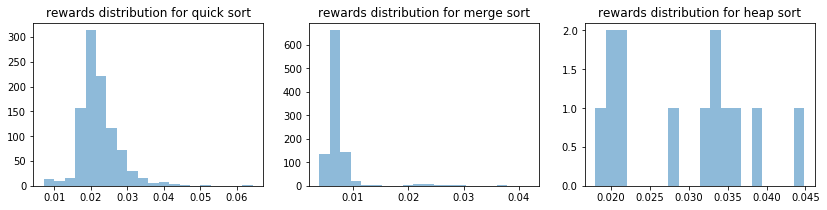

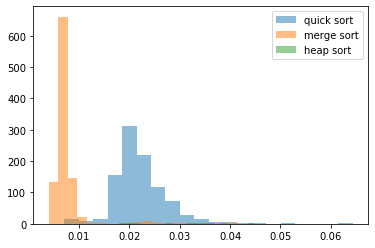

In [50]:
plot_rewards_distribution(arm_rewards_4)
plot_rewards_distribution_together(arm_rewards_4)

Restart at iteration: 503
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.023235574213956802, 'merge_sort': 0.026689734781899933, 'heap_sort': 0.03321825000239187}
Count per chosen algo {'quick_sort': 477, 'merge_sort': 23, 'heap_sort': 4}


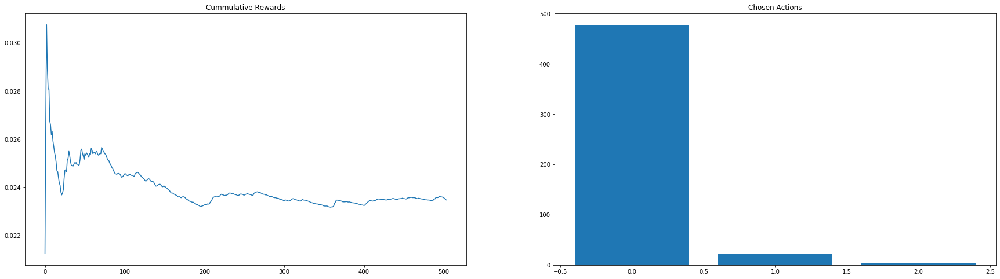

Restart at iteration: 1003
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.009402215383418549, 'merge_sort': 0.007154236983725308, 'heap_sort': 0.019119666666180517}
Count per chosen algo {'quick_sort': 13, 'merge_sort': 484, 'heap_sort': 3}


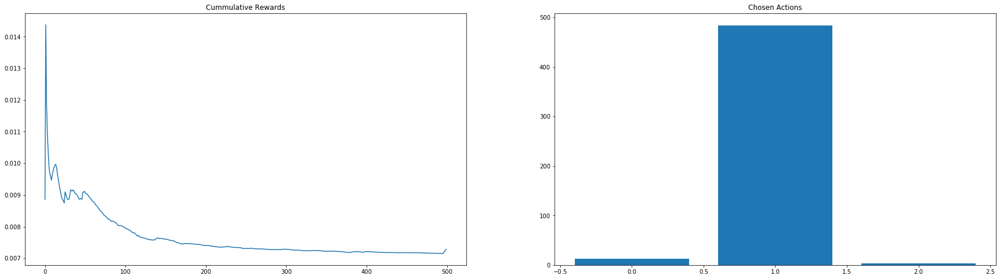

Restart at iteration: 1503
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.02152558938800286, 'merge_sort': 0.02527423333231127, 'heap_sort': 0.03701727500083507}
Count per chosen algo {'quick_sort': 490, 'merge_sort': 6, 'heap_sort': 4}


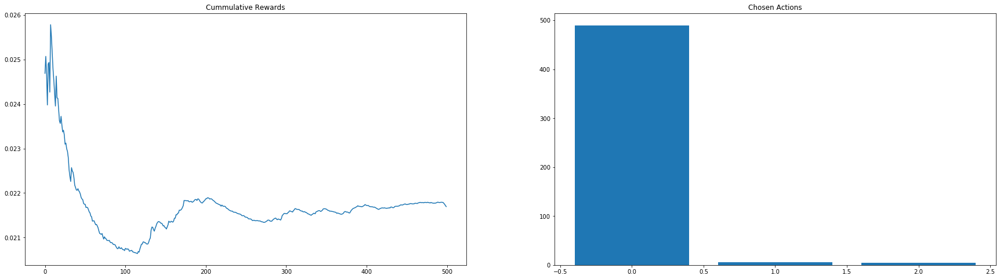

Restart at iteration: 1999
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.01016439999996995, 'merge_sort': 0.0069850955193503355, 'heap_sort': 0.02082154999516206}
Count per chosen algo {'quick_sort': 3, 'merge_sort': 491, 'heap_sort': 2}


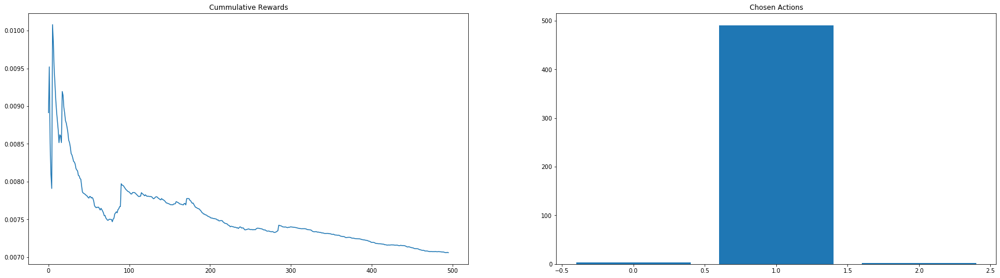

Total reward 29.8214


In [51]:
for elem in list_iteration_results_4:
    sample_mean, sample_count,rewards,cum_rewards,n = elem
    print("Restart at iteration:", n)
    print("Results up to this iteration: ")
    plot_history(rewards,cum_rewards, sample_count, sample_mean)
print("Total reward", np.round(total_reward_4,4))

## Five outliers in a row restart the expriment

In [52]:
list_iteration_results_5, total_reward_5, arm_rewards_5 = ts_quantile(list_distributions, n_samples, num_consec_elem=5)



Iteration: 0
Less than two values for quick_sort
quick_sort Theta 0.013472039759113243
Less than two values for merge_sort
merge_sort Theta 0.0017507657000503719
Less than two values for heap_sort
heap_sort Theta 0.09106531955987651


Chosen algorithm is:  merge_sort with reward: 0.04025249999540392
Sample mean is:  0.04025249999540392 Sample variance is: 0.0


Iteration: 1
Less than two values for quick_sort
quick_sort Theta 0.03187791536727539
Less than two values for merge_sort
merge_sort Theta 0.01647477450941064
Less than two values for heap_sort
heap_sort Theta 0.0647614158204504


Chosen algorithm is:  merge_sort with reward: 0.02016909999656491
Sample mean is:  0.030210799995984416 Sample variance is: 0.00010083573887834172


Iteration: 2
Less than two values for quick_sort
quick_sort Theta 0.027869489757925716
merge_sort Theta 0.0244605701772008
Less than two values for heap_sort
heap_sort Theta 0.09189840773746871


Chosen algorithm is:  merge_sort with reward: 0.0224087000


Chosen algorithm is:  heap_sort with reward: 0.03098499999032356
Sample mean is:  0.03814090000135669 Sample variance is: 4.027408589996197e-05


Iteration: 28
quick_sort Theta 0.025407429326244995
merge_sort Theta 0.02693891185608406
heap_sort Theta 0.03985599681529688


Chosen algorithm is:  quick_sort with reward: 0.024092799998470582
Sample mean is:  0.025097646667078758 Sample variance is: 5.165339848749526e-06


Iteration: 29
quick_sort Theta 0.025018457554793677
merge_sort Theta 0.021344119335362333
heap_sort Theta 0.040586379769751164


Chosen algorithm is:  merge_sort with reward: 0.024689700003364123
Sample mean is:  0.027541633333991438 Sample variance is: 5.096951008832029e-05


Iteration: 30
quick_sort Theta 0.023304959249684492
merge_sort Theta 0.025913518485243692
heap_sort Theta 0.04251015911375924


Chosen algorithm is:  quick_sort with reward: 0.02464499999769032
Sample mean is:  0.02506935625024198 Sample variance is: 4.854511323474661e-06


Iteration: 31
quick_sort


Chosen algorithm is:  quick_sort with reward: 0.0193963000056101
Sample mean is:  0.023320021952158862 Sample variance is: 1.3670386411151523e-05


Iteration: 58
quick_sort Theta 0.023360781586733492
merge_sort Theta 0.026989259703520004
heap_sort Theta 0.04794267308468965


Chosen algorithm is:  quick_sort with reward: 0.017228199998498894
Sample mean is:  0.023174978572309816 Sample variance is: 1.4207441883969251e-05


Iteration: 59
quick_sort Theta 0.023692664470326166
merge_sort Theta 0.02614183222302867
heap_sort Theta 0.04111021901444641


Chosen algorithm is:  quick_sort with reward: 0.0189368999999715
Sample mean is:  0.02307641860551125 Sample variance is: 1.4285027075084704e-05


Iteration: 60
quick_sort Theta 0.024030105450063233
merge_sort Theta 0.029727297975857974
heap_sort Theta 0.0406930687694039


Chosen algorithm is:  quick_sort with reward: 0.02163059999293182
Sample mean is:  0.02304355909158899 Sample variance is: 1.4006796518006689e-05


Iteration: 61
quick_sort


Iteration: 90
quick_sort Theta 0.021782044867258644
merge_sort Theta 0.027436871055923375
heap_sort Theta 0.04281754207353352


Chosen algorithm is:  quick_sort with reward: 0.022318600007565692
Sample mean is:  0.022823738889403304 Sample variance is: 1.8058627498656154e-05


Iteration: 91
quick_sort Theta 0.023103644529712027
merge_sort Theta 0.026309291178364662
heap_sort Theta 0.040097637658736834


Chosen algorithm is:  quick_sort with reward: 0.02072040000348352
Sample mean is:  0.02279492602795235 Sample variance is: 1.7871022070689876e-05


Iteration: 92
quick_sort Theta 0.022877813811509877
merge_sort Theta 0.027330302080830177
heap_sort Theta 0.042345784622242276


Chosen algorithm is:  quick_sort with reward: 0.019839000000501983
Sample mean is:  0.022754981081635452 Sample variance is: 1.7746000480184275e-05


Iteration: 93
quick_sort Theta 0.022905125583370448
merge_sort Theta 0.03097745087608219
heap_sort Theta 0.03923817876840891


Chosen algorithm is:  quick_sort with 


Chosen algorithm is:  quick_sort with reward: 0.017758000001776963
Sample mean is:  0.022803456311309665 Sample variance is: 1.5928734116638553e-05


Iteration: 122
quick_sort Theta 0.02288600714642001
merge_sort Theta 0.02577738547032386
heap_sort Theta 0.04123454711673246


Chosen algorithm is:  quick_sort with reward: 0.025111399998422712
Sample mean is:  0.022825648077531905 Sample variance is: 1.5826298083941323e-05


Iteration: 123
quick_sort Theta 0.02388395251459532
merge_sort Theta 0.026819765752952772
heap_sort Theta 0.036157046953933014


Chosen algorithm is:  quick_sort with reward: 0.030434799991780892
Sample mean is:  0.022898116191000944 Sample variance is: 1.6221740692378016e-05


Iteration: 124
quick_sort Theta 0.02294970790875838
merge_sort Theta 0.02486820136539417
heap_sort Theta 0.040871917437367004


Chosen algorithm is:  quick_sort with reward: 0.025306000010459684
Sample mean is:  0.022920832076090178 Sample variance is: 1.6122886603542945e-05


Iteration: 125



Iteration: 151
quick_sort Theta 0.02196097325713143
merge_sort Theta 0.030750991924483752
heap_sort Theta 0.04423793686292842


Chosen algorithm is:  quick_sort with reward: 0.022369199999957345
Sample mean is:  0.022643656391104248 Sample variance is: 1.5786798568288174e-05


Iteration: 152
quick_sort Theta 0.022954740308089798
merge_sort Theta 0.03129237581916592
heap_sort Theta 0.04487126288939193


Chosen algorithm is:  quick_sort with reward: 0.020275700007914566
Sample mean is:  0.02262598507481179 Sample variance is: 1.571051926946867e-05


Iteration: 153
quick_sort Theta 0.022631343921675207
merge_sort Theta 0.0271319878368918
heap_sort Theta 0.04698835607709401


Chosen algorithm is:  quick_sort with reward: 0.023231200000736862
Sample mean is:  0.02263046814833716 Sample variance is: 1.5596838177721133e-05


Iteration: 154
quick_sort Theta 0.02243545584303031
merge_sort Theta 0.025146987487493593
heap_sort Theta 0.04105916926952907


Chosen algorithm is:  quick_sort with rew


Iteration: 182
quick_sort Theta 0.022752604588106455
merge_sort Theta 0.027798224259399436
heap_sort Theta 0.040537007802758075


Chosen algorithm is:  quick_sort with reward: 0.019306799993501045
Sample mean is:  0.02261356809799648 Sample variance is: 1.621820453691187e-05


Iteration: 183
quick_sort Theta 0.022342133636360784
merge_sort Theta 0.027924488903193323
heap_sort Theta 0.038588528100864175


Chosen algorithm is:  quick_sort with reward: 0.019994399990537204
Sample mean is:  0.022597597560755873 Sample variance is: 1.6160887509572972e-05


Iteration: 184
quick_sort Theta 0.023052475942025055
merge_sort Theta 0.026894444099731157
heap_sort Theta 0.04409027247493079


Chosen algorithm is:  quick_sort with reward: 0.01694600000337232
Sample mean is:  0.02256334545434749 Sample variance is: 1.625534865090714e-05


Iteration: 185
quick_sort Theta 0.02247321284245306
merge_sort Theta 0.02639209460566684
heap_sort Theta 0.05137531137591088


Chosen algorithm is:  quick_sort with 


Chosen algorithm is:  quick_sort with reward: 0.017491200007498264
Sample mean is:  0.02242315647657056 Sample variance is: 1.642541599728085e-05


Iteration: 213
quick_sort Theta 0.02205120549558315
merge_sort Theta 0.027018297327876216
heap_sort Theta 0.04617119907752162


Chosen algorithm is:  quick_sort with reward: 0.014425500005017966
Sample mean is:  0.02238193144321204 Sample variance is: 1.6668753055965676e-05


Iteration: 214
quick_sort Theta 0.022351864243560778
merge_sort Theta 0.027297649953574064
heap_sort Theta 0.04677953958347079


Chosen algorithm is:  quick_sort with reward: 0.015433599997777492
Sample mean is:  0.022346298974261092 Sample variance is: 1.6829588802710077e-05


Iteration: 215
quick_sort Theta 0.022796215653414522
merge_sort Theta 0.027398046148819882
heap_sort Theta 0.04023486634430547


Chosen algorithm is:  quick_sort with reward: 0.016446499997982755
Sample mean is:  0.022316197959076 Sample variance is: 1.6920407421175438e-05


Iteration: 216
quic


Chosen algorithm is:  quick_sort with reward: 0.016087700001662597
Sample mean is:  0.02156787857139924 Sample variance is: 1.945251029675926e-05


Iteration: 244
quick_sort Theta 0.021960939908553974
merge_sort Theta 0.02883548609321263
heap_sort Theta 0.0415806631802368


Chosen algorithm is:  quick_sort with reward: 0.015007299996796064
Sample mean is:  0.021538720444401003 Sample variance is: 1.955649868233048e-05


Iteration: 245
quick_sort Theta 0.021747261944564344
merge_sort Theta 0.02473599094368405
heap_sort Theta 0.03717343969664097


Chosen algorithm is:  quick_sort with reward: 0.02037699999345932
Sample mean is:  0.021533580088423383 Sample variance is: 1.9475910735724905e-05


Iteration: 246
quick_sort Theta 0.021189603759178655
merge_sort Theta 0.02766595753497403
heap_sort Theta 0.042813819879780446


Chosen algorithm is:  quick_sort with reward: 0.019423399993684143
Sample mean is:  0.021524284140869467 Sample variance is: 1.9409643480980492e-05


Iteration: 247
quic


Chosen algorithm is:  quick_sort with reward: 0.01541539999016095
Sample mean is:  0.02104664901933432 Sample variance is: 1.972820259467055e-05


Iteration: 275
quick_sort Theta 0.021250729642050555
merge_sort Theta 0.02352829515550367
heap_sort Theta 0.039592791199876666


Chosen algorithm is:  quick_sort with reward: 0.015522400004556403
Sample mean is:  0.021025069921620343 Sample variance is: 1.97698819551132e-05


Iteration: 276
quick_sort Theta 0.021076341520092804
merge_sort Theta 0.02689387535787556
heap_sort Theta 0.04628010440520412


Chosen algorithm is:  quick_sort with reward: 0.01453899999614805
Sample mean is:  0.02099983229545119 Sample variance is: 1.9856012414704316e-05


Iteration: 277
quick_sort Theta 0.020937493694034158
merge_sort Theta 0.029375947130861134
heap_sort Theta 0.0401642970278162


Chosen algorithm is:  quick_sort with reward: 0.014918699991540052
Sample mean is:  0.020976262015203473 Sample variance is: 1.992182956079091e-05


Iteration: 278
quick_s


Chosen algorithm is:  quick_sort with reward: 0.018111299999873154
Sample mean is:  0.020616612280565803 Sample variance is: 1.9734972202531853e-05


Iteration: 305
quick_sort Theta 0.020494045238651747
merge_sort Theta 0.02748684574390254
heap_sort Theta 0.038118059456148684


Chosen algorithm is:  quick_sort with reward: 0.015503399990848266
Sample mean is:  0.02059873391591644 Sample variance is: 1.9757065041144932e-05


Iteration: 306
quick_sort Theta 0.020434952372462598
merge_sort Theta 0.02764533820951803
heap_sort Theta 0.039865503956551744


Chosen algorithm is:  quick_sort with reward: 0.015234300008160062
Sample mean is:  0.020580042508572344 Sample variance is: 1.9788144543898248e-05


Iteration: 307
quick_sort Theta 0.021309259549222557
merge_sort Theta 0.026703900365299398
heap_sort Theta 0.043523221332854786


Chosen algorithm is:  quick_sort with reward: 0.017237200008821674
Sample mean is:  0.02056843541655932 Sample variance is: 1.9758101664571035e-05


Iteration: 30



Chosen algorithm is:  quick_sort with reward: 0.021478800001204945
Sample mean is:  0.020303770886049635 Sample variance is: 1.9232317047469565e-05


Iteration: 336
quick_sort Theta 0.02066833362012323
merge_sort Theta 0.02605932348554758
heap_sort Theta 0.04472125505754093


Chosen algorithm is:  quick_sort with reward: 0.01818009999988135
Sample mean is:  0.020297071608806203 Sample variance is: 1.9185829457328394e-05


Iteration: 337
quick_sort Theta 0.02058323587600455
merge_sort Theta 0.02855911531396425
heap_sort Theta 0.03459822666642611


Chosen algorithm is:  quick_sort with reward: 0.018957499996758997
Sample mean is:  0.020292859119460143 Sample variance is: 1.9131121846370315e-05


Iteration: 338
quick_sort Theta 0.02012731150294393
merge_sort Theta 0.02571270156158086
heap_sort Theta 0.04119995374584272


Chosen algorithm is:  quick_sort with reward: 0.016662599999108352
Sample mean is:  0.02028147899682581 Sample variance is: 1.9112332964365748e-05


Iteration: 339
quic



Chosen algorithm is:  quick_sort with reward: 0.017950099994777702
Sample mean is:  0.01997105389046221 Sample variance is: 1.897215252065073e-05


Iteration: 367
quick_sort Theta 0.020110328145965552
merge_sort Theta 0.026628000211741873
heap_sort Theta 0.04005550875017511


Chosen algorithm is:  quick_sort with reward: 0.015256299986504018
Sample mean is:  0.019957505747060032 Sample variance is: 1.8981327450800846e-05


Iteration: 368
quick_sort Theta 0.019785577925746548
merge_sort Theta 0.024216162221468357
heap_sort Theta 0.046043022449308586


Chosen algorithm is:  quick_sort with reward: 0.0196148999966681
Sample mean is:  0.019956524068692146 Sample variance is: 1.8927275058023616e-05


Iteration: 369
quick_sort Theta 0.019860167412451855
merge_sort Theta 0.02873109971551387
heap_sort Theta 0.0397860174443658


Chosen algorithm is:  quick_sort with reward: 0.015191200000117533
Sample mean is:  0.019942908857067648 Sample variance is: 1.8937892650951788e-05


Iteration: 370
q


Chosen algorithm is:  quick_sort with reward: 0.01626439999381546
Sample mean is:  0.019770396833577116 Sample variance is: 1.8333952947634484e-05


Iteration: 399
quick_sort Theta 0.02007001535166721
merge_sort Theta 0.02483088381360852
heap_sort Theta 0.04076760436805134


Chosen algorithm is:  quick_sort with reward: 0.01601229999505449
Sample mean is:  0.01976050710505469 Sample variance is: 1.832277445379918e-05


Iteration: 400
quick_sort Theta 0.01980116316291712
merge_sort Theta 0.027738811045603374
heap_sort Theta 0.03794839671406231


Chosen algorithm is:  quick_sort with reward: 0.01712379998934921
Sample mean is:  0.019753586613937352 Sample variance is: 1.8292882597242853e-05


Iteration: 401
quick_sort Theta 0.019907118411384546
merge_sort Theta 0.026084345803550138
heap_sort Theta 0.04219375174498844


Chosen algorithm is:  quick_sort with reward: 0.015052099988679402
Sample mean is:  0.01974127905732673 Sample variance is: 1.8302707806869666e-05


Iteration: 402
quick_


Iteration: 431
quick_sort Theta 0.019467365258870523
merge_sort Theta 0.02559197460055094
heap_sort Theta 0.039917152511018204


Chosen algorithm is:  quick_sort with reward: 0.025717800002894364
Sample mean is:  0.019630549271647237 Sample variance is: 1.7742179358109982e-05


Iteration: 432
quick_sort Theta 0.019475064429857185
merge_sort Theta 0.02806366093879665
heap_sort Theta 0.03966957534233247


Chosen algorithm is:  quick_sort with reward: 0.01947709999512881
Sample mean is:  0.019630177723762205 Sample variance is: 1.7699276961762767e-05


Iteration: 433
quick_sort Theta 0.019692868345784608
merge_sort Theta 0.025935247152252802
heap_sort Theta 0.03896304001688939


Chosen algorithm is:  quick_sort with reward: 0.017083999991882592
Sample mean is:  0.019624027536004042 Sample variance is: 1.7672146731350787e-05


Iteration: 434
quick_sort Theta 0.019726443870727663
merge_sort Theta 0.027498877788021438
heap_sort Theta 0.04151082176488908


Chosen algorithm is:  quick_sort wi



Iteration: 461
quick_sort Theta 0.01985122785463173
merge_sort Theta 0.02823792544700471
heap_sort Theta 0.04398843568288136


Chosen algorithm is:  quick_sort with reward: 0.029152600007364526
Sample mean is:  0.019589156108224613 Sample variance is: 1.731465947653015e-05


Iteration: 462
quick_sort Theta 0.019741962083790386
merge_sort Theta 0.027769620450830756
heap_sort Theta 0.04180986150813219


Chosen algorithm is:  quick_sort with reward: 0.02376880000520032
Sample mean is:  0.019598590970294535 Sample variance is: 1.73149198134722e-05


Iteration: 463
quick_sort Theta 0.019787011871351654
merge_sort Theta 0.02532492550482589
heap_sort Theta 0.037294827548533124


Chosen algorithm is:  quick_sort with reward: 0.02680079999845475
Sample mean is:  0.0196148121617994 Sample variance is: 1.739248753117476e-05


Iteration: 464
quick_sort Theta 0.019671165965023985
merge_sort Theta 0.02813520472800734
heap_sort Theta 0.04133740326286962


Chosen algorithm is:  quick_sort with rewar


Iteration: 491
quick_sort Theta 0.019850826023429784
merge_sort Theta 0.024353315052912675
heap_sort Theta 0.04380436373873342


Chosen algorithm is:  quick_sort with reward: 0.023525500000687316
Sample mean is:  0.019620773092772312 Sample variance is: 1.704235962988106e-05


Iteration: 492
quick_sort Theta 0.019651897129408805
merge_sort Theta 0.027893825997573837
heap_sort Theta 0.03680195880554801


Chosen algorithm is:  quick_sort with reward: 0.021914600001764484
Sample mean is:  0.019625622621121133 Sample variance is: 1.701742973195276e-05


Iteration: 493
quick_sort Theta 0.019385301379148984
merge_sort Theta 0.024143576128083044
heap_sort Theta 0.03872748208958333


Chosen algorithm is:  quick_sort with reward: 0.02529320000030566
Sample mean is:  0.01963757953542321 Sample variance is: 1.704915175068708e-05


Iteration: 494
quick_sort Theta 0.02010501328153101
merge_sort Theta 0.02920790206029094
heap_sort Theta 0.04264004679195141


Chosen algorithm is:  quick_sort with re


Iteration: 518
Less than two values for quick_sort
quick_sort Theta 0.07529221863332418
merge_sort Theta 0.006473210791945727
Less than two values for heap_sort
heap_sort Theta 0.054310661817122935


Chosen algorithm is:  merge_sort with reward: 0.007821499995770864
Sample mean is:  0.00640882307533712 Sample variance is: 1.1397981074745901e-06


Iteration: 519
Less than two values for quick_sort
quick_sort Theta 0.03627820778581608
merge_sort Theta 0.006778014900243588
Less than two values for heap_sort
heap_sort Theta 0.07419519695764412


Chosen algorithm is:  merge_sort with reward: 0.006723999991663732
Sample mean is:  0.006431335712217593 Sample variance is: 1.064972601591747e-06


Iteration: 520
Less than two values for quick_sort
quick_sort Theta 0.09380854220361917
merge_sort Theta 0.006066970832722217
Less than two values for heap_sort
heap_sort Theta 0.01756152566870378


Chosen algorithm is:  merge_sort with reward: 0.00817619998997543
Sample mean is:  0.006547659997401449


Chosen algorithm is:  merge_sort with reward: 0.006749099993612617
Sample mean is:  0.006658769442260059 Sample variance is: 1.513901175539215e-06


Iteration: 544
Less than two values for quick_sort
quick_sort Theta 0.07031333330763138
merge_sort Theta 0.006750149256437131
heap_sort Theta 0.015501933955302352


Chosen algorithm is:  merge_sort with reward: 0.00622569999541156
Sample mean is:  0.0066470648626155045 Sample variance is: 1.4779168261992744e-06


Iteration: 545
Less than two values for quick_sort
quick_sort Theta 0.0009909260499381012
merge_sort Theta 0.006297616404461515
heap_sort Theta 0.01709161638503204


Chosen algorithm is:  quick_sort with reward: 0.0072428999992553145
Sample mean is:  0.008490049993270077 Sample variance is: 1.5553831075710217e-06


Iteration: 546
quick_sort Theta 0.009048640877936527
merge_sort Theta 0.00647048874481091
heap_sort Theta 0.016346806731189146


Chosen algorithm is:  merge_sort with reward: 0.006934200006071478
Sample mean is:  0.006



Iteration: 573
quick_sort Theta 0.007921102459493292
merge_sort Theta 0.006441370669800303
heap_sort Theta -0.043903999203772026


Chosen algorithm is:  heap_sort with reward: 0.012383799999952316
Sample mean is:  0.015132700005779043 Sample variance is: 4.338512657387981e-06


Iteration: 574
quick_sort Theta 0.00802525067360832
merge_sort Theta 0.006493523078616083
heap_sort Theta 0.014992358771728023


Chosen algorithm is:  merge_sort with reward: 0.006902199995238334
Sample mean is:  0.006512385482511168 Sample variance is: 1.4615487936293277e-06


Iteration: 575
quick_sort Theta 0.008109153307649792
merge_sort Theta 0.0064898993060665345
heap_sort Theta 0.016051292594957325


Chosen algorithm is:  merge_sort with reward: 0.005511899988050573
Sample mean is:  0.006496504760376873 Sample variance is: 1.453985841230277e-06


Iteration: 576
quick_sort Theta 0.007477988246610989
merge_sort Theta 0.006607638573257464
heap_sort Theta 0.01643972203044818


Chosen algorithm is:  merge_sor


Chosen algorithm is:  merge_sort with reward: 0.0066470000019762665
Sample mean is:  0.006487703332257095 Sample variance is: 1.419167052207406e-06


Iteration: 604
quick_sort Theta 0.007926368316315536
merge_sort Theta 0.006359762298228613
heap_sort Theta 0.01575791828407042


Chosen algorithm is:  merge_sort with reward: 0.006114000003435649
Sample mean is:  0.006483596702270046 Sample variance is: 1.405089606762004e-06


Iteration: 605
quick_sort Theta 0.009148923574580952
merge_sort Theta 0.006424493100957679
heap_sort Theta 0.01230990476089346


Chosen algorithm is:  merge_sort with reward: 0.004222200004733168
Sample mean is:  0.006459016303383775 Sample variance is: 1.4447987305011684e-06


Iteration: 606
quick_sort Theta 0.007246687247341246
merge_sort Theta 0.006400380317052448
heap_sort Theta 0.01527447472274761


Chosen algorithm is:  merge_sort with reward: 0.005711400008294731
Sample mean is:  0.006450977418490345 Sample variance is: 1.4352086379510701e-06


Iteration: 60


Iteration: 636
quick_sort Theta 0.007870099906058366
merge_sort Theta 0.006342468857548827
heap_sort Theta 0.014388343205858533


Chosen algorithm is:  merge_sort with reward: 0.005562800011830404
Sample mean is:  0.006222476421905552 Sample variance is: 1.4426762380051374e-06


Iteration: 637
quick_sort Theta 0.008681523815127226
merge_sort Theta 0.006223760414909092
heap_sort Theta 0.014847545698854775


Chosen algorithm is:  merge_sort with reward: 0.004656799996155314
Sample mean is:  0.006209849999117245 Sample variance is: 1.4506512181635544e-06


Iteration: 638
quick_sort Theta 0.008321777338331567
merge_sort Theta 0.006301680115036556
heap_sort Theta 0.016664711753520238


Chosen algorithm is:  merge_sort with reward: 0.005562100006500259
Sample mean is:  0.006204667999176308 Sample variance is: 1.4423757957183402e-06


Iteration: 639
quick_sort Theta 0.008263729282564565
merge_sort Theta 0.006108895803482005
heap_sort Theta 0.01623938777306824


Chosen algorithm is:  merge_so



Iteration: 669
quick_sort Theta 0.007966584130893925
merge_sort Theta 0.006228024902354175
heap_sort Theta 0.01604446517416121


Chosen algorithm is:  merge_sort with reward: 0.005380000002332963
Sample mean is:  0.0061024416662313835 Sample variance is: 1.3286907432869748e-06


Iteration: 670
quick_sort Theta 0.007492848392261733
merge_sort Theta 0.006125898278632173
heap_sort Theta 0.014690541890007935


Chosen algorithm is:  merge_sort with reward: 0.005626900005154312
Sample mean is:  0.006099412738453823 Sample variance is: 1.3216589518652317e-06


Iteration: 671
quick_sort Theta 0.007508225527043862
merge_sort Theta 0.006112738047851537
heap_sort Theta 0.014933654889909678


Chosen algorithm is:  merge_sort with reward: 0.0045796999911544845
Sample mean is:  0.006089794303344333 Sample variance is: 1.3278187659411426e-06


Iteration: 672
quick_sort Theta 0.0074436928840541094
merge_sort Theta 0.006119124596830933
heap_sort Theta 0.014616546589099815


Chosen algorithm is:  merg


Chosen algorithm is:  merge_sort with reward: 0.006425999992643483
Sample mean is:  0.005936376595197176 Sample variance is: 1.3566848104873997e-06


Iteration: 702
quick_sort Theta 0.007365651543339684
merge_sort Theta 0.0060458132793700815
heap_sort Theta 0.014649423084080668


Chosen algorithm is:  merge_sort with reward: 0.0053238000109558925
Sample mean is:  0.005933135449248809 Sample variance is: 1.3514815290639039e-06


Iteration: 703
quick_sort Theta 0.007854229221931859
merge_sort Theta 0.00595795074812348
heap_sort Theta 0.015666783595109632


Chosen algorithm is:  merge_sort with reward: 0.00646499999857042
Sample mean is:  0.005935934736350503 Sample variance is: 1.3458494739491058e-06


Iteration: 704
quick_sort Theta 0.00793587513671142
merge_sort Theta 0.005943440162705677
heap_sort Theta 0.01425766604509276


Chosen algorithm is:  merge_sort with reward: 0.006950800001504831
Sample mean is:  0.005941248167058116 Sample variance is: 1.3441673253428424e-06


Iteration: 



Chosen algorithm is:  merge_sort with reward: 0.0055376000091200694
Sample mean is:  0.00589185596311277 Sample variance is: 1.2898309057871535e-06


Iteration: 733
quick_sort Theta 0.008608852593058929
merge_sort Theta 0.005881444541535945
heap_sort Theta 0.015573050036851287


Chosen algorithm is:  merge_sort with reward: 0.004997700001695193
Sample mean is:  0.005887773059179356 Sample variance is: 1.28757534973537e-06


Iteration: 734
quick_sort Theta 0.007937166297652424
merge_sort Theta 0.00589305016264705
heap_sort Theta 0.01595532746231744


Chosen algorithm is:  merge_sort with reward: 0.005069499995443039
Sample mean is:  0.005884053636162372 Sample variance is: 1.2847524040691593e-06


Iteration: 735
quick_sort Theta 0.008014592901352289
merge_sort Theta 0.005874862084275287
heap_sort Theta 0.015297043226827536


Chosen algorithm is:  merge_sort with reward: 0.005101200003991835
Sample mean is:  0.005880511312034904 Sample variance is: 1.2816996180240187e-06


Iteration: 7

heap_sort Theta 0.016348802480178254


Chosen algorithm is:  merge_sort with reward: 0.005795899996883236
Sample mean is:  0.005843423505682884 Sample variance is: 1.2027716320551475e-06


Iteration: 766
quick_sort Theta 0.008214725044107687
merge_sort Theta 0.00580877053646492
heap_sort Theta 0.01492356363538927


Chosen algorithm is:  merge_sort with reward: 0.004801899995072745
Sample mean is:  0.005839290475878876 Sample variance is: 1.2022862945289077e-06


Iteration: 767
quick_sort Theta 0.00862218969461711
merge_sort Theta 0.005701221623217546
heap_sort Theta 0.014737416776343474


Chosen algorithm is:  merge_sort with reward: 0.005079499998828396
Sample mean is:  0.005836287351463657 Sample variance is: 1.1998069013635149e-06


Iteration: 768
quick_sort Theta 0.007847740400996586
merge_sort Theta 0.005917305376120027
heap_sort Theta 0.014141937725691668


Chosen algorithm is:  merge_sort with reward: 0.004277699990780093
Sample mean is:  0.005830151180752303 Sample variance is:

quick_sort Theta 0.007763111405400538
merge_sort Theta 0.005714500896744359
heap_sort Theta 0.013940290723696479


Chosen algorithm is:  merge_sort with reward: 0.006793099993956275
Sample mean is:  0.005809343309446261 Sample variance is: 1.177814894444777e-06


Iteration: 799
quick_sort Theta 0.00808785455036375
merge_sort Theta 0.005793568339693098
heap_sort Theta 0.01528815654688281


Chosen algorithm is:  merge_sort with reward: 0.006757799987099133
Sample mean is:  0.005812671227613464 Sample variance is: 1.1768275217736586e-06


Iteration: 800
quick_sort Theta 0.0068329466580903
merge_sort Theta 0.005704894749782837
heap_sort Theta 0.015176176033561039


Chosen algorithm is:  merge_sort with reward: 0.00452180000138469
Sample mean is:  0.005808157691857419 Sample variance is: 1.178518761660007e-06


Iteration: 801
quick_sort Theta 0.007939252168326062
merge_sort Theta 0.005748058760117421
heap_sort Theta 0.01448155448680079


Chosen algorithm is:  merge_sort with reward: 0.00604


Iteration: 831
quick_sort Theta 0.0077495478955092855
merge_sort Theta 0.005765125319395008
heap_sort Theta 0.015793114645776082


Chosen algorithm is:  merge_sort with reward: 0.005583100006333552
Sample mean is:  0.005786801892191712 Sample variance is: 1.1674308643726e-06


Iteration: 832
quick_sort Theta 0.00677659942421552
merge_sort Theta 0.0057131528278932635
heap_sort Theta 0.015328729930271009


Chosen algorithm is:  merge_sort with reward: 0.005935699999099597
Sample mean is:  0.0057872701252323034 Sample variance is: 1.1638291979035899e-06


Iteration: 833
quick_sort Theta 0.007443009259227807
merge_sort Theta 0.005765457581551772
heap_sort Theta 0.01515778556483035


Chosen algorithm is:  merge_sort with reward: 0.004267199998139404
Sample mean is:  0.005782505015116024 Sample variance is: 1.1674014257776855e-06


Iteration: 834
quick_sort Theta 0.007107828181918847
merge_sort Theta 0.00581001048425142
heap_sort Theta 0.014824969103298377


Chosen algorithm is:  merge_sort



Iteration: 864
quick_sort Theta 0.008091841604707167
merge_sort Theta 0.005760627201878308
heap_sort Theta 0.013871512296914912


Chosen algorithm is:  merge_sort with reward: 0.004867499999818392
Sample mean is:  0.005764108022565174 Sample variance is: 1.140099218938703e-06


Iteration: 865
quick_sort Theta 0.00832121390732335
merge_sort Theta 0.005710871173648061
heap_sort Theta 0.01240914698099799


Chosen algorithm is:  merge_sort with reward: 0.006171500004711561
Sample mean is:  0.005765271999657021 Sample variance is: 1.1373146326908282e-06


Iteration: 866
quick_sort Theta 0.007409337191402936
merge_sort Theta 0.005864223099475184
heap_sort Theta 0.014371895783797327


Chosen algorithm is:  merge_sort with reward: 0.005157099993084557
Sample mean is:  0.005763539315877612 Sample variance is: 1.1351251876398785e-06


Iteration: 867
quick_sort Theta 0.007833750633769275
merge_sort Theta 0.005662774205734869
heap_sort Theta 0.014263546949912338


Chosen algorithm is:  merge_sor

Sample mean is:  0.005749922894296776 Sample variance is: 1.102067737819392e-06


Iteration: 896
quick_sort Theta 0.007676074044657155
merge_sort Theta 0.0056765560923292
heap_sort Theta 0.014695975652788242


Chosen algorithm is:  merge_sort with reward: 0.00689760000386741
Sample mean is:  0.005752935170174914 Sample variance is: 1.102623217845481e-06


Iteration: 897
quick_sort Theta 0.007817084120443909
merge_sort Theta 0.005755341284289974
heap_sort Theta 0.015649212782130585


Chosen algorithm is:  merge_sort with reward: 0.006406600004993379
Sample mean is:  0.005754646334663967 Sample variance is: 1.1008523696004018e-06


Iteration: 898
quick_sort Theta 0.008598644543538665
merge_sort Theta 0.005778633931181767
heap_sort Theta 0.01377212192957801


Chosen algorithm is:  merge_sort with reward: 0.004468099999940023
Sample mean is:  0.005751287205852678 Sample variance is: 1.102288472542781e-06


Iteration: 899
quick_sort Theta 0.007392714422185154
merge_sort Theta 0.005654401781


Iteration: 929
quick_sort Theta 0.008085238710474433
merge_sort Theta 0.0057208661217639355
heap_sort Theta 0.014846383523080603


Chosen algorithm is:  merge_sort with reward: 0.005423599999630824
Sample mean is:  0.0057181582121745966 Sample variance is: 1.071040014236402e-06


Iteration: 930
quick_sort Theta 0.007085083889849883
merge_sort Theta 0.005704994389417971
heap_sort Theta 0.014089759135833673


Chosen algorithm is:  merge_sort with reward: 0.006140400000731461
Sample mean is:  0.005719175662267505 Sample variance is: 1.0688877696672943e-06


Iteration: 931
quick_sort Theta 0.007948980970213114
merge_sort Theta 0.005728821267018616
heap_sort Theta 0.014782901774706573


Chosen algorithm is:  merge_sort with reward: 0.006083000000216998
Sample mean is:  0.00572005024000296 Sample variance is: 1.0666357556926583e-06


Iteration: 932
quick_sort Theta 0.0081476597092248
merge_sort Theta 0.005756523378385298
heap_sort Theta 0.01565931456265812


Chosen algorithm is:  merge_sort



Chosen algorithm is:  merge_sort with reward: 0.00729979999596253
Sample mean is:  0.005719914156917399 Sample variance is: 1.046606804985782e-06


Iteration: 961
quick_sort Theta 0.007107101900351858
merge_sort Theta 0.00562948688955225
heap_sort Theta 0.012636921694152356


Chosen algorithm is:  merge_sort with reward: 0.006812200008425862
Sample mean is:  0.005722363228333337 Sample variance is: 1.0469292410628288e-06


Iteration: 962
quick_sort Theta 0.007750723639529284
merge_sort Theta 0.005802585459919973
heap_sort Theta 0.014674473809934942


Chosen algorithm is:  merge_sort with reward: 0.004535300002316944
Sample mean is:  0.00571970760590377 Sample variance is: 1.0477324568788676e-06


Iteration: 963
quick_sort Theta 0.006568874608291877
merge_sort Theta 0.00568034835036749
heap_sort Theta 0.013852636225567188


Chosen algorithm is:  merge_sort with reward: 0.004434699992998503
Sample mean is:  0.005716839285339249 Sample variance is: 1.0490713548578497e-06


Iteration: 96

merge_sort Theta 0.005667622018448482
heap_sort Theta 0.013246705500504104


Chosen algorithm is:  merge_sort with reward: 0.005234099997323938
Sample mean is:  0.0057026203352319995 Sample variance is: 1.0199155792289569e-06


Iteration: 993
quick_sort Theta 0.008473332525208332
merge_sort Theta 0.005727886900923284
heap_sort Theta 0.015178467178760051


Chosen algorithm is:  merge_sort with reward: 0.004646200002753176
Sample mean is:  0.005700410250854429 Sample variance is: 1.0201117582280628e-06


Iteration: 994
quick_sort Theta 0.007742492660913204
merge_sort Theta 0.005824192780520829
heap_sort Theta 0.015407229284210996


Chosen algorithm is:  merge_sort with reward: 0.005664500000420958
Sample mean is:  0.005700335281646844 Sample variance is: 1.017984775129305e-06


Iteration: 995
quick_sort Theta 0.008235234364226613
merge_sort Theta 0.005694059123898718
heap_sort Theta 0.012109224215948325


Chosen algorithm is:  merge_sort with reward: 0.004670899987104349
Sample mean is: 


Chosen algorithm is:  quick_sort with reward: 0.017985099999350496
Sample mean is:  0.01732906154043471 Sample variance is: 5.293587208320471e-06


Iteration: 1020
quick_sort Theta 0.017227157663708848
merge_sort Theta 0.022618196239721538
Less than two values for heap_sort
heap_sort Theta 0.06601863390352844


Chosen algorithm is:  quick_sort with reward: 0.017428699997253716
Sample mean is:  0.017336178573064638 Sample variance is: 4.916132314292501e-06


Iteration: 1021
quick_sort Theta 0.01732229324303911
merge_sort Theta 0.01724203518598227
Less than two values for heap_sort
heap_sort Theta 0.09099509651249761


Chosen algorithm is:  merge_sort with reward: 0.017192999992403202
Sample mean is:  0.018028899998171255 Sample variance is: 1.2516198968868174e-06


Iteration: 1022
quick_sort Theta 0.017145888095170727
merge_sort Theta 0.01831204922286903
Less than two values for heap_sort
heap_sort Theta 0.07361124563337022


Chosen algorithm is:  quick_sort with reward: 0.014709399998


Chosen algorithm is:  quick_sort with reward: 0.015368199994554743
Sample mean is:  0.016320018918958266 Sample variance is: 3.846355521511154e-06


Iteration: 1048
quick_sort Theta 0.016117506643132263
merge_sort Theta 0.02015648317970062
Less than two values for heap_sort
heap_sort Theta 0.08414656649266526


Chosen algorithm is:  quick_sort with reward: 0.014345100003993139
Sample mean is:  0.016268047368564447 Sample variance is: 3.845074195228603e-06


Iteration: 1049
quick_sort Theta 0.016244604949224212
merge_sort Theta 0.01963444607210156
Less than two values for heap_sort
heap_sort Theta 0.08549728006871848


Chosen algorithm is:  quick_sort with reward: 0.015580899998894893
Sample mean is:  0.016250428205239587 Sample variance is: 3.758279076015287e-06


Iteration: 1050
quick_sort Theta 0.016126970933649246
merge_sort Theta 0.02061105843596442
Less than two values for heap_sort
heap_sort Theta 0.0918057757004348


Chosen algorithm is:  quick_sort with reward: 0.0164064999989


Iteration: 1081
quick_sort Theta 0.01658903660222364
merge_sort Theta 0.020011674293485496
heap_sort Theta 0.025522890799276703


Chosen algorithm is:  quick_sort with reward: 0.016699500003596768
Sample mean is:  0.016153715942324936 Sample variance is: 3.174621040092404e-06


Iteration: 1082
quick_sort Theta 0.01641754786949976
merge_sort Theta 0.019693155808292475
heap_sort Theta 0.022266403074063558


Chosen algorithm is:  quick_sort with reward: 0.014932599995518103
Sample mean is:  0.016136271428799125 Sample variance is: 3.1502667735467316e-06


Iteration: 1083
quick_sort Theta 0.016167721082271765
merge_sort Theta 0.018014383061776103
heap_sort Theta 0.02365015437000066


Chosen algorithm is:  quick_sort with reward: 0.018804799998179078
Sample mean is:  0.01617385633822701 Sample variance is: 3.204780598158907e-06


Iteration: 1084
quick_sort Theta 0.015867139985379114
merge_sort Theta 0.019478215766564305
heap_sort Theta 0.02029971232481932


Chosen algorithm is:  quick_sort


Iteration: 1115
quick_sort Theta 0.016435179416547478
merge_sort Theta 0.020634721164340807
heap_sort Theta 0.025288529690105498


Chosen algorithm is:  quick_sort with reward: 0.01544859999557957
Sample mean is:  0.016200897087189324 Sample variance is: 3.4268084493715273e-06


Iteration: 1116
quick_sort Theta 0.016075160555386006
merge_sort Theta 0.01651566331199533
heap_sort Theta 0.028993723323507973


Chosen algorithm is:  quick_sort with reward: 0.018728499999269843
Sample mean is:  0.016225200961343944 Sample variance is: 3.454698232916703e-06


Iteration: 1117
quick_sort Theta 0.01630512709974684
merge_sort Theta 0.01771292304561286
heap_sort Theta 0.02437585973097315


Chosen algorithm is:  quick_sort with reward: 0.01941939999233
Sample mean is:  0.01625562190449619 Sample variance is: 3.5180414583404834e-06


Iteration: 1118
quick_sort Theta 0.016299150371031565
merge_sort Theta 0.01875642789067291
heap_sort Theta 0.02345318163612241


Chosen algorithm is:  quick_sort with 


Chosen algorithm is:  quick_sort with reward: 0.014106600006925873
Sample mean is:  0.016352444444351865 Sample variance is: 3.8400869316901065e-06


Iteration: 1148
quick_sort Theta 0.01618954810710395
merge_sort Theta 0.0185278504077489
heap_sort Theta 0.03021901500326714


Chosen algorithm is:  quick_sort with reward: 0.015105600003153086
Sample mean is:  0.01634327647051952 Sample variance is: 3.823197983834579e-06


Iteration: 1149
quick_sort Theta 0.01604787977813257
merge_sort Theta 0.019398546707800817
heap_sort Theta 0.026978248998045934


Chosen algorithm is:  quick_sort with reward: 0.014978399995015934
Sample mean is:  0.016333313868508545 Sample variance is: 3.8087898968888044e-06


Iteration: 1150
quick_sort Theta 0.01628107450270656
merge_sort Theta 0.01925019020254108
heap_sort Theta 0.025831445408966314


Chosen algorithm is:  quick_sort with reward: 0.014765100000659004
Sample mean is:  0.01632194999990094 Sample variance is: 3.798881808932891e-06


Iteration: 1151
q



Iteration: 1178
quick_sort Theta 0.016369229930209884
merge_sort Theta 0.020944823716736425
heap_sort Theta 0.025325934432626002


Chosen algorithm is:  quick_sort with reward: 0.01589310000417754
Sample mean is:  0.01616573795158674 Sample variance is: 3.620738137989178e-06


Iteration: 1179
quick_sort Theta 0.015850100549209118
merge_sort Theta 0.018267547236879764
heap_sort Theta 0.02408444901514983


Chosen algorithm is:  quick_sort with reward: 0.017832400000770576
Sample mean is:  0.016175717963857302 Sample variance is: 3.6155907783514458e-06


Iteration: 1180
quick_sort Theta 0.016104710477847332
merge_sort Theta 0.018504912088694255
heap_sort Theta 0.024963022271634425


Chosen algorithm is:  quick_sort with reward: 0.01428190000297036
Sample mean is:  0.016164445237899644 Sample variance is: 3.61529082120704e-06


Iteration: 1181
quick_sort Theta 0.016138819226807544
merge_sort Theta 0.018355252127588928
heap_sort Theta 0.03007684436773348


Chosen algorithm is:  quick_sort

merge_sort Theta 0.018956954906884878
heap_sort Theta 0.02706512352860878


Chosen algorithm is:  quick_sort with reward: 0.015045899999677204
Sample mean is:  0.01617243699991377 Sample variance is: 3.475778323834965e-06


Iteration: 1213
quick_sort Theta 0.015963427144730594
merge_sort Theta 0.017578233243522756
heap_sort Theta 0.026394094916345354


Chosen algorithm is:  quick_sort with reward: 0.014050400000996888
Sample mean is:  0.01616187960190921 Sample variance is: 3.480777624888493e-06


Iteration: 1214
quick_sort Theta 0.016222783173639326
merge_sort Theta 0.018263546266558853
heap_sort Theta 0.025157887552708022


Chosen algorithm is:  quick_sort with reward: 0.014167300003464334
Sample mean is:  0.016152005445481264 Sample variance is: 3.483143344485924e-06


Iteration: 1215
quick_sort Theta 0.016324501356260908
merge_sort Theta 0.019071337692832598
heap_sort Theta 0.02524192509378647


Chosen algorithm is:  quick_sort with reward: 0.016104900001664646
Sample mean is:  0.0


Iteration: 1246
quick_sort Theta 0.01626674781914613
merge_sort Theta 0.01884492392492509
heap_sort Theta 0.02669922937213751


Chosen algorithm is:  quick_sort with reward: 0.014970699994591996
Sample mean is:  0.016147966952689687 Sample variance is: 3.530360160469501e-06


Iteration: 1247
quick_sort Theta 0.01622988685611048
merge_sort Theta 0.018446167878932808
heap_sort Theta 0.02322644655353464


Chosen algorithm is:  quick_sort with reward: 0.014701799998874776
Sample mean is:  0.016141786752032358 Sample variance is: 3.5241725583151346e-06


Iteration: 1248
quick_sort Theta 0.01606552727035931
merge_sort Theta 0.01841220496105829
heap_sort Theta 0.026635980821771047


Chosen algorithm is:  quick_sort with reward: 0.019880500010913238
Sample mean is:  0.016157696170155257 Sample variance is: 3.568403722235728e-06


Iteration: 1249
quick_sort Theta 0.016395974585740002
merge_sort Theta 0.019649947197640624
heap_sort Theta 0.02626250560620185


Chosen algorithm is:  quick_sort wi


Chosen algorithm is:  quick_sort with reward: 0.014309999998658895
Sample mean is:  0.016150146616553656 Sample variance is: 3.616767176983207e-06


Iteration: 1280
quick_sort Theta 0.016162757597147793
merge_sort Theta 0.01980767891331667
heap_sort Theta 0.02595636378816009


Chosen algorithm is:  quick_sort with reward: 0.014022799994563684
Sample mean is:  0.016142179026209125 Sample variance is: 3.620107576409065e-06


Iteration: 1281
quick_sort Theta 0.016154850976020006
merge_sort Theta 0.020302235569903907
heap_sort Theta 0.026641856173089055


Chosen algorithm is:  quick_sort with reward: 0.014029099998879246
Sample mean is:  0.01613429440297282 Sample variance is: 3.6231983770334436e-06


Iteration: 1282
quick_sort Theta 0.016130989396840635
merge_sort Theta 0.018941181361444962
heap_sort Theta 0.02626292760225999


Chosen algorithm is:  quick_sort with reward: 0.015500199995585717
Sample mean is:  0.01613193717469257 Sample variance is: 3.611218386829639e-06


Iteration: 128



Iteration: 1310
quick_sort Theta 0.01603725281367194
merge_sort Theta 0.018300046569896967
heap_sort Theta 0.02699969847950681


Chosen algorithm is:  quick_sort with reward: 0.016847599996253848
Sample mean is:  0.016099532659875813 Sample variance is: 3.5282158180079985e-06


Iteration: 1311
quick_sort Theta 0.016204527502311307
merge_sort Theta 0.01828827666774188
heap_sort Theta 0.029640878609469914


Chosen algorithm is:  quick_sort with reward: 0.014366599993081763
Sample mean is:  0.016093717449584558 Sample variance is: 3.5264197188192596e-06


Iteration: 1312
quick_sort Theta 0.016038611494559644
merge_sort Theta 0.021822087412325678
heap_sort Theta 0.025897927846715848


Chosen algorithm is:  quick_sort with reward: 0.015628400011337362
Sample mean is:  0.01609216120397169 Sample variance is: 3.515347399258376e-06


Iteration: 1313
quick_sort Theta 0.016190346421620556
merge_sort Theta 0.017278157689496018
heap_sort Theta 0.024687003555943405


Chosen algorithm is:  quick_s



Iteration: 1344
quick_sort Theta 0.01604082710671002
merge_sort Theta 0.019200925864040586
heap_sort Theta 0.026704767853777518


Chosen algorithm is:  quick_sort with reward: 0.018621000010170974
Sample mean is:  0.016086586404875276 Sample variance is: 3.4966164613109077e-06


Iteration: 1345
quick_sort Theta 0.016019920546825578
merge_sort Theta 0.01999626477276805
heap_sort Theta 0.025961793816384703


Chosen algorithm is:  quick_sort with reward: 0.014609999998356216
Sample mean is:  0.01608213885545805 Sample variance is: 3.4926318943337815e-06


Iteration: 1346
quick_sort Theta 0.016145842663572874
merge_sort Theta 0.01952699303920543
heap_sort Theta 0.02426454808877562


Chosen algorithm is:  quick_sort with reward: 0.01709379999374505
Sample mean is:  0.016085176876894345 Sample variance is: 3.48520772891685e-06


Iteration: 1347
quick_sort Theta 0.01591120223591481
merge_sort Theta 0.01854362784542703
heap_sort Theta 0.028497324411865803


Chosen algorithm is:  quick_sort w

merge_sort Theta 0.019013189174618802
heap_sort Theta 0.027062364724013008


Chosen algorithm is:  quick_sort with reward: 0.015573199998470955
Sample mean is:  0.01599506842098399 Sample variance is: 3.4295535886306312e-06


Iteration: 1375
quick_sort Theta 0.01603116158803989
merge_sort Theta 0.017535708558992013
heap_sort Theta 0.02575343915669493


Chosen algorithm is:  quick_sort with reward: 0.015030599999590777
Sample mean is:  0.015992404143576826 Sample variance is: 3.4226421967406014e-06


Iteration: 1376
quick_sort Theta 0.015831161979683234
merge_sort Theta 0.02014773979407592
heap_sort Theta 0.03007654516125609


Chosen algorithm is:  quick_sort with reward: 0.014354300001286902
Sample mean is:  0.01598789145998925 Sample variance is: 3.420585311722885e-06


Iteration: 1377
quick_sort Theta 0.015967389910812573
merge_sort Theta 0.019780581614150694
heap_sort Theta 0.026956196731261775


Chosen algorithm is:  quick_sort with reward: 0.015245899994624779
Sample mean is:  0.0



Iteration: 1408
quick_sort Theta 0.01593853146322808
merge_sort Theta 0.018926584897512064
heap_sort Theta 0.02893466510149641


Chosen algorithm is:  quick_sort with reward: 0.01898740000615362
Sample mean is:  0.015993546075894958 Sample variance is: 3.344207741237103e-06


Iteration: 1409
quick_sort Theta 0.016028211833391343
merge_sort Theta 0.018173370038522547
heap_sort Theta 0.02774836834127998


Chosen algorithm is:  quick_sort with reward: 0.02105360000859946
Sample mean is:  0.016006323989866435 Sample variance is: 3.400256430951239e-06


Iteration: 1410
quick_sort Theta 0.016056606388286803
merge_sort Theta 0.018010089161591268
heap_sort Theta 0.02487861768601351


Chosen algorithm is:  quick_sort with reward: 0.019698200005223043
Sample mean is:  0.016015623425673378 Sample variance is: 3.4259374377970888e-06


Iteration: 1411
quick_sort Theta 0.016001745111933315
merge_sort Theta 0.01931872757564854
heap_sort Theta 0.027538134088635705


Chosen algorithm is:  quick_sort 


Iteration: 1441
quick_sort Theta 0.01603068794799285
merge_sort Theta 0.014341525123030278
heap_sort Theta 0.028092139492922028


Chosen algorithm is:  merge_sort with reward: 0.0206188000011025
Sample mean is:  0.01920225000018642 Sample variance is: 2.130409987453662e-06


Iteration: 1442
quick_sort Theta 0.016059292053775414
merge_sort Theta 0.01901338642021957
heap_sort Theta 0.025198110432664223


Chosen algorithm is:  quick_sort with reward: 0.015070300010847859
Sample mean is:  0.01616378294376229 Sample variance is: 3.725279390476829e-06


Iteration: 1443
quick_sort Theta 0.01604905427926698
merge_sort Theta 0.018858760818346417
heap_sort Theta 0.026484971062140508


Chosen algorithm is:  quick_sort with reward: 0.019728700004634447
Sample mean is:  0.01617209277374101 Sample variance is: 3.746150556923813e-06


Iteration: 1444
quick_sort Theta 0.016280566652287283
merge_sort Theta 0.020730666084633365
heap_sort Theta 0.025074300628028665


Chosen algorithm is:  quick_sort wit



Iteration: 1476
quick_sort Theta 0.016053718719324865
merge_sort Theta 0.019414913196447774
heap_sort Theta 0.026658116279754458


Chosen algorithm is:  quick_sort with reward: 0.016157800011569634
Sample mean is:  0.01617256212108708 Sample variance is: 3.7379102363171936e-06


Iteration: 1477
quick_sort Theta 0.016045145867595492
merge_sort Theta 0.019018340950026563
heap_sort Theta 0.027049944495194624


Chosen algorithm is:  quick_sort with reward: 0.017851900003734045
Sample mean is:  0.016176189200747225 Sample variance is: 3.735914932635767e-06


Iteration: 1478
quick_sort Theta 0.016231222952370956
merge_sort Theta 0.01838495328728501
heap_sort Theta 0.02596914239187427


Chosen algorithm is:  quick_sort with reward: 0.014024999996763654
Sample mean is:  0.01617155301711795 Sample variance is: 3.73781520580501e-06


Iteration: 1479
quick_sort Theta 0.016212143084154106
merge_sort Theta 0.017780729303773248
heap_sort Theta 0.02494733997207207


Chosen algorithm is:  quick_sort



Chosen algorithm is:  heap_sort with reward: 0.015344500003266148
Sample mean is:  0.015560300002107397 Sample variance is: 4.6569639499882834e-08


Iteration: 1507
Less than two values for quick_sort
quick_sort Theta 0.011454108352832504
Less than two values for merge_sort
merge_sort Theta 0.0032981883556464035
heap_sort Theta 0.012015353476263944


Chosen algorithm is:  merge_sort with reward: 0.004599299994879402
Sample mean is:  0.004599299994879402 Sample variance is: 0.0


Iteration: 1508
Less than two values for quick_sort
quick_sort Theta 0.09844566570405507
Less than two values for merge_sort
merge_sort Theta 0.049899918665564424
heap_sort Theta 0.014481773133016018


Chosen algorithm is:  heap_sort with reward: 0.012843499993323348
Sample mean is:  0.01465469999917938 Sample variance is: 1.6712691569397008e-06


Iteration: 1509
Less than two values for quick_sort
quick_sort Theta 0.07730951013086945
Less than two values for merge_sort
merge_sort Theta 0.08045386865074623
he


Chosen algorithm is:  merge_sort with reward: 0.0056398000015178695
Sample mean is:  0.00527559545695443 Sample variance is: 6.569450342400518e-07


Iteration: 1533
Less than two values for quick_sort
quick_sort Theta 0.06265753478448265
merge_sort Theta 0.005291047379873343
heap_sort Theta 0.013267604611815873


Chosen algorithm is:  merge_sort with reward: 0.005382499992265366
Sample mean is:  0.005280243480228819 Sample variance is: 6.28857497312301e-07


Iteration: 1534
Less than two values for quick_sort
quick_sort Theta 0.08777406493199968
merge_sort Theta 0.005367994154556396
heap_sort Theta 0.015505718773414612


Chosen algorithm is:  merge_sort with reward: 0.004430900007719174
Sample mean is:  0.005244854168874251 Sample variance is: 6.314603788284188e-07


Iteration: 1535
Less than two values for quick_sort
quick_sort Theta 0.053531962462827404
merge_sort Theta 0.005061728652474221
heap_sort Theta 0.015015373958101427


Chosen algorithm is:  merge_sort with reward: 0.004182


Iteration: 1560
Less than two values for quick_sort
quick_sort Theta 0.08044966090211218
merge_sort Theta 0.005200019771221103
heap_sort Theta 0.015167494722873716


Chosen algorithm is:  merge_sort with reward: 0.00648499999078922
Sample mean is:  0.00524724800081458 Sample variance is: 7.228654634302447e-07


Iteration: 1561
Less than two values for quick_sort
quick_sort Theta 0.02889911822236916
merge_sort Theta 0.005282536421144586
heap_sort Theta 0.01489341989261876


Chosen algorithm is:  merge_sort with reward: 0.005665800010319799
Sample mean is:  0.005255454902961741 Sample variance is: 7.120592929566195e-07


Iteration: 1562
Less than two values for quick_sort
quick_sort Theta 0.06401066786413355
merge_sort Theta 0.005197081145508258
heap_sort Theta 0.012771163054946912


Chosen algorithm is:  merge_sort with reward: 0.004636199999367818
Sample mean is:  0.005243546154815704 Sample variance is: 7.055985774178385e-07


Iteration: 1563
Less than two values for quick_sort
quick


Chosen algorithm is:  merge_sort with reward: 0.005708899989258498
Sample mean is:  0.005231305263518344 Sample variance is: 6.601090357669839e-07


Iteration: 1588
quick_sort Theta 0.006014836614140065
merge_sort Theta 0.0053091528464191354
heap_sort Theta 0.015706978403306867


Chosen algorithm is:  merge_sort with reward: 0.005759699997724965
Sample mean is:  0.005238167532793755 Sample variance is: 6.551150873568599e-07


Iteration: 1589
quick_sort Theta 0.005034051483142039
merge_sort Theta 0.0053345000691903165
heap_sort Theta 0.013437984143603709


Chosen algorithm is:  quick_sort with reward: 0.0065590000012889504
Sample mean is:  0.006238366666366346 Sample variance is: 7.512875018086267e-08


Iteration: 1590
quick_sort Theta 0.005769548775825508
merge_sort Theta 0.005288250128718319
heap_sort Theta 0.01458403057459918


Chosen algorithm is:  merge_sort with reward: 0.006235199994989671
Sample mean is:  0.005250950000257804 Sample variance is: 6.592973195146418e-07


Iteratio

merge_sort Theta 0.005295610916537458
heap_sort Theta 0.01530732459013312


Chosen algorithm is:  merge_sort with reward: 0.00599599999259226
Sample mean is:  0.005277160000167152 Sample variance is: 6.224457235981214e-07


Iteration: 1623
quick_sort Theta 0.006128188885453024
merge_sort Theta 0.005257054517596062
heap_sort Theta 0.015389539971670634


Chosen algorithm is:  merge_sort with reward: 0.006785299992770888
Sample mean is:  0.005290746846947366 Sample variance is: 6.371443690637976e-07


Iteration: 1624
quick_sort Theta 0.005851258128642245
merge_sort Theta 0.005217872326718492
heap_sort Theta 0.013422292839448622


Chosen algorithm is:  merge_sort with reward: 0.0043455000122776255
Sample mean is:  0.005282307143066386 Sample variance is: 6.393619548317468e-07


Iteration: 1625
quick_sort Theta 0.006454358762050161
merge_sort Theta 0.005228591733470212
heap_sort Theta 0.013050147705543552


Chosen algorithm is:  merge_sort with reward: 0.0060391000006347895
Sample mean is: 


Iteration: 1655
quick_sort Theta 0.006138539047548745
merge_sort Theta 0.005246806695089285
heap_sort Theta 0.015029523405923968


Chosen algorithm is:  merge_sort with reward: 0.005424500006483868
Sample mean is:  0.005295980419276504 Sample variance is: 6.234871325222969e-07


Iteration: 1656
quick_sort Theta 0.006351973170148808
merge_sort Theta 0.005300175205315418
heap_sort Theta 0.014467632975351622


Chosen algorithm is:  merge_sort with reward: 0.005758100000093691
Sample mean is:  0.005299189583032178 Sample variance is: 6.206300794462052e-07


Iteration: 1657
quick_sort Theta 0.006365947596831014
merge_sort Theta 0.005266871315617145
heap_sort Theta 0.012981614521339155


Chosen algorithm is:  merge_sort with reward: 0.005505900000571273
Sample mean is:  0.005300615172118655 Sample variance is: 6.166425238128098e-07


Iteration: 1658
quick_sort Theta 0.006276392679963311
merge_sort Theta 0.005238501143532057
heap_sort Theta 0.015222818534197435


Chosen algorithm is:  merge_

merge_sort Theta 0.005383998991840594
heap_sort Theta 0.015407105683522765


Chosen algorithm is:  merge_sort with reward: 0.005505499997525476
Sample mean is:  0.0053571359547256656 Sample variance is: 6.566625026791276e-07


Iteration: 1692
quick_sort Theta 0.006242036290485475
merge_sort Theta 0.0054332043613228844
heap_sort Theta 0.013945395641999113


Chosen algorithm is:  merge_sort with reward: 0.004779900002176873
Sample mean is:  0.005353911172867851 Sample variance is: 6.548450578869955e-07


Iteration: 1693
quick_sort Theta 0.006752070532360615
merge_sort Theta 0.005373852065173499
heap_sort Theta 0.014664271114313284


Chosen algorithm is:  merge_sort with reward: 0.005546800006413832
Sample mean is:  0.005354982777498662 Sample variance is: 6.51412582018398e-07


Iteration: 1694
quick_sort Theta 0.00640488955185783
merge_sort Theta 0.005315439437466142
heap_sort Theta 0.014244640849392956


Chosen algorithm is:  merge_sort with reward: 0.004465899997740053
Sample mean is: 



Iteration: 1724
quick_sort Theta 0.006325913213451316
merge_sort Theta 0.005334704544889351
heap_sort Theta 0.014485082807131976


Chosen algorithm is:  merge_sort with reward: 0.004614300007233396
Sample mean is:  0.005382869668223264 Sample variance is: 6.473798262897583e-07


Iteration: 1725
quick_sort Theta 0.006299218049273612
merge_sort Theta 0.005291201079394967
heap_sort Theta 0.014113333456134329


Chosen algorithm is:  merge_sort with reward: 0.006583599999430589
Sample mean is:  0.0053885334905402794 Sample variance is: 6.510947922272341e-07


Iteration: 1726
quick_sort Theta 0.006412307622803502
merge_sort Theta 0.005378432229693499
heap_sort Theta 0.014189019690967329


Chosen algorithm is:  merge_sort with reward: 0.004562100002658553
Sample mean is:  0.005384653521113605 Sample variance is: 6.512294916685439e-07


Iteration: 1727
quick_sort Theta 0.0063184180152049746
merge_sort Theta 0.0053227371086373085
heap_sort Theta 0.020962211594544863


Chosen algorithm is:  me



Iteration: 1759
quick_sort Theta 0.006416456343816374
merge_sort Theta 0.005361799229915809
heap_sort Theta 0.014648969786026315


Chosen algorithm is:  merge_sort with reward: 0.006450600005337037
Sample mean is:  0.0053468947153305635 Sample variance is: 6.413193804924729e-07


Iteration: 1760
quick_sort Theta 0.006082269649987284
merge_sort Theta 0.00532915675353721
heap_sort Theta 0.01305998217561573


Chosen algorithm is:  merge_sort with reward: 0.005592900008196011
Sample mean is:  0.005347890688176172 Sample variance is: 6.38966968383298e-07


Iteration: 1761
quick_sort Theta 0.005946276891651411
merge_sort Theta 0.005383602718034226
heap_sort Theta 0.013699420045194732


Chosen algorithm is:  merge_sort with reward: 0.00624269999389071
Sample mean is:  0.005351498790215344 Sample variance is: 6.396060335523681e-07


Iteration: 1762
quick_sort Theta 0.006191160861870456
merge_sort Theta 0.005420027209966875
heap_sort Theta 0.014356122705095545


Chosen algorithm is:  merge_so

quick_sort Theta 0.006220494983703498
merge_sort Theta 0.0053351517126008115
heap_sort Theta 0.014082645522864201


Chosen algorithm is:  merge_sort with reward: 0.006107900000642985
Sample mean is:  0.005331289999906273 Sample variance is: 6.374523956545962e-07


Iteration: 1794
quick_sort Theta 0.006348522126952533
merge_sort Theta 0.00529448778855111
heap_sort Theta 0.0141225612914246


Chosen algorithm is:  merge_sort with reward: 0.0066322000056970865
Sample mean is:  0.005335919572880618 Sample variance is: 6.411851066499955e-07


Iteration: 1795
quick_sort Theta 0.006830092077943223
merge_sort Theta 0.005196259789016201
heap_sort Theta 0.01370299536313054


Chosen algorithm is:  merge_sort with reward: 0.0046648999996250495
Sample mean is:  0.005333540070847797 Sample variance is: 6.405024310067453e-07


Iteration: 1796
quick_sort Theta 0.0061967938035101654
merge_sort Theta 0.005362247402470294
heap_sort Theta 0.015610667580477532


Chosen algorithm is:  merge_sort with reward:

quick_sort Theta 0.006214576501339497
merge_sort Theta 0.005292522329274155
heap_sort Theta 0.014361425690484533


Chosen algorithm is:  merge_sort with reward: 0.006467300001531839
Sample mean is:  0.005342354776840479 Sample variance is: 6.406191195606896e-07


Iteration: 1828
quick_sort Theta 0.006472288226002176
merge_sort Theta 0.005387560386475245
heap_sort Theta 0.015176188737113015


Chosen algorithm is:  merge_sort with reward: 0.00481670000590384
Sample mean is:  0.005340686031535918 Sample variance is: 6.394598072899497e-07


Iteration: 1829
quick_sort Theta 0.006012865412513814
merge_sort Theta 0.005342350477426977
heap_sort Theta 0.013860569126348423


Chosen algorithm is:  merge_sort with reward: 0.005032400003983639
Sample mean is:  0.005339710442841133 Sample variance is: 6.377360088947939e-07


Iteration: 1830
quick_sort Theta 0.0062506941391285665
merge_sort Theta 0.005449399562636746
heap_sort Theta 0.014395752255633526


Chosen algorithm is:  merge_sort with reward:

quick_sort Theta 0.00621013253566532
merge_sort Theta 0.005332821374946951
heap_sort Theta 0.013911996143524959


Chosen algorithm is:  merge_sort with reward: 0.005319199990481138
Sample mean is:  0.00533847665677239 Sample variance is: 6.355545651443088e-07


Iteration: 1861
quick_sort Theta 0.0062954105386965956
merge_sort Theta 0.005248661016046466
heap_sort Theta 0.014437476564806059


Chosen algorithm is:  merge_sort with reward: 0.00569460001133848
Sample mean is:  0.005339499999745281 Sample variance is: 6.340916480241672e-07


Iteration: 1862
quick_sort Theta 0.0061626288054664954
merge_sort Theta 0.005318467734530929
heap_sort Theta 0.014928558020020867


Chosen algorithm is:  merge_sort with reward: 0.004381000006105751
Sample mean is:  0.005336753581425396 Sample variance is: 6.348996656397566e-07


Iteration: 1863
quick_sort Theta 0.006140142501950273
merge_sort Theta 0.005342051174493758
heap_sort Theta 0.012530866158653339


Chosen algorithm is:  merge_sort with reward: 


Iteration: 1892
quick_sort Theta 0.005596966796921039
merge_sort Theta 0.005343740693778064
heap_sort Theta 0.013592712043603447


Chosen algorithm is:  merge_sort with reward: 0.00525299999571871
Sample mean is:  0.005360531134324794 Sample variance is: 6.468192845062298e-07


Iteration: 1893
quick_sort Theta 0.006249451513635589
merge_sort Theta 0.005340672538993175
heap_sort Theta 0.014900596511770755


Chosen algorithm is:  merge_sort with reward: 0.006614900004933588
Sample mean is:  0.005363832105036923 Sample variance is: 6.492468669908142e-07


Iteration: 1894
quick_sort Theta 0.006266132956475326
merge_sort Theta 0.005341769133349739
heap_sort Theta 0.013596196537947983


Chosen algorithm is:  merge_sort with reward: 0.005091300001367927
Sample mean is:  0.005363116797678212 Sample variance is: 6.477372395270878e-07


Iteration: 1895
quick_sort Theta 0.0061785026168824225
merge_sort Theta 0.005370231293205283
heap_sort Theta 0.013740508011782828


Chosen algorithm is:  merge_



Iteration: 1927
quick_sort Theta 0.0059509206110372
merge_sort Theta 0.005421905004539606
heap_sort Theta 0.01346165885314545


Chosen algorithm is:  merge_sort with reward: 0.006029700001818128
Sample mean is:  0.00537485265676922 Sample variance is: 6.553796461380595e-07


Iteration: 1928
quick_sort Theta 0.006381313108741307
merge_sort Theta 0.005379487005298861
heap_sort Theta 0.013812276018073142


Chosen algorithm is:  merge_sort with reward: 0.004594000012730248
Sample mean is:  0.005372971084132982 Sample variance is: 6.552661087274488e-07


Iteration: 1929
quick_sort Theta 0.00586642749094998
merge_sort Theta 0.0053779362016437935
heap_sort Theta 0.014486675026291477


Chosen algorithm is:  merge_sort with reward: 0.004445300000952557
Sample mean is:  0.005370741105567644 Sample variance is: 6.557546636390127e-07


Iteration: 1930
quick_sort Theta 0.00642764232274547
merge_sort Theta 0.005347211272926363
heap_sort Theta 0.013170308903300055


Chosen algorithm is:  merge_sort



Iteration: 1960
quick_sort Theta 0.0068430899906944224
merge_sort Theta 0.0053517170781223
heap_sort Theta 0.014108152761933805


Chosen algorithm is:  merge_sort with reward: 0.005101200003991835
Sample mean is:  0.005378685168381728 Sample variance is: 6.603124062143909e-07


Iteration: 1961
quick_sort Theta 0.007356231600987277
merge_sort Theta 0.00532707164029611
heap_sort Theta 0.013901620794991238


Chosen algorithm is:  merge_sort with reward: 0.005500600003870204
Sample mean is:  0.005378958520030805 Sample variance is: 6.588651360244278e-07


Iteration: 1962
quick_sort Theta 0.007326827780915753
merge_sort Theta 0.005357424528884677
heap_sort Theta 0.01528551382993066


Chosen algorithm is:  merge_sort with reward: 0.006533899999340065
Sample mean is:  0.005381542281729484 Sample variance is: 6.603685825368353e-07


Iteration: 1963
quick_sort Theta 0.0070456777755828455
merge_sort Theta 0.005362966944470511
heap_sort Theta 0.014688175413031078


Chosen algorithm is:  merge_s


Iteration: 1994
quick_sort Theta 0.008333577859668878
merge_sort Theta 0.005361000353205521
heap_sort Theta 0.013419715088669999


Chosen algorithm is:  merge_sort with reward: 0.006103799998527393
Sample mean is:  0.005370060377284461 Sample variance is: 6.571126097199066e-07


Iteration: 1995
quick_sort Theta 0.007247589340226417
merge_sort Theta 0.005337244424801837
heap_sort Theta 0.015533848821729994


Chosen algorithm is:  merge_sort with reward: 0.0054029000020818785
Sample mean is:  0.005370129079428389 Sample variance is: 6.557401485799156e-07


Iteration: 1996
quick_sort Theta 0.006906524190263079
merge_sort Theta 0.005334805606885449
heap_sort Theta 0.013679882726118971


Chosen algorithm is:  merge_sort with reward: 0.004508800004259683
Sample mean is:  0.005368330897643068 Sample variance is: 6.559167640306398e-07


Iteration: 1997
quick_sort Theta 0.006799919247910325
merge_sort Theta 0.005313382951240533
heap_sort Theta 0.014143522598715295


Chosen algorithm is:  merge

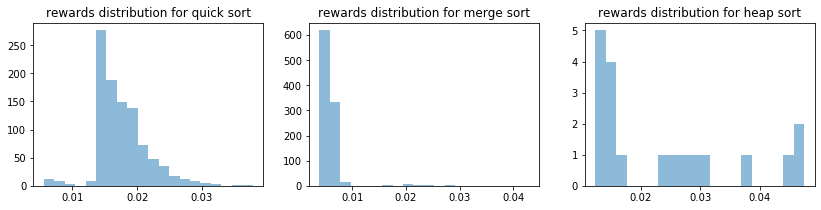

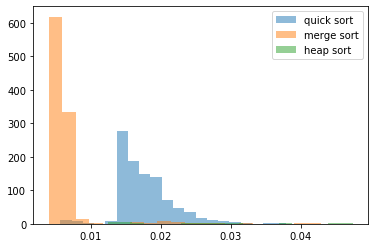

In [53]:
plot_rewards_distribution(arm_rewards_5)
plot_rewards_distribution_together(arm_rewards_5)

Restart at iteration: 504
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.019531178350089905, 'merge_sort': 0.027180973333694663, 'heap_sort': 0.041363439997076056}
Count per chosen algo {'quick_sort': 485, 'merge_sort': 15, 'heap_sort': 5}


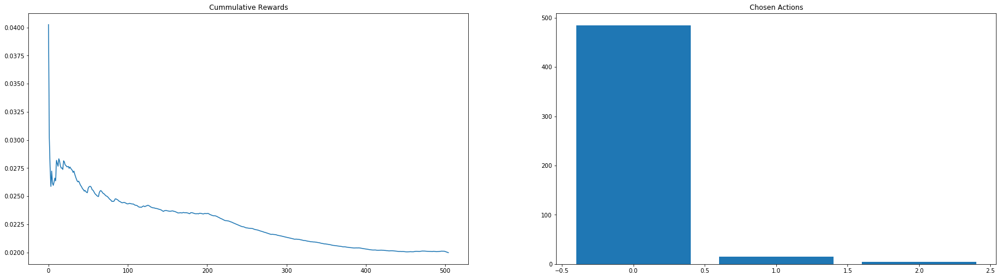

Restart at iteration: 1004
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.007967566661439681, 'merge_sort': 0.005834972392368904, 'heap_sort': 0.014553060004254803}
Count per chosen algo {'quick_sort': 6, 'merge_sort': 489, 'heap_sort': 5}


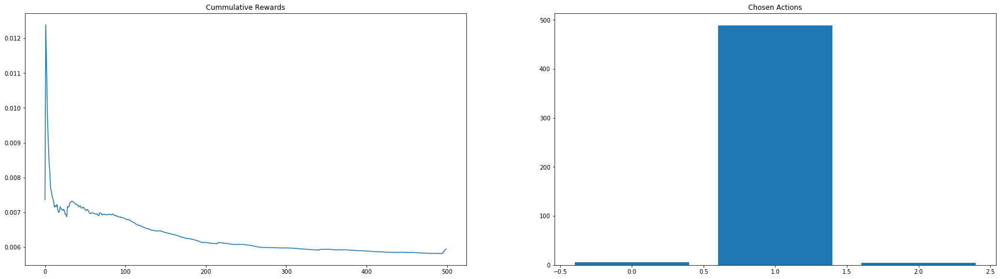

Restart at iteration: 1504
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.01604202408159427, 'merge_sort': 0.01920225000018642, 'heap_sort': 0.026024799997685477}
Count per chosen algo {'quick_sort': 490, 'merge_sort': 6, 'heap_sort': 4}


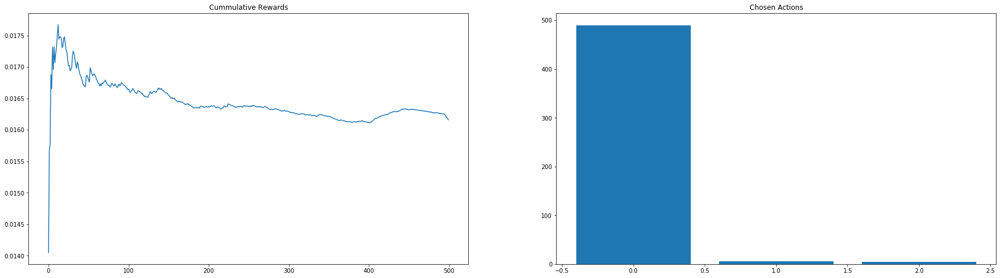

Restart at iteration: 1999
Results up to this iteration: 
Average rewards per algo {'quick_sort': 0.0072749625014694175, 'merge_sort': 0.005366709958456401, 'heap_sort': 0.014265379999415018}
Count per chosen algo {'quick_sort': 8, 'merge_sort': 482, 'heap_sort': 5}


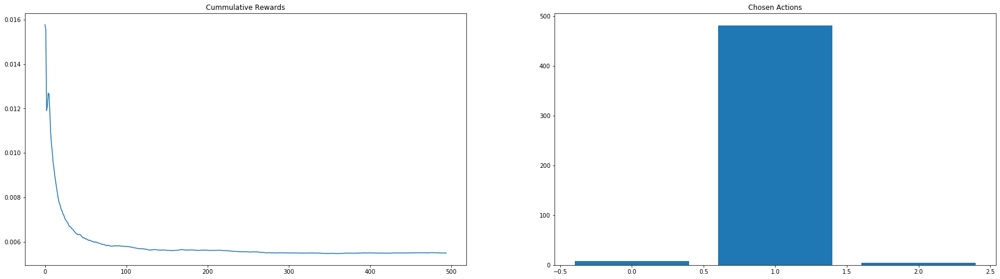

Total reward 23.8572


In [54]:
for elem in list_iteration_results_5:
    sample_mean, sample_count,rewards,cum_rewards,n = elem
    print("Restart at iteration:", n)
    print("Results up to this iteration: ")
    plot_history(rewards,cum_rewards, sample_count, sample_mean)
print("Total reward", np.round(total_reward_5,4))